<a href="https://colab.research.google.com/github/jamiroquai1225/Forecasting/blob/main/BSI%EC%A7%80%EC%88%98%EB%A5%BC_%ED%99%9C%EC%9A%A9%ED%95%9C_%EC%A0%9C%EC%A3%BC%ED%95%AD_%EB%AC%BC%EB%8F%99%EB%9F%89_%EC%98%88%EC%B8%A1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 초기 TEST

제주항 화물량 예측 시스템

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 7)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] 데이터 분할 중...
Train 데이터: 103개월 (2016-01-01 00:00:00 ~ 2024-07-01 00:00:00)
Test 데이터: 12개월 (2024-08-01 00:00:00 ~ 2025-07-01 00:00:00)

[3단계] SARIMA 모델 학습 중...
최적 SARIMA 파라미터 탐색 중... (약 1-2분 소요)
최적 파라미터: order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)
SARIMA 모델 완료!

[4단계] SARIMAX 모델 학습 중...
SARIMAX 모델 완료!

[5단계] Prophet 모델 학습 중...


17:04:58 - cmdstanpy - INFO - Chain [1] start processing
17:04:59 - cmdstanpy - INFO - Chain [1] done processing
17:04:59 - cmdstanpy - INFO - Chain [1] start processing
17:04:59 - cmdstanpy - INFO - Chain [1] done processing


Prophet 모델 완료!

[6단계] Prophet + 외생변수 모델 학습 중...
Prophet + 외생변수 모델 완료!

모델 성능 평가

1. SARIMA
--------------------------------------------------
MAE:  83,464.55 톤
RMSE: 100,484.92 톤
MAPE: 4.83%
R²:   0.5028

2. SARIMAX (BSI 포함)
--------------------------------------------------
MAE:  72,383.07 톤
RMSE: 98,409.93 톤
MAPE: 4.06%
R²:   0.5231

3. Prophet (기본)
--------------------------------------------------
MAE:  68,506.14 톤
RMSE: 86,172.34 톤
MAPE: 3.79%
R²:   0.6343

4. Prophet + BSI
--------------------------------------------------
MAE:  104,789.08 톤
RMSE: 126,645.96 톤
MAPE: 5.75%
R²:   0.2102

[7단계] 결과 시각화 중...
그래프 저장 완료: C:\Users\DAEJIN\Desktop/제주항_화물량_예측결과.png

[8단계] 결과 저장 중...
예측 결과 저장 완료: C:\Users\DAEJIN\Desktop/제주항_예측결과.xlsx
평가 지표 저장 완료: C:\Users\DAEJIN\Desktop/모델_평가지표.xlsx

[9단계] 미래 12개월 예측 중...
미래 예측 저장 완료: C:\Users\DAEJIN\Desktop/미래_12개월_예측.xlsx

모든 작업 완료!

생성된 파일:
1. C:\Users\DAEJIN\Desktop/제주항_화물량_예측결과.png
2. C:\Users\DAEJIN\Desktop/제주항_예측결과.xlsx
3. C:\Users\DAEJIN\Desktop/모델_평

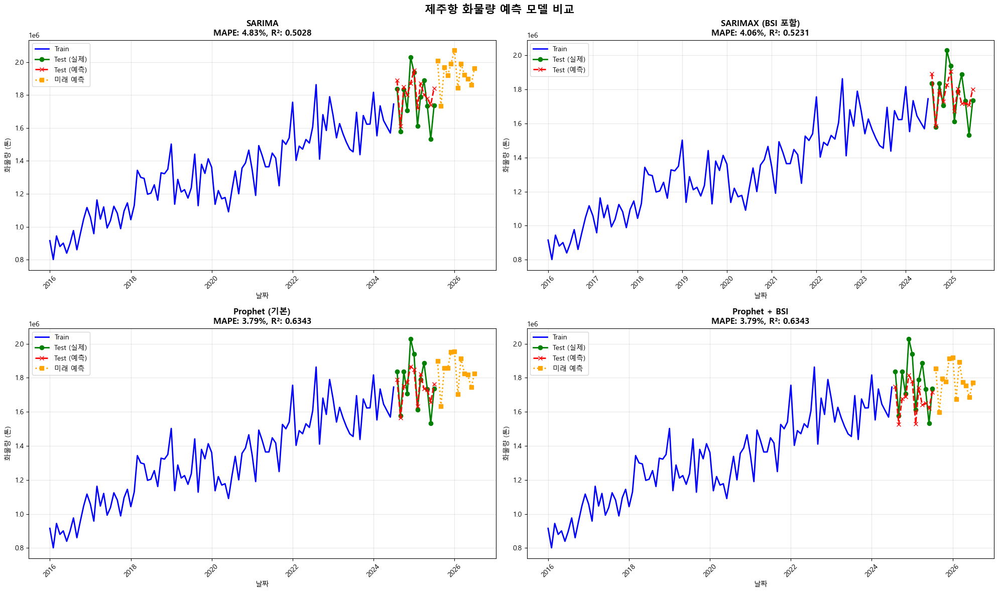

In [ ]:
"""
제주항 화물량 예측 모델
- SARIMA
- SARIMAX (BSI 외생변수 포함)
- Prophet (기본)
- Prophet (BSI 외생변수 포함)
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 화물량 예측 시스템")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로 (사용자 데스크탑)
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합 (port 데이터 기준)
df = port_df.merge(bsi_df[['date', '제조업 기업심리지수실적', '제조업 업황BSI', '제조업 매출BSI']],
                   on='date', how='left')

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df['date'].min()} ~ {df['date'].max()}")

# ========================================
# 2. Train/Test 분할
# ========================================
print("\n[2단계] 데이터 분할 중...")

# 마지막 12개월을 테스트 데이터로 사용
TEST_MONTHS = 12
FORECAST_MONTHS = 12  # 미래 예측 개월 수

train_df = df.iloc[:-TEST_MONTHS].copy()
test_df = df.iloc[-TEST_MONTHS:].copy()

print(f"Train 데이터: {len(train_df)}개월 ({train_df['date'].min()} ~ {train_df['date'].max()})")
print(f"Test 데이터: {len(test_df)}개월 ({test_df['date'].min()} ~ {test_df['date'].max()})")

# ========================================
# 3. 모델 1: SARIMA
# ========================================
print("\n[3단계] SARIMA 모델 학습 중...")

# SARIMA 파라미터 (월별 데이터이므로 계절성 주기 = 12)
# 자동으로 최적 파라미터 찾기 (시간이 오래 걸릴 수 있음)
print("최적 SARIMA 파라미터 탐색 중... (약 1-2분 소요)")

# 간단한 그리드 서치
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

for param in pdq[:5]:  # 시간 절약을 위해 일부만 테스트
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_df['화물량'],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

print(f"최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# 최적 파라미터로 모델 학습
sarima_model = SARIMAX(train_df['화물량'],
                       order=best_param if best_param else (1, 1, 1),
                       seasonal_order=best_seasonal_param if best_seasonal_param else (1, 1, 1, 12))
sarima_results = sarima_model.fit(disp=False)

# 예측
sarima_forecast = sarima_results.forecast(steps=TEST_MONTHS)
sarima_future = sarima_results.forecast(steps=TEST_MONTHS + FORECAST_MONTHS)

print("SARIMA 모델 완료!")

# ========================================
# 4. 모델 2: SARIMAX (외생변수 포함)
# ========================================
print("\n[4단계] SARIMAX 모델 학습 중...")

# 외생변수: BSI 지수들
exog_cols = ['제조업 기업심리지수실적', '제조업 업황BSI', '제조업 매출BSI']

# SARIMAX 모델
sarimax_model = SARIMAX(train_df['화물량'],
                        exog=train_df[exog_cols],
                        order=best_param if best_param else (1, 1, 1),
                        seasonal_order=best_seasonal_param if best_seasonal_param else (1, 1, 1, 12))
sarimax_results = sarimax_model.fit(disp=False)

# 예측 (외생변수 필요)
sarimax_forecast = sarimax_results.forecast(steps=TEST_MONTHS, exog=test_df[exog_cols])

print("SARIMAX 모델 완료!")

# ========================================
# 5. 모델 3: Prophet (기본)
# ========================================
print("\n[5단계] Prophet 모델 학습 중...")

# Prophet용 데이터 포맷
prophet_train = train_df[['date', '화물량']].copy()
prophet_train.columns = ['ds', 'y']

# Prophet 모델
prophet_model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode='multiplicative'
)
prophet_model.fit(prophet_train)

# 예측
future = prophet_model.make_future_dataframe(periods=TEST_MONTHS + FORECAST_MONTHS, freq='MS')
prophet_forecast_full = prophet_model.predict(future)

# 테스트 기간 예측값 추출
prophet_forecast = prophet_forecast_full.iloc[-TEST_MONTHS-FORECAST_MONTHS:-FORECAST_MONTHS]['yhat'].values

print("Prophet 모델 완료!")

# ========================================
# 6. 모델 4: Prophet (외생변수 포함)
# ========================================
print("\n[6단계] Prophet + 외생변수 모델 학습 중...")

# Prophet용 데이터 (외생변수 추가)
prophet_train_exog = train_df[['date', '화물량'] + exog_cols].copy()
prophet_train_exog.columns = ['ds', 'y'] + exog_cols

# Prophet 모델 (외생변수 추가)
prophet_exog_model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode='multiplicative'
)

# 외생변수를 regressor로 추가
for col in exog_cols:
    prophet_exog_model.add_regressor(col)

prophet_exog_model.fit(prophet_train_exog)

# 예측용 데이터프레임 생성
future_exog = prophet_model.make_future_dataframe(periods=TEST_MONTHS + FORECAST_MONTHS, freq='MS')

# 전체 데이터에서 외생변수 병합
full_df = pd.concat([train_df, test_df], ignore_index=True)
future_exog = future_exog.merge(full_df[['date'] + exog_cols], left_on='ds', right_on='date', how='left')

# 미래 외생변수는 마지막 값으로 채우기 (또는 별도 예측)
for col in exog_cols:
    future_exog[col].fillna(method='ffill', inplace=True)

prophet_exog_forecast_full = prophet_exog_model.predict(future_exog)
prophet_exog_forecast = prophet_exog_forecast_full.iloc[-TEST_MONTHS-FORECAST_MONTHS:-FORECAST_MONTHS]['yhat'].values

print("Prophet + 외생변수 모델 완료!")

# ========================================
# 7. 모델 평가
# ========================================
print("\n" + "=" * 80)
print("모델 성능 평가")
print("=" * 80)

actual = test_df['화물량'].values

def evaluate_model(name, predictions, actual):
    mae = mean_absolute_error(actual, predictions)
    rmse = np.sqrt(mean_squared_error(actual, predictions))
    mape = np.mean(np.abs((actual - predictions) / actual)) * 100
    r2 = r2_score(actual, predictions)

    print(f"\n{name}")
    print("-" * 50)
    print(f"MAE:  {mae:,.2f} 톤")
    print(f"RMSE: {rmse:,.2f} 톤")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²:   {r2:.4f}")

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

results = {}
results['SARIMA'] = evaluate_model("1. SARIMA", sarima_forecast.values, actual)
results['SARIMAX'] = evaluate_model("2. SARIMAX (BSI 포함)", sarimax_forecast.values, actual)
results['Prophet'] = evaluate_model("3. Prophet (기본)", prophet_forecast, actual)
results['Prophet+BSI'] = evaluate_model("4. Prophet + BSI", prophet_exog_forecast, actual)

# ========================================
# 8. 시각화
# ========================================
print("\n[7단계] 결과 시각화 중...")

fig, axes = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('제주항 화물량 예측 모델 비교', fontsize=16, fontweight='bold')

models = [
    ('SARIMA', sarima_forecast.values, sarima_future.values[-FORECAST_MONTHS:]),
    ('SARIMAX (BSI 포함)', sarimax_forecast.values, None),
    ('Prophet (기본)', prophet_forecast, prophet_forecast_full.iloc[-FORECAST_MONTHS:]['yhat'].values),
    ('Prophet + BSI', prophet_exog_forecast, prophet_exog_forecast_full.iloc[-FORECAST_MONTHS:]['yhat'].values)
]

for idx, (name, test_pred, future_pred) in enumerate(models):
    ax = axes[idx // 2, idx % 2]

    # Train 데이터
    ax.plot(train_df['date'], train_df['화물량'], label='Train', color='blue', linewidth=2)

    # Test 데이터 (실제값)
    ax.plot(test_df['date'], test_df['화물량'], label='Test (실제)', color='green', linewidth=2, marker='o')

    # Test 예측값
    ax.plot(test_df['date'], test_pred, label='Test (예측)', color='red', linewidth=2, linestyle='--', marker='x')

    # 미래 예측 (가능한 경우)
    if future_pred is not None:
        future_dates = pd.date_range(start=test_df['date'].iloc[-1] + pd.DateOffset(months=1),
                                     periods=FORECAST_MONTHS, freq='MS')
        ax.plot(future_dates, future_pred, label='미래 예측', color='orange', linewidth=2, linestyle=':', marker='s')

    ax.set_title(f'{name}\nMAPE: {results[name.split(" ")[0]]["MAPE"]:.2f}%, R²: {results[name.split(" ")[0]]["R2"]:.4f}',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('날짜', fontsize=10)
    ax.set_ylabel('화물량 (톤)', fontsize=10)
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_화물량_예측결과.png', dpi=300, bbox_inches='tight')
print(f"그래프 저장 완료: {DATA_PATH}/제주항_화물량_예측결과.png")

# ========================================
# 9. 결과 저장
# ========================================
print("\n[8단계] 결과 저장 중...")

# 예측 결과 데이터프레임
results_df = pd.DataFrame({
    '날짜': test_df['date'],
    '실제_화물량': test_df['화물량'].values,
    'SARIMA_예측': sarima_forecast.values,
    'SARIMAX_예측': sarimax_forecast.values,
    'Prophet_예측': prophet_forecast,
    'Prophet_BSI_예측': prophet_exog_forecast
})

# 오차 계산
for model in ['SARIMA', 'SARIMAX', 'Prophet', 'Prophet_BSI']:
    results_df[f'{model}_오차'] = results_df['실제_화물량'] - results_df[f'{model}_예측']
    results_df[f'{model}_오차율(%)'] = (results_df[f'{model}_오차'] / results_df['실제_화물량'] * 100).round(2)

results_df.to_excel(f'{DATA_PATH}/제주항_예측결과.xlsx', index=False)
print(f"예측 결과 저장 완료: {DATA_PATH}/제주항_예측결과.xlsx")

# 모델 평가 지표 저장
metrics_df = pd.DataFrame(results).T
metrics_df.to_excel(f'{DATA_PATH}/모델_평가지표.xlsx')
print(f"평가 지표 저장 완료: {DATA_PATH}/모델_평가지표.xlsx")

# ========================================
# 10. 미래 예측 (2025년 8월 ~ 2026년 7월)
# ========================================
print("\n[9단계] 미래 12개월 예측 중...")

future_dates = pd.date_range(start=test_df['date'].iloc[-1] + pd.DateOffset(months=1),
                             periods=FORECAST_MONTHS, freq='MS')

future_results_df = pd.DataFrame({
    '날짜': future_dates,
    'SARIMA_예측': sarima_future.values[-FORECAST_MONTHS:],
    'Prophet_예측': prophet_forecast_full.iloc[-FORECAST_MONTHS:]['yhat'].values,
    'Prophet_BSI_예측': prophet_exog_forecast_full.iloc[-FORECAST_MONTHS:]['yhat'].values
})

future_results_df.to_excel(f'{DATA_PATH}/미래_12개월_예측.xlsx', index=False)
print(f"미래 예측 저장 완료: {DATA_PATH}/미래_12개월_예측.xlsx")

print("\n" + "=" * 80)
print("모든 작업 완료!")
print("=" * 80)
print(f"\n생성된 파일:")
print(f"1. {DATA_PATH}/제주항_화물량_예측결과.png")
print(f"2. {DATA_PATH}/제주항_예측결과.xlsx")
print(f"3. {DATA_PATH}/모델_평가지표.xlsx")
print(f"4. {DATA_PATH}/미래_12개월_예측.xlsx")
print("\n" + "=" * 80)

# 최종 요약
print("\n📊 모델 성능 순위 (MAPE 기준)")
print("-" * 50)
sorted_models = sorted(results.items(), key=lambda x: x[1]['MAPE'])
for rank, (model, metrics) in enumerate(sorted_models, 1):
    print(f"{rank}. {model}: MAPE {metrics['MAPE']:.2f}%, R² {metrics['R2']:.4f}")

# BSI 조합별 비교

제주항 화물량 예측 시스템 - BSI 조합별 분석

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 7)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] BSI 조합 생성 중...
총 7가지 BSI 조합:
  1. 기업심리
  2. 업황
  3. 매출
  4. 기업심리+업황
  5. 기업심리+매출
  6. 업황+매출
  7. 기업심리+업황+매출

[3단계] 데이터 분할 중...
Train 데이터: 103개월 (2016-01-01 00:00:00 ~ 2024-07-01 00:00:00)
Test 데이터: 12개월 (2024-08-01 00:00:00 ~ 2025-07-01 00:00:00)

[4단계] 기준 모델 학습 중...
  - SARIMA (외생변수 없음)
  - Prophet (외생변수 없음)

최적 SARIMA 파라미터 탐색 중...


17:10:21 - cmdstanpy - INFO - Chain [1] start processing
17:10:21 - cmdstanpy - INFO - Chain [1] done processing


최적 파라미터: order=(0, 1, 1), seasonal_order=(0, 0, 1, 12)

기준 모델 성능:
SARIMA  - MAPE: 6.38%, R²: -0.0645
Prophet - MAPE: 3.79%, R²: 0.6343

[5단계] BSI 조합별 모델 학습 중...

진행 중: 1/7 - 기업심리


17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing
17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing


  SARIMAX - MAPE: 6.31%, R²: -0.0383
  Prophet - MAPE: 5.66%, R²: 0.2306

진행 중: 2/7 - 업황
  SARIMAX - MAPE: 7.17%, R²: -0.3101
  Prophet - MAPE: 5.24%, R²: 0.2855

진행 중: 3/7 - 매출


17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing
17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing


  SARIMAX - MAPE: 6.10%, R²: 0.0664
  Prophet - MAPE: 4.99%, R²: 0.3300

진행 중: 4/7 - 기업심리+업황


17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing


  SARIMAX - MAPE: 7.38%, R²: -0.2993
  Prophet - MAPE: 5.69%, R²: 0.2237

진행 중: 5/7 - 기업심리+매출
  SARIMAX - MAPE: 6.26%, R²: -0.0048
  Prophet - MAPE: 5.64%, R²: 0.2333

진행 중: 6/7 - 업황+매출


17:10:22 - cmdstanpy - INFO - Chain [1] start processing
17:10:22 - cmdstanpy - INFO - Chain [1] done processing
17:10:23 - cmdstanpy - INFO - Chain [1] start processing
17:10:23 - cmdstanpy - INFO - Chain [1] done processing


  SARIMAX - MAPE: 7.55%, R²: -0.3655
  Prophet - MAPE: 5.73%, R²: 0.1871

진행 중: 7/7 - 기업심리+업황+매출
  SARIMAX - MAPE: 7.55%, R²: -0.3457
  Prophet - MAPE: 5.75%, R²: 0.2102

[6단계] 결과 정리 중...

BSI 조합별 성능 비교 결과

📊 SARIMAX 모델 순위 (MAPE 기준)
--------------------------------------------------------------------------------
순위   BSI 조합               MAPE       R²         개선율       
--------------------------------------------------------------------------------
1    매출                       6.10%    0.0664     4.31%
2    기업심리+매출                  6.26%   -0.0048     1.80%
3    기업심리                     6.31%   -0.0383     1.09%
4    없음 (기준)                  6.38%   -0.0645     0.00%
5    업황                       7.17%   -0.3101   -12.47%
6    기업심리+업황                  7.38%   -0.2993   -15.65%
7    기업심리+업황+매출               7.55%   -0.3457   -18.43%
8    업황+매출                    7.55%   -0.3655   -18.47%

📊 Prophet 모델 순위 (MAPE 기준)
-----------------------------------------------------------------------

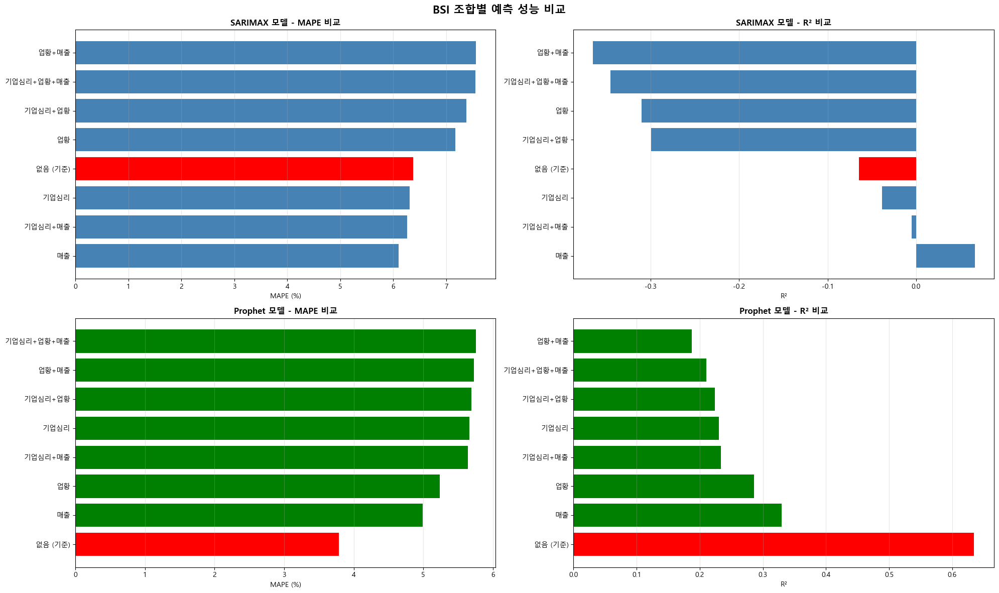

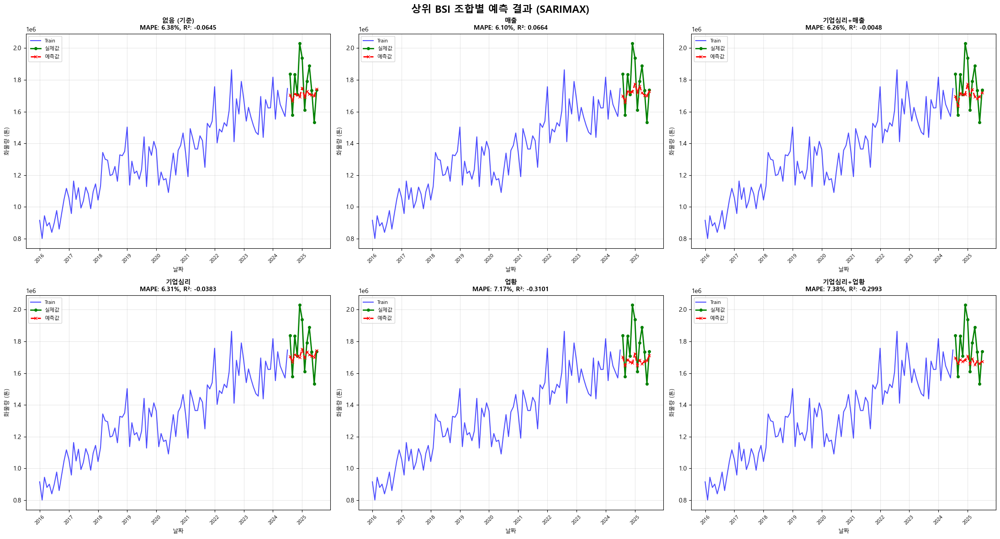

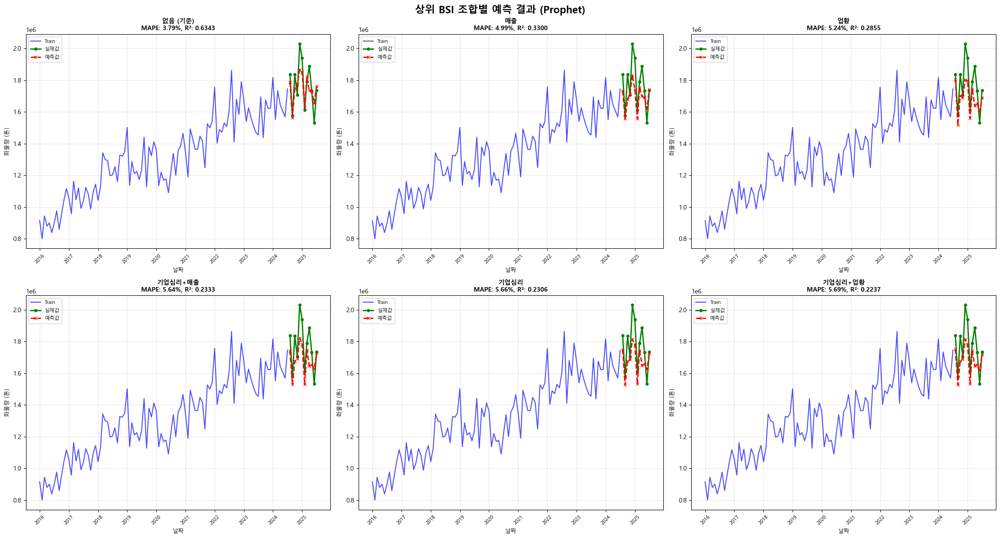

In [ ]:
"""
제주항 화물량 예측 모델 - BSI 조합별 분석
- SARIMA (외생변수 없음)
- SARIMAX (BSI 조합별)
- Prophet (외생변수 없음)
- Prophet (BSI 조합별)
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools
from datetime import datetime

print("=" * 80)
print("제주항 화물량 예측 시스템 - BSI 조합별 분석")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로 (사용자 데스크탑)
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합 (port 데이터 기준)
df = port_df.merge(bsi_df[['date', '제조업 기업심리지수실적', '제조업 업황BSI', '제조업 매출BSI']],
                   on='date', how='left')

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df['date'].min()} ~ {df['date'].max()}")

# ========================================
# 2. BSI 조합 생성
# ========================================
print("\n[2단계] BSI 조합 생성 중...")

# BSI 컬럼명
bsi_cols = ['제조업 기업심리지수실적', '제조업 업황BSI', '제조업 매출BSI']
bsi_short_names = ['기업심리', '업황', '매출']

# 모든 조합 생성
combinations = []

# 1개 조합
for i in range(len(bsi_cols)):
    combinations.append({
        'name': bsi_short_names[i],
        'cols': [bsi_cols[i]],
        'short': bsi_short_names[i]
    })

# 2개 조합
for i in range(len(bsi_cols)):
    for j in range(i+1, len(bsi_cols)):
        combinations.append({
            'name': f'{bsi_short_names[i]}+{bsi_short_names[j]}',
            'cols': [bsi_cols[i], bsi_cols[j]],
            'short': f'{bsi_short_names[i]}+{bsi_short_names[j]}'
        })

# 3개 조합
combinations.append({
    'name': '기업심리+업황+매출',
    'cols': bsi_cols,
    'short': '전체'
})

print(f"총 {len(combinations)}가지 BSI 조합:")
for idx, combo in enumerate(combinations, 1):
    print(f"  {idx}. {combo['name']}")

# ========================================
# 3. Train/Test 분할
# ========================================
print("\n[3단계] 데이터 분할 중...")

TEST_MONTHS = 12
FORECAST_MONTHS = 12

train_df = df.iloc[:-TEST_MONTHS].copy()
test_df = df.iloc[-TEST_MONTHS:].copy()

print(f"Train 데이터: {len(train_df)}개월 ({train_df['date'].min()} ~ {train_df['date'].max()})")
print(f"Test 데이터: {len(test_df)}개월 ({test_df['date'].min()} ~ {test_df['date'].max()})")

actual = test_df['화물량'].values

# ========================================
# 4. 평가 함수
# ========================================
def evaluate_model(predictions, actual):
    mae = mean_absolute_error(actual, predictions)
    rmse = np.sqrt(mean_squared_error(actual, predictions))
    mape = np.mean(np.abs((actual - predictions) / actual)) * 100
    r2 = r2_score(actual, predictions)

    return {
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'R2': r2
    }

# ========================================
# 5. 기준 모델 (외생변수 없음)
# ========================================
print("\n[4단계] 기준 모델 학습 중...")
print("  - SARIMA (외생변수 없음)")
print("  - Prophet (외생변수 없음)")

# SARIMA 최적 파라미터 찾기
print("\n최적 SARIMA 파라미터 탐색 중...")
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

for param in pdq:
    for seasonal_param in seasonal_pdq[:3]:
        try:
            model = SARIMAX(train_df['화물량'],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

print(f"최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# SARIMA 모델 학습
sarima_model = SARIMAX(train_df['화물량'],
                       order=best_param if best_param else (1, 1, 1),
                       seasonal_order=best_seasonal_param if best_seasonal_param else (1, 1, 1, 12))
sarima_results = sarima_model.fit(disp=False, maxiter=100)
sarima_forecast = sarima_results.forecast(steps=TEST_MONTHS)

# Prophet 모델 학습
prophet_train = train_df[['date', '화물량']].copy()
prophet_train.columns = ['ds', 'y']

prophet_model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode='multiplicative'
)
prophet_model.fit(prophet_train)

future = prophet_model.make_future_dataframe(periods=TEST_MONTHS, freq='MS')
prophet_forecast_df = prophet_model.predict(future)
prophet_forecast = prophet_forecast_df.iloc[-TEST_MONTHS:]['yhat'].values

# 기준 모델 평가
baseline_results = {
    'SARIMA': evaluate_model(sarima_forecast.values, actual),
    'Prophet': evaluate_model(prophet_forecast, actual)
}

print("\n기준 모델 성능:")
print(f"SARIMA  - MAPE: {baseline_results['SARIMA']['MAPE']:.2f}%, R²: {baseline_results['SARIMA']['R2']:.4f}")
print(f"Prophet - MAPE: {baseline_results['Prophet']['MAPE']:.2f}%, R²: {baseline_results['Prophet']['R2']:.4f}")

# ========================================
# 6. BSI 조합별 모델 학습
# ========================================
print("\n[5단계] BSI 조합별 모델 학습 중...")

all_results = []
forecast_data = {
    'date': test_df['date'],
    'actual': actual
}

for idx, combo in enumerate(combinations, 1):
    print(f"\n진행 중: {idx}/{len(combinations)} - {combo['name']}")

    exog_cols = combo['cols']
    combo_name = combo['short']

    # SARIMAX 모델
    try:
        sarimax_model = SARIMAX(
            train_df['화물량'],
            exog=train_df[exog_cols],
            order=best_param if best_param else (1, 1, 1),
            seasonal_order=best_seasonal_param if best_seasonal_param else (1, 1, 1, 12)
        )
        sarimax_results = sarimax_model.fit(disp=False, maxiter=100)
        sarimax_forecast = sarimax_results.forecast(steps=TEST_MONTHS, exog=test_df[exog_cols])
        sarimax_metrics = evaluate_model(sarimax_forecast.values, actual)

        # 예측값 저장
        forecast_data[f'SARIMAX_{combo_name}'] = sarimax_forecast.values

    except Exception as e:
        print(f"  SARIMAX 실패: {str(e)}")
        sarimax_metrics = {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan}
        forecast_data[f'SARIMAX_{combo_name}'] = [np.nan] * TEST_MONTHS

    # Prophet 모델 (외생변수 포함)
    try:
        prophet_train_exog = train_df[['date', '화물량'] + exog_cols].copy()
        prophet_train_exog.columns = ['ds', 'y'] + exog_cols

        prophet_exog_model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False,
            seasonality_mode='multiplicative'
        )

        for col in exog_cols:
            prophet_exog_model.add_regressor(col)

        prophet_exog_model.fit(prophet_train_exog)

        # 예측용 데이터프레임
        future_exog = prophet_model.make_future_dataframe(periods=TEST_MONTHS, freq='MS')
        full_df = pd.concat([train_df, test_df], ignore_index=True)
        future_exog = future_exog.merge(full_df[['date'] + exog_cols],
                                       left_on='ds', right_on='date', how='left')

        for col in exog_cols:
            future_exog[col].fillna(method='ffill', inplace=True)

        prophet_exog_forecast_df = prophet_exog_model.predict(future_exog)
        prophet_exog_forecast = prophet_exog_forecast_df.iloc[-TEST_MONTHS:]['yhat'].values
        prophet_exog_metrics = evaluate_model(prophet_exog_forecast, actual)

        # 예측값 저장
        forecast_data[f'Prophet_{combo_name}'] = prophet_exog_forecast

    except Exception as e:
        print(f"  Prophet 실패: {str(e)}")
        prophet_exog_metrics = {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan}
        forecast_data[f'Prophet_{combo_name}'] = [np.nan] * TEST_MONTHS

    # 결과 저장
    all_results.append({
        'BSI_조합': combo['name'],
        'BSI_개수': len(exog_cols),
        'SARIMAX_MAE': sarimax_metrics['MAE'],
        'SARIMAX_RMSE': sarimax_metrics['RMSE'],
        'SARIMAX_MAPE': sarimax_metrics['MAPE'],
        'SARIMAX_R2': sarimax_metrics['R2'],
        'Prophet_MAE': prophet_exog_metrics['MAE'],
        'Prophet_RMSE': prophet_exog_metrics['RMSE'],
        'Prophet_MAPE': prophet_exog_metrics['MAPE'],
        'Prophet_R2': prophet_exog_metrics['R2']
    })

    print(f"  SARIMAX - MAPE: {sarimax_metrics['MAPE']:.2f}%, R²: {sarimax_metrics['R2']:.4f}")
    print(f"  Prophet - MAPE: {prophet_exog_metrics['MAPE']:.2f}%, R²: {prophet_exog_metrics['R2']:.4f}")

# ========================================
# 7. 결과 정리
# ========================================
print("\n[6단계] 결과 정리 중...")

# 기준 모델 추가
baseline_row = {
    'BSI_조합': '없음 (기준)',
    'BSI_개수': 0,
    'SARIMAX_MAE': baseline_results['SARIMA']['MAE'],
    'SARIMAX_RMSE': baseline_results['SARIMA']['RMSE'],
    'SARIMAX_MAPE': baseline_results['SARIMA']['MAPE'],
    'SARIMAX_R2': baseline_results['SARIMA']['R2'],
    'Prophet_MAE': baseline_results['Prophet']['MAE'],
    'Prophet_RMSE': baseline_results['Prophet']['RMSE'],
    'Prophet_MAPE': baseline_results['Prophet']['MAPE'],
    'Prophet_R2': baseline_results['Prophet']['R2']
}

all_results.insert(0, baseline_row)

# 데이터프레임 생성
results_df = pd.DataFrame(all_results)

# 기준 모델 대비 개선율 계산
baseline_sarimax_mape = baseline_results['SARIMA']['MAPE']
baseline_prophet_mape = baseline_results['Prophet']['MAPE']

results_df['SARIMAX_개선율(%)'] = ((baseline_sarimax_mape - results_df['SARIMAX_MAPE']) / baseline_sarimax_mape * 100).round(2)
results_df['Prophet_개선율(%)'] = ((baseline_prophet_mape - results_df['Prophet_MAPE']) / baseline_prophet_mape * 100).round(2)

# 정렬
results_df_sarimax = results_df.sort_values('SARIMAX_MAPE').reset_index(drop=True)
results_df_prophet = results_df.sort_values('Prophet_MAPE').reset_index(drop=True)

# ========================================
# 8. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("BSI 조합별 성능 비교 결과")
print("=" * 80)

print("\n📊 SARIMAX 모델 순위 (MAPE 기준)")
print("-" * 80)
print(f"{'순위':<4} {'BSI 조합':<20} {'MAPE':<10} {'R²':<10} {'개선율':<10}")
print("-" * 80)
for idx, row in results_df_sarimax.head(10).iterrows():
    print(f"{idx+1:<4} {row['BSI_조합']:<20} {row['SARIMAX_MAPE']:>8.2f}% {row['SARIMAX_R2']:>9.4f} {row['SARIMAX_개선율(%)']:>8.2f}%")

print("\n📊 Prophet 모델 순위 (MAPE 기준)")
print("-" * 80)
print(f"{'순위':<4} {'BSI 조합':<20} {'MAPE':<10} {'R²':<10} {'개선율':<10}")
print("-" * 80)
for idx, row in results_df_prophet.head(10).iterrows():
    print(f"{idx+1:<4} {row['BSI_조합']:<20} {row['Prophet_MAPE']:>8.2f}% {row['Prophet_R2']:>9.4f} {row['Prophet_개선율(%)']:>8.2f}%")

# ========================================
# 9. 시각화
# ========================================
print("\n[7단계] 결과 시각화 중...")

# 1. 조합별 성능 비교 그래프
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('BSI 조합별 예측 성능 비교', fontsize=16, fontweight='bold')

# SARIMAX MAPE
ax1 = axes[0, 0]
data_sarimax = results_df.sort_values('SARIMAX_MAPE')
colors = ['red' if x == 0 else 'steelblue' for x in data_sarimax['BSI_개수']]
ax1.barh(data_sarimax['BSI_조합'], data_sarimax['SARIMAX_MAPE'], color=colors)
ax1.set_xlabel('MAPE (%)', fontsize=10)
ax1.set_title('SARIMAX 모델 - MAPE 비교', fontsize=12, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# SARIMAX R²
ax2 = axes[0, 1]
data_sarimax_r2 = results_df.sort_values('SARIMAX_R2', ascending=False)
colors_r2 = ['red' if x == 0 else 'steelblue' for x in data_sarimax_r2['BSI_개수']]
ax2.barh(data_sarimax_r2['BSI_조합'], data_sarimax_r2['SARIMAX_R2'], color=colors_r2)
ax2.set_xlabel('R²', fontsize=10)
ax2.set_title('SARIMAX 모델 - R² 비교', fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# Prophet MAPE
ax3 = axes[1, 0]
data_prophet = results_df.sort_values('Prophet_MAPE')
colors_p = ['red' if x == 0 else 'green' for x in data_prophet['BSI_개수']]
ax3.barh(data_prophet['BSI_조합'], data_prophet['Prophet_MAPE'], color=colors_p)
ax3.set_xlabel('MAPE (%)', fontsize=10)
ax3.set_title('Prophet 모델 - MAPE 비교', fontsize=12, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)

# Prophet R²
ax4 = axes[1, 1]
data_prophet_r2 = results_df.sort_values('Prophet_R2', ascending=False)
colors_pr2 = ['red' if x == 0 else 'green' for x in data_prophet_r2['BSI_개수']]
ax4.barh(data_prophet_r2['BSI_조합'], data_prophet_r2['Prophet_R2'], color=colors_pr2)
ax4.set_xlabel('R²', fontsize=10)
ax4.set_title('Prophet 모델 - R² 비교', fontsize=12, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/BSI조합별_성능비교.png', dpi=300, bbox_inches='tight')
print(f"그래프 저장 완료: {DATA_PATH}/BSI조합별_성능비교.png")

# 2. 상위 5개 조합 예측 결과 비교
fig2, axes2 = plt.subplots(2, 3, figsize=(22, 12))
fig2.suptitle('상위 BSI 조합별 예측 결과 (SARIMAX)', fontsize=16, fontweight='bold')

# 기준 모델 + 상위 5개 조합
top_combinations = ['없음 (기준)'] + results_df_sarimax[results_df_sarimax['BSI_조합'] != '없음 (기준)'].head(5)['BSI_조합'].tolist()

for idx, combo_name in enumerate(top_combinations):
    if idx >= 6:
        break

    ax = axes2[idx // 3, idx % 3]

    # Train 데이터
    ax.plot(train_df['date'], train_df['화물량'], label='Train', color='blue', linewidth=1.5, alpha=0.7)

    # Test 실제값
    ax.plot(test_df['date'], actual, label='실제값', color='green', linewidth=2, marker='o', markersize=4)

    # 예측값
    if combo_name == '없음 (기준)':
        pred = sarima_forecast.values
        mape = baseline_results['SARIMA']['MAPE']
        r2 = baseline_results['SARIMA']['R2']
    else:
        # 컬럼명 찾기
        short_name = results_df[results_df['BSI_조합'] == combo_name]['BSI_조합'].values[0]
        for combo in combinations:
            if combo['name'] == combo_name:
                col_name = f"SARIMAX_{combo['short']}"
                break
        pred = forecast_data.get(col_name, [np.nan] * TEST_MONTHS)
        mape = results_df[results_df['BSI_조합'] == combo_name]['SARIMAX_MAPE'].values[0]
        r2 = results_df[results_df['BSI_조합'] == combo_name]['SARIMAX_R2'].values[0]

    ax.plot(test_df['date'], pred, label='예측값', color='red', linewidth=2, linestyle='--', marker='x', markersize=4)

    ax.set_title(f'{combo_name}\nMAPE: {mape:.2f}%, R²: {r2:.4f}', fontsize=10, fontweight='bold')
    ax.set_xlabel('날짜', fontsize=9)
    ax.set_ylabel('화물량 (톤)', fontsize=9)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='x', rotation=45, labelsize=8)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/상위조합_예측결과_SARIMAX.png', dpi=300, bbox_inches='tight')
print(f"그래프 저장 완료: {DATA_PATH}/상위조합_예측결과_SARIMAX.png")

# 3. Prophet 상위 조합
fig3, axes3 = plt.subplots(2, 3, figsize=(22, 12))
fig3.suptitle('상위 BSI 조합별 예측 결과 (Prophet)', fontsize=16, fontweight='bold')

top_combinations_prophet = ['없음 (기준)'] + results_df_prophet[results_df_prophet['BSI_조합'] != '없음 (기준)'].head(5)['BSI_조합'].tolist()

for idx, combo_name in enumerate(top_combinations_prophet):
    if idx >= 6:
        break

    ax = axes3[idx // 3, idx % 3]

    # Train 데이터
    ax.plot(train_df['date'], train_df['화물량'], label='Train', color='blue', linewidth=1.5, alpha=0.7)

    # Test 실제값
    ax.plot(test_df['date'], actual, label='실제값', color='green', linewidth=2, marker='o', markersize=4)

    # 예측값
    if combo_name == '없음 (기준)':
        pred = prophet_forecast
        mape = baseline_results['Prophet']['MAPE']
        r2 = baseline_results['Prophet']['R2']
    else:
        for combo in combinations:
            if combo['name'] == combo_name:
                col_name = f"Prophet_{combo['short']}"
                break
        pred = forecast_data.get(col_name, [np.nan] * TEST_MONTHS)
        mape = results_df[results_df['BSI_조합'] == combo_name]['Prophet_MAPE'].values[0]
        r2 = results_df[results_df['BSI_조합'] == combo_name]['Prophet_R2'].values[0]

    ax.plot(test_df['date'], pred, label='예측값', color='red', linewidth=2, linestyle='--', marker='x', markersize=4)

    ax.set_title(f'{combo_name}\nMAPE: {mape:.2f}%, R²: {r2:.4f}', fontsize=10, fontweight='bold')
    ax.set_xlabel('날짜', fontsize=9)
    ax.set_ylabel('화물량 (톤)', fontsize=9)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='x', rotation=45, labelsize=8)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/상위조합_예측결과_Prophet.png', dpi=300, bbox_inches='tight')
print(f"그래프 저장 완료: {DATA_PATH}/상위조합_예측결과_Prophet.png")

# ========================================
# 10. 결과 저장
# ========================================
print("\n[8단계] 결과 저장 중...")

# 1. 전체 결과
results_df.to_excel(f'{DATA_PATH}/BSI조합별_전체결과.xlsx', index=False)
print(f"전체 결과 저장: {DATA_PATH}/BSI조합별_전체결과.xlsx")

# 2. 예측값 상세
forecast_df = pd.DataFrame(forecast_data)
forecast_df.to_excel(f'{DATA_PATH}/BSI조합별_예측값.xlsx', index=False)
print(f"예측값 저장: {DATA_PATH}/BSI조합별_예측값.xlsx")

# 3. 요약 리포트
with pd.ExcelWriter(f'{DATA_PATH}/BSI조합_분석리포트.xlsx', engine='openpyxl') as writer:
    # 시트 1: 전체 결과
    results_df.to_excel(writer, sheet_name='전체결과', index=False)

    # 시트 2: SARIMAX 순위
    results_df_sarimax.to_excel(writer, sheet_name='SARIMAX_순위', index=False)

    # 시트 3: Prophet 순위
    results_df_prophet.to_excel(writer, sheet_name='Prophet_순위', index=False)

    # 시트 4: 예측값
    forecast_df.to_excel(writer, sheet_name='예측값', index=False)

print(f"분석 리포트 저장: {DATA_PATH}/BSI조합_분석리포트.xlsx")

# ========================================
# 11. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/BSI조합별_성능비교.png")
print(f"2. {DATA_PATH}/상위조합_예측결과_SARIMAX.png")
print(f"3. {DATA_PATH}/상위조합_예측결과_Prophet.png")
print(f"4. {DATA_PATH}/BSI조합별_전체결과.xlsx")
print(f"5. {DATA_PATH}/BSI조합별_예측값.xlsx")
print(f"6. {DATA_PATH}/BSI조합_분석리포트.xlsx")

print("\n🏆 최고 성능 조합:")
print("-" * 80)
best_sarimax = results_df_sarimax.iloc[0]
best_prophet = results_df_prophet.iloc[0]

print(f"\nSARIMAX:")
print(f"  조합: {best_sarimax['BSI_조합']}")
print(f"  MAPE: {best_sarimax['SARIMAX_MAPE']:.2f}%")
print(f"  R²: {best_sarimax['SARIMAX_R2']:.4f}")
print(f"  개선율: {best_sarimax['SARIMAX_개선율(%)']:.2f}%")

print(f"\nProphet:")
print(f"  조합: {best_prophet['BSI_조합']}")
print(f"  MAPE: {best_prophet['Prophet_MAPE']:.2f}%")
print(f"  R²: {best_prophet['Prophet_R2']:.4f}")
print(f"  개선율: {best_prophet['Prophet_개선율(%)']:.2f}%")

print("\n" + "=" * 80)
print("💡 결론:")
print("-" * 80)

# BSI 포함 여부 효과 분석
bsi_models = results_df[results_df['BSI_조합'] != '없음 (기준)']
avg_sarimax_improvement = bsi_models['SARIMAX_개선율(%)'].mean()
avg_prophet_improvement = bsi_models['Prophet_개선율(%)'].mean()

if avg_sarimax_improvement > 0:
    print(f"✓ SARIMAX: BSI 변수 사용 시 평균 {avg_sarimax_improvement:.2f}% 성능 개선")
else:
    print(f"✗ SARIMAX: BSI 변수 사용 시 평균 {abs(avg_sarimax_improvement):.2f}% 성능 저하")

if avg_prophet_improvement > 0:
    print(f"✓ Prophet: BSI 변수 사용 시 평균 {avg_prophet_improvement:.2f}% 성능 개선")
else:
    print(f"✗ Prophet: BSI 변수 사용 시 평균 {abs(avg_prophet_improvement):.2f}% 성능 저하")

# 최적 변수 개수 분석
best_count_sarimax = results_df_sarimax.iloc[0]['BSI_개수']
best_count_prophet = results_df_prophet.iloc[0]['BSI_개수']

print(f"\n✓ SARIMAX 최적 BSI 변수 개수: {int(best_count_sarimax)}개")
print(f"✓ Prophet 최적 BSI 변수 개수: {int(best_count_prophet)}개")

print("\n" + "=" * 80)

# 업황만 비교

제주항 화물량 예측 시스템 - 제조업 업황BSI

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 5)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00
사용 외생변수: 제조업 업황BSI

결측치 확인:
year         0
month        0
화물량          0
date         0
제조업 업황BSI    0
dtype: int64

[2단계] 데이터 분할 중...
Train 데이터: 103개월 (2016-01-01 00:00:00 ~ 2024-07-01 00:00:00)
Test 데이터: 12개월 (2024-08-01 00:00:00 ~ 2025-07-01 00:00:00)

[3단계] SARIMA 모델 학습 중...
최적 파라미터 탐색 중... (약 1분 소요)
최적 파라미터: order=(0, 1, 1), seasonal_order=(0, 1, 1, 12)
✓ SARIMA 모델 완료!

[4단계] SARIMAX 모델 학습 중...
✓ SARIMAX 모델 완료!

[5단계] Prophet 모델 학습 중...


17:14:11 - cmdstanpy - INFO - Chain [1] start processing
17:14:11 - cmdstanpy - INFO - Chain [1] done processing
17:14:11 - cmdstanpy - INFO - Chain [1] start processing
17:14:11 - cmdstanpy - INFO - Chain [1] done processing


✓ Prophet 모델 완료!

[6단계] Prophet + 업황BSI 모델 학습 중...
✓ Prophet + 업황BSI 모델 완료!

모델 성능 평가 (테스트 데이터)

1. SARIMA (외생변수 없음)
--------------------------------------------------
MAE:  83,465 톤
RMSE: 100,485 톤
MAPE: 4.83%
R²:   0.5028

2. SARIMAX (업황BSI 포함)
--------------------------------------------------
MAE:  72,295 톤
RMSE: 96,968 톤
MAPE: 4.06%
R²:   0.5370

3. Prophet (외생변수 없음)
--------------------------------------------------
MAE:  68,506 톤
RMSE: 86,172 톤
MAPE: 3.79%
R²:   0.6343

4. Prophet (업황BSI 포함)
--------------------------------------------------
MAE:  95,829 톤
RMSE: 120,453 톤
MAPE: 5.24%
R²:   0.2855

[7단계] 결과 시각화 중...
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/제주항_화물량_예측결과_업황BSI.png
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/모델_성능_비교_업황BSI.png

[8단계] 결과 저장 중...
✓ 테스트 결과 저장: C:\Users\DAEJIN\Desktop/테스트_예측결과_업황BSI.xlsx
✓ 미래 예측 저장: C:\Users\DAEJIN\Desktop/미래_12개월_예측_업황BSI.xlsx
✓ 평가 지표 저장: C:\Users\DAEJIN\Desktop/모델_평가지표_업황BSI.xlsx
✓ 종합 리포트 저장: C:\Users\DAEJIN\Desktop/제주항_예측_종합리포트_업황BSI.xlsx

분석 완료!

📁 

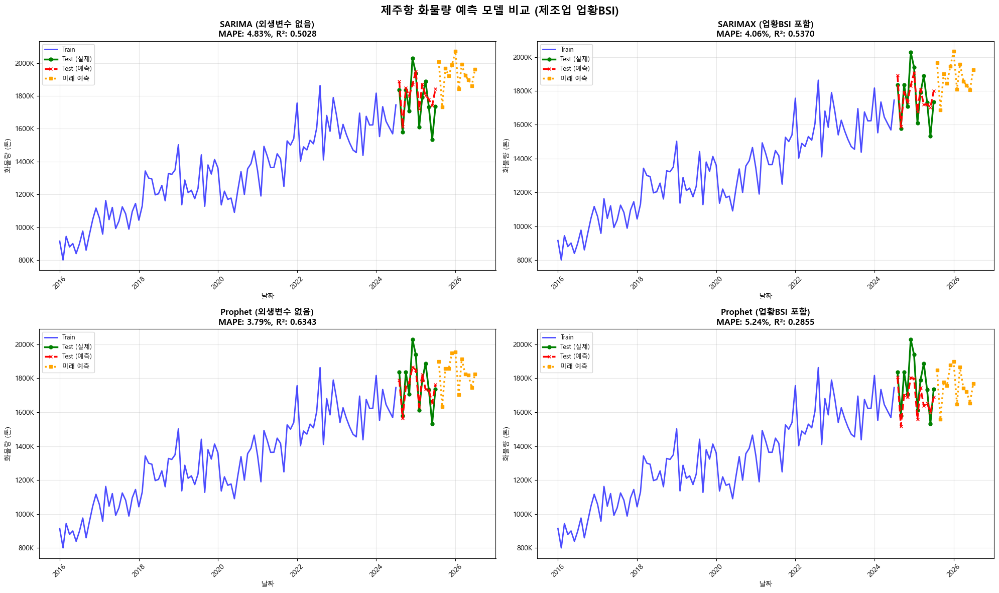

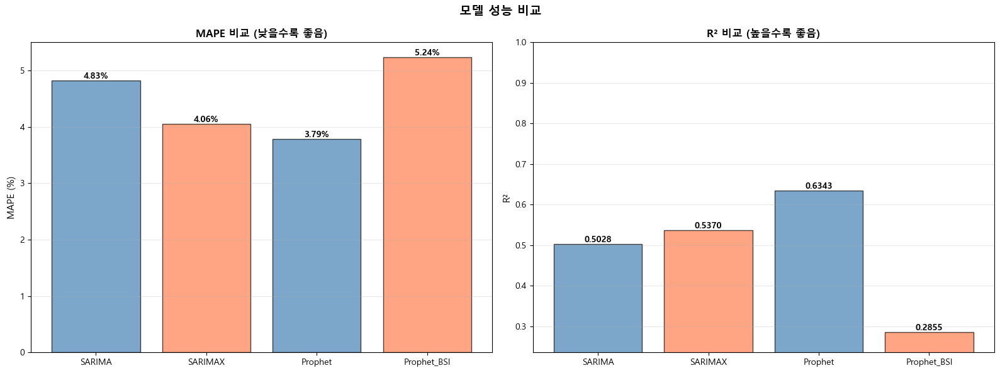

In [ ]:
"""
제주항 화물량 예측 모델 - 제조업 업황BSI 사용
- SARIMA (외생변수 없음)
- SARIMAX (업황BSI 포함)
- Prophet (외생변수 없음)
- Prophet (업황BSI 포함)
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 화물량 예측 시스템 - 제조업 업황BSI")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로 (사용자 데스크탑)
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합 (제조업 업황BSI만 사용)
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df['date'].min()} ~ {df['date'].max()}")
print(f"사용 외생변수: 제조업 업황BSI")

# 결측치 확인
print(f"\n결측치 확인:")
print(df.isnull().sum())

# ========================================
# 2. Train/Test 분할
# ========================================
print("\n[2단계] 데이터 분할 중...")

TEST_MONTHS = 12
FORECAST_MONTHS = 12

train_df = df.iloc[:-TEST_MONTHS].copy()
test_df = df.iloc[-TEST_MONTHS:].copy()

print(f"Train 데이터: {len(train_df)}개월 ({train_df['date'].min()} ~ {train_df['date'].max()})")
print(f"Test 데이터: {len(test_df)}개월 ({test_df['date'].min()} ~ {test_df['date'].max()})")

actual = test_df['화물량'].values

# ========================================
# 3. 평가 함수
# ========================================
def evaluate_model(name, predictions, actual):
    mae = mean_absolute_error(actual, predictions)
    rmse = np.sqrt(mean_squared_error(actual, predictions))
    mape = np.mean(np.abs((actual - predictions) / actual)) * 100
    r2 = r2_score(actual, predictions)

    print(f"\n{name}")
    print("-" * 50)
    print(f"MAE:  {mae:,.0f} 톤")
    print(f"RMSE: {rmse:,.0f} 톤")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²:   {r2:.4f}")

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 4. 모델 1: SARIMA (외생변수 없음)
# ========================================
print("\n[3단계] SARIMA 모델 학습 중...")
print("최적 파라미터 탐색 중... (약 1분 소요)")

# 최적 파라미터 찾기
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:  # 시간 절약
        try:
            model = SARIMAX(train_df['화물량'],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, 1, 1)
    best_seasonal_param = (1, 1, 1, 12)

print(f"최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# SARIMA 모델 학습
sarima_model = SARIMAX(train_df['화물량'],
                       order=best_param,
                       seasonal_order=best_seasonal_param)
sarima_results = sarima_model.fit(disp=False, maxiter=100)

# 예측
sarima_forecast_test = sarima_results.forecast(steps=TEST_MONTHS)
sarima_forecast_future = sarima_results.forecast(steps=TEST_MONTHS + FORECAST_MONTHS)

print("✓ SARIMA 모델 완료!")

# ========================================
# 5. 모델 2: SARIMAX (업황BSI 포함)
# ========================================
print("\n[4단계] SARIMAX 모델 학습 중...")

# SARIMAX 모델 (업황BSI 외생변수 포함)
sarimax_model = SARIMAX(train_df['화물량'],
                        exog=train_df[['제조업 업황BSI']],
                        order=best_param,
                        seasonal_order=best_seasonal_param)
sarimax_results = sarimax_model.fit(disp=False, maxiter=100)

# 예측 (테스트 기간)
sarimax_forecast_test = sarimax_results.forecast(steps=TEST_MONTHS,
                                                  exog=test_df[['제조업 업황BSI']])

# 미래 예측을 위한 업황BSI 준비 (마지막 값으로 연장)
last_bsi = test_df['제조업 업황BSI'].iloc[-1]
future_bsi = pd.DataFrame({'제조업 업황BSI': [last_bsi] * FORECAST_MONTHS})
future_bsi_combined = pd.concat([test_df[['제조업 업황BSI']], future_bsi], ignore_index=True)

sarimax_forecast_future = sarimax_results.forecast(steps=TEST_MONTHS + FORECAST_MONTHS,
                                                    exog=future_bsi_combined)

print("✓ SARIMAX 모델 완료!")

# ========================================
# 6. 모델 3: Prophet (외생변수 없음)
# ========================================
print("\n[5단계] Prophet 모델 학습 중...")

# Prophet용 데이터 포맷
prophet_train = train_df[['date', '화물량']].copy()
prophet_train.columns = ['ds', 'y']

# Prophet 모델
prophet_model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.05
)
prophet_model.fit(prophet_train)

# 예측
future = prophet_model.make_future_dataframe(periods=TEST_MONTHS + FORECAST_MONTHS, freq='MS')
prophet_forecast_full = prophet_model.predict(future)

# 테스트 기간 예측값
prophet_forecast_test = prophet_forecast_full.iloc[-TEST_MONTHS-FORECAST_MONTHS:-FORECAST_MONTHS]['yhat'].values

# 미래 예측값
prophet_forecast_future = prophet_forecast_full.iloc[-FORECAST_MONTHS:]['yhat'].values

print("✓ Prophet 모델 완료!")

# ========================================
# 7. 모델 4: Prophet (업황BSI 포함)
# ========================================
print("\n[6단계] Prophet + 업황BSI 모델 학습 중...")

# Prophet용 데이터 (업황BSI 추가)
prophet_train_bsi = train_df[['date', '화물량', '제조업 업황BSI']].copy()
prophet_train_bsi.columns = ['ds', 'y', '제조업 업황BSI']

# Prophet 모델 (업황BSI regressor 추가)
prophet_bsi_model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.05
)
prophet_bsi_model.add_regressor('제조업 업황BSI')
prophet_bsi_model.fit(prophet_train_bsi)

# 예측용 데이터프레임
future_bsi_df = prophet_model.make_future_dataframe(periods=TEST_MONTHS + FORECAST_MONTHS, freq='MS')

# 전체 데이터 준비 (train + test + 미래)
full_df = pd.concat([train_df, test_df], ignore_index=True)

# 미래 날짜 생성
future_dates = pd.date_range(start=test_df['date'].iloc[-1] + pd.DateOffset(months=1),
                             periods=FORECAST_MONTHS, freq='MS')
future_data = pd.DataFrame({
    'date': future_dates,
    '제조업 업황BSI': [last_bsi] * FORECAST_MONTHS
})

# 전체 데이터 결합
full_df_with_future = pd.concat([full_df[['date', '제조업 업황BSI']], future_data], ignore_index=True)

# Prophet 예측용 데이터와 병합
future_bsi_df = future_bsi_df.merge(full_df_with_future, left_on='ds', right_on='date', how='left')
future_bsi_df['제조업 업황BSI'].fillna(method='ffill', inplace=True)

# 예측
prophet_bsi_forecast_full = prophet_bsi_model.predict(future_bsi_df)

# 테스트 기간 예측값
prophet_bsi_forecast_test = prophet_bsi_forecast_full.iloc[-TEST_MONTHS-FORECAST_MONTHS:-FORECAST_MONTHS]['yhat'].values

# 미래 예측값
prophet_bsi_forecast_future = prophet_bsi_forecast_full.iloc[-FORECAST_MONTHS:]['yhat'].values

print("✓ Prophet + 업황BSI 모델 완료!")

# ========================================
# 8. 모델 평가
# ========================================
print("\n" + "=" * 80)
print("모델 성능 평가 (테스트 데이터)")
print("=" * 80)

results = {}
results['SARIMA'] = evaluate_model("1. SARIMA (외생변수 없음)", sarima_forecast_test.values, actual)
results['SARIMAX'] = evaluate_model("2. SARIMAX (업황BSI 포함)", sarimax_forecast_test.values, actual)
results['Prophet'] = evaluate_model("3. Prophet (외생변수 없음)", prophet_forecast_test, actual)
results['Prophet_BSI'] = evaluate_model("4. Prophet (업황BSI 포함)", prophet_bsi_forecast_test, actual)

# ========================================
# 9. 시각화
# ========================================
print("\n[7단계] 결과 시각화 중...")

# 1. 4개 모델 비교 그래프
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('제주항 화물량 예측 모델 비교 (제조업 업황BSI)', fontsize=16, fontweight='bold')

models_data = [
    ('SARIMA (외생변수 없음)', sarima_forecast_test.values, sarima_forecast_future.values[-FORECAST_MONTHS:], 'SARIMA'),
    ('SARIMAX (업황BSI 포함)', sarimax_forecast_test.values, sarimax_forecast_future.values[-FORECAST_MONTHS:], 'SARIMAX'),
    ('Prophet (외생변수 없음)', prophet_forecast_test, prophet_forecast_future, 'Prophet'),
    ('Prophet (업황BSI 포함)', prophet_bsi_forecast_test, prophet_bsi_forecast_future, 'Prophet_BSI')
]

for idx, (name, test_pred, future_pred, key) in enumerate(models_data):
    ax = axes[idx // 2, idx % 2]

    # Train 데이터
    ax.plot(train_df['date'], train_df['화물량'], label='Train', color='blue', linewidth=2, alpha=0.7)

    # Test 실제값
    ax.plot(test_df['date'], actual, label='Test (실제)', color='green', linewidth=2.5, marker='o', markersize=5)

    # Test 예측값
    ax.plot(test_df['date'], test_pred, label='Test (예측)', color='red', linewidth=2.5, linestyle='--', marker='x', markersize=5)

    # 미래 예측
    future_dates = pd.date_range(start=test_df['date'].iloc[-1] + pd.DateOffset(months=1),
                                 periods=FORECAST_MONTHS, freq='MS')
    ax.plot(future_dates, future_pred, label='미래 예측', color='orange', linewidth=2.5, linestyle=':', marker='s', markersize=5)

    # 제목 및 성능 지표
    mape = results[key]['MAPE']
    r2 = results[key]['R2']
    ax.set_title(f'{name}\nMAPE: {mape:.2f}%, R²: {r2:.4f}', fontsize=12, fontweight='bold')

    ax.set_xlabel('날짜', fontsize=10)
    ax.set_ylabel('화물량 (톤)', fontsize=10)
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

    # y축 포맷팅
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x/1000)}K'))

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_화물량_예측결과_업황BSI.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/제주항_화물량_예측결과_업황BSI.png")

# 2. 성능 비교 바 차트
fig2, axes2 = plt.subplots(1, 2, figsize=(16, 6))
fig2.suptitle('모델 성능 비교', fontsize=14, fontweight='bold')

model_names = list(results.keys())
mapes = [results[m]['MAPE'] for m in model_names]
r2s = [results[m]['R2'] for m in model_names]

# MAPE 비교
ax1 = axes2[0]
colors = ['steelblue', 'coral', 'steelblue', 'coral']
bars1 = ax1.bar(model_names, mapes, color=colors, alpha=0.7, edgecolor='black')
ax1.set_ylabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교 (낮을수록 좋음)', fontsize=12, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# 값 표시
for bar, mape in zip(bars1, mapes):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{mape:.2f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

# R² 비교
ax2 = axes2[1]
bars2 = ax2.bar(model_names, r2s, color=colors, alpha=0.7, edgecolor='black')
ax2.set_ylabel('R²', fontsize=11)
ax2.set_title('R² 비교 (높을수록 좋음)', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)
ax2.set_ylim([min(r2s) - 0.05, 1.0])

# 값 표시
for bar, r2 in zip(bars2, r2s):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{r2:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/모델_성능_비교_업황BSI.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/모델_성능_비교_업황BSI.png")

# ========================================
# 10. 결과 저장
# ========================================
print("\n[8단계] 결과 저장 중...")

# 테스트 기간 예측 결과
test_results_df = pd.DataFrame({
    '날짜': test_df['date'],
    '실제_화물량': actual,
    'SARIMA_예측': sarima_forecast_test.values,
    'SARIMAX_예측': sarimax_forecast_test.values,
    'Prophet_예측': prophet_forecast_test,
    'Prophet_BSI_예측': prophet_bsi_forecast_test
})

# 오차 계산
for model in ['SARIMA', 'SARIMAX', 'Prophet', 'Prophet_BSI']:
    test_results_df[f'{model}_오차'] = test_results_df['실제_화물량'] - test_results_df[f'{model}_예측']
    test_results_df[f'{model}_오차율(%)'] = (test_results_df[f'{model}_오차'] / test_results_df['실제_화물량'] * 100).round(2)

test_results_df.to_excel(f'{DATA_PATH}/테스트_예측결과_업황BSI.xlsx', index=False)
print(f"✓ 테스트 결과 저장: {DATA_PATH}/테스트_예측결과_업황BSI.xlsx")

# 미래 예측 결과
future_dates_list = pd.date_range(start=test_df['date'].iloc[-1] + pd.DateOffset(months=1),
                                   periods=FORECAST_MONTHS, freq='MS')

future_results_df = pd.DataFrame({
    '날짜': future_dates_list,
    'SARIMA_예측': sarima_forecast_future.values[-FORECAST_MONTHS:],
    'SARIMAX_예측': sarimax_forecast_future.values[-FORECAST_MONTHS:],
    'Prophet_예측': prophet_forecast_future,
    'Prophet_BSI_예측': prophet_bsi_forecast_future
})

future_results_df.to_excel(f'{DATA_PATH}/미래_12개월_예측_업황BSI.xlsx', index=False)
print(f"✓ 미래 예측 저장: {DATA_PATH}/미래_12개월_예측_업황BSI.xlsx")

# 모델 평가 지표
metrics_df = pd.DataFrame(results).T
metrics_df.to_excel(f'{DATA_PATH}/모델_평가지표_업황BSI.xlsx')
print(f"✓ 평가 지표 저장: {DATA_PATH}/모델_평가지표_업황BSI.xlsx")

# 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/제주항_예측_종합리포트_업황BSI.xlsx', engine='openpyxl') as writer:
    # 시트 1: 요약
    summary_data = {
        '항목': ['데이터 기간', 'Train 기간', 'Test 기간', '외생변수', '최적 모델 (MAPE)', '최적 모델 (R²)'],
        '내용': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{train_df['date'].min().strftime('%Y-%m')} ~ {train_df['date'].max().strftime('%Y-%m')} ({len(train_df)}개월)",
            f"{test_df['date'].min().strftime('%Y-%m')} ~ {test_df['date'].max().strftime('%Y-%m')} ({len(test_df)}개월)",
            '제조업 업황BSI',
            min(results.items(), key=lambda x: x[1]['MAPE'])[0],
            max(results.items(), key=lambda x: x[1]['R2'])[0]
        ]
    }
    pd.DataFrame(summary_data).to_excel(writer, sheet_name='요약', index=False)

    # 시트 2: 모델 평가
    metrics_df.to_excel(writer, sheet_name='모델_평가지표')

    # 시트 3: 테스트 예측
    test_results_df.to_excel(writer, sheet_name='테스트_예측결과', index=False)

    # 시트 4: 미래 예측
    future_results_df.to_excel(writer, sheet_name='미래_12개월_예측', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/제주항_예측_종합리포트_업황BSI.xlsx")

# ========================================
# 11. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/제주항_화물량_예측결과_업황BSI.png")
print(f"2. {DATA_PATH}/모델_성능_비교_업황BSI.png")
print(f"3. {DATA_PATH}/테스트_예측결과_업황BSI.xlsx")
print(f"4. {DATA_PATH}/미래_12개월_예측_업황BSI.xlsx")
print(f"5. {DATA_PATH}/모델_평가지표_업황BSI.xlsx")
print(f"6. {DATA_PATH}/제주항_예측_종합리포트_업황BSI.xlsx")

print("\n🏆 모델 성능 순위 (MAPE 기준)")
print("-" * 80)
sorted_models = sorted(results.items(), key=lambda x: x[1]['MAPE'])
for rank, (model, metrics) in enumerate(sorted_models, 1):
    print(f"{rank}. {model:20s} | MAPE: {metrics['MAPE']:6.2f}% | R²: {metrics['R2']:.4f}")

print("\n🏆 모델 성능 순위 (R² 기준)")
print("-" * 80)
sorted_models_r2 = sorted(results.items(), key=lambda x: x[1]['R2'], reverse=True)
for rank, (model, metrics) in enumerate(sorted_models_r2, 1):
    print(f"{rank}. {model:20s} | R²: {metrics['R2']:.4f} | MAPE: {metrics['MAPE']:6.2f}%")

# 외생변수 효과 분석
print("\n💡 외생변수 효과 분석")
print("-" * 80)

sarima_mape = results['SARIMA']['MAPE']
sarimax_mape = results['SARIMAX']['MAPE']
sarimax_improvement = ((sarima_mape - sarimax_mape) / sarima_mape) * 100

prophet_mape = results['Prophet']['MAPE']
prophet_bsi_mape = results['Prophet_BSI']['MAPE']
prophet_improvement = ((prophet_mape - prophet_bsi_mape) / prophet_mape) * 100

print(f"SARIMAX (업황BSI 포함) vs SARIMA (외생변수 없음):")
if sarimax_improvement > 0:
    print(f"  → 성능 개선: {sarimax_improvement:.2f}% ✓")
else:
    print(f"  → 성능 저하: {abs(sarimax_improvement):.2f}% ✗")

print(f"\nProphet (업황BSI 포함) vs Prophet (외생변수 없음):")
if prophet_improvement > 0:
    print(f"  → 성능 개선: {prophet_improvement:.2f}% ✓")
else:
    print(f"  → 성능 저하: {abs(prophet_improvement):.2f}% ✗")

print("\n" + "=" * 80)
print("🎯 결론:")
print("-" * 80)

best_model = min(results.items(), key=lambda x: x[1]['MAPE'])
print(f"✓ 최고 성능 모델: {best_model[0]}")
print(f"✓ MAPE: {best_model[1]['MAPE']:.2f}%")
print(f"✓ R²: {best_model[1]['R2']:.4f}")

avg_improvement = (sarimax_improvement + prophet_improvement) / 2
if avg_improvement > 0:
    print(f"\n✓ 제조업 업황BSI 사용 시 평균 {avg_improvement:.2f}% 성능 개선")
    print("✓ 외생변수 사용 권장!")
else:
    print(f"\n✗ 제조업 업황BSI 사용 시 평균 {abs(avg_improvement):.2f}% 성능 저하")
    print("✗ 외생변수 없는 모델 사용 권장")

print("\n" + "=" * 80)

# Rolling Origin

제주항 화물량 예측 시스템 - Rolling Origin 교차검증

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 5)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00
사용 외생변수: 제조업 업황BSI

[2단계] Rolling Origin 설정...
총 데이터: 115개월
초기 학습 크기: 70개월
테스트 윈도우: 12개월
스텝 크기: 3개월
Rolling Origin 분할 횟수: 12회

실제 분할 횟수: 12회
  Split 1: Train(2016-01~2021-10) → Test(2021-11~2022-10)
  Split 2: Train(2016-01~2022-01) → Test(2022-02~2023-01)
  Split 3: Train(2016-01~2022-04) → Test(2022-05~2023-04)
  Split 4: Train(2016-01~2022-07) → Test(2022-08~2023-07)
  Split 5: Train(2016-01~2022-10) → Test(2022-11~2023-10)
  Split 6: Train(2016-01~2023-01) → Test(2023-02~2024-01)
  Split 7: Train(2016-01~2023-04) → Test(2023-05~2024-04)
  Split 8: Train(2016-01~2023-07) → Test(2023-08~2024-07)
  Split 9: Train(2016-01~2023-10) → Test(2023-11~2024-10)
  Split 10: Train(2016-01~2024-01) → Test(2024-02~2025-01)
  Split 11: Train(2016-01~2024-04) → Test(2024-05~2025-04)
  Split 12: Train(2016-01~2024-07) → Test(2024-08~2025-07)

[

Rolling Origin 진행:   0%|                                                                      | 0/12 [00:00<?, ?it/s]17:17:29 - cmdstanpy - INFO - Chain [1] start processing
17:17:29 - cmdstanpy - INFO - Chain [1] done processing
17:17:29 - cmdstanpy - INFO - Chain [1] start processing
17:17:30 - cmdstanpy - INFO - Chain [1] done processing
Rolling Origin 진행:   8%|█████▏                                                        | 1/12 [00:00<00:08,  1.26it/s]17:17:30 - cmdstanpy - INFO - Chain [1] start processing
17:17:30 - cmdstanpy - INFO - Chain [1] done processing
17:17:30 - cmdstanpy - INFO - Chain [1] start processing
17:17:30 - cmdstanpy - INFO - Chain [1] done processing
Rolling Origin 진행:  17%|██████████▎                                                   | 2/12 [00:01<00:08,  1.17it/s]17:17:31 - cmdstanpy - INFO - Chain [1] start processing
17:17:31 - cmdstanpy - INFO - Chain [1] done processing
17:17:31 - cmdstanpy - INFO - Chain [1] start processing
17:17:31 - cmdstanpy - INFO

✓ Rolling Origin 교차검증 완료!

[5단계] 결과 집계 중...

Rolling Origin 교차검증 결과

총 12회 검증 수행

📊 모델별 평균 성능 (평균 ± 표준편차)
--------------------------------------------------------------------------------
모델                   MAPE (%)             RMSE (톤)                  R²                  
--------------------------------------------------------------------------------
SARIMA               5.70 ± 1.95          114,479 ± 26,643          0.0300 ± 0.5306     
SARIMAX              5.56 ± 1.34          111,740 ± 18,445          0.1479 ± 0.2334     
Prophet              5.46 ± 1.87          110,845 ± 29,880          0.0990 ± 0.4697     
Prophet_BSI          4.89 ± 0.77          103,262 ± 20,918          0.2955 ± 0.1789     

[6단계] 최종 모델 학습 중...
최종 Train: 103개월
최종 Test: 12개월


17:17:38 - cmdstanpy - INFO - Chain [1] done processing
17:17:38 - cmdstanpy - INFO - Chain [1] start processing
17:17:38 - cmdstanpy - INFO - Chain [1] done processing



최종 모델 성능 (마지막 12개월 테스트):
--------------------------------------------------------------------------------
SARIMA               | MAPE:   4.83% | R²: 0.5028
SARIMAX              | MAPE:   4.06% | R²: 0.5370
Prophet              | MAPE:   3.79% | R²: 0.6343
Prophet_BSI          | MAPE:   5.24% | R²: 0.2855

[7단계] 결과 시각화 중...
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/Rolling_Origin_성능추이.png
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/Rolling_Origin_평균성능.png
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/최종모델_예측결과.png

[8단계] 결과 저장 중...
✓ Rolling Origin 상세 결과 저장: C:\Users\DAEJIN\Desktop/Rolling_Origin_상세결과.xlsx
✓ 평균 성능 저장: C:\Users\DAEJIN\Desktop/Rolling_Origin_평균성능.xlsx
✓ 최종 예측 결과 저장: C:\Users\DAEJIN\Desktop/최종모델_예측결과.xlsx
✓ 종합 리포트 저장: C:\Users\DAEJIN\Desktop/Rolling_Origin_종합리포트.xlsx

분석 완료!

📁 생성된 파일:
1. C:\Users\DAEJIN\Desktop/Rolling_Origin_성능추이.png
2. C:\Users\DAEJIN\Desktop/Rolling_Origin_평균성능.png
3. C:\Users\DAEJIN\Desktop/최종모델_예측결과.png
4. C:\Users\DAEJIN\Desktop/Rolling_Origin_상세결과.xlsx
5. C:\Users\DAEJIN\Deskt

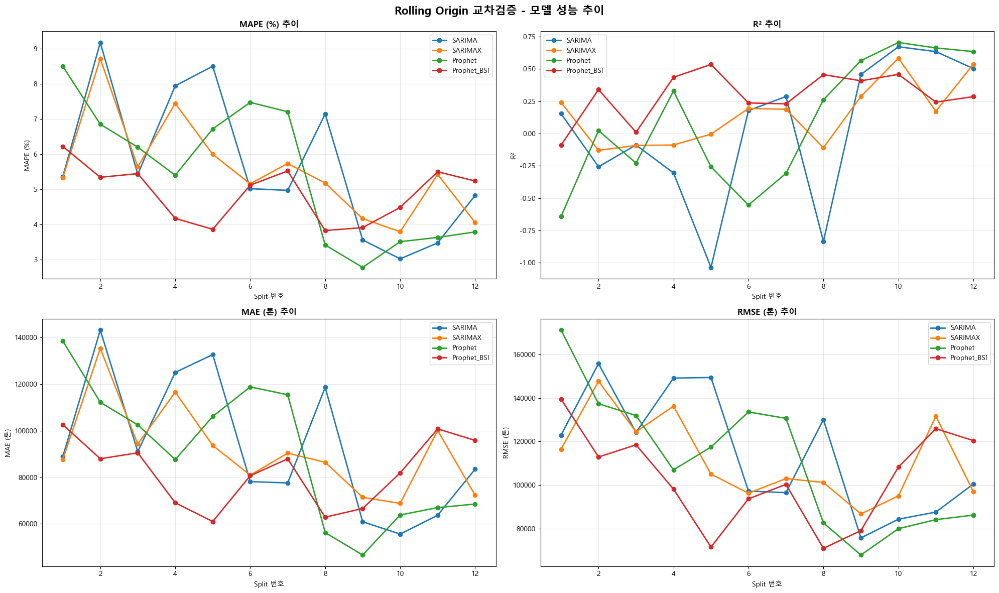

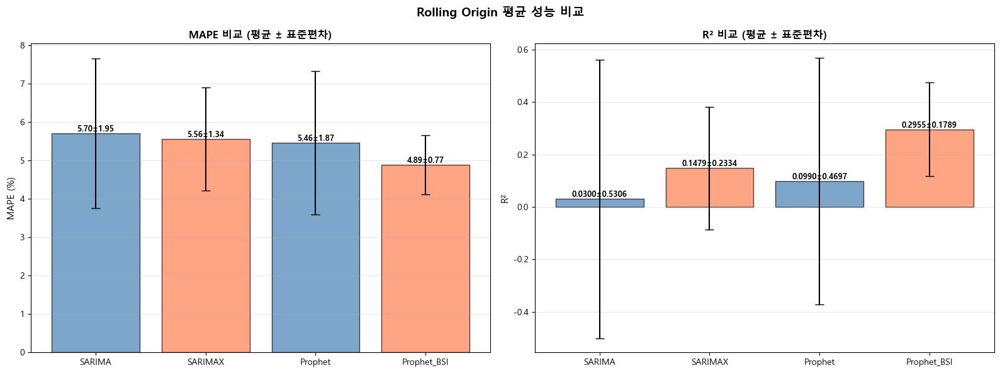

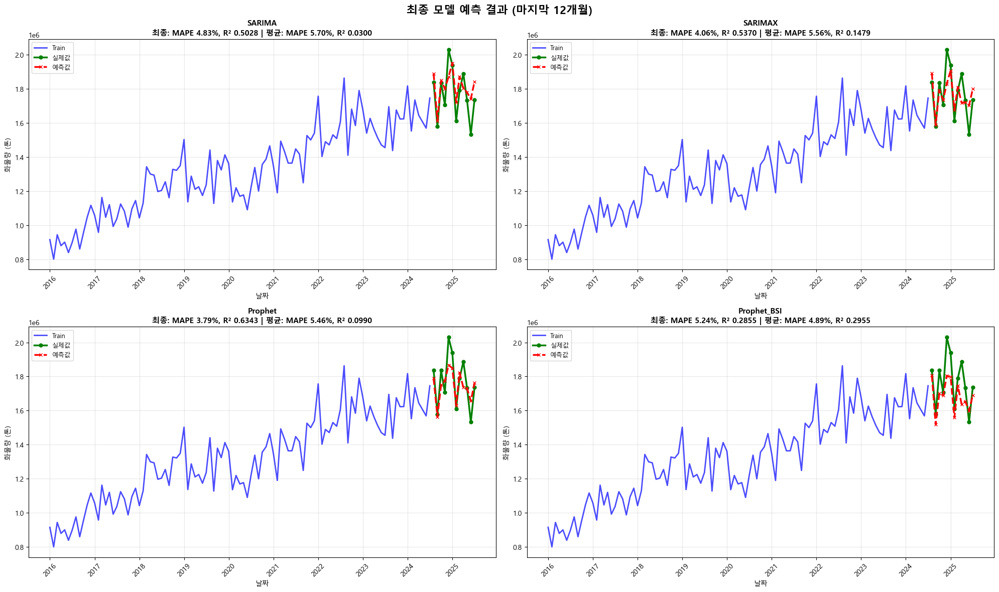

In [ ]:
"""
제주항 화물량 예측 모델 - 제조업 업황BSI + Rolling Origin 교차검증
- SARIMA (외생변수 없음)
- SARIMAX (업황BSI 포함)
- Prophet (외생변수 없음)
- Prophet (업황BSI 포함)
- Rolling Origin으로 과적합 방지 및 안정성 평가
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools
from tqdm import tqdm

print("=" * 80)
print("제주항 화물량 예측 시스템 - Rolling Origin 교차검증")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로 (사용자 데스크탑)
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합 (제조업 업황BSI만 사용)
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df['date'].min()} ~ {df['date'].max()}")
print(f"사용 외생변수: 제조업 업황BSI")

# ========================================
# 2. Rolling Origin 설정
# ========================================
print("\n[2단계] Rolling Origin 설정...")

# Rolling Origin 파라미터
INITIAL_TRAIN_SIZE = 70  # 초기 학습 데이터 크기 (개월)
TEST_WINDOW = 12         # 테스트 윈도우 크기 (개월)
STEP_SIZE = 3            # 스텝 크기 (개월)

# 가능한 분할 수 계산
total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

print(f"총 데이터: {total_data}개월")
print(f"초기 학습 크기: {INITIAL_TRAIN_SIZE}개월")
print(f"테스트 윈도우: {TEST_WINDOW}개월")
print(f"스텝 크기: {STEP_SIZE}개월")
print(f"Rolling Origin 분할 횟수: {max_splits}회")

# Rolling Origin 분할 생성
splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"\n실제 분할 횟수: {len(splits)}회")
for split in splits:
    train_period = df.iloc[split['train_start']:split['train_end']]['date']
    test_period = df.iloc[split['test_start']:split['test_end']]['date']
    print(f"  Split {split['split_id']}: Train({train_period.min().strftime('%Y-%m')}~{train_period.max().strftime('%Y-%m')}) "
          f"→ Test({test_period.min().strftime('%Y-%m')}~{test_period.max().strftime('%Y-%m')})")

# ========================================
# 3. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)

    return {
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'R2': r2
    }

# ========================================
# 4. SARIMA 최적 파라미터 찾기 (한 번만)
# ========================================
print("\n[3단계] SARIMA 최적 파라미터 탐색 중...")

# 첫 번째 분할로 최적 파라미터 찾기
first_split = splits[0]
train_data_first = df.iloc[first_split['train_start']:first_split['train_end']]

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("최적 파라미터 탐색 중... (약 1분 소요)")
for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량'],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, 1, 1)
    best_seasonal_param = (1, 1, 1, 12)

print(f"✓ 최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# ========================================
# 5. Rolling Origin 교차검증
# ========================================
print("\n[4단계] Rolling Origin 교차검증 수행 중...")

# 결과 저장용
rolling_results = {
    'SARIMA': [],
    'SARIMAX': [],
    'Prophet': [],
    'Prophet_BSI': []
}

all_predictions = []

# 각 분할에 대해 모델 학습 및 예측
for split in tqdm(splits, desc="Rolling Origin 진행"):
    split_id = split['split_id']

    # 데이터 분할
    train_data = df.iloc[split['train_start']:split['train_end']]
    test_data = df.iloc[split['test_start']:split['test_end']]

    actual = test_data['화물량'].values

    # ========================================
    # 모델 1: SARIMA
    # ========================================
    try:
        sarima_model = SARIMAX(train_data['화물량'],
                               order=best_param,
                               seasonal_order=best_seasonal_param)
        sarima_results = sarima_model.fit(disp=False, maxiter=100)
        sarima_forecast = sarima_results.forecast(steps=TEST_WINDOW)
        sarima_metrics = evaluate_predictions(actual, sarima_forecast.values)
        rolling_results['SARIMA'].append(sarima_metrics)
    except Exception as e:
        sarima_forecast = np.full(TEST_WINDOW, np.nan)
        sarima_metrics = {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan}
        rolling_results['SARIMA'].append(sarima_metrics)

    # ========================================
    # 모델 2: SARIMAX
    # ========================================
    try:
        sarimax_model = SARIMAX(train_data['화물량'],
                                exog=train_data[['제조업 업황BSI']],
                                order=best_param,
                                seasonal_order=best_seasonal_param)
        sarimax_results = sarimax_model.fit(disp=False, maxiter=100)
        sarimax_forecast = sarimax_results.forecast(steps=TEST_WINDOW,
                                                     exog=test_data[['제조업 업황BSI']])
        sarimax_metrics = evaluate_predictions(actual, sarimax_forecast.values)
        rolling_results['SARIMAX'].append(sarimax_metrics)
    except Exception as e:
        sarimax_forecast = np.full(TEST_WINDOW, np.nan)
        sarimax_metrics = {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan}
        rolling_results['SARIMAX'].append(sarimax_metrics)

    # ========================================
    # 모델 3: Prophet
    # ========================================
    try:
        prophet_train = train_data[['date', '화물량']].copy()
        prophet_train.columns = ['ds', 'y']

        prophet_model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False,
            seasonality_mode='multiplicative',
            changepoint_prior_scale=0.05
        )
        prophet_model.fit(prophet_train)

        future = prophet_model.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_forecast_df = prophet_model.predict(future)
        prophet_forecast = prophet_forecast_df.iloc[-TEST_WINDOW:]['yhat'].values
        prophet_metrics = evaluate_predictions(actual, prophet_forecast)
        rolling_results['Prophet'].append(prophet_metrics)
    except Exception as e:
        prophet_forecast = np.full(TEST_WINDOW, np.nan)
        prophet_metrics = {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan}
        rolling_results['Prophet'].append(prophet_metrics)

    # ========================================
    # 모델 4: Prophet + BSI
    # ========================================
    try:
        prophet_train_bsi = train_data[['date', '화물량', '제조업 업황BSI']].copy()
        prophet_train_bsi.columns = ['ds', 'y', '제조업 업황BSI']

        prophet_bsi_model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False,
            seasonality_mode='multiplicative',
            changepoint_prior_scale=0.05
        )
        prophet_bsi_model.add_regressor('제조업 업황BSI')
        prophet_bsi_model.fit(prophet_train_bsi)

        future_bsi = prophet_model.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi = future_bsi.merge(full_data[['date', '제조업 업황BSI']],
                                     left_on='ds', right_on='date', how='left')
        future_bsi['제조업 업황BSI'].fillna(method='ffill', inplace=True)

        prophet_bsi_forecast_df = prophet_bsi_model.predict(future_bsi)
        prophet_bsi_forecast = prophet_bsi_forecast_df.iloc[-TEST_WINDOW:]['yhat'].values
        prophet_bsi_metrics = evaluate_predictions(actual, prophet_bsi_forecast)
        rolling_results['Prophet_BSI'].append(prophet_bsi_metrics)
    except Exception as e:
        prophet_bsi_forecast = np.full(TEST_WINDOW, np.nan)
        prophet_bsi_metrics = {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan}
        rolling_results['Prophet_BSI'].append(prophet_bsi_metrics)

    # 예측값 저장
    all_predictions.append({
        'split_id': split_id,
        'test_start_date': test_data['date'].iloc[0],
        'test_end_date': test_data['date'].iloc[-1],
        'actual': actual,
        'SARIMA': sarima_forecast.values if hasattr(sarima_forecast, 'values') else sarima_forecast,
        'SARIMAX': sarimax_forecast.values if hasattr(sarimax_forecast, 'values') else sarimax_forecast,
        'Prophet': prophet_forecast,
        'Prophet_BSI': prophet_bsi_forecast
    })

print("✓ Rolling Origin 교차검증 완료!")

# ========================================
# 6. 결과 집계
# ========================================
print("\n[5단계] 결과 집계 중...")

# 각 모델의 평균 및 표준편차 계산
summary_results = {}

for model_name, metrics_list in rolling_results.items():
    # 각 지표별로 집계
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'MAE_mean': np.mean(maes),
        'MAE_std': np.std(maes),
        'RMSE_mean': np.mean(rmses),
        'RMSE_std': np.std(rmses),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

# ========================================
# 7. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("Rolling Origin 교차검증 결과")
print("=" * 80)

print(f"\n총 {len(splits)}회 검증 수행")
print("\n📊 모델별 평균 성능 (평균 ± 표준편차)")
print("-" * 80)
print(f"{'모델':<20} {'MAPE (%)':<20} {'RMSE (톤)':<25} {'R²':<20}")
print("-" * 80)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<20} {mape_str:<20} {rmse_str:<25} {r2_str:<20}")

# ========================================
# 8. 최종 모델 학습 (전체 데이터 - 마지막 12개월)
# ========================================
print("\n[6단계] 최종 모델 학습 중...")

FINAL_TEST_MONTHS = 12
train_final = df.iloc[:-FINAL_TEST_MONTHS].copy()
test_final = df.iloc[-FINAL_TEST_MONTHS:].copy()
actual_final = test_final['화물량'].values

print(f"최종 Train: {len(train_final)}개월")
print(f"최종 Test: {len(test_final)}개월")

# 각 모델 학습
final_predictions = {}

# SARIMA
sarima_final = SARIMAX(train_final['화물량'], order=best_param, seasonal_order=best_seasonal_param)
sarima_final_results = sarima_final.fit(disp=False, maxiter=100)
final_predictions['SARIMA'] = sarima_final_results.forecast(steps=FINAL_TEST_MONTHS).values

# SARIMAX
sarimax_final = SARIMAX(train_final['화물량'], exog=train_final[['제조업 업황BSI']],
                        order=best_param, seasonal_order=best_seasonal_param)
sarimax_final_results = sarimax_final.fit(disp=False, maxiter=100)
final_predictions['SARIMAX'] = sarimax_final_results.forecast(steps=FINAL_TEST_MONTHS,
                                                               exog=test_final[['제조업 업황BSI']]).values

# Prophet
prophet_final_train = train_final[['date', '화물량']].copy()
prophet_final_train.columns = ['ds', 'y']
prophet_final_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                              daily_seasonality=False, seasonality_mode='multiplicative')
prophet_final_model.fit(prophet_final_train)
future_final = prophet_final_model.make_future_dataframe(periods=FINAL_TEST_MONTHS, freq='MS')
prophet_final_pred = prophet_final_model.predict(future_final)
final_predictions['Prophet'] = prophet_final_pred.iloc[-FINAL_TEST_MONTHS:]['yhat'].values

# Prophet + BSI
prophet_bsi_final_train = train_final[['date', '화물량', '제조업 업황BSI']].copy()
prophet_bsi_final_train.columns = ['ds', 'y', '제조업 업황BSI']
prophet_bsi_final_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                  daily_seasonality=False, seasonality_mode='multiplicative')
prophet_bsi_final_model.add_regressor('제조업 업황BSI')
prophet_bsi_final_model.fit(prophet_bsi_final_train)
future_bsi_final = prophet_final_model.make_future_dataframe(periods=FINAL_TEST_MONTHS, freq='MS')
full_final = pd.concat([train_final, test_final], ignore_index=True)
future_bsi_final = future_bsi_final.merge(full_final[['date', '제조업 업황BSI']],
                                         left_on='ds', right_on='date', how='left')
future_bsi_final['제조업 업황BSI'].fillna(method='ffill', inplace=True)
prophet_bsi_final_pred = prophet_bsi_final_model.predict(future_bsi_final)
final_predictions['Prophet_BSI'] = prophet_bsi_final_pred.iloc[-FINAL_TEST_MONTHS:]['yhat'].values

# 최종 모델 평가
final_metrics = {}
for model_name, pred in final_predictions.items():
    final_metrics[model_name] = evaluate_predictions(actual_final, pred)

print("\n최종 모델 성능 (마지막 12개월 테스트):")
print("-" * 80)
for model_name, metrics in final_metrics.items():
    print(f"{model_name:<20} | MAPE: {metrics['MAPE']:6.2f}% | R²: {metrics['R2']:.4f}")

# ========================================
# 9. 시각화
# ========================================
print("\n[7단계] 결과 시각화 중...")

# 1. Rolling Origin 성능 추이
fig1, axes1 = plt.subplots(2, 2, figsize=(20, 12))
fig1.suptitle('Rolling Origin 교차검증 - 모델 성능 추이', fontsize=16, fontweight='bold')

metrics_to_plot = ['MAPE', 'R2', 'MAE', 'RMSE']
metric_labels = ['MAPE (%)', 'R²', 'MAE (톤)', 'RMSE (톤)']

for idx, (metric, label) in enumerate(zip(metrics_to_plot, metric_labels)):
    ax = axes1[idx // 2, idx % 2]

    for model_name in rolling_results.keys():
        values = [m[metric] for m in rolling_results[model_name] if not np.isnan(m[metric])]
        ax.plot(range(1, len(values) + 1), values, marker='o', label=model_name, linewidth=2)

    ax.set_xlabel('Split 번호', fontsize=10)
    ax.set_ylabel(label, fontsize=10)
    ax.set_title(f'{label} 추이', fontsize=12, fontweight='bold')
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Rolling_Origin_성능추이.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/Rolling_Origin_성능추이.png")

# 2. 평균 성능 비교
fig2, axes2 = plt.subplots(1, 2, figsize=(16, 6))
fig2.suptitle('Rolling Origin 평균 성능 비교', fontsize=14, fontweight='bold')

model_names = list(summary_results.keys())
mape_means = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]
r2_means = [summary_results[m]['R2_mean'] for m in model_names]
r2_stds = [summary_results[m]['R2_std'] for m in model_names]

# MAPE
ax1 = axes2[0]
bars1 = ax1.bar(model_names, mape_means, yerr=mape_stds, capsize=5,
               color=['steelblue', 'coral', 'steelblue', 'coral'], alpha=0.7, edgecolor='black')
ax1.set_ylabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교 (평균 ± 표준편차)', fontsize=12, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

for bar, mean, std in zip(bars1, mape_means, mape_stds):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{mean:.2f}±{std:.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# R²
ax2 = axes2[1]
bars2 = ax2.bar(model_names, r2_means, yerr=r2_stds, capsize=5,
               color=['steelblue', 'coral', 'steelblue', 'coral'], alpha=0.7, edgecolor='black')
ax2.set_ylabel('R²', fontsize=11)
ax2.set_title('R² 비교 (평균 ± 표준편차)', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

for bar, mean, std in zip(bars2, r2_means, r2_stds):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{mean:.4f}±{std:.4f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Rolling_Origin_평균성능.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/Rolling_Origin_평균성능.png")

# 3. 최종 모델 예측 결과
fig3, axes3 = plt.subplots(2, 2, figsize=(20, 12))
fig3.suptitle('최종 모델 예측 결과 (마지막 12개월)', fontsize=16, fontweight='bold')

for idx, (model_name, pred) in enumerate(final_predictions.items()):
    ax = axes3[idx // 2, idx % 2]

    # Train
    ax.plot(train_final['date'], train_final['화물량'], label='Train', color='blue', linewidth=2, alpha=0.7)

    # Test 실제
    ax.plot(test_final['date'], actual_final, label='실제값', color='green', linewidth=2.5, marker='o', markersize=5)

    # Test 예측
    ax.plot(test_final['date'], pred, label='예측값', color='red', linewidth=2.5, linestyle='--', marker='x', markersize=5)

    mape = final_metrics[model_name]['MAPE']
    r2 = final_metrics[model_name]['R2']
    avg_mape = summary_results[model_name]['MAPE_mean']
    avg_r2 = summary_results[model_name]['R2_mean']

    ax.set_title(f'{model_name}\n최종: MAPE {mape:.2f}%, R² {r2:.4f} | 평균: MAPE {avg_mape:.2f}%, R² {avg_r2:.4f}',
                fontsize=11, fontweight='bold')
    ax.set_xlabel('날짜', fontsize=10)
    ax.set_ylabel('화물량 (톤)', fontsize=10)
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/최종모델_예측결과.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/최종모델_예측결과.png")

# ========================================
# 10. 결과 저장
# ========================================
print("\n[8단계] 결과 저장 중...")

# 1. Rolling Origin 상세 결과
rolling_detail = []
for split_idx, split in enumerate(splits):
    for model_name in rolling_results.keys():
        metrics = rolling_results[model_name][split_idx]
        rolling_detail.append({
            'Split': split['split_id'],
            '모델': model_name,
            'MAPE': metrics['MAPE'],
            'MAE': metrics['MAE'],
            'RMSE': metrics['RMSE'],
            'R2': metrics['R2']
        })

rolling_detail_df = pd.DataFrame(rolling_detail)
rolling_detail_df.to_excel(f'{DATA_PATH}/Rolling_Origin_상세결과.xlsx', index=False)
print(f"✓ Rolling Origin 상세 결과 저장: {DATA_PATH}/Rolling_Origin_상세결과.xlsx")

# 2. 평균 성능 요약
summary_df = pd.DataFrame(summary_results).T
summary_df.to_excel(f'{DATA_PATH}/Rolling_Origin_평균성능.xlsx')
print(f"✓ 평균 성능 저장: {DATA_PATH}/Rolling_Origin_평균성능.xlsx")

# 3. 최종 모델 예측 결과
final_results_df = pd.DataFrame({
    '날짜': test_final['date'],
    '실제_화물량': actual_final,
    'SARIMA_예측': final_predictions['SARIMA'],
    'SARIMAX_예측': final_predictions['SARIMAX'],
    'Prophet_예측': final_predictions['Prophet'],
    'Prophet_BSI_예측': final_predictions['Prophet_BSI']
})

for model in ['SARIMA', 'SARIMAX', 'Prophet', 'Prophet_BSI']:
    final_results_df[f'{model}_오차'] = final_results_df['실제_화물량'] - final_results_df[f'{model}_예측']
    final_results_df[f'{model}_오차율(%)'] = (final_results_df[f'{model}_오차'] / final_results_df['실제_화물량'] * 100).round(2)

final_results_df.to_excel(f'{DATA_PATH}/최종모델_예측결과.xlsx', index=False)
print(f"✓ 최종 예측 결과 저장: {DATA_PATH}/최종모델_예측결과.xlsx")

# 4. 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/Rolling_Origin_종합리포트.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': ['총 데이터', '초기 학습 크기', '테스트 윈도우', '스텝 크기', 'Rolling 횟수', '최적 모델(평균 MAPE)', '최적 모델(평균 R²)'],
        '내용': [
            f"{total_data}개월",
            f"{INITIAL_TRAIN_SIZE}개월",
            f"{TEST_WINDOW}개월",
            f"{STEP_SIZE}개월",
            f"{len(splits)}회",
            min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])[0],
            max(summary_results.items(), key=lambda x: x[1]['R2_mean'])[0]
        ]
    })
    summary_info.to_excel(writer, sheet_name='요약', index=False)

    # 평균 성능
    summary_df.to_excel(writer, sheet_name='평균성능')

    # 상세 결과
    rolling_detail_df.to_excel(writer, sheet_name='상세결과', index=False)

    # 최종 예측
    final_results_df.to_excel(writer, sheet_name='최종예측', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/Rolling_Origin_종합리포트.xlsx")

# ========================================
# 11. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/Rolling_Origin_성능추이.png")
print(f"2. {DATA_PATH}/Rolling_Origin_평균성능.png")
print(f"3. {DATA_PATH}/최종모델_예측결과.png")
print(f"4. {DATA_PATH}/Rolling_Origin_상세결과.xlsx")
print(f"5. {DATA_PATH}/Rolling_Origin_평균성능.xlsx")
print(f"6. {DATA_PATH}/최종모델_예측결과.xlsx")
print(f"7. {DATA_PATH}/Rolling_Origin_종합리포트.xlsx")

print("\n🏆 Rolling Origin 평균 성능 순위")
print("-" * 80)
sorted_by_mape = sorted(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])
for rank, (model, metrics) in enumerate(sorted_by_mape, 1):
    print(f"{rank}. {model:<20} | MAPE: {metrics['MAPE_mean']:6.2f}% (±{metrics['MAPE_std']:.2f}) | "
          f"R²: {metrics['R2_mean']:.4f} (±{metrics['R2_std']:.4f})")

print("\n💡 안정성 분석 (표준편차가 낮을수록 안정적)")
print("-" * 80)
sorted_by_std = sorted(summary_results.items(), key=lambda x: x[1]['MAPE_std'])
for rank, (model, metrics) in enumerate(sorted_by_std, 1):
    print(f"{rank}. {model:<20} | MAPE 표준편차: {metrics['MAPE_std']:6.2f}%")

print("\n🎯 결론:")
print("-" * 80)
best_model = min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])
most_stable = min(summary_results.items(), key=lambda x: x[1]['MAPE_std'])

print(f"✓ 최고 성능 모델: {best_model[0]}")
print(f"  - 평균 MAPE: {best_model[1]['MAPE_mean']:.2f}% (±{best_model[1]['MAPE_std']:.2f})")
print(f"  - 평균 R²: {best_model[1]['R2_mean']:.4f} (±{best_model[1]['R2_std']:.4f})")

print(f"\n✓ 가장 안정적인 모델: {most_stable[0]}")
print(f"  - MAPE 표준편차: {most_stable[1]['MAPE_std']:.2f}%")

# 외생변수 효과 (SARIMAX vs SARIMA)
sarima_mape = summary_results['SARIMA']['MAPE_mean']
sarimax_mape = summary_results['SARIMAX']['MAPE_mean']
improvement = ((sarima_mape - sarimax_mape) / sarima_mape) * 100

print(f"\n✓ 외생변수(업황BSI) 효과:")
if improvement > 0:
    print(f"  - SARIMAX가 SARIMA 대비 평균 {improvement:.2f}% 성능 개선")
    print(f"  - 업황BSI 사용 권장!")
else:
    print(f"  - SARIMAX가 SARIMA 대비 평균 {abs(improvement):.2f}% 성능 저하")
    print(f"  - 단순 SARIMA 사용 권장")

print("\n" + "=" * 80)
print("✅ Rolling Origin 교차검증으로 과적합 방지 및 모델 안정성 확인 완료!")
print("=" * 80)

# ADF 검정 + COVID 처리 + Rolling Origin

제주항 화물량 예측 시스템 - 완전판

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 5)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] COVID-19 이상치 처리...
COVID-19 기간: 2020-03 ~ 2021-12
COVID-19 영향 개월: 22개월

화물량 통계:
  정상 기간 평균: 1,373,317 톤
  COVID 기간 평균: 1,340,689 톤
  차이: -32,628 톤 (-2.4%)

BSI 통계:
  정상 기간 평균: 64.2
  COVID 기간 평균: 51.9
  차이: -12.3

[3단계] ADF 검정 (정상성 검정)...

------------------------------------------------------------
원본 데이터 정상성 검정
------------------------------------------------------------

화물량 ADF 검정 결과:
  ADF Statistic: -0.8480
  p-value: 0.8046
  Critical Values:
    1%: -3.4955
    5%: -2.8900
    10%: -2.5820
  ✗ 비정상성 (p-value >= 0.05) - 차분 필요

제조업 업황BSI ADF 검정 결과:
  ADF Statistic: -0.7032
  p-value: 0.8459
  Critical Values:
    1%: -3.4961
    5%: -2.8903
    10%: -2.5821
  ✗ 비정상성 (p-value >= 0.05) - 차분 필요

------------------------------------------------------------
1차 차분 후 정상성 검정
------------------------------------------------------------

화물량 (1

19:35:40 - cmdstanpy - INFO - Chain [1] start processing
19:35:40 - cmdstanpy - INFO - Chain [1] done processing
19:35:40 - cmdstanpy - INFO - Chain [1] start processing
19:35:41 - cmdstanpy - INFO - Chain [1] done processing
19:35:41 - cmdstanpy - INFO - Chain [1] start processing
19:35:41 - cmdstanpy - INFO - Chain [1] done processing


19:35:42 - cmdstanpy - INFO - Chain [1] start processing
19:35:42 - cmdstanpy - INFO - Chain [1] done processing
19:35:42 - cmdstanpy - INFO - Chain [1] start processing
19:35:43 - cmdstanpy - INFO - Chain [1] done processing
19:35:43 - cmdstanpy - INFO - Chain [1] start processing
19:35:43 - cmdstanpy - INFO - Chain [1] done processing


19:35:44 - cmdstanpy - INFO - Chain [1] start processing
19:35:44 - cmdstanpy - INFO - Chain [1] done processing
19:35:44 - cmdstanpy - INFO - Chain [1] start processing
19:35:44 - cmdstanpy - INFO - Chain [1] done processing
19:35:44 - cmdstanpy - INFO - Chain [1] start processing
19:35:45 - cmdstanpy - INFO - Chain [1] done processing


19:35:45 - cmdstanpy - INFO - Chain [1] start processing
19:35:46 - cmdstanpy - INFO - Chain [1] done processing
19:35:46 - cmdstanpy - INFO - Chain [1] start processing
19:35:46 - cmdstanpy - INFO - Chain [1] done processing
19:35:46 - cmdstanpy - INFO - Chain [1] start processing
19:35:46 - cmdstanpy - INFO - Chain [1] done processing


19:35:47 - cmdstanpy - INFO - Chain [1] start processing
19:35:47 - cmdstanpy - INFO - Chain [1] done processing
19:35:47 - cmdstanpy - INFO - Chain [1] start processing
19:35:47 - cmdstanpy - INFO - Chain [1] done processing
19:35:48 - cmdstanpy - INFO - Chain [1] start processing
19:35:48 - cmdstanpy - INFO - Chain [1] done processing


19:35:49 - cmdstanpy - INFO - Chain [1] start processing
19:35:49 - cmdstanpy - INFO - Chain [1] done processing
19:35:49 - cmdstanpy - INFO - Chain [1] start processing
19:35:49 - cmdstanpy - INFO - Chain [1] done processing
19:35:49 - cmdstanpy - INFO - Chain [1] start processing
19:35:50 - cmdstanpy - INFO - Chain [1] done processing


19:35:50 - cmdstanpy - INFO - Chain [1] start processing
19:35:51 - cmdstanpy - INFO - Chain [1] done processing
19:35:51 - cmdstanpy - INFO - Chain [1] start processing
19:35:51 - cmdstanpy - INFO - Chain [1] done processing
19:35:51 - cmdstanpy - INFO - Chain [1] start processing
19:35:51 - cmdstanpy - INFO - Chain [1] done processing


19:35:52 - cmdstanpy - INFO - Chain [1] start processing
19:35:52 - cmdstanpy - INFO - Chain [1] done processing
19:35:52 - cmdstanpy - INFO - Chain [1] start processing
19:35:53 - cmdstanpy - INFO - Chain [1] done processing
19:35:53 - cmdstanpy - INFO - Chain [1] start processing
19:35:53 - cmdstanpy - INFO - Chain [1] done processing


19:35:54 - cmdstanpy - INFO - Chain [1] start processing
19:35:54 - cmdstanpy - INFO - Chain [1] done processing
19:35:54 - cmdstanpy - INFO - Chain [1] start processing
19:35:55 - cmdstanpy - INFO - Chain [1] done processing
19:35:55 - cmdstanpy - INFO - Chain [1] start processing
19:35:55 - cmdstanpy - INFO - Chain [1] done processing


19:35:56 - cmdstanpy - INFO - Chain [1] start processing
19:35:56 - cmdstanpy - INFO - Chain [1] done processing
19:35:56 - cmdstanpy - INFO - Chain [1] start processing
19:35:57 - cmdstanpy - INFO - Chain [1] done processing
19:35:57 - cmdstanpy - INFO - Chain [1] start processing
19:35:57 - cmdstanpy - INFO - Chain [1] done processing


19:35:58 - cmdstanpy - INFO - Chain [1] start processing
19:35:58 - cmdstanpy - INFO - Chain [1] done processing
19:35:58 - cmdstanpy - INFO - Chain [1] start processing
19:35:58 - cmdstanpy - INFO - Chain [1] done processing
19:35:58 - cmdstanpy - INFO - Chain [1] start processing
19:35:58 - cmdstanpy - INFO - Chain [1] done processing


19:35:59 - cmdstanpy - INFO - Chain [1] start processing
19:35:59 - cmdstanpy - INFO - Chain [1] done processing
19:35:59 - cmdstanpy - INFO - Chain [1] start processing
19:36:00 - cmdstanpy - INFO - Chain [1] done processing
19:36:00 - cmdstanpy - INFO - Chain [1] start processing
19:36:00 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         
✓ Rolling Origin 교차검증 완료!

[9단계] 결과 집계 중...

Rolling Origin 교차검증 결과

총 12회 검증 수행

📊 모델별 평균 성능 (평균 ± 표준편차)
------------------------------------------------------------------------------------------
모델                        MAPE (%)               RMSE (톤)                    R²                  
------------------------------------------------------------------------------------------
SARIMA                    5.96 ± 2.48            118,884 ± 34,401            -0.0609 ± 0.6418    
SARIMAX                   5.55 ± 1.65            111,182 ± 23,012            0.1560 ± 0.2824     
SARIMAX_COVID             6.30 ± 2.67            122,632 ± 39,170            -0.1226 ± 0.7505    
Prophet                   5.46 ± 1.87            110,845 ± 29,880            0.0990 ± 0.4697     
Prophet_BSI               4.89 ± 0.77            103,262 ± 20,918            0.2955 ± 0.1789     
Prophet_BSI_COVID         5.55 ± 1.50            109,139 ± 22,297            0.1825 ± 0.2917     

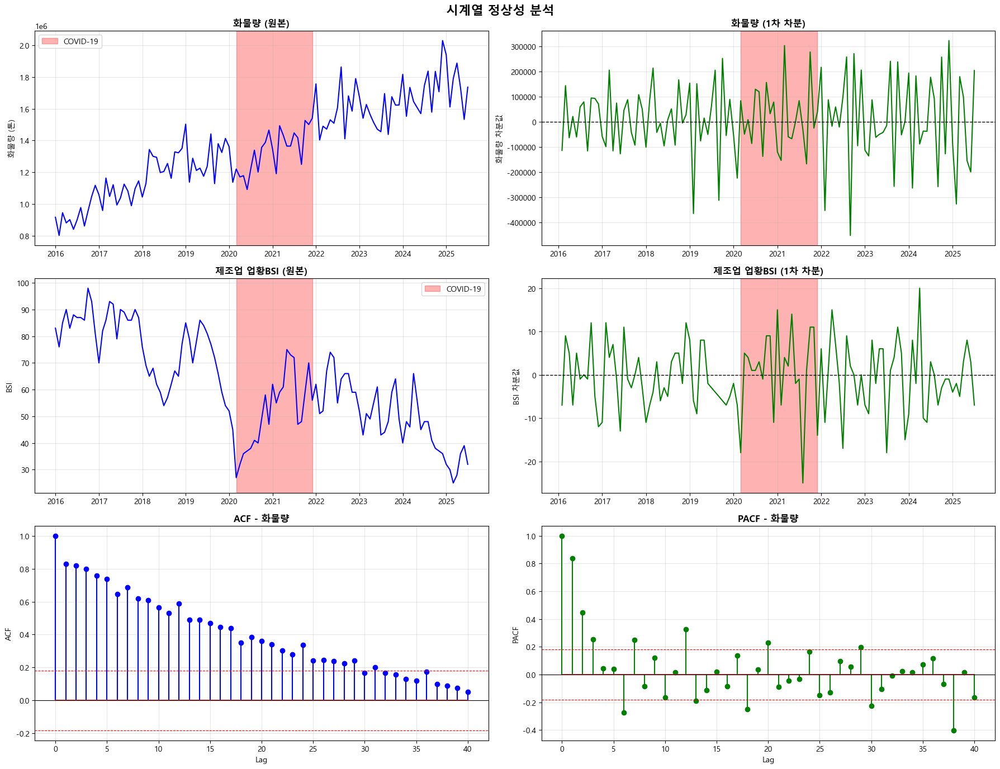

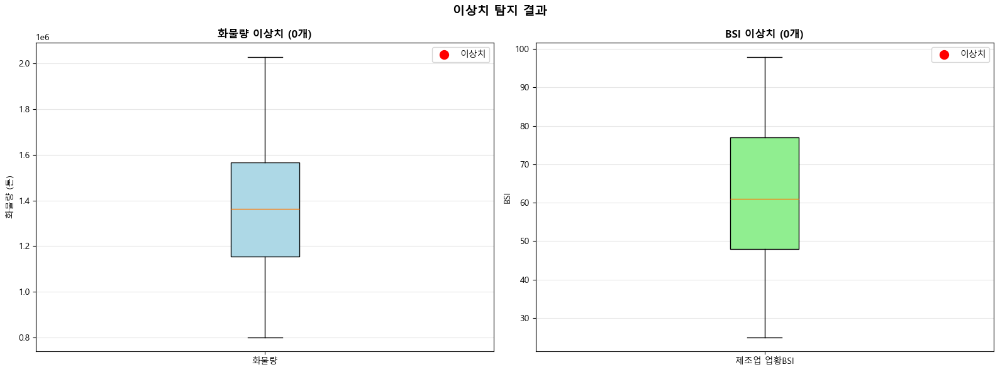

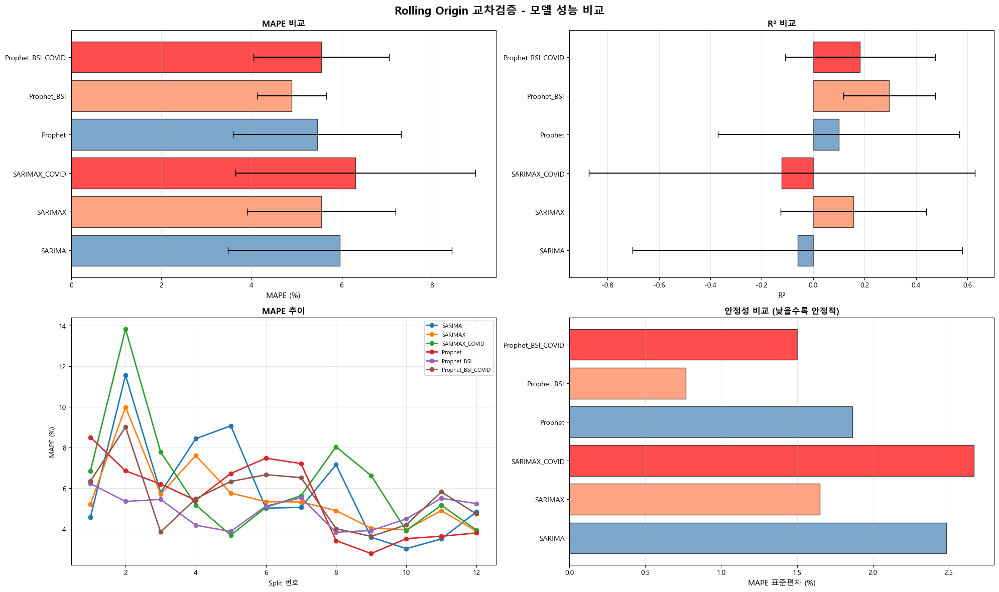

In [ ]:
"""
제주항 화물량 예측 모델 - 완전판
- ADF 검정 (정상성 검정)
- COVID-19 이상치 처리
- Rolling Origin 교차검증
- 제조업 업황BSI 외생변수
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf, pacf
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools
from scipy import stats

print("=" * 80)
print("제주항 화물량 예측 시스템 - 완전판")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df['date'].min()} ~ {df['date'].max()}")

# ========================================
# 2. COVID-19 더미 변수 생성
# ========================================
print("\n[2단계] COVID-19 이상치 처리...")

# COVID-19 기간 설정 (2020년 3월 ~ 2021년 12월)
covid_start = pd.to_datetime('2020-03-01')
covid_end = pd.to_datetime('2021-12-01')

df['covid_dummy'] = ((df['date'] >= covid_start) & (df['date'] <= covid_end)).astype(int)

covid_count = df['covid_dummy'].sum()
print(f"COVID-19 기간: {covid_start.strftime('%Y-%m')} ~ {covid_end.strftime('%Y-%m')}")
print(f"COVID-19 영향 개월: {covid_count}개월")

# COVID 기간 통계
covid_period = df[df['covid_dummy'] == 1]
normal_period = df[df['covid_dummy'] == 0]

print(f"\n화물량 통계:")
print(f"  정상 기간 평균: {normal_period['화물량'].mean():,.0f} 톤")
print(f"  COVID 기간 평균: {covid_period['화물량'].mean():,.0f} 톤")
print(f"  차이: {covid_period['화물량'].mean() - normal_period['화물량'].mean():,.0f} 톤 ({((covid_period['화물량'].mean() / normal_period['화물량'].mean() - 1) * 100):.1f}%)")

print(f"\nBSI 통계:")
print(f"  정상 기간 평균: {normal_period['제조업 업황BSI'].mean():.1f}")
print(f"  COVID 기간 평균: {covid_period['제조업 업황BSI'].mean():.1f}")
print(f"  차이: {covid_period['제조업 업황BSI'].mean() - normal_period['제조업 업황BSI'].mean():.1f}")

# ========================================
# 3. ADF 검정 (정상성 검정)
# ========================================
print("\n[3단계] ADF 검정 (정상성 검정)...")

def adf_test(series, name):
    """ADF 검정 수행 및 결과 출력"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name} ADF 검정 결과:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Critical Values:")
    for key, value in result[4].items():
        print(f"    {key}: {value:.4f}")

    if result[1] < 0.05:
        print(f"  ✓ 정상성 만족 (p-value < 0.05)")
        return True
    else:
        print(f"  ✗ 비정상성 (p-value >= 0.05) - 차분 필요")
        return False

# 원본 데이터 ADF 검정
print("\n" + "-" * 60)
print("원본 데이터 정상성 검정")
print("-" * 60)

cargo_stationary = adf_test(df['화물량'], "화물량")
bsi_stationary = adf_test(df['제조업 업황BSI'], "제조업 업황BSI")

# 1차 차분 후 ADF 검정
print("\n" + "-" * 60)
print("1차 차분 후 정상성 검정")
print("-" * 60)

df['화물량_diff1'] = df['화물량'].diff()
df['BSI_diff1'] = df['제조업 업황BSI'].diff()

cargo_diff1_stationary = adf_test(df['화물량_diff1'], "화물량 (1차 차분)")
bsi_diff1_stationary = adf_test(df['BSI_diff1'], "BSI (1차 차분)")

# 정상성 결과 요약
print("\n" + "=" * 60)
print("정상성 검정 요약")
print("=" * 60)
print(f"화물량 원본: {'정상' if cargo_stationary else '비정상'}")
print(f"화물량 1차 차분: {'정상' if cargo_diff1_stationary else '비정상'}")
print(f"BSI 원본: {'정상' if bsi_stationary else '비정상'}")
print(f"BSI 1차 차분: {'정상' if bsi_diff1_stationary else '비정상'}")

# SARIMA 'd' 파라미터 권장
if cargo_stationary:
    recommended_d = 0
elif cargo_diff1_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 SARIMA 'd' 파라미터: {recommended_d}")

# ========================================
# 4. 시각화 - 정상성 분석
# ========================================
print("\n[4단계] 정상성 분석 시각화 중...")

fig1, axes1 = plt.subplots(3, 2, figsize=(18, 14))
fig1.suptitle('시계열 정상성 분석', fontsize=16, fontweight='bold')

# 화물량 원본
ax1 = axes1[0, 0]
ax1.plot(df['date'], df['화물량'], color='blue', linewidth=1.5)
ax1.axvspan(covid_start, covid_end, alpha=0.3, color='red', label='COVID-19')
ax1.set_title('화물량 (원본)', fontsize=12, fontweight='bold')
ax1.set_ylabel('화물량 (톤)')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 화물량 1차 차분
ax2 = axes1[0, 1]
ax2.plot(df['date'], df['화물량_diff1'], color='green', linewidth=1.5)
ax2.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax2.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax2.set_title('화물량 (1차 차분)', fontsize=12, fontweight='bold')
ax2.set_ylabel('화물량 차분값')
ax2.grid(True, alpha=0.3)

# BSI 원본
ax3 = axes1[1, 0]
ax3.plot(df['date'], df['제조업 업황BSI'], color='blue', linewidth=1.5)
ax3.axvspan(covid_start, covid_end, alpha=0.3, color='red', label='COVID-19')
ax3.set_title('제조업 업황BSI (원본)', fontsize=12, fontweight='bold')
ax3.set_ylabel('BSI')
ax3.legend()
ax3.grid(True, alpha=0.3)

# BSI 1차 차분
ax4 = axes1[1, 1]
ax4.plot(df['date'], df['BSI_diff1'], color='green', linewidth=1.5)
ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax4.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax4.set_title('제조업 업황BSI (1차 차분)', fontsize=12, fontweight='bold')
ax4.set_ylabel('BSI 차분값')
ax4.grid(True, alpha=0.3)

# ACF - 화물량
ax5 = axes1[2, 0]
acf_values = acf(df['화물량'].dropna(), nlags=40)
ax5.stem(range(len(acf_values)), acf_values, linefmt='blue', markerfmt='bo')
ax5.axhline(y=0, color='black', linewidth=0.8)
ax5.axhline(y=1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax5.axhline(y=-1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax5.set_title('ACF - 화물량', fontsize=12, fontweight='bold')
ax5.set_xlabel('Lag')
ax5.set_ylabel('ACF')
ax5.grid(True, alpha=0.3)

# PACF - 화물량
ax6 = axes1[2, 1]
pacf_values = pacf(df['화물량'].dropna(), nlags=40)
ax6.stem(range(len(pacf_values)), pacf_values, linefmt='green', markerfmt='go')
ax6.axhline(y=0, color='black', linewidth=0.8)
ax6.axhline(y=1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax6.axhline(y=-1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax6.set_title('PACF - 화물량', fontsize=12, fontweight='bold')
ax6.set_xlabel('Lag')
ax6.set_ylabel('PACF')
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/정상성_분석.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/정상성_분석.png")

# ========================================
# 5. 이상치 탐지 및 시각화
# ========================================
print("\n[5단계] 이상치 탐지...")

def detect_outliers_iqr(data, column):
    """IQR 방법으로 이상치 탐지"""
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]

    return outliers, lower_bound, upper_bound

# 화물량 이상치
cargo_outliers, cargo_lower, cargo_upper = detect_outliers_iqr(df, '화물량')
print(f"\n화물량 이상치:")
print(f"  IQR 범위: {cargo_lower:,.0f} ~ {cargo_upper:,.0f} 톤")
print(f"  이상치 개수: {len(cargo_outliers)}개")
if len(cargo_outliers) > 0:
    print(f"  이상치 기간:")
    for idx, row in cargo_outliers.iterrows():
        print(f"    {row['date'].strftime('%Y-%m')}: {row['화물량']:,.0f} 톤")

# BSI 이상치
bsi_outliers, bsi_lower, bsi_upper = detect_outliers_iqr(df, '제조업 업황BSI')
print(f"\nBSI 이상치:")
print(f"  IQR 범위: {bsi_lower:.1f} ~ {bsi_upper:.1f}")
print(f"  이상치 개수: {len(bsi_outliers)}개")
if len(bsi_outliers) > 0:
    print(f"  이상치 기간:")
    for idx, row in bsi_outliers.iterrows():
        print(f"    {row['date'].strftime('%Y-%m')}: {row['제조업 업황BSI']:.1f}")

# 이상치 시각화
fig2, axes2 = plt.subplots(1, 2, figsize=(16, 6))
fig2.suptitle('이상치 탐지 결과', fontsize=14, fontweight='bold')

# 화물량 박스플롯
ax1 = axes2[0]
bp1 = ax1.boxplot([df['화물량']], labels=['화물량'], patch_artist=True)
bp1['boxes'][0].set_facecolor('lightblue')
ax1.scatter([1] * len(cargo_outliers), cargo_outliers['화물량'], color='red', s=100, zorder=3, label='이상치')
ax1.set_ylabel('화물량 (톤)')
ax1.set_title(f'화물량 이상치 ({len(cargo_outliers)}개)', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# BSI 박스플롯
ax2 = axes2[1]
bp2 = ax2.boxplot([df['제조업 업황BSI']], labels=['제조업 업황BSI'], patch_artist=True)
bp2['boxes'][0].set_facecolor('lightgreen')
ax2.scatter([1] * len(bsi_outliers), bsi_outliers['제조업 업황BSI'], color='red', s=100, zorder=3, label='이상치')
ax2.set_ylabel('BSI')
ax2.set_title(f'BSI 이상치 ({len(bsi_outliers)}개)', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/이상치_탐지.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/이상치_탐지.png")

# ========================================
# 6. Rolling Origin 설정
# ========================================
print("\n[6단계] Rolling Origin 설정...")

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

print(f"총 데이터: {total_data}개월")
print(f"초기 학습 크기: {INITIAL_TRAIN_SIZE}개월")
print(f"테스트 윈도우: {TEST_WINDOW}개월")
print(f"스텝 크기: {STEP_SIZE}개월")

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"실제 분할 횟수: {len(splits)}회")

# ========================================
# 7. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 8. SARIMA 최적 파라미터 찾기
# ========================================
print("\n[7단계] SARIMA 최적 파라미터 탐색 중...")

first_split = splits[0]
train_data_first = df.iloc[first_split['train_start']:first_split['train_end']]

# ADF 검정 결과에 따라 d 파라미터 범위 조정
if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("최적 파라미터 탐색 중...")
for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량'],
                          exog=train_data_first[['제조업 업황BSI', 'covid_dummy']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f"✓ 최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")
print(f"✓ ADF 검정 권장 'd': {recommended_d}, 선택된 'd': {best_param[1]}")

# ========================================
# 9. Rolling Origin 교차검증
# ========================================
print("\n[8단계] Rolling Origin 교차검증 수행 중...")

rolling_results = {
    'SARIMA': [],
    'SARIMAX': [],
    'SARIMAX_COVID': [],
    'Prophet': [],
    'Prophet_BSI': [],
    'Prophet_BSI_COVID': []
}

print("모델 학습 및 예측 중...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df.iloc[split['train_start']:split['train_end']]
    test_data = df.iloc[split['test_start']:split['test_end']]
    actual = test_data['화물량'].values

    # SARIMA (외생변수 없음)
    try:
        sarima_model = SARIMAX(train_data['화물량'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_results = sarima_model.fit(disp=False, maxiter=100)
        sarima_forecast = sarima_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA'].append(evaluate_predictions(actual, sarima_forecast.values))
    except:
        rolling_results['SARIMA'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX (BSI만)
    try:
        sarimax_model = SARIMAX(train_data['화물량'], exog=train_data[['제조업 업황BSI']],
                                order=best_param, seasonal_order=best_seasonal_param)
        sarimax_results = sarimax_model.fit(disp=False, maxiter=100)
        sarimax_forecast = sarimax_results.forecast(steps=TEST_WINDOW, exog=test_data[['제조업 업황BSI']])
        rolling_results['SARIMAX'].append(evaluate_predictions(actual, sarimax_forecast.values))
    except:
        rolling_results['SARIMAX'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX (BSI + COVID)
    try:
        sarimax_covid_model = SARIMAX(train_data['화물량'],
                                      exog=train_data[['제조업 업황BSI', 'covid_dummy']],
                                      order=best_param, seasonal_order=best_seasonal_param)
        sarimax_covid_results = sarimax_covid_model.fit(disp=False, maxiter=100)
        sarimax_covid_forecast = sarimax_covid_results.forecast(steps=TEST_WINDOW,
                                                                exog=test_data[['제조업 업황BSI', 'covid_dummy']])
        rolling_results['SARIMAX_COVID'].append(evaluate_predictions(actual, sarimax_covid_forecast.values))
    except:
        rolling_results['SARIMAX_COVID'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet (기본)
    try:
        prophet_train = train_data[['date', '화물량']].copy()
        prophet_train.columns = ['ds', 'y']
        prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                               daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_model.fit(prophet_train)
        future = prophet_model.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_forecast = prophet_model.predict(future).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet'].append(evaluate_predictions(actual, prophet_forecast))
    except:
        rolling_results['Prophet'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet (BSI)
    try:
        prophet_bsi_train = train_data[['date', '화물량', '제조업 업황BSI']].copy()
        prophet_bsi_train.columns = ['ds', 'y', '제조업 업황BSI']
        prophet_bsi_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                   daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_model.add_regressor('제조업 업황BSI')
        prophet_bsi_model.fit(prophet_bsi_train)

        future_bsi = prophet_model.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi = future_bsi.merge(full_data[['date', '제조업 업황BSI']],
                                     left_on='ds', right_on='date', how='left')
        future_bsi['제조업 업황BSI'].fillna(method='ffill', inplace=True)
        prophet_bsi_forecast = prophet_bsi_model.predict(future_bsi).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI'].append(evaluate_predictions(actual, prophet_bsi_forecast))
    except:
        rolling_results['Prophet_BSI'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet (BSI + COVID)
    try:
        prophet_bsi_covid_train = train_data[['date', '화물량', '제조업 업황BSI', 'covid_dummy']].copy()
        prophet_bsi_covid_train.columns = ['ds', 'y', '제조업 업황BSI', 'covid_dummy']
        prophet_bsi_covid_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                         daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_covid_model.add_regressor('제조업 업황BSI')
        prophet_bsi_covid_model.add_regressor('covid_dummy')
        prophet_bsi_covid_model.fit(prophet_bsi_covid_train)

        future_bsi_covid = prophet_model.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        future_bsi_covid = future_bsi_covid.merge(full_data[['date', '제조업 업황BSI', 'covid_dummy']],
                                                 left_on='ds', right_on='date', how='left')
        future_bsi_covid['제조업 업황BSI'].fillna(method='ffill', inplace=True)
        future_bsi_covid['covid_dummy'].fillna(0, inplace=True)
        prophet_bsi_covid_forecast = prophet_bsi_covid_model.predict(future_bsi_covid).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_COVID'].append(evaluate_predictions(actual, prophet_bsi_covid_forecast))
    except:
        rolling_results['Prophet_BSI_COVID'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")
print("✓ Rolling Origin 교차검증 완료!")

# ========================================
# 10. 결과 집계
# ========================================
print("\n[9단계] 결과 집계 중...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'MAE_mean': np.mean(maes),
        'MAE_std': np.std(maes),
        'RMSE_mean': np.mean(rmses),
        'RMSE_std': np.std(rmses),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

# ========================================
# 11. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("Rolling Origin 교차검증 결과")
print("=" * 80)

print(f"\n총 {len(splits)}회 검증 수행")
print("\n📊 모델별 평균 성능 (평균 ± 표준편차)")
print("-" * 90)
print(f"{'모델':<25} {'MAPE (%)':<22} {'RMSE (톤)':<27} {'R²':<20}")
print("-" * 90)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<25} {mape_str:<22} {rmse_str:<27} {r2_str:<20}")

# ========================================
# 12. 시각화
# ========================================
print("\n[10단계] 결과 시각화 중...")

# Rolling Origin 성능 비교
fig3, axes3 = plt.subplots(2, 2, figsize=(20, 12))
fig3.suptitle('Rolling Origin 교차검증 - 모델 성능 비교', fontsize=16, fontweight='bold')

model_names = list(summary_results.keys())
mape_means = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]
r2_means = [summary_results[m]['R2_mean'] for m in model_names]
r2_stds = [summary_results[m]['R2_std'] for m in model_names]
rmse_means = [summary_results[m]['RMSE_mean'] for m in model_names]
rmse_stds = [summary_results[m]['RMSE_std'] for m in model_names]

# MAPE
ax1 = axes3[0, 0]
colors = ['steelblue', 'coral', 'red', 'steelblue', 'coral', 'red']
bars1 = ax1.barh(model_names, mape_means, xerr=mape_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax1.set_xlabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교', fontsize=12, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# R²
ax2 = axes3[0, 1]
bars2 = ax2.barh(model_names, r2_means, xerr=r2_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('R²', fontsize=11)
ax2.set_title('R² 비교', fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# MAPE 추이
ax3 = axes3[1, 0]
for model_name in model_names:
    values = [m['MAPE'] for m in rolling_results[model_name] if not np.isnan(m['MAPE'])]
    ax3.plot(range(1, len(values) + 1), values, marker='o', label=model_name, linewidth=2)
ax3.set_xlabel('Split 번호', fontsize=10)
ax3.set_ylabel('MAPE (%)', fontsize=10)
ax3.set_title('MAPE 추이', fontsize=12, fontweight='bold')
ax3.legend(loc='best', fontsize=8)
ax3.grid(True, alpha=0.3)

# 안정성 비교 (표준편차)
ax4 = axes3[1, 1]
ax4.barh(model_names, mape_stds, color=colors, alpha=0.7, edgecolor='black')
ax4.set_xlabel('MAPE 표준편차 (%)', fontsize=11)
ax4.set_title('안정성 비교 (낮을수록 안정적)', fontsize=12, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Rolling_Origin_결과.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/Rolling_Origin_결과.png")

# ========================================
# 13. 결과 저장
# ========================================
print("\n[11단계] 결과 저장 중...")

# Rolling Origin 상세 결과
rolling_detail = []
for split_idx, split in enumerate(splits):
    for model_name in rolling_results.keys():
        metrics = rolling_results[model_name][split_idx]
        rolling_detail.append({
            'Split': split['split_id'],
            '모델': model_name,
            'MAPE': metrics['MAPE'],
            'MAE': metrics['MAE'],
            'RMSE': metrics['RMSE'],
            'R2': metrics['R2']
        })

rolling_detail_df = pd.DataFrame(rolling_detail)

# ADF 검정 결과
adf_results_df = pd.DataFrame({
    '변수': ['화물량 (원본)', '화물량 (1차 차분)', 'BSI (원본)', 'BSI (1차 차분)'],
    '정상성': [
        '정상' if cargo_stationary else '비정상',
        '정상' if cargo_diff1_stationary else '비정상',
        '정상' if bsi_stationary else '비정상',
        '정상' if bsi_diff1_stationary else '비정상'
    ],
    '권장_차분': [0 if cargo_stationary else 1, 0, 0 if bsi_stationary else 1, 0]
})

# 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/제주항_완전판_분석리포트.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': ['총 데이터', '분석 기간', 'COVID 기간', 'COVID 영향 개월',
                '화물량 이상치', 'BSI 이상치', 'Rolling 횟수',
                'ADF 권장 d', '선택된 d', '최적 모델'],
        '내용': [
            f"{total_data}개월",
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{covid_start.strftime('%Y-%m')} ~ {covid_end.strftime('%Y-%m')}",
            f"{covid_count}개월",
            f"{len(cargo_outliers)}개",
            f"{len(bsi_outliers)}개",
            f"{len(splits)}회",
            str(recommended_d),
            str(best_param[1]),
            min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])[0]
        ]
    })
    summary_info.to_excel(writer, sheet_name='요약', index=False)

    # ADF 검정 결과
    adf_results_df.to_excel(writer, sheet_name='ADF검정', index=False)

    # 평균 성능
    pd.DataFrame(summary_results).T.to_excel(writer, sheet_name='평균성능')

    # 상세 결과
    rolling_detail_df.to_excel(writer, sheet_name='상세결과', index=False)

    # 이상치 정보
    if len(cargo_outliers) > 0:
        cargo_outliers[['date', '화물량', 'covid_dummy']].to_excel(writer, sheet_name='화물량_이상치', index=False)
    if len(bsi_outliers) > 0:
        bsi_outliers[['date', '제조업 업황BSI', 'covid_dummy']].to_excel(writer, sheet_name='BSI_이상치', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/제주항_완전판_분석리포트.xlsx")

# ========================================
# 14. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/정상성_분석.png")
print(f"2. {DATA_PATH}/이상치_탐지.png")
print(f"3. {DATA_PATH}/Rolling_Origin_결과.png")
print(f"4. {DATA_PATH}/제주항_완전판_분석리포트.xlsx")

print("\n🏆 최고 성능 모델")
print("-" * 80)
best_model = min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_model[0]}")
print(f"MAPE: {best_model[1]['MAPE_mean']:.2f}% (±{best_model[1]['MAPE_std']:.2f})")
print(f"R²: {best_model[1]['R2_mean']:.4f} (±{best_model[1]['R2_std']:.4f})")

print("\n🏆 가장 안정적인 모델")
print("-" * 80)
most_stable = min(summary_results.items(), key=lambda x: x[1]['MAPE_std'])
print(f"모델: {most_stable[0]}")
print(f"MAPE 표준편차: {most_stable[1]['MAPE_std']:.2f}%")

print("\n💡 COVID-19 더미변수 효과")
print("-" * 80)
sarimax_mape = summary_results['SARIMAX']['MAPE_mean']
sarimax_covid_mape = summary_results['SARIMAX_COVID']['MAPE_mean']
covid_effect = ((sarimax_mape - sarimax_covid_mape) / sarimax_mape) * 100

if covid_effect > 0:
    print(f"✓ COVID 더미 추가 시 {covid_effect:.2f}% 성능 개선")
else:
    print(f"✗ COVID 더미 추가 시 {abs(covid_effect):.2f}% 성능 저하")

print("\n💡 ADF 검정 결과")
print("-" * 80)
print(f"권장 차분 횟수 (d): {recommended_d}")
print(f"선택된 차분 횟수: {best_param[1]}")
print(f"화물량 정상성: {'만족' if cargo_stationary else '불만족 (차분 필요)'}")
print(f"BSI 정상성: {'만족' if bsi_stationary else '불만족 (차분 필요)'}")

print("\n" + "=" * 80)
print("✅ ADF 검정, COVID 처리, Rolling Origin 교차검증 완료!")
print("=" * 80)

# 이상치 구간 (COVID-19) 선형 회귀 기반 보정

제주항 화물량 예측 시스템 - 완전판 (선형회귀 보간법)

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 5)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] COVID-19 선형회귀 보간법 적용...
COVID-19 기간: 2020-03 ~ 2021-12
COVID-19 영향 개월: 22개월

📊 화물량 통계 (원본):
  COVID 이전 평균: 1,136,619 톤
  COVID 기간 평균: 1,340,689 톤
  COVID 이후 평균: 1,648,547 톤

🔧 화물량 선형회귀 보간 중...
  ✓ 화물량 선형회귀 R²: 0.4956
  계수: 8145.46, 절편: 915652.51

🔧 BSI 선형회귀 보간 중...
  ✓ BSI 선형회귀 R²: 0.0631
  계수: 0.1659, 절편: 50.46

📊 보정 효과:
  화물량 원본 (COVID 기간 평균): 1,340,689 톤
  화물량 보정 (COVID 기간 평균): 1,408,453 톤
  차이: 67,763 톤

  BSI 원본 (COVID 기간 평균): 51.91
  BSI 보정 (COVID 기간 평균): 60.50
  차이: 8.59

[3단계] COVID-19 보정 시각화 중...
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/COVID19_선형회귀_보정.png

[4단계] ADF 검정 (보정된 데이터)...

------------------------------------------------------------
원본 데이터 정상성 검정
------------------------------------------------------------

화물량 (원본) ADF 검정 결과:
  ADF Statistic: -0.8480
  p-value: 0.8046
  Critical Values:
    1%: -3.4955
    5%: -2.8

19:17:09 - cmdstanpy - INFO - Chain [1] start processing
19:17:10 - cmdstanpy - INFO - Chain [1] done processing
19:17:10 - cmdstanpy - INFO - Chain [1] start processing
19:17:10 - cmdstanpy - INFO - Chain [1] done processing
19:17:10 - cmdstanpy - INFO - Chain [1] start processing
19:17:10 - cmdstanpy - INFO - Chain [1] done processing
19:17:11 - cmdstanpy - INFO - Chain [1] start processing
19:17:11 - cmdstanpy - INFO - Chain [1] done processing


19:17:11 - cmdstanpy - INFO - Chain [1] start processing
19:17:11 - cmdstanpy - INFO - Chain [1] done processing
19:17:11 - cmdstanpy - INFO - Chain [1] start processing
19:17:12 - cmdstanpy - INFO - Chain [1] done processing
19:17:12 - cmdstanpy - INFO - Chain [1] start processing
19:17:12 - cmdstanpy - INFO - Chain [1] done processing
19:17:12 - cmdstanpy - INFO - Chain [1] start processing
19:17:12 - cmdstanpy - INFO - Chain [1] done processing


19:17:13 - cmdstanpy - INFO - Chain [1] start processing
19:17:13 - cmdstanpy - INFO - Chain [1] done processing
19:17:13 - cmdstanpy - INFO - Chain [1] start processing
19:17:13 - cmdstanpy - INFO - Chain [1] done processing
19:17:14 - cmdstanpy - INFO - Chain [1] start processing
19:17:14 - cmdstanpy - INFO - Chain [1] done processing
19:17:14 - cmdstanpy - INFO - Chain [1] start processing
19:17:14 - cmdstanpy - INFO - Chain [1] done processing


19:17:14 - cmdstanpy - INFO - Chain [1] start processing
19:17:15 - cmdstanpy - INFO - Chain [1] done processing
19:17:15 - cmdstanpy - INFO - Chain [1] start processing
19:17:15 - cmdstanpy - INFO - Chain [1] done processing
19:17:15 - cmdstanpy - INFO - Chain [1] start processing
19:17:16 - cmdstanpy - INFO - Chain [1] done processing
19:17:16 - cmdstanpy - INFO - Chain [1] start processing
19:17:16 - cmdstanpy - INFO - Chain [1] done processing


19:17:16 - cmdstanpy - INFO - Chain [1] start processing
19:17:16 - cmdstanpy - INFO - Chain [1] done processing
19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:17 - cmdstanpy - INFO - Chain [1] done processing
19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:17 - cmdstanpy - INFO - Chain [1] done processing
19:17:17 - cmdstanpy - INFO - Chain [1] start processing
19:17:18 - cmdstanpy - INFO - Chain [1] done processing


19:17:18 - cmdstanpy - INFO - Chain [1] start processing
19:17:18 - cmdstanpy - INFO - Chain [1] done processing
19:17:18 - cmdstanpy - INFO - Chain [1] start processing
19:17:18 - cmdstanpy - INFO - Chain [1] done processing
19:17:19 - cmdstanpy - INFO - Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing
19:17:19 - cmdstanpy - INFO - Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing


19:17:20 - cmdstanpy - INFO - Chain [1] start processing
19:17:20 - cmdstanpy - INFO - Chain [1] done processing
19:17:20 - cmdstanpy - INFO - Chain [1] start processing
19:17:20 - cmdstanpy - INFO - Chain [1] done processing
19:17:21 - cmdstanpy - INFO - Chain [1] start processing
19:17:21 - cmdstanpy - INFO - Chain [1] done processing
19:17:21 - cmdstanpy - INFO - Chain [1] start processing
19:17:21 - cmdstanpy - INFO - Chain [1] done processing


19:17:21 - cmdstanpy - INFO - Chain [1] start processing
19:17:22 - cmdstanpy - INFO - Chain [1] done processing
19:17:22 - cmdstanpy - INFO - Chain [1] start processing
19:17:22 - cmdstanpy - INFO - Chain [1] done processing
19:17:22 - cmdstanpy - INFO - Chain [1] start processing
19:17:22 - cmdstanpy - INFO - Chain [1] done processing
19:17:23 - cmdstanpy - INFO - Chain [1] start processing
19:17:23 - cmdstanpy - INFO - Chain [1] done processing


19:17:23 - cmdstanpy - INFO - Chain [1] start processing
19:17:23 - cmdstanpy - INFO - Chain [1] done processing
19:17:24 - cmdstanpy - INFO - Chain [1] start processing
19:17:24 - cmdstanpy - INFO - Chain [1] done processing
19:17:24 - cmdstanpy - INFO - Chain [1] start processing
19:17:24 - cmdstanpy - INFO - Chain [1] done processing
19:17:24 - cmdstanpy - INFO - Chain [1] start processing
19:17:25 - cmdstanpy - INFO - Chain [1] done processing


19:17:25 - cmdstanpy - INFO - Chain [1] start processing
19:17:25 - cmdstanpy - INFO - Chain [1] done processing
19:17:25 - cmdstanpy - INFO - Chain [1] start processing
19:17:25 - cmdstanpy - INFO - Chain [1] done processing
19:17:26 - cmdstanpy - INFO - Chain [1] start processing
19:17:26 - cmdstanpy - INFO - Chain [1] done processing
19:17:26 - cmdstanpy - INFO - Chain [1] start processing
19:17:26 - cmdstanpy - INFO - Chain [1] done processing


19:17:27 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing
19:17:27 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing
19:17:27 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing
19:17:27 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing


19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:28 - cmdstanpy - INFO - Chain [1] done processing
19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:28 - cmdstanpy - INFO - Chain [1] done processing
19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:28 - cmdstanpy - INFO - Chain [1] done processing
19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:28 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         
✓ Rolling Origin 교차검증 완료!

[9단계] 결과 집계 중...

Rolling Origin 교차검증 결과

총 12회 검증 수행

📊 모델별 평균 성능 (평균 ± 표준편차)
------------------------------------------------------------------------------------------
모델                        MAPE (%)               RMSE (톤)                    R²                  
------------------------------------------------------------------------------------------
SARIMA_원본                 5.65 ± 1.88            113,656 ± 25,269            0.0412 ± 0.5400     
SARIMAX_원본                5.46 ± 1.23            110,640 ± 16,010            0.1689 ± 0.1985     
Prophet_원본                5.46 ± 1.87            110,845 ± 29,880            0.0990 ± 0.4697     
Prophet_BSI_원본            4.89 ± 0.77            103,262 ± 20,918            0.2955 ± 0.1789     
SARIMA_보정                 6.00 ± 2.24            117,478 ± 31,278            -0.0384 ± 0.6237    
SARIMAX_보정                5.89 ± 1.78            117,396 ± 23,975            0.0336 ± 0.3926     

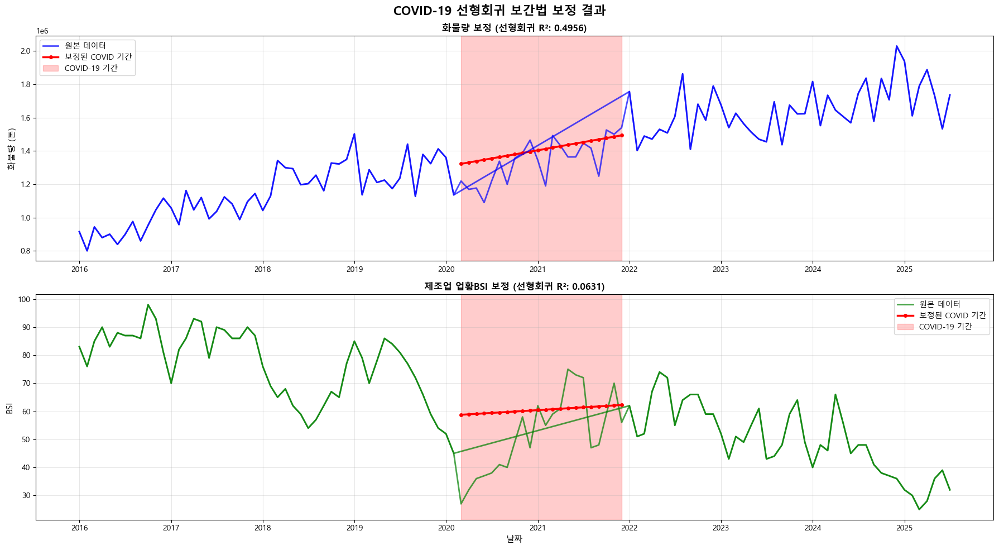

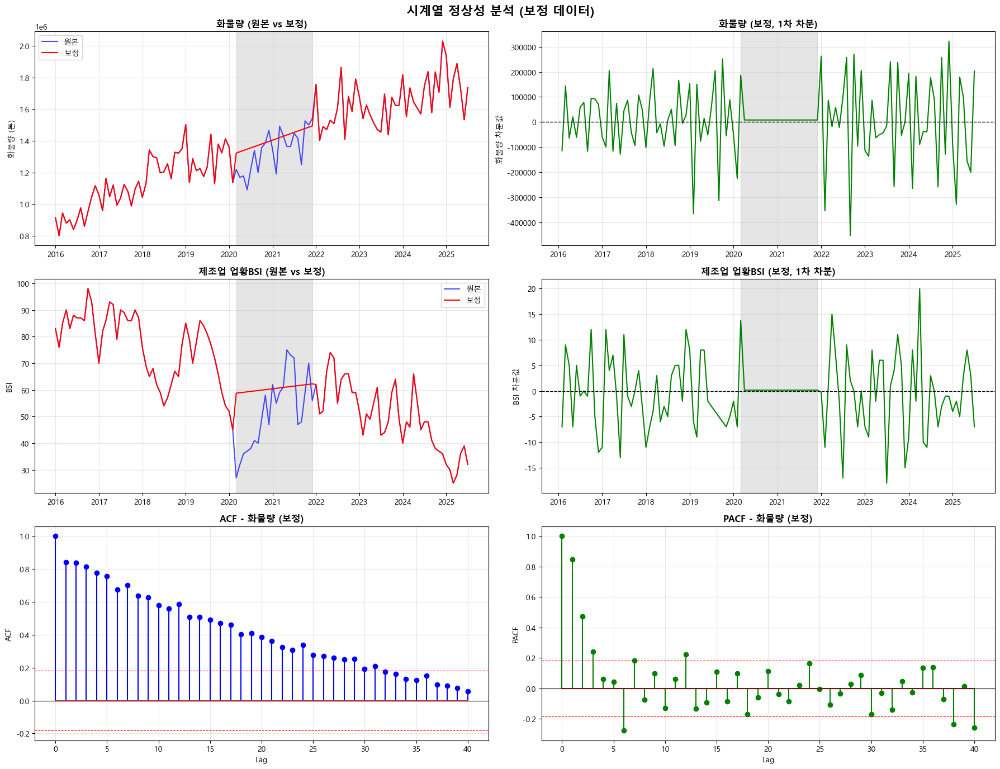

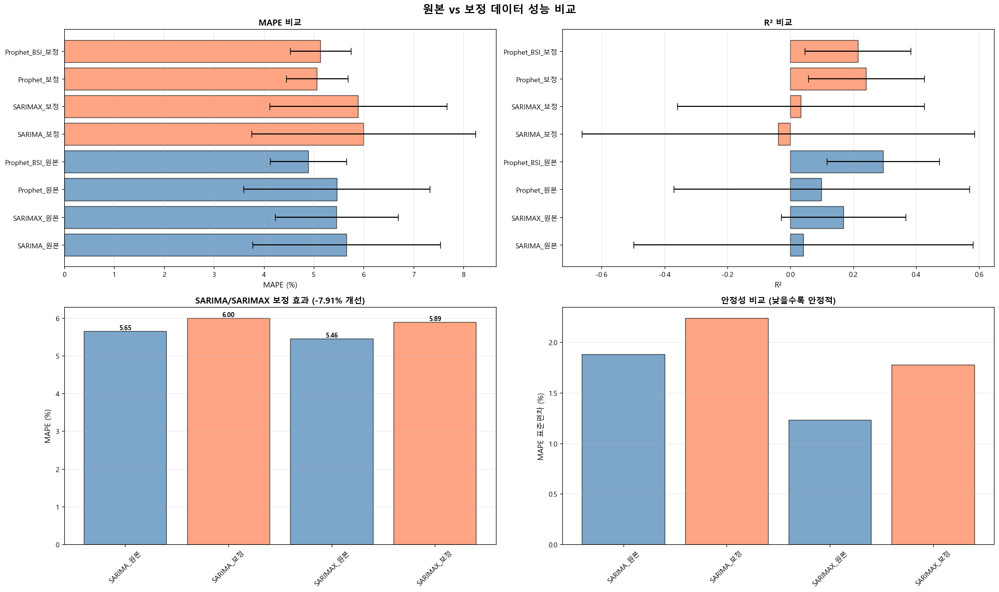

In [ ]:
"""
제주항 화물량 예측 모델 - 완전판 (선형회귀 보간법)
- ADF 검정 (정상성 검정)
- COVID-19 선형회귀 보간법으로 보정
- Rolling Origin 교차검증
- 제조업 업황BSI 외생변수
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf, pacf
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
import itertools
from scipy import stats

print("=" * 80)
print("제주항 화물량 예측 시스템 - 완전판 (선형회귀 보간법)")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df['date'].min()} ~ {df['date'].max()}")

# ========================================
# 2. COVID-19 기간 선형회귀 보간법 적용
# ========================================
print("\n[2단계] COVID-19 선형회귀 보간법 적용...")

# COVID-19 기간 설정
covid_start = pd.to_datetime('2020-03-01')
covid_end = pd.to_datetime('2021-12-01')

# 원본 데이터 백업
df['화물량_원본'] = df['화물량'].copy()
df['BSI_원본'] = df['제조업 업황BSI'].copy()

# COVID 마스크 생성
covid_mask = (df['date'] >= covid_start) & (df['date'] <= covid_end)
df['is_covid'] = covid_mask.astype(int)

print(f"COVID-19 기간: {covid_start.strftime('%Y-%m')} ~ {covid_end.strftime('%Y-%m')}")
print(f"COVID-19 영향 개월: {covid_mask.sum()}개월")

# COVID 전후 기간 통계
before_covid = df[df['date'] < covid_start]
during_covid = df[covid_mask]
after_covid = df[df['date'] > covid_end]

print(f"\n📊 화물량 통계 (원본):")
print(f"  COVID 이전 평균: {before_covid['화물량'].mean():,.0f} 톤")
print(f"  COVID 기간 평균: {during_covid['화물량'].mean():,.0f} 톤")
print(f"  COVID 이후 평균: {after_covid['화물량'].mean():,.0f} 톤")

# 선형회귀 보간 함수
def linear_regression_interpolation(df, column, covid_mask, window_before=6, window_after=6):
    """
    선형회귀를 사용하여 COVID 기간을 보간

    Parameters:
    - df: 데이터프레임
    - column: 보간할 컬럼명
    - covid_mask: COVID 기간 마스크
    - window_before: COVID 이전 참조 개월 수
    - window_after: COVID 이후 참조 개월 수
    """

    # COVID 시작/종료 인덱스
    covid_indices = df[covid_mask].index
    covid_start_idx = covid_indices[0]
    covid_end_idx = covid_indices[-1]

    # COVID 전후 정상 기간 데이터 추출
    before_start = max(0, covid_start_idx - window_before)
    after_end = min(len(df), covid_end_idx + window_after + 1)

    # 학습 데이터: COVID 전후 정상 기간
    train_indices = list(range(before_start, covid_start_idx)) + list(range(covid_end_idx + 1, after_end))

    if len(train_indices) < 4:  # 최소 데이터 필요
        print(f"  경고: {column} 학습 데이터 부족, 단순 선형 보간 사용")
        return df[column].interpolate(method='linear')

    X_train = np.array(train_indices).reshape(-1, 1)
    y_train = df.loc[train_indices, column].values

    # 선형회귀 모델 학습
    model = LinearRegression()
    model.fit(X_train, y_train)

    # COVID 기간 예측
    X_covid = np.array(covid_indices).reshape(-1, 1)
    y_covid_pred = model.predict(X_covid)

    # 보정된 데이터 생성
    corrected_series = df[column].copy()
    corrected_series.loc[covid_indices] = y_covid_pred

    # 모델 성능
    r2 = model.score(X_train, y_train)

    return corrected_series, model, r2

# 화물량 보정
print("\n🔧 화물량 선형회귀 보간 중...")
df['화물량_보정'], cargo_model, cargo_r2 = linear_regression_interpolation(
    df, '화물량_원본', covid_mask, window_before=6, window_after=6
)
print(f"  ✓ 화물량 선형회귀 R²: {cargo_r2:.4f}")
print(f"  계수: {cargo_model.coef_[0]:.2f}, 절편: {cargo_model.intercept_:.2f}")

# BSI 보정
print("\n🔧 BSI 선형회귀 보간 중...")
df['BSI_보정'], bsi_model, bsi_r2 = linear_regression_interpolation(
    df, 'BSI_원본', covid_mask, window_before=6, window_after=6
)
print(f"  ✓ BSI 선형회귀 R²: {bsi_r2:.4f}")
print(f"  계수: {bsi_model.coef_[0]:.4f}, 절편: {bsi_model.intercept_:.2f}")

# 보정 효과 확인
print(f"\n📊 보정 효과:")
print(f"  화물량 원본 (COVID 기간 평균): {during_covid['화물량_원본'].mean():,.0f} 톤")
print(f"  화물량 보정 (COVID 기간 평균): {df.loc[covid_mask, '화물량_보정'].mean():,.0f} 톤")
print(f"  차이: {df.loc[covid_mask, '화물량_보정'].mean() - during_covid['화물량_원본'].mean():,.0f} 톤")

print(f"\n  BSI 원본 (COVID 기간 평균): {during_covid['BSI_원본'].mean():.2f}")
print(f"  BSI 보정 (COVID 기간 평균): {df.loc[covid_mask, 'BSI_보정'].mean():.2f}")
print(f"  차이: {df.loc[covid_mask, 'BSI_보정'].mean() - during_covid['BSI_원본'].mean():.2f}")

# ========================================
# 3. 보정 시각화
# ========================================
print("\n[3단계] COVID-19 보정 시각화 중...")

fig1, axes1 = plt.subplots(2, 1, figsize=(18, 10))
fig1.suptitle('COVID-19 선형회귀 보간법 보정 결과', fontsize=16, fontweight='bold')

# 화물량 보정
ax1 = axes1[0]
ax1.plot(df['date'], df['화물량_원본'], label='원본 데이터', color='blue', linewidth=2, alpha=0.7)
ax1.plot(df.loc[covid_mask, 'date'], df.loc[covid_mask, '화물량_보정'],
         label='보정된 COVID 기간', color='red', linewidth=2.5, marker='o', markersize=4)
ax1.plot(df.loc[~covid_mask, 'date'], df.loc[~covid_mask, '화물량_보정'],
         color='blue', linewidth=2, alpha=0.7)
ax1.axvspan(covid_start, covid_end, alpha=0.2, color='red', label='COVID-19 기간')
ax1.set_title(f'화물량 보정 (선형회귀 R²: {cargo_r2:.4f})', fontsize=12, fontweight='bold')
ax1.set_ylabel('화물량 (톤)', fontsize=11)
ax1.legend(loc='best', fontsize=10)
ax1.grid(True, alpha=0.3)

# BSI 보정
ax2 = axes1[1]
ax2.plot(df['date'], df['BSI_원본'], label='원본 데이터', color='green', linewidth=2, alpha=0.7)
ax2.plot(df.loc[covid_mask, 'date'], df.loc[covid_mask, 'BSI_보정'],
         label='보정된 COVID 기간', color='red', linewidth=2.5, marker='o', markersize=4)
ax2.plot(df.loc[~covid_mask, 'date'], df.loc[~covid_mask, 'BSI_보정'],
         color='green', linewidth=2, alpha=0.7)
ax2.axvspan(covid_start, covid_end, alpha=0.2, color='red', label='COVID-19 기간')
ax2.set_title(f'제조업 업황BSI 보정 (선형회귀 R²: {bsi_r2:.4f})', fontsize=12, fontweight='bold')
ax2.set_ylabel('BSI', fontsize=11)
ax2.set_xlabel('날짜', fontsize=11)
ax2.legend(loc='best', fontsize=10)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/COVID19_선형회귀_보정.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/COVID19_선형회귀_보정.png")

# ========================================
# 4. ADF 검정 (보정된 데이터)
# ========================================
print("\n[4단계] ADF 검정 (보정된 데이터)...")

def adf_test(series, name):
    """ADF 검정 수행 및 결과 출력"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name} ADF 검정 결과:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Critical Values:")
    for key, value in result[4].items():
        print(f"    {key}: {value:.4f}")

    if result[1] < 0.05:
        print(f"  ✓ 정상성 만족 (p-value < 0.05)")
        return True
    else:
        print(f"  ✗ 비정상성 (p-value >= 0.05) - 차분 필요")
        return False

# 원본 데이터 ADF 검정
print("\n" + "-" * 60)
print("원본 데이터 정상성 검정")
print("-" * 60)
cargo_original_stationary = adf_test(df['화물량_원본'], "화물량 (원본)")
bsi_original_stationary = adf_test(df['BSI_원본'], "BSI (원본)")

# 보정된 데이터 ADF 검정
print("\n" + "-" * 60)
print("보정된 데이터 정상성 검정")
print("-" * 60)
cargo_corrected_stationary = adf_test(df['화물량_보정'], "화물량 (보정)")
bsi_corrected_stationary = adf_test(df['BSI_보정'], "BSI (보정)")

# 1차 차분 후 ADF 검정
print("\n" + "-" * 60)
print("1차 차분 후 정상성 검정 (보정 데이터)")
print("-" * 60)
df['화물량_보정_diff1'] = df['화물량_보정'].diff()
df['BSI_보정_diff1'] = df['BSI_보정'].diff()

cargo_diff1_stationary = adf_test(df['화물량_보정_diff1'], "화물량 (보정, 1차 차분)")
bsi_diff1_stationary = adf_test(df['BSI_보정_diff1'], "BSI (보정, 1차 차분)")

# 정상성 결과 요약
print("\n" + "=" * 60)
print("정상성 검정 요약")
print("=" * 60)
print(f"화물량 원본: {'정상' if cargo_original_stationary else '비정상'}")
print(f"화물량 보정: {'정상' if cargo_corrected_stationary else '비정상'}")
print(f"화물량 보정 1차 차분: {'정상' if cargo_diff1_stationary else '비정상'}")
print(f"BSI 원본: {'정상' if bsi_original_stationary else '비정상'}")
print(f"BSI 보정: {'정상' if bsi_corrected_stationary else '비정상'}")
print(f"BSI 보정 1차 차분: {'정상' if bsi_diff1_stationary else '비정상'}")

# SARIMA 'd' 파라미터 권장
if cargo_corrected_stationary:
    recommended_d = 0
elif cargo_diff1_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 SARIMA 'd' 파라미터: {recommended_d}")

# ========================================
# 5. 정상성 시각화
# ========================================
print("\n[5단계] 정상성 분석 시각화 중...")

fig2, axes2 = plt.subplots(3, 2, figsize=(18, 14))
fig2.suptitle('시계열 정상성 분석 (보정 데이터)', fontsize=16, fontweight='bold')

# 화물량 원본 vs 보정
ax1 = axes2[0, 0]
ax1.plot(df['date'], df['화물량_원본'], label='원본', color='blue', linewidth=1.5, alpha=0.7)
ax1.plot(df['date'], df['화물량_보정'], label='보정', color='red', linewidth=1.5)
ax1.axvspan(covid_start, covid_end, alpha=0.2, color='gray')
ax1.set_title('화물량 (원본 vs 보정)', fontsize=12, fontweight='bold')
ax1.set_ylabel('화물량 (톤)')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 화물량 1차 차분
ax2 = axes2[0, 1]
ax2.plot(df['date'], df['화물량_보정_diff1'], color='green', linewidth=1.5)
ax2.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax2.axvspan(covid_start, covid_end, alpha=0.2, color='gray')
ax2.set_title('화물량 (보정, 1차 차분)', fontsize=12, fontweight='bold')
ax2.set_ylabel('화물량 차분값')
ax2.grid(True, alpha=0.3)

# BSI 원본 vs 보정
ax3 = axes2[1, 0]
ax3.plot(df['date'], df['BSI_원본'], label='원본', color='blue', linewidth=1.5, alpha=0.7)
ax3.plot(df['date'], df['BSI_보정'], label='보정', color='red', linewidth=1.5)
ax3.axvspan(covid_start, covid_end, alpha=0.2, color='gray')
ax3.set_title('제조업 업황BSI (원본 vs 보정)', fontsize=12, fontweight='bold')
ax3.set_ylabel('BSI')
ax3.legend()
ax3.grid(True, alpha=0.3)

# BSI 1차 차분
ax4 = axes2[1, 1]
ax4.plot(df['date'], df['BSI_보정_diff1'], color='green', linewidth=1.5)
ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax4.axvspan(covid_start, covid_end, alpha=0.2, color='gray')
ax4.set_title('제조업 업황BSI (보정, 1차 차분)', fontsize=12, fontweight='bold')
ax4.set_ylabel('BSI 차분값')
ax4.grid(True, alpha=0.3)

# ACF - 화물량 (보정)
ax5 = axes2[2, 0]
acf_values = acf(df['화물량_보정'].dropna(), nlags=40)
ax5.stem(range(len(acf_values)), acf_values, linefmt='blue', markerfmt='bo')
ax5.axhline(y=0, color='black', linewidth=0.8)
ax5.axhline(y=1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax5.axhline(y=-1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax5.set_title('ACF - 화물량 (보정)', fontsize=12, fontweight='bold')
ax5.set_xlabel('Lag')
ax5.set_ylabel('ACF')
ax5.grid(True, alpha=0.3)

# PACF - 화물량 (보정)
ax6 = axes2[2, 1]
pacf_values = pacf(df['화물량_보정'].dropna(), nlags=40)
ax6.stem(range(len(pacf_values)), pacf_values, linefmt='green', markerfmt='go')
ax6.axhline(y=0, color='black', linewidth=0.8)
ax6.axhline(y=1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax6.axhline(y=-1.96/np.sqrt(len(df)), color='red', linestyle='--', linewidth=0.8)
ax6.set_title('PACF - 화물량 (보정)', fontsize=12, fontweight='bold')
ax6.set_xlabel('Lag')
ax6.set_ylabel('PACF')
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/정상성_분석_보정.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/정상성_분석_보정.png")

# ========================================
# 6. Rolling Origin 설정
# ========================================
print("\n[6단계] Rolling Origin 설정...")

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

print(f"총 데이터: {total_data}개월")
print(f"초기 학습 크기: {INITIAL_TRAIN_SIZE}개월")
print(f"테스트 윈도우: {TEST_WINDOW}개월")
print(f"스텝 크기: {STEP_SIZE}개월")

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"실제 분할 횟수: {len(splits)}회")

# ========================================
# 7. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 8. SARIMA 최적 파라미터 찾기
# ========================================
print("\n[7단계] SARIMA 최적 파라미터 탐색 중...")

first_split = splits[0]
train_data_first = df.iloc[first_split['train_start']:first_split['train_end']]

if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("최적 파라미터 탐색 중...")
for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['BSI_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f"✓ 최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# ========================================
# 9. Rolling Origin 교차검증
# ========================================
print("\n[8단계] Rolling Origin 교차검증 수행 중...")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본': [],
    'Prophet_원본': [],
    'Prophet_BSI_원본': [],
    'SARIMA_보정': [],
    'SARIMAX_보정': [],
    'Prophet_보정': [],
    'Prophet_BSI_보정': []
}

print("모델 학습 및 예측 중...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df.iloc[split['train_start']:split['train_end']]
    test_data = df.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # ========== 원본 데이터 모델 ==========

    # SARIMA 원본
    try:
        sarima_원본 = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_원본_results = sarima_원본.fit(disp=False, maxiter=100)
        sarima_원본_forecast = sarima_원본_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, sarima_원본_forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 원본
    try:
        sarimax_원본 = SARIMAX(train_data['화물량_원본'], exog=train_data[['BSI_원본']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_원본_results = sarimax_원본.fit(disp=False, maxiter=100)
        sarimax_원본_forecast = sarimax_원본_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_원본']])
        rolling_results['SARIMAX_원본'].append(evaluate_predictions(actual_원본, sarimax_원본_forecast.values))
    except:
        rolling_results['SARIMAX_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 원본
    try:
        prophet_원본_train = train_data[['date', '화물량_원본']].copy()
        prophet_원본_train.columns = ['ds', 'y']
        prophet_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_원본.fit(prophet_원본_train)
        future_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_원본_forecast = prophet_원본.predict(future_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, prophet_원본_forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 원본
    try:
        prophet_bsi_원본_train = train_data[['date', '화물량_원본', 'BSI_원본']].copy()
        prophet_bsi_원본_train.columns = ['ds', 'y', 'BSI_원본']
        prophet_bsi_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_원본.add_regressor('BSI_원본')
        prophet_bsi_원본.fit(prophet_bsi_원본_train)

        future_bsi_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_원본 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_원본 = future_bsi_원본.merge(full_data_원본[['date', 'BSI_원본']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_원본['BSI_원본'].fillna(method='ffill', inplace=True)
        prophet_bsi_원본_forecast = prophet_bsi_원본.predict(future_bsi_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_원본'].append(evaluate_predictions(actual_원본, prophet_bsi_원본_forecast))
    except:
        rolling_results['Prophet_BSI_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ========== 보정 데이터 모델 ==========

    # SARIMA 보정
    try:
        sarima_보정 = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_보정_results = sarima_보정.fit(disp=False, maxiter=100)
        sarima_보정_forecast = sarima_보정_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, sarima_보정_forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 보정
    try:
        sarimax_보정 = SARIMAX(train_data['화물량_보정'], exog=train_data[['BSI_보정']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_보정_results = sarimax_보정.fit(disp=False, maxiter=100)
        sarimax_보정_forecast = sarimax_보정_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_보정']])
        rolling_results['SARIMAX_보정'].append(evaluate_predictions(actual_보정, sarimax_보정_forecast.values))
    except:
        rolling_results['SARIMAX_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 보정
    try:
        prophet_보정_train = train_data[['date', '화물량_보정']].copy()
        prophet_보정_train.columns = ['ds', 'y']
        prophet_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_보정.fit(prophet_보정_train)
        future_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_보정_forecast = prophet_보정.predict(future_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, prophet_보정_forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 보정
    try:
        prophet_bsi_보정_train = train_data[['date', '화물량_보정', 'BSI_보정']].copy()
        prophet_bsi_보정_train.columns = ['ds', 'y', 'BSI_보정']
        prophet_bsi_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_보정.add_regressor('BSI_보정')
        prophet_bsi_보정.fit(prophet_bsi_보정_train)

        future_bsi_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_보정 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_보정 = future_bsi_보정.merge(full_data_보정[['date', 'BSI_보정']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_보정['BSI_보정'].fillna(method='ffill', inplace=True)
        prophet_bsi_보정_forecast = prophet_bsi_보정.predict(future_bsi_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_보정'].append(evaluate_predictions(actual_보정, prophet_bsi_보정_forecast))
    except:
        rolling_results['Prophet_BSI_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")
print("✓ Rolling Origin 교차검증 완료!")

# ========================================
# 10. 결과 집계
# ========================================
print("\n[9단계] 결과 집계 중...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'MAE_mean': np.mean(maes),
        'MAE_std': np.std(maes),
        'RMSE_mean': np.mean(rmses),
        'RMSE_std': np.std(rmses),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

# ========================================
# 11. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("Rolling Origin 교차검증 결과")
print("=" * 80)

print(f"\n총 {len(splits)}회 검증 수행")
print("\n📊 모델별 평균 성능 (평균 ± 표준편차)")
print("-" * 90)
print(f"{'모델':<25} {'MAPE (%)':<22} {'RMSE (톤)':<27} {'R²':<20}")
print("-" * 90)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<25} {mape_str:<22} {rmse_str:<27} {r2_str:<20}")

# ========================================
# 12. 시각화
# ========================================
print("\n[10단계] 결과 시각화 중...")

fig3, axes3 = plt.subplots(2, 2, figsize=(20, 12))
fig3.suptitle('원본 vs 보정 데이터 성능 비교', fontsize=16, fontweight='bold')

model_names = list(summary_results.keys())
mape_means = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]
r2_means = [summary_results[m]['R2_mean'] for m in model_names]
r2_stds = [summary_results[m]['R2_std'] for m in model_names]

# 원본 vs 보정 색상
colors = []
for name in model_names:
    if '원본' in name:
        colors.append('steelblue')
    else:
        colors.append('coral')

# MAPE
ax1 = axes3[0, 0]
bars1 = ax1.barh(model_names, mape_means, xerr=mape_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax1.set_xlabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교', fontsize=12, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# R²
ax2 = axes3[0, 1]
bars2 = ax2.barh(model_names, r2_means, xerr=r2_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('R²', fontsize=11)
ax2.set_title('R² 비교', fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# 보정 효과 분석 (SARIMAX)
ax3 = axes3[1, 0]
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

models_to_compare = ['SARIMA_원본', 'SARIMA_보정', 'SARIMAX_원본', 'SARIMAX_보정']
mapes_compare = [summary_results[m]['MAPE_mean'] for m in models_to_compare]
colors_compare = ['steelblue', 'coral', 'steelblue', 'coral']

bars3 = ax3.bar(models_to_compare, mapes_compare, color=colors_compare, alpha=0.7, edgecolor='black')
ax3.set_ylabel('MAPE (%)', fontsize=11)
ax3.set_title(f'SARIMA/SARIMAX 보정 효과 ({improvement:.2f}% 개선)', fontsize=12, fontweight='bold')
ax3.tick_params(axis='x', rotation=45)
ax3.grid(axis='y', alpha=0.3)

# 값 표시
for bar, mape in zip(bars3, mapes_compare):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height,
            f'{mape:.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# 안정성 비교
ax4 = axes3[1, 1]
mape_stds_filtered = [summary_results[m]['MAPE_std'] for m in models_to_compare]
bars4 = ax4.bar(models_to_compare, mape_stds_filtered, color=colors_compare, alpha=0.7, edgecolor='black')
ax4.set_ylabel('MAPE 표준편차 (%)', fontsize=11)
ax4.set_title('안정성 비교 (낮을수록 안정적)', fontsize=12, fontweight='bold')
ax4.tick_params(axis='x', rotation=45)
ax4.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/원본_vs_보정_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/원본_vs_보정_성능비교.png")

# ========================================
# 13. 결과 저장
# ========================================
print("\n[11단계] 결과 저장 중...")

# Rolling Origin 상세 결과
rolling_detail = []
for split_idx, split in enumerate(splits):
    for model_name in rolling_results.keys():
        metrics = rolling_results[model_name][split_idx]
        rolling_detail.append({
            'Split': split['split_id'],
            '모델': model_name,
            'MAPE': metrics['MAPE'],
            'MAE': metrics['MAE'],
            'RMSE': metrics['RMSE'],
            'R2': metrics['R2']
        })

rolling_detail_df = pd.DataFrame(rolling_detail)

# 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/제주항_선형회귀보간_분석리포트.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': ['총 데이터', '분석 기간', 'COVID 보간 방법', 'COVID 기간',
                '화물량 보간 R²', 'BSI 보간 R²', 'Rolling 횟수',
                'ADF 권장 d', '선택된 d', '최적 모델 (원본)', '최적 모델 (보정)'],
        '내용': [
            f"{total_data}개월",
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            '선형회귀 보간법',
            f"{covid_start.strftime('%Y-%m')} ~ {covid_end.strftime('%Y-%m')}",
            f"{cargo_r2:.4f}",
            f"{bsi_r2:.4f}",
            f"{len(splits)}회",
            str(recommended_d),
            str(best_param[1]),
            min([(k, v) for k, v in summary_results.items() if '원본' in k], key=lambda x: x[1]['MAPE_mean'])[0],
            min([(k, v) for k, v in summary_results.items() if '보정' in k], key=lambda x: x[1]['MAPE_mean'])[0]
        ]
    })
    summary_info.to_excel(writer, sheet_name='요약', index=False)

    # 평균 성능
    pd.DataFrame(summary_results).T.to_excel(writer, sheet_name='평균성능')

    # 상세 결과
    rolling_detail_df.to_excel(writer, sheet_name='상세결과', index=False)

    # 보정 데이터
    correction_df = df[['date', '화물량_원본', '화물량_보정', 'BSI_원본', 'BSI_보정', 'is_covid']].copy()
    correction_df.to_excel(writer, sheet_name='보정데이터', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/제주항_선형회귀보간_분석리포트.xlsx")

# ========================================
# 14. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/COVID19_선형회귀_보정.png")
print(f"2. {DATA_PATH}/정상성_분석_보정.png")
print(f"3. {DATA_PATH}/원본_vs_보정_성능비교.png")
print(f"4. {DATA_PATH}/제주항_선형회귀보간_분석리포트.xlsx")

print("\n🏆 최고 성능 모델 (원본 데이터)")
print("-" * 80)
best_원본 = min([(k, v) for k, v in summary_results.items() if '원본' in k], key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_원본[0]}")
print(f"MAPE: {best_원본[1]['MAPE_mean']:.2f}% (±{best_원본[1]['MAPE_std']:.2f})")
print(f"R²: {best_원본[1]['R2_mean']:.4f} (±{best_원본[1]['R2_std']:.4f})")

print("\n🏆 최고 성능 모델 (보정 데이터)")
print("-" * 80)
best_보정 = min([(k, v) for k, v in summary_results.items() if '보정' in k], key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_보정[0]}")
print(f"MAPE: {best_보정[1]['MAPE_mean']:.2f}% (±{best_보정[1]['MAPE_std']:.2f})")
print(f"R²: {best_보정[1]['R2_mean']:.4f} (±{best_보정[1]['R2_std']:.4f})")

print("\n💡 선형회귀 보간 효과 (SARIMAX 기준)")
print("-" * 80)
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

if improvement > 0:
    print(f"✓ 선형회귀 보간 적용 시 {improvement:.2f}% 성능 개선")
    print(f"  원본 MAPE: {sarimax_원본_mape:.2f}%")
    print(f"  보정 MAPE: {sarimax_보정_mape:.2f}%")
    print("✓ 보간 처리 권장!")
else:
    print(f"✗ 선형회귀 보간 적용 시 {abs(improvement):.2f}% 성능 저하")
    print(f"  원본 MAPE: {sarimax_원본_mape:.2f}%")
    print(f"  보정 MAPE: {sarimax_보정_mape:.2f}%")
    print("✗ 원본 데이터 사용 권장")

print("\n💡 보간 품질")
print("-" * 80)
print(f"화물량 선형회귀 R²: {cargo_r2:.4f}")
print(f"BSI 선형회귀 R²: {bsi_r2:.4f}")

if cargo_r2 > 0.8 and bsi_r2 > 0.8:
    print("✓ 높은 보간 품질 - 신뢰할 수 있는 보정")
elif cargo_r2 > 0.6 and bsi_r2 > 0.6:
    print("○ 중간 보간 품질 - 주의하여 사용")
else:
    print("✗ 낮은 보간 품질 - 보정 효과 제한적")

print("\n" + "=" * 80)
print("✅ 선형회귀 보간법, ADF 검정, Rolling Origin 교차검증 완료!")
print("=" * 80)

# 이상치 처리 - STL 분해 + 추세선 대체

제주항 화물량 예측 시스템 - 완전판 (STL 분해 + 추세선 대체)

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 4)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] COVID-19 STL 분해 + 추세선 대체...
COVID-19 기간: 2020-03 ~ 2021-12
COVID-19 영향 개월: 22개월

📊 화물량 통계 (원본):
  COVID 이전 평균: 1,136,619 톤
  COVID 기간 평균: 1,340,689 톤
  COVID 이후 평균: 1,648,547 톤

🔧 화물량 STL 분해 중...
  ✓ 화물량 STL 분해 R²: 1.0000
  추세 범위: 841,545 ~ 1,797,239
  계절성 범위: -187,257 ~ 178,750
  잔차 표준편차: 57,592

🔧 BSI STL 분해 중...
  ✓ BSI STL 분해 R²: 1.0000
  추세 범위: 26.5 ~ 86.7
  계절성 범위: -7.0 ~ 8.5
  잔차 표준편차: 6.01

📊 보정 효과:
  화물량 원본 (COVID 기간 평균): 1,340,689 톤
  화물량 보정 (COVID 기간 평균): 1,354,992 톤
  차이: 14,302 톤

  BSI 원본 (COVID 기간 평균): 51.91
  BSI 보정 (COVID 기간 평균): 53.61
  차이: 1.70

📊 잔차 분석 (화물량):
  정상 기간 잔차 평균: 4,204 톤
  COVID 기간 잔차 평균: -14,302 톤
  정상 기간 잔차 표준편차: 56,740 톤
  COVID 기간 잔차 표준편차: 60,096 톤

[3단계] STL 분해 시각화 중...
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/화물량_STL_분해.png
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/BSI_STL_분해.png

[4단계] ADF 검정 (보정된 데

19:24:39 - cmdstanpy - INFO - Chain [1] start processing
19:24:39 - cmdstanpy - INFO - Chain [1] done processing
19:24:40 - cmdstanpy - INFO - Chain [1] start processing
19:24:40 - cmdstanpy - INFO - Chain [1] done processing
19:24:40 - cmdstanpy - INFO - Chain [1] start processing
19:24:40 - cmdstanpy - INFO - Chain [1] done processing
19:24:40 - cmdstanpy - INFO - Chain [1] start processing
19:24:40 - cmdstanpy - INFO - Chain [1] done processing


19:24:41 - cmdstanpy - INFO - Chain [1] start processing
19:24:41 - cmdstanpy - INFO - Chain [1] done processing
19:24:41 - cmdstanpy - INFO - Chain [1] start processing
19:24:41 - cmdstanpy - INFO - Chain [1] done processing
19:24:42 - cmdstanpy - INFO - Chain [1] start processing
19:24:42 - cmdstanpy - INFO - Chain [1] done processing
19:24:42 - cmdstanpy - INFO - Chain [1] start processing
19:24:42 - cmdstanpy - INFO - Chain [1] done processing
19:24:43 - cmdstanpy - INFO - Chain [1] start processing


19:24:43 - cmdstanpy - INFO - Chain [1] done processing
19:24:43 - cmdstanpy - INFO - Chain [1] start processing
19:24:43 - cmdstanpy - INFO - Chain [1] done processing
19:24:43 - cmdstanpy - INFO - Chain [1] start processing
19:24:43 - cmdstanpy - INFO - Chain [1] done processing
19:24:44 - cmdstanpy - INFO - Chain [1] start processing
19:24:44 - cmdstanpy - INFO - Chain [1] done processing


19:24:44 - cmdstanpy - INFO - Chain [1] start processing
19:24:44 - cmdstanpy - INFO - Chain [1] done processing
19:24:44 - cmdstanpy - INFO - Chain [1] start processing
19:24:45 - cmdstanpy - INFO - Chain [1] done processing
19:24:45 - cmdstanpy - INFO - Chain [1] start processing
19:24:45 - cmdstanpy - INFO - Chain [1] done processing
19:24:45 - cmdstanpy - INFO - Chain [1] start processing
19:24:46 - cmdstanpy - INFO - Chain [1] done processing


19:24:46 - cmdstanpy - INFO - Chain [1] start processing
19:24:46 - cmdstanpy - INFO - Chain [1] done processing
19:24:46 - cmdstanpy - INFO - Chain [1] start processing
19:24:46 - cmdstanpy - INFO - Chain [1] done processing
19:24:47 - cmdstanpy - INFO - Chain [1] start processing
19:24:47 - cmdstanpy - INFO - Chain [1] done processing
19:24:47 - cmdstanpy - INFO - Chain [1] start processing
19:24:47 - cmdstanpy - INFO - Chain [1] done processing


19:24:48 - cmdstanpy - INFO - Chain [1] start processing
19:24:48 - cmdstanpy - INFO - Chain [1] done processing
19:24:48 - cmdstanpy - INFO - Chain [1] start processing
19:24:48 - cmdstanpy - INFO - Chain [1] done processing
19:24:48 - cmdstanpy - INFO - Chain [1] start processing
19:24:49 - cmdstanpy - INFO - Chain [1] done processing
19:24:49 - cmdstanpy - INFO - Chain [1] start processing
19:24:49 - cmdstanpy - INFO - Chain [1] done processing


19:24:49 - cmdstanpy - INFO - Chain [1] start processing
19:24:49 - cmdstanpy - INFO - Chain [1] done processing
19:24:49 - cmdstanpy - INFO - Chain [1] start processing
19:24:50 - cmdstanpy - INFO - Chain [1] done processing
19:24:50 - cmdstanpy - INFO - Chain [1] start processing
19:24:50 - cmdstanpy - INFO - Chain [1] done processing
19:24:50 - cmdstanpy - INFO - Chain [1] start processing
19:24:51 - cmdstanpy - INFO - Chain [1] done processing


19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:51 - cmdstanpy - INFO - Chain [1] done processing
19:24:51 - cmdstanpy - INFO - Chain [1] start processing
19:24:52 - cmdstanpy - INFO - Chain [1] done processing
19:24:52 - cmdstanpy - INFO - Chain [1] start processing
19:24:52 - cmdstanpy - INFO - Chain [1] done processing
19:24:52 - cmdstanpy - INFO - Chain [1] start processing
19:24:53 - cmdstanpy - INFO - Chain [1] done processing


19:24:53 - cmdstanpy - INFO - Chain [1] start processing
19:24:53 - cmdstanpy - INFO - Chain [1] done processing
19:24:53 - cmdstanpy - INFO - Chain [1] start processing
19:24:53 - cmdstanpy - INFO - Chain [1] done processing
19:24:54 - cmdstanpy - INFO - Chain [1] start processing
19:24:54 - cmdstanpy - INFO - Chain [1] done processing
19:24:54 - cmdstanpy - INFO - Chain [1] start processing
19:24:54 - cmdstanpy - INFO - Chain [1] done processing


19:24:55 - cmdstanpy - INFO - Chain [1] start processing
19:24:55 - cmdstanpy - INFO - Chain [1] done processing
19:24:55 - cmdstanpy - INFO - Chain [1] start processing
19:24:55 - cmdstanpy - INFO - Chain [1] done processing
19:24:55 - cmdstanpy - INFO - Chain [1] start processing
19:24:56 - cmdstanpy - INFO - Chain [1] done processing
19:24:56 - cmdstanpy - INFO - Chain [1] start processing
19:24:56 - cmdstanpy - INFO - Chain [1] done processing


19:24:56 - cmdstanpy - INFO - Chain [1] start processing
19:24:56 - cmdstanpy - INFO - Chain [1] done processing
19:24:56 - cmdstanpy - INFO - Chain [1] start processing
19:24:56 - cmdstanpy - INFO - Chain [1] done processing
19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing
19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing


19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing
19:24:57 - cmdstanpy - INFO - Chain [1] start processing
19:24:57 - cmdstanpy - INFO - Chain [1] done processing
19:24:58 - cmdstanpy - INFO - Chain [1] start processing
19:24:58 - cmdstanpy - INFO - Chain [1] done processing
19:24:58 - cmdstanpy - INFO - Chain [1] start processing
19:24:58 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         
✓ Rolling Origin 교차검증 완료!

[8단계] 결과 집계 중...

Rolling Origin 교차검증 결과

총 12회 검증 수행

📊 모델별 평균 성능 (평균 ± 표준편차)
------------------------------------------------------------------------------------------
모델                        MAPE (%)               RMSE (톤)                    R²                  
------------------------------------------------------------------------------------------
SARIMA_원본                 5.65 ± 1.88            113,656 ± 25,269            0.0412 ± 0.5400     
SARIMAX_원본                5.46 ± 1.23            110,640 ± 16,010            0.1689 ± 0.1985     
Prophet_원본                5.46 ± 1.87            110,845 ± 29,880            0.0990 ± 0.4697     
Prophet_BSI_원본            4.89 ± 0.77            103,262 ± 20,918            0.2955 ± 0.1789     
SARIMA_보정                 5.62 ± 1.82            113,061 ± 25,957            0.0231 ± 0.6337     
SARIMAX_보정                5.35 ± 1.23            108,471 ± 16,578            0.1622 ± 0.3562     

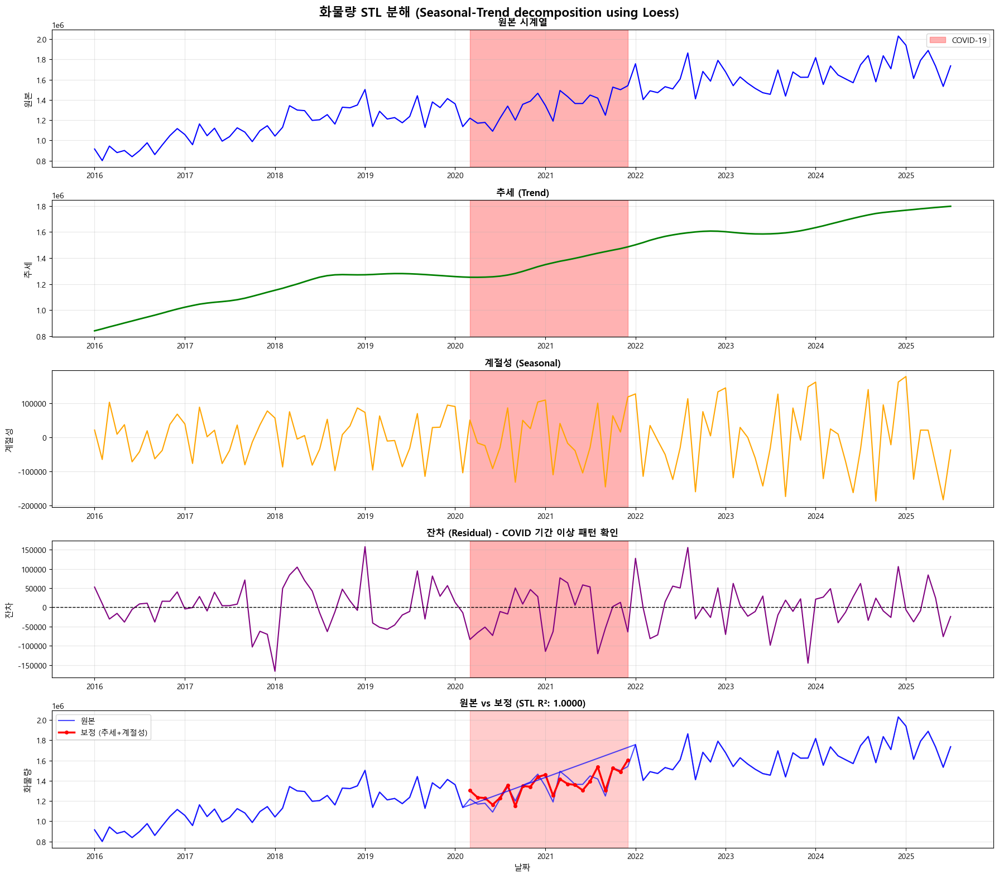

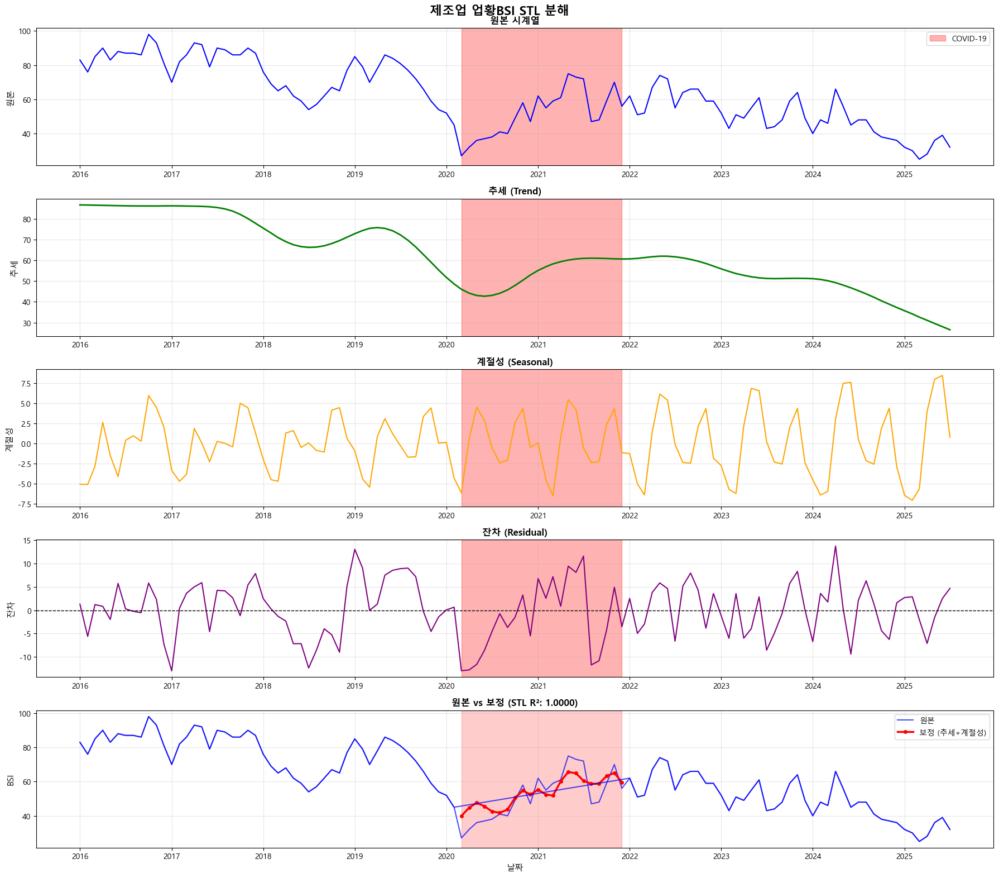

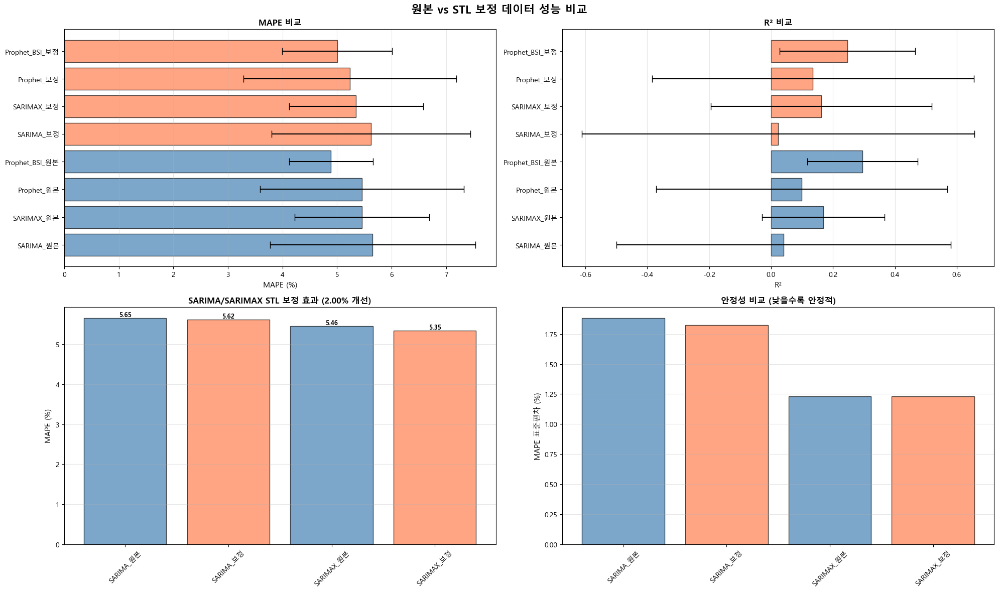

In [ ]:
"""
제주항 화물량 예측 모델 - 완전판 (STL 분해 + 추세선 대체)
- ADF 검정 (정상성 검정)
- COVID-19 STL 분해 후 추세선 대체
- Rolling Origin 교차검증
- 제조업 업황BSI 외생변수
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.seasonal import STL
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 화물량 예측 시스템 - 완전판 (STL 분해 + 추세선 대체)")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

# 인덱스를 날짜로 설정 (STL 분해에 필요)
df = df.set_index('date')
df.index.freq = 'MS'  # 월초 주기 설정

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df.index.min()} ~ {df.index.max()}")

# ========================================
# 2. COVID-19 기간 STL 분해 + 추세선 대체
# ========================================
print("\n[2단계] COVID-19 STL 분해 + 추세선 대체...")

# COVID-19 기간 설정
covid_start = pd.to_datetime('2020-03-01')
covid_end = pd.to_datetime('2021-12-01')

# 원본 데이터 백업
df['화물량_원본'] = df['화물량'].copy()
df['BSI_원본'] = df['제조업 업황BSI'].copy()

# COVID 마스크 생성
covid_mask = (df.index >= covid_start) & (df.index <= covid_end)
df['is_covid'] = covid_mask.astype(int)

print(f"COVID-19 기간: {covid_start.strftime('%Y-%m')} ~ {covid_end.strftime('%Y-%m')}")
print(f"COVID-19 영향 개월: {covid_mask.sum()}개월")

# COVID 전후 기간 통계
before_covid = df[df.index < covid_start]
during_covid = df[covid_mask]
after_covid = df[df.index > covid_end]

print(f"\n📊 화물량 통계 (원본):")
print(f"  COVID 이전 평균: {before_covid['화물량'].mean():,.0f} 톤")
print(f"  COVID 기간 평균: {during_covid['화물량'].mean():,.0f} 톤")
print(f"  COVID 이후 평균: {after_covid['화물량'].mean():,.0f} 톤")

# STL 분해 함수
def stl_decomposition_correction(series, covid_mask, period=12, seasonal=13):
    """
    STL 분해를 사용하여 COVID 기간을 추세선으로 대체

    Parameters:
    - series: 시계열 데이터 (pandas Series with DatetimeIndex)
    - covid_mask: COVID 기간 마스크
    - period: 계절성 주기 (월별 데이터는 12)
    - seasonal: STL의 seasonal 파라미터 (홀수여야 함)

    Returns:
    - corrected_series: 보정된 시계열
    - stl_result: STL 분해 결과
    """

    # STL 분해
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    # 분해 결과
    trend = stl_result.trend
    seasonal = stl_result.seasonal
    resid = stl_result.resid

    # COVID 기간을 추세 + 계절성으로 대체 (잔차 제거)
    corrected_series = series.copy()
    corrected_series[covid_mask] = trend[covid_mask] + seasonal[covid_mask]

    return corrected_series, stl_result

# 화물량 STL 분해 및 보정
print("\n🔧 화물량 STL 분해 중...")
df['화물량_보정'], cargo_stl = stl_decomposition_correction(
    df['화물량_원본'],
    covid_mask,
    period=12,
    seasonal=13
)

# STL 분해 품질 평가 (원본 vs 재구성)
cargo_reconstructed = cargo_stl.trend + cargo_stl.seasonal + cargo_stl.resid
cargo_r2 = 1 - (np.sum((df['화물량_원본'] - cargo_reconstructed)**2) /
                np.sum((df['화물량_원본'] - df['화물량_원본'].mean())**2))

print(f"  ✓ 화물량 STL 분해 R²: {cargo_r2:.4f}")
print(f"  추세 범위: {cargo_stl.trend.min():,.0f} ~ {cargo_stl.trend.max():,.0f}")
print(f"  계절성 범위: {cargo_stl.seasonal.min():,.0f} ~ {cargo_stl.seasonal.max():,.0f}")
print(f"  잔차 표준편차: {cargo_stl.resid.std():,.0f}")

# BSI STL 분해 및 보정
print("\n🔧 BSI STL 분해 중...")
df['BSI_보정'], bsi_stl = stl_decomposition_correction(
    df['BSI_원본'],
    covid_mask,
    period=12,
    seasonal=13
)

# STL 분해 품질 평가
bsi_reconstructed = bsi_stl.trend + bsi_stl.seasonal + bsi_stl.resid
bsi_r2 = 1 - (np.sum((df['BSI_원본'] - bsi_reconstructed)**2) /
              np.sum((df['BSI_원본'] - df['BSI_원본'].mean())**2))

print(f"  ✓ BSI STL 분해 R²: {bsi_r2:.4f}")
print(f"  추세 범위: {bsi_stl.trend.min():.1f} ~ {bsi_stl.trend.max():.1f}")
print(f"  계절성 범위: {bsi_stl.seasonal.min():.1f} ~ {bsi_stl.seasonal.max():.1f}")
print(f"  잔차 표준편차: {bsi_stl.resid.std():.2f}")

# 보정 효과 확인
print(f"\n📊 보정 효과:")
print(f"  화물량 원본 (COVID 기간 평균): {during_covid['화물량_원본'].mean():,.0f} 톤")
print(f"  화물량 보정 (COVID 기간 평균): {df.loc[covid_mask, '화물량_보정'].mean():,.0f} 톤")
print(f"  차이: {df.loc[covid_mask, '화물량_보정'].mean() - during_covid['화물량_원본'].mean():,.0f} 톤")

print(f"\n  BSI 원본 (COVID 기간 평균): {during_covid['BSI_원본'].mean():.2f}")
print(f"  BSI 보정 (COVID 기간 평균): {df.loc[covid_mask, 'BSI_보정'].mean():.2f}")
print(f"  차이: {df.loc[covid_mask, 'BSI_보정'].mean() - during_covid['BSI_원본'].mean():.2f}")

# COVID 기간 잔차 분석
covid_cargo_resid = cargo_stl.resid[covid_mask]
normal_cargo_resid = cargo_stl.resid[~covid_mask]

print(f"\n📊 잔차 분석 (화물량):")
print(f"  정상 기간 잔차 평균: {normal_cargo_resid.mean():,.0f} 톤")
print(f"  COVID 기간 잔차 평균: {covid_cargo_resid.mean():,.0f} 톤")
print(f"  정상 기간 잔차 표준편차: {normal_cargo_resid.std():,.0f} 톤")
print(f"  COVID 기간 잔차 표준편차: {covid_cargo_resid.std():,.0f} 톤")

# ========================================
# 3. STL 분해 시각화
# ========================================
print("\n[3단계] STL 분해 시각화 중...")

# 화물량 STL 분해
fig1, axes1 = plt.subplots(5, 1, figsize=(18, 16))
fig1.suptitle('화물량 STL 분해 (Seasonal-Trend decomposition using Loess)',
              fontsize=16, fontweight='bold')

# 원본
ax1 = axes1[0]
ax1.plot(df.index, df['화물량_원본'], color='blue', linewidth=1.5)
ax1.axvspan(covid_start, covid_end, alpha=0.3, color='red', label='COVID-19')
ax1.set_ylabel('원본', fontsize=11)
ax1.set_title('원본 시계열', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 추세
ax2 = axes1[1]
ax2.plot(df.index, cargo_stl.trend, color='green', linewidth=2)
ax2.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax2.set_ylabel('추세', fontsize=11)
ax2.set_title('추세 (Trend)', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3)

# 계절성
ax3 = axes1[2]
ax3.plot(df.index, cargo_stl.seasonal, color='orange', linewidth=1.5)
ax3.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax3.set_ylabel('계절성', fontsize=11)
ax3.set_title('계절성 (Seasonal)', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)

# 잔차
ax4 = axes1[3]
ax4.plot(df.index, cargo_stl.resid, color='purple', linewidth=1.5)
ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax4.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax4.set_ylabel('잔차', fontsize=11)
ax4.set_title('잔차 (Residual) - COVID 기간 이상 패턴 확인', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3)

# 원본 vs 보정
ax5 = axes1[4]
ax5.plot(df.index, df['화물량_원본'], label='원본', color='blue', linewidth=1.5, alpha=0.7)
ax5.plot(df.index[covid_mask], df.loc[covid_mask, '화물량_보정'],
         label='보정 (추세+계절성)', color='red', linewidth=2.5, marker='o', markersize=4)
ax5.plot(df.index[~covid_mask], df.loc[~covid_mask, '화물량_보정'],
         color='blue', linewidth=1.5, alpha=0.7)
ax5.axvspan(covid_start, covid_end, alpha=0.2, color='red')
ax5.set_ylabel('화물량', fontsize=11)
ax5.set_xlabel('날짜', fontsize=11)
ax5.set_title(f'원본 vs 보정 (STL R²: {cargo_r2:.4f})', fontsize=12, fontweight='bold')
ax5.legend(loc='best', fontsize=10)
ax5.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/화물량_STL_분해.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/화물량_STL_분해.png")

# BSI STL 분해
fig2, axes2 = plt.subplots(5, 1, figsize=(18, 16))
fig2.suptitle('제조업 업황BSI STL 분해', fontsize=16, fontweight='bold')

# 원본
ax1 = axes2[0]
ax1.plot(df.index, df['BSI_원본'], color='blue', linewidth=1.5)
ax1.axvspan(covid_start, covid_end, alpha=0.3, color='red', label='COVID-19')
ax1.set_ylabel('원본', fontsize=11)
ax1.set_title('원본 시계열', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 추세
ax2 = axes2[1]
ax2.plot(df.index, bsi_stl.trend, color='green', linewidth=2)
ax2.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax2.set_ylabel('추세', fontsize=11)
ax2.set_title('추세 (Trend)', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3)

# 계절성
ax3 = axes2[2]
ax3.plot(df.index, bsi_stl.seasonal, color='orange', linewidth=1.5)
ax3.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax3.set_ylabel('계절성', fontsize=11)
ax3.set_title('계절성 (Seasonal)', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)

# 잔차
ax4 = axes2[3]
ax4.plot(df.index, bsi_stl.resid, color='purple', linewidth=1.5)
ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax4.axvspan(covid_start, covid_end, alpha=0.3, color='red')
ax4.set_ylabel('잔차', fontsize=11)
ax4.set_title('잔차 (Residual)', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3)

# 원본 vs 보정
ax5 = axes2[4]
ax5.plot(df.index, df['BSI_원본'], label='원본', color='blue', linewidth=1.5, alpha=0.7)
ax5.plot(df.index[covid_mask], df.loc[covid_mask, 'BSI_보정'],
         label='보정 (추세+계절성)', color='red', linewidth=2.5, marker='o', markersize=4)
ax5.plot(df.index[~covid_mask], df.loc[~covid_mask, 'BSI_보정'],
         color='blue', linewidth=1.5, alpha=0.7)
ax5.axvspan(covid_start, covid_end, alpha=0.2, color='red')
ax5.set_ylabel('BSI', fontsize=11)
ax5.set_xlabel('날짜', fontsize=11)
ax5.set_title(f'원본 vs 보정 (STL R²: {bsi_r2:.4f})', fontsize=12, fontweight='bold')
ax5.legend(loc='best', fontsize=10)
ax5.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/BSI_STL_분해.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/BSI_STL_분해.png")

# ========================================
# 4. ADF 검정 (보정된 데이터)
# ========================================
print("\n[4단계] ADF 검정 (보정된 데이터)...")

def adf_test(series, name):
    """ADF 검정 수행 및 결과 출력"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name} ADF 검정 결과:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Critical Values:")
    for key, value in result[4].items():
        print(f"    {key}: {value:.4f}")

    if result[1] < 0.05:
        print(f"  ✓ 정상성 만족 (p-value < 0.05)")
        return True
    else:
        print(f"  ✗ 비정상성 (p-value >= 0.05) - 차분 필요")
        return False

# 원본 데이터 ADF 검정
print("\n" + "-" * 60)
print("원본 데이터 정상성 검정")
print("-" * 60)
cargo_original_stationary = adf_test(df['화물량_원본'], "화물량 (원본)")
bsi_original_stationary = adf_test(df['BSI_원본'], "BSI (원본)")

# 보정된 데이터 ADF 검정
print("\n" + "-" * 60)
print("보정된 데이터 정상성 검정")
print("-" * 60)
cargo_corrected_stationary = adf_test(df['화물량_보정'], "화물량 (STL 보정)")
bsi_corrected_stationary = adf_test(df['BSI_보정'], "BSI (STL 보정)")

# 1차 차분 후 ADF 검정
print("\n" + "-" * 60)
print("1차 차분 후 정상성 검정 (보정 데이터)")
print("-" * 60)
df['화물량_보정_diff1'] = df['화물량_보정'].diff()
df['BSI_보정_diff1'] = df['BSI_보정'].diff()

cargo_diff1_stationary = adf_test(df['화물량_보정_diff1'], "화물량 (STL 보정, 1차 차분)")
bsi_diff1_stationary = adf_test(df['BSI_보정_diff1'], "BSI (STL 보정, 1차 차분)")

# 정상성 결과 요약
print("\n" + "=" * 60)
print("정상성 검정 요약")
print("=" * 60)
print(f"화물량 원본: {'정상' if cargo_original_stationary else '비정상'}")
print(f"화물량 STL 보정: {'정상' if cargo_corrected_stationary else '비정상'}")
print(f"화물량 보정 1차 차분: {'정상' if cargo_diff1_stationary else '비정상'}")
print(f"BSI 원본: {'정상' if bsi_original_stationary else '비정상'}")
print(f"BSI STL 보정: {'정상' if bsi_corrected_stationary else '비정상'}")
print(f"BSI 보정 1차 차분: {'정상' if bsi_diff1_stationary else '비정상'}")

# SARIMA 'd' 파라미터 권장
if cargo_corrected_stationary:
    recommended_d = 0
elif cargo_diff1_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 SARIMA 'd' 파라미터: {recommended_d}")

# ========================================
# 5. Rolling Origin 설정
# ========================================
print("\n[5단계] Rolling Origin 설정...")

# 인덱스를 정수로 리셋 (Rolling Origin에 필요)
df_reset = df.reset_index()

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df_reset)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

print(f"총 데이터: {total_data}개월")
print(f"초기 학습 크기: {INITIAL_TRAIN_SIZE}개월")
print(f"테스트 윈도우: {TEST_WINDOW}개월")
print(f"스텝 크기: {STEP_SIZE}개월")

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"실제 분할 횟수: {len(splits)}회")

# ========================================
# 6. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 7. SARIMA 최적 파라미터 찾기
# ========================================
print("\n[6단계] SARIMA 최적 파라미터 탐색 중...")

first_split = splits[0]
train_data_first = df_reset.iloc[first_split['train_start']:first_split['train_end']]

if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("최적 파라미터 탐색 중...")
for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['BSI_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f"✓ 최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# ========================================
# 8. Rolling Origin 교차검증
# ========================================
print("\n[7단계] Rolling Origin 교차검증 수행 중...")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본': [],
    'Prophet_원본': [],
    'Prophet_BSI_원본': [],
    'SARIMA_보정': [],
    'SARIMAX_보정': [],
    'Prophet_보정': [],
    'Prophet_BSI_보정': []
}

print("모델 학습 및 예측 중...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df_reset.iloc[split['train_start']:split['train_end']]
    test_data = df_reset.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # ========== 원본 데이터 모델 ==========

    # SARIMA 원본
    try:
        sarima_원본 = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_원본_results = sarima_원본.fit(disp=False, maxiter=100)
        sarima_원본_forecast = sarima_원본_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, sarima_원본_forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 원본
    try:
        sarimax_원본 = SARIMAX(train_data['화물량_원본'], exog=train_data[['BSI_원본']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_원본_results = sarimax_원본.fit(disp=False, maxiter=100)
        sarimax_원본_forecast = sarimax_원본_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_원본']])
        rolling_results['SARIMAX_원본'].append(evaluate_predictions(actual_원본, sarimax_원본_forecast.values))
    except:
        rolling_results['SARIMAX_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 원본
    try:
        prophet_원본_train = train_data[['date', '화물량_원본']].copy()
        prophet_원본_train.columns = ['ds', 'y']
        prophet_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_원본.fit(prophet_원본_train)
        future_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_원본_forecast = prophet_원본.predict(future_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, prophet_원본_forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 원본
    try:
        prophet_bsi_원본_train = train_data[['date', '화물량_원본', 'BSI_원본']].copy()
        prophet_bsi_원본_train.columns = ['ds', 'y', 'BSI_원본']
        prophet_bsi_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_원본.add_regressor('BSI_원본')
        prophet_bsi_원본.fit(prophet_bsi_원본_train)

        future_bsi_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_원본 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_원본 = future_bsi_원본.merge(full_data_원본[['date', 'BSI_원본']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_원본['BSI_원본'].fillna(method='ffill', inplace=True)
        prophet_bsi_원본_forecast = prophet_bsi_원본.predict(future_bsi_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_원본'].append(evaluate_predictions(actual_원본, prophet_bsi_원본_forecast))
    except:
        rolling_results['Prophet_BSI_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ========== 보정 데이터 모델 ==========

    # SARIMA 보정
    try:
        sarima_보정 = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_보정_results = sarima_보정.fit(disp=False, maxiter=100)
        sarima_보정_forecast = sarima_보정_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, sarima_보정_forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 보정
    try:
        sarimax_보정 = SARIMAX(train_data['화물량_보정'], exog=train_data[['BSI_보정']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_보정_results = sarimax_보정.fit(disp=False, maxiter=100)
        sarimax_보정_forecast = sarimax_보정_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_보정']])
        rolling_results['SARIMAX_보정'].append(evaluate_predictions(actual_보정, sarimax_보정_forecast.values))
    except:
        rolling_results['SARIMAX_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 보정
    try:
        prophet_보정_train = train_data[['date', '화물량_보정']].copy()
        prophet_보정_train.columns = ['ds', 'y']
        prophet_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_보정.fit(prophet_보정_train)
        future_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_보정_forecast = prophet_보정.predict(future_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, prophet_보정_forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 보정
    try:
        prophet_bsi_보정_train = train_data[['date', '화물량_보정', 'BSI_보정']].copy()
        prophet_bsi_보정_train.columns = ['ds', 'y', 'BSI_보정']
        prophet_bsi_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_보정.add_regressor('BSI_보정')
        prophet_bsi_보정.fit(prophet_bsi_보정_train)

        future_bsi_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_보정 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_보정 = future_bsi_보정.merge(full_data_보정[['date', 'BSI_보정']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_보정['BSI_보정'].fillna(method='ffill', inplace=True)
        prophet_bsi_보정_forecast = prophet_bsi_보정.predict(future_bsi_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_보정'].append(evaluate_predictions(actual_보정, prophet_bsi_보정_forecast))
    except:
        rolling_results['Prophet_BSI_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")
print("✓ Rolling Origin 교차검증 완료!")

# ========================================
# 9. 결과 집계
# ========================================
print("\n[8단계] 결과 집계 중...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'MAE_mean': np.mean(maes),
        'MAE_std': np.std(maes),
        'RMSE_mean': np.mean(rmses),
        'RMSE_std': np.std(rmses),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

# ========================================
# 10. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("Rolling Origin 교차검증 결과")
print("=" * 80)

print(f"\n총 {len(splits)}회 검증 수행")
print("\n📊 모델별 평균 성능 (평균 ± 표준편차)")
print("-" * 90)
print(f"{'모델':<25} {'MAPE (%)':<22} {'RMSE (톤)':<27} {'R²':<20}")
print("-" * 90)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<25} {mape_str:<22} {rmse_str:<27} {r2_str:<20}")

# ========================================
# 11. 시각화
# ========================================
print("\n[9단계] 결과 시각화 중...")

fig3, axes3 = plt.subplots(2, 2, figsize=(20, 12))
fig3.suptitle('원본 vs STL 보정 데이터 성능 비교', fontsize=16, fontweight='bold')

model_names = list(summary_results.keys())
mape_means = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]
r2_means = [summary_results[m]['R2_mean'] for m in model_names]
r2_stds = [summary_results[m]['R2_std'] for m in model_names]

# 원본 vs 보정 색상
colors = []
for name in model_names:
    if '원본' in name:
        colors.append('steelblue')
    else:
        colors.append('coral')

# MAPE
ax1 = axes3[0, 0]
bars1 = ax1.barh(model_names, mape_means, xerr=mape_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax1.set_xlabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교', fontsize=12, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# R²
ax2 = axes3[0, 1]
bars2 = ax2.barh(model_names, r2_means, xerr=r2_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('R²', fontsize=11)
ax2.set_title('R² 비교', fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# STL 보정 효과 분석 (SARIMAX)
ax3 = axes3[1, 0]
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

models_to_compare = ['SARIMA_원본', 'SARIMA_보정', 'SARIMAX_원본', 'SARIMAX_보정']
mapes_compare = [summary_results[m]['MAPE_mean'] for m in models_to_compare]
colors_compare = ['steelblue', 'coral', 'steelblue', 'coral']

bars3 = ax3.bar(models_to_compare, mapes_compare, color=colors_compare, alpha=0.7, edgecolor='black')
ax3.set_ylabel('MAPE (%)', fontsize=11)
ax3.set_title(f'SARIMA/SARIMAX STL 보정 효과 ({improvement:.2f}% 개선)', fontsize=12, fontweight='bold')
ax3.tick_params(axis='x', rotation=45)
ax3.grid(axis='y', alpha=0.3)

# 값 표시
for bar, mape in zip(bars3, mapes_compare):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height,
            f'{mape:.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# 안정성 비교
ax4 = axes3[1, 1]
mape_stds_filtered = [summary_results[m]['MAPE_std'] for m in models_to_compare]
bars4 = ax4.bar(models_to_compare, mape_stds_filtered, color=colors_compare, alpha=0.7, edgecolor='black')
ax4.set_ylabel('MAPE 표준편차 (%)', fontsize=11)
ax4.set_title('안정성 비교 (낮을수록 안정적)', fontsize=12, fontweight='bold')
ax4.tick_params(axis='x', rotation=45)
ax4.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/원본_vs_STL보정_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/원본_vs_STL보정_성능비교.png")

# ========================================
# 12. 결과 저장
# ========================================
print("\n[10단계] 결과 저장 중...")

# Rolling Origin 상세 결과
rolling_detail = []
for split_idx, split in enumerate(splits):
    for model_name in rolling_results.keys():
        metrics = rolling_results[model_name][split_idx]
        rolling_detail.append({
            'Split': split['split_id'],
            '모델': model_name,
            'MAPE': metrics['MAPE'],
            'MAE': metrics['MAE'],
            'RMSE': metrics['RMSE'],
            'R2': metrics['R2']
        })

rolling_detail_df = pd.DataFrame(rolling_detail)

# 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/제주항_STL분해_분석리포트.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': ['총 데이터', '분석 기간', 'COVID 보정 방법', 'COVID 기간',
                '화물량 STL R²', 'BSI STL R²', 'Rolling 횟수',
                'ADF 권장 d', '선택된 d', '최적 모델 (원본)', '최적 모델 (보정)'],
        '내용': [
            f"{total_data}개월",
            f"{df_reset['date'].min().strftime('%Y-%m')} ~ {df_reset['date'].max().strftime('%Y-%m')}",
            'STL 분해 + 추세선 대체',
            f"{covid_start.strftime('%Y-%m')} ~ {covid_end.strftime('%Y-%m')}",
            f"{cargo_r2:.4f}",
            f"{bsi_r2:.4f}",
            f"{len(splits)}회",
            str(recommended_d),
            str(best_param[1]),
            min([(k, v) for k, v in summary_results.items() if '원본' in k], key=lambda x: x[1]['MAPE_mean'])[0],
            min([(k, v) for k, v in summary_results.items() if '보정' in k], key=lambda x: x[1]['MAPE_mean'])[0]
        ]
    })
    summary_info.to_excel(writer, sheet_name='요약', index=False)

    # 평균 성능
    pd.DataFrame(summary_results).T.to_excel(writer, sheet_name='평균성능')

    # 상세 결과
    rolling_detail_df.to_excel(writer, sheet_name='상세결과', index=False)

    # 보정 데이터
    correction_df = df_reset[['date', '화물량_원본', '화물량_보정', 'BSI_원본', 'BSI_보정', 'is_covid']].copy()
    correction_df.to_excel(writer, sheet_name='보정데이터', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/제주항_STL분해_분석리포트.xlsx")

# ========================================
# 13. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/화물량_STL_분해.png")
print(f"2. {DATA_PATH}/BSI_STL_분해.png")
print(f"3. {DATA_PATH}/원본_vs_STL보정_성능비교.png")
print(f"4. {DATA_PATH}/제주항_STL분해_분석리포트.xlsx")

print("\n🏆 최고 성능 모델 (원본 데이터)")
print("-" * 80)
best_원본 = min([(k, v) for k, v in summary_results.items() if '원본' in k], key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_원본[0]}")
print(f"MAPE: {best_원본[1]['MAPE_mean']:.2f}% (±{best_원본[1]['MAPE_std']:.2f})")
print(f"R²: {best_원본[1]['R2_mean']:.4f} (±{best_원본[1]['R2_std']:.4f})")

print("\n🏆 최고 성능 모델 (STL 보정 데이터)")
print("-" * 80)
best_보정 = min([(k, v) for k, v in summary_results.items() if '보정' in k], key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_보정[0]}")
print(f"MAPE: {best_보정[1]['MAPE_mean']:.2f}% (±{best_보정[1]['MAPE_std']:.2f})")
print(f"R²: {best_보정[1]['R2_mean']:.4f} (±{best_보정[1]['R2_std']:.4f})")

print("\n💡 STL 분해 보정 효과 (SARIMAX 기준)")
print("-" * 80)
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

if improvement > 0:
    print(f"✓ STL 보정 적용 시 {improvement:.2f}% 성능 개선")
    print(f"  원본 MAPE: {sarimax_원본_mape:.2f}%")
    print(f"  보정 MAPE: {sarimax_보정_mape:.2f}%")
    print("✓ STL 보정 처리 권장!")
else:
    print(f"✗ STL 보정 적용 시 {abs(improvement):.2f}% 성능 저하")
    print(f"  원본 MAPE: {sarimax_원본_mape:.2f}%")
    print(f"  보정 MAPE: {sarimax_보정_mape:.2f}%")
    print("✗ 원본 데이터 사용 권장")

print("\n💡 STL 분해 품질")
print("-" * 80)
print(f"화물량 STL 분해 R²: {cargo_r2:.4f}")
print(f"BSI STL 분해 R²: {bsi_r2:.4f}")

if cargo_r2 > 0.9 and bsi_r2 > 0.9:
    print("✓ 매우 높은 분해 품질 - 신뢰할 수 있는 보정")
elif cargo_r2 > 0.8 and bsi_r2 > 0.8:
    print("✓ 높은 분해 품질 - 신뢰할 수 있는 보정")
elif cargo_r2 > 0.6 and bsi_r2 > 0.6:
    print("○ 중간 분해 품질 - 주의하여 사용")
else:
    print("✗ 낮은 분해 품질 - 보정 효과 제한적")

print("\n💡 COVID 기간 이상치 특성")
print("-" * 80)
print(f"정상 기간 잔차 표준편차: {normal_cargo_resid.std():,.0f} 톤")
print(f"COVID 기간 잔차 표준편차: {covid_cargo_resid.std():,.0f} 톤")
ratio = covid_cargo_resid.std() / normal_cargo_resid.std()
print(f"COVID/정상 비율: {ratio:.2f}배")

if ratio > 2:
    print("✓ COVID 기간 잔차가 매우 크게 증가 - 보정 필요성 높음")
elif ratio > 1.5:
    print("○ COVID 기간 잔차가 증가 - 보정 고려")
else:
    print("✗ COVID 기간 잔차 변화 미미 - 보정 효과 제한적")

print("\n" + "=" * 80)
print("✅ STL 분해 보정, ADF 검정, Rolling Origin 교차검증 완료!")
print("=" * 80)

# 이상치 처리 - 자동으로 이상치 탐지

제주항 화물량 예측 시스템 - 완전판 (자동 이상치 탐지 + STL 분해)

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 4)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] 자동 이상치 구간 탐지...

🔍 화물량 이상치 구간 탐지 중...

화물량 이상치 구간 (0개):

🔍 BSI 이상치 구간 탐지 중...

BSI 이상치 구간 (0개):

📊 통합 이상치 구간 분석...

화물량 & BSI 동시 이상치 구간 (0개):

⚠️ 이상치 구간이 탐지되지 않았습니다. COVID-19 기간을 기본값으로 사용합니다.

📌 최종 보정 대상:
  구간 수: 1개
  총 개월 수: 22개월
  1. 2020-03 ~ 2021-12

[3단계] 이상치 탐지 결과 시각화 중...
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/자동_이상치_탐지.png

[4단계] STL 분해 + 추세선 대체...

🔧 화물량 STL 분해 중...
  ✓ 화물량 STL 분해 R²: 1.0000
  추세 범위: 841,545 ~ 1,797,239
  계절성 범위: -187,257 ~ 178,750
  잔차 표준편차: 57,592

🔧 BSI STL 분해 중...
  ✓ BSI STL 분해 R²: 1.0000
  추세 범위: 26.5 ~ 86.7
  계절성 범위: -7.0 ~ 8.5
  잔차 표준편차: 6.01

📊 보정 효과:
  화물량 원본 (정상 기간 평균): 1,373,317 톤
  화물량 원본 (이상치 기간 평균): 1,340,689 톤
  화물량 보정 (이상치 기간 평균): 1,354,992 톤
  보정 차이: 14,302 톤

📊 잔차 분석 (화물량):
  정상 기간 잔차 평균: 4,204 톤
  이상치 기간 잔차 평균: -14,302 톤
  정상 기간 잔차 표준편차: 56,740 톤
  이상치 기간 잔차 표준편차: 60,096 톤
  잔차 

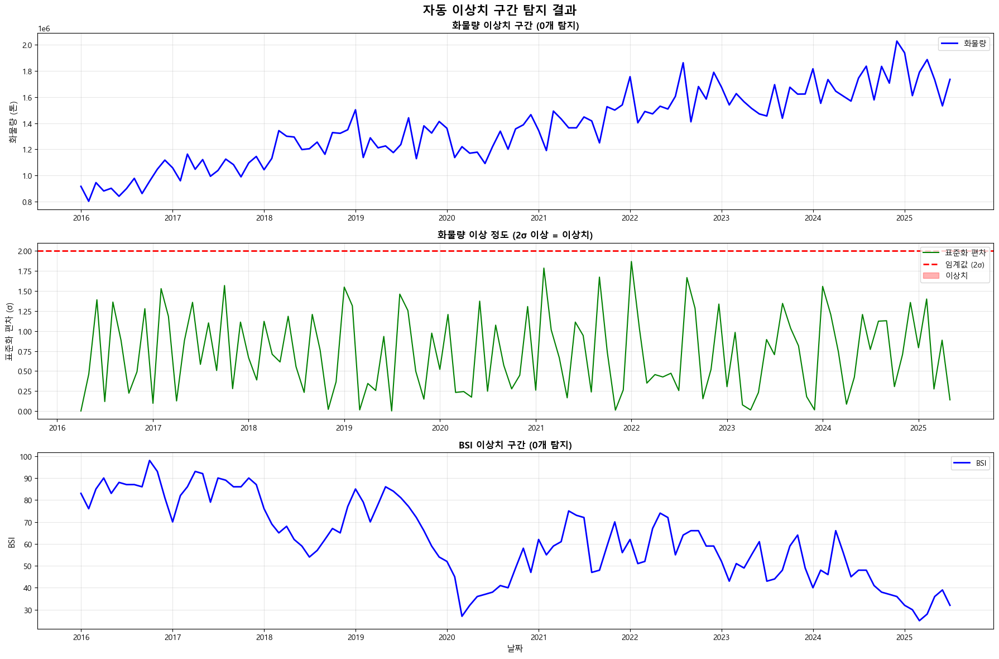

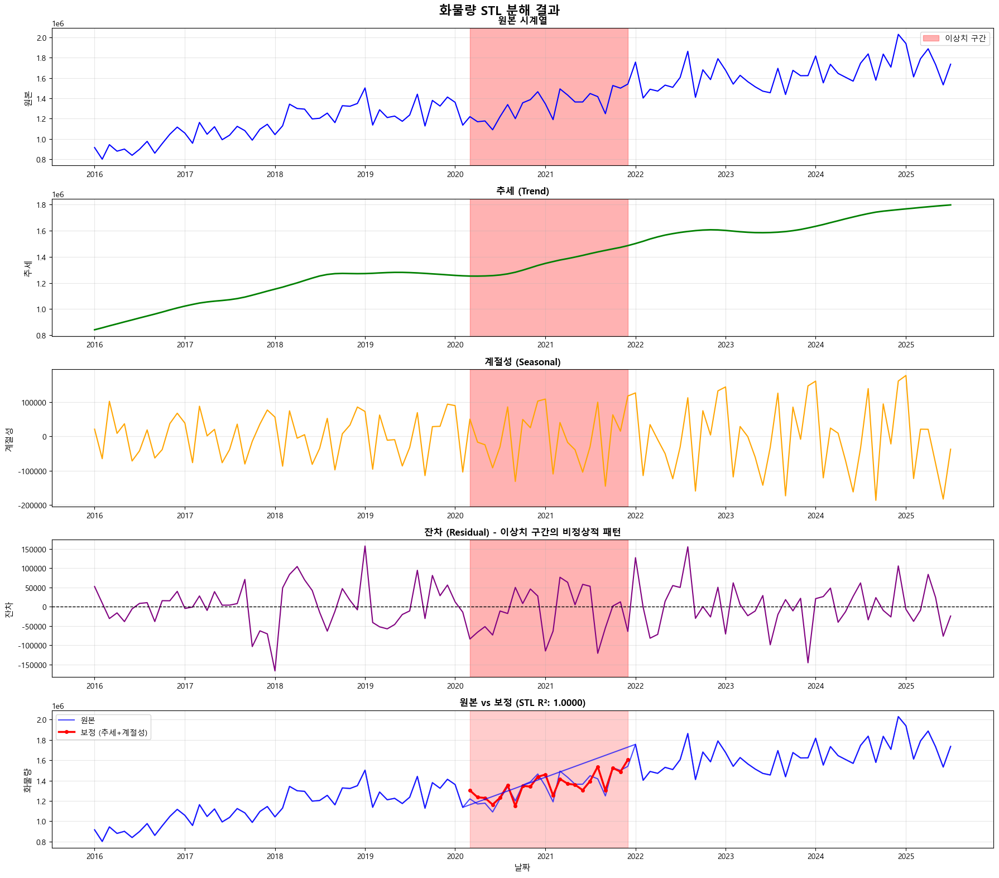

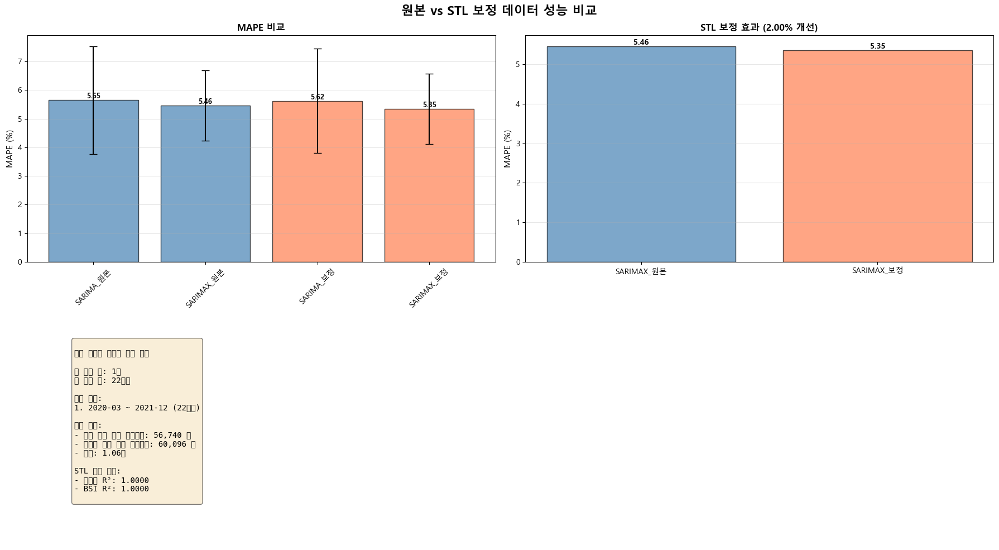

In [ ]:
"""
제주항 화물량 예측 모델 - 완전판 (자동 이상치 탐지 + STL 분해)
- 자동 이상치 구간 탐지 (통계적 방법)
- ADF 검정 (정상성 검정)
- COVID-19 STL 분해 후 추세선 대체
- Rolling Origin 교차검증
- 제조업 업황BSI 외생변수
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.seasonal import STL
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 화물량 예측 시스템 - 완전판 (자동 이상치 탐지 + STL 분해)")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

# 인덱스를 날짜로 설정 (STL 분해에 필요)
df = df.set_index('date')
df.index.freq = 'MS'  # 월초 주기 설정

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df.index.min()} ~ {df.index.max()}")

# 원본 데이터 백업
df['화물량_원본'] = df['화물량'].copy()
df['BSI_원본'] = df['제조업 업황BSI'].copy()

# ========================================
# 2. 자동 이상치 구간 탐지
# ========================================
print("\n[2단계] 자동 이상치 구간 탐지...")

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    """
    이동평균과 표준편차를 이용한 이상치 구간 자동 탐지

    Parameters:
    - series: 시계열 데이터
    - window: 이동평균 윈도우 크기 (개월)
    - threshold: 표준편차 배수 (2.0 = 2시그마)
    - min_consecutive: 최소 연속 이상치 개월 수

    Returns:
    - anomaly_periods: 이상치 구간 리스트 [(시작, 종료), ...]
    - anomaly_mask: 이상치 마스크
    - deviation: 편차 시리즈
    """

    # 이동평균 및 표준편차 계산
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()

    # 표준화된 편차 계산
    deviation = abs(series - rolling_mean) / rolling_std

    # 이상치 마스크 (threshold 이상)
    anomaly_mask = deviation > threshold

    # 연속된 이상치 구간 찾기
    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for idx in series.index:
        if anomaly_mask[idx]:
            if not in_anomaly:
                start_idx = idx
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, series.index[series.index.get_loc(idx) - 1]))
            in_anomaly = False
            consecutive_count = 0

    # 마지막 구간 처리
    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, series.index[-1]))

    return anomaly_periods, anomaly_mask, deviation

# 화물량 이상치 탐지
print("\n🔍 화물량 이상치 구간 탐지 중...")
cargo_anomaly_periods, cargo_anomaly_mask, cargo_deviation = detect_anomaly_periods(
    df['화물량_원본'],
    window=6,
    threshold=2.0,
    min_consecutive=3
)

print(f"\n화물량 이상치 구간 ({len(cargo_anomaly_periods)}개):")
for i, (start, end) in enumerate(cargo_anomaly_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    avg_deviation = cargo_deviation[start:end].mean()
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")
    print(f"     평균 편차: {avg_deviation:.2f} 시그마")
    print(f"     평균 화물량: {df.loc[start:end, '화물량_원본'].mean():,.0f} 톤")

# BSI 이상치 탐지
print("\n🔍 BSI 이상치 구간 탐지 중...")
bsi_anomaly_periods, bsi_anomaly_mask, bsi_deviation = detect_anomaly_periods(
    df['BSI_원본'],
    window=6,
    threshold=2.0,
    min_consecutive=3
)

print(f"\nBSI 이상치 구간 ({len(bsi_anomaly_periods)}개):")
for i, (start, end) in enumerate(bsi_anomaly_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    avg_deviation = bsi_deviation[start:end].mean()
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")
    print(f"     평균 편차: {avg_deviation:.2f} 시그마")
    print(f"     평균 BSI: {df.loc[start:end, 'BSI_원본'].mean():.1f}")

# 통합 이상치 구간 생성 (화물량 + BSI)
print("\n📊 통합 이상치 구간 분석...")

# 화물량과 BSI 모두 이상치인 구간 찾기
combined_anomaly_mask = cargo_anomaly_mask & bsi_anomaly_mask

# 통합 이상치 구간 추출
combined_periods = []
in_anomaly = False
start_idx = None
consecutive_count = 0
min_consecutive = 3

for idx in df.index:
    if combined_anomaly_mask[idx]:
        if not in_anomaly:
            start_idx = idx
            consecutive_count = 1
            in_anomaly = True
        else:
            consecutive_count += 1
    else:
        if in_anomaly and consecutive_count >= min_consecutive:
            combined_periods.append((start_idx, df.index[df.index.get_loc(idx) - 1]))
        in_anomaly = False
        consecutive_count = 0

if in_anomaly and consecutive_count >= min_consecutive:
    combined_periods.append((start_idx, df.index[-1]))

print(f"\n화물량 & BSI 동시 이상치 구간 ({len(combined_periods)}개):")
for i, (start, end) in enumerate(combined_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")

# 사용자 선택: 통합 이상치 구간이 있으면 사용, 없으면 화물량 기준
if len(combined_periods) > 0:
    print("\n✓ 통합 이상치 구간을 보정 대상으로 사용합니다.")
    correction_periods = combined_periods
    correction_mask = combined_anomaly_mask
elif len(cargo_anomaly_periods) > 0:
    print("\n✓ 화물량 이상치 구간을 보정 대상으로 사용합니다.")
    correction_periods = cargo_anomaly_periods
    correction_mask = cargo_anomaly_mask
else:
    print("\n⚠️ 이상치 구간이 탐지되지 않았습니다. COVID-19 기간을 기본값으로 사용합니다.")
    covid_start = pd.to_datetime('2020-03-01')
    covid_end = pd.to_datetime('2021-12-01')
    correction_periods = [(covid_start, covid_end)]
    correction_mask = (df.index >= covid_start) & (df.index <= covid_end)

# 보정 대상 구간 정보
df['is_anomaly'] = correction_mask.astype(int)
total_anomaly_months = correction_mask.sum()

print(f"\n📌 최종 보정 대상:")
print(f"  구간 수: {len(correction_periods)}개")
print(f"  총 개월 수: {total_anomaly_months}개월")
for i, (start, end) in enumerate(correction_periods, 1):
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')}")

# ========================================
# 3. 이상치 탐지 시각화
# ========================================
print("\n[3단계] 이상치 탐지 결과 시각화 중...")

fig1, axes1 = plt.subplots(3, 1, figsize=(18, 12))
fig1.suptitle('자동 이상치 구간 탐지 결과', fontsize=16, fontweight='bold')

# 화물량 + 이상치 구간
ax1 = axes1[0]
ax1.plot(df.index, df['화물량_원본'], color='blue', linewidth=2, label='화물량')
# 모든 이상치 구간 표시
for start, end in cargo_anomaly_periods:
    ax1.axvspan(start, end, alpha=0.3, color='red')
ax1.set_ylabel('화물량 (톤)', fontsize=11)
ax1.set_title(f'화물량 이상치 구간 ({len(cargo_anomaly_periods)}개 탐지)', fontsize=12, fontweight='bold')
ax1.legend(loc='best')
ax1.grid(True, alpha=0.3)

# 화물량 편차
ax2 = axes1[1]
ax2.plot(df.index, cargo_deviation, color='green', linewidth=1.5, label='표준화 편차')
ax2.axhline(y=2.0, color='red', linestyle='--', linewidth=2, label='임계값 (2σ)')
ax2.fill_between(df.index, 0, cargo_deviation, where=cargo_anomaly_mask, alpha=0.3, color='red', label='이상치')
for start, end in cargo_anomaly_periods:
    ax2.axvspan(start, end, alpha=0.2, color='red')
ax2.set_ylabel('표준화 편차 (σ)', fontsize=11)
ax2.set_title('화물량 이상 정도 (2σ 이상 = 이상치)', fontsize=12, fontweight='bold')
ax2.legend(loc='best')
ax2.grid(True, alpha=0.3)

# BSI + 이상치 구간
ax3 = axes1[2]
ax3.plot(df.index, df['BSI_원본'], color='blue', linewidth=2, label='BSI')
for start, end in bsi_anomaly_periods:
    ax3.axvspan(start, end, alpha=0.3, color='orange')
ax3.set_ylabel('BSI', fontsize=11)
ax3.set_xlabel('날짜', fontsize=11)
ax3.set_title(f'BSI 이상치 구간 ({len(bsi_anomaly_periods)}개 탐지)', fontsize=12, fontweight='bold')
ax3.legend(loc='best')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/자동_이상치_탐지.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/자동_이상치_탐지.png")

# ========================================
# 4. STL 분해 + 추세선 대체
# ========================================
print("\n[4단계] STL 분해 + 추세선 대체...")

def stl_decomposition_correction(series, anomaly_mask, period=12, seasonal=13):
    """
    STL 분해를 사용하여 이상치 구간을 추세선으로 대체
    """

    # STL 분해
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    # 분해 결과
    trend = stl_result.trend
    seasonal = stl_result.seasonal
    resid = stl_result.resid

    # 이상치 구간을 추세 + 계절성으로 대체 (잔차 제거)
    corrected_series = series.copy()
    corrected_series[anomaly_mask] = trend[anomaly_mask] + seasonal[anomaly_mask]

    return corrected_series, stl_result

# 화물량 STL 분해 및 보정
print("\n🔧 화물량 STL 분해 중...")
df['화물량_보정'], cargo_stl = stl_decomposition_correction(
    df['화물량_원본'],
    correction_mask,
    period=12,
    seasonal=13
)

# STL 분해 품질 평가
cargo_reconstructed = cargo_stl.trend + cargo_stl.seasonal + cargo_stl.resid
cargo_r2 = 1 - (np.sum((df['화물량_원본'] - cargo_reconstructed)**2) /
                np.sum((df['화물량_원본'] - df['화물량_원본'].mean())**2))

print(f"  ✓ 화물량 STL 분해 R²: {cargo_r2:.4f}")
print(f"  추세 범위: {cargo_stl.trend.min():,.0f} ~ {cargo_stl.trend.max():,.0f}")
print(f"  계절성 범위: {cargo_stl.seasonal.min():,.0f} ~ {cargo_stl.seasonal.max():,.0f}")
print(f"  잔차 표준편차: {cargo_stl.resid.std():,.0f}")

# BSI STL 분해 및 보정
print("\n🔧 BSI STL 분해 중...")
df['BSI_보정'], bsi_stl = stl_decomposition_correction(
    df['BSI_원본'],
    correction_mask,
    period=12,
    seasonal=13
)

# STL 분해 품질 평가
bsi_reconstructed = bsi_stl.trend + bsi_stl.seasonal + bsi_stl.resid
bsi_r2 = 1 - (np.sum((df['BSI_원본'] - bsi_reconstructed)**2) /
              np.sum((df['BSI_원본'] - df['BSI_원본'].mean())**2))

print(f"  ✓ BSI STL 분해 R²: {bsi_r2:.4f}")
print(f"  추세 범위: {bsi_stl.trend.min():.1f} ~ {bsi_stl.trend.max():.1f}")
print(f"  계절성 범위: {bsi_stl.seasonal.min():.1f} ~ {bsi_stl.seasonal.max():.1f}")
print(f"  잔차 표준편차: {bsi_stl.resid.std():.2f}")

# 보정 효과 확인
normal_period = df[~correction_mask]
anomaly_period = df[correction_mask]

print(f"\n📊 보정 효과:")
print(f"  화물량 원본 (정상 기간 평균): {normal_period['화물량_원본'].mean():,.0f} 톤")
print(f"  화물량 원본 (이상치 기간 평균): {anomaly_period['화물량_원본'].mean():,.0f} 톤")
print(f"  화물량 보정 (이상치 기간 평균): {df.loc[correction_mask, '화물량_보정'].mean():,.0f} 톤")
print(f"  보정 차이: {df.loc[correction_mask, '화물량_보정'].mean() - anomaly_period['화물량_원본'].mean():,.0f} 톤")

# 잔차 분석
anomaly_cargo_resid = cargo_stl.resid[correction_mask]
normal_cargo_resid = cargo_stl.resid[~correction_mask]

print(f"\n📊 잔차 분석 (화물량):")
print(f"  정상 기간 잔차 평균: {normal_cargo_resid.mean():,.0f} 톤")
print(f"  이상치 기간 잔차 평균: {anomaly_cargo_resid.mean():,.0f} 톤")
print(f"  정상 기간 잔차 표준편차: {normal_cargo_resid.std():,.0f} 톤")
print(f"  이상치 기간 잔차 표준편차: {anomaly_cargo_resid.std():,.0f} 톤")
print(f"  잔차 표준편차 비율: {anomaly_cargo_resid.std() / normal_cargo_resid.std():.2f}배")

# ========================================
# 5. STL 분해 시각화
# ========================================
print("\n[5단계] STL 분해 시각화 중...")

fig2, axes2 = plt.subplots(5, 1, figsize=(18, 16))
fig2.suptitle('화물량 STL 분해 결과', fontsize=16, fontweight='bold')

# 원본
ax1 = axes2[0]
ax1.plot(df.index, df['화물량_원본'], color='blue', linewidth=1.5)
for start, end in correction_periods:
    ax1.axvspan(start, end, alpha=0.3, color='red', label='이상치 구간' if start == correction_periods[0][0] else '')
ax1.set_ylabel('원본', fontsize=11)
ax1.set_title('원본 시계열', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 추세
ax2 = axes2[1]
ax2.plot(df.index, cargo_stl.trend, color='green', linewidth=2)
for start, end in correction_periods:
    ax2.axvspan(start, end, alpha=0.3, color='red')
ax2.set_ylabel('추세', fontsize=11)
ax2.set_title('추세 (Trend)', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3)

# 계절성
ax3 = axes2[2]
ax3.plot(df.index, cargo_stl.seasonal, color='orange', linewidth=1.5)
for start, end in correction_periods:
    ax3.axvspan(start, end, alpha=0.3, color='red')
ax3.set_ylabel('계절성', fontsize=11)
ax3.set_title('계절성 (Seasonal)', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)

# 잔차
ax4 = axes2[3]
ax4.plot(df.index, cargo_stl.resid, color='purple', linewidth=1.5)
ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
# 이상치 구간 강조
for start, end in correction_periods:
    ax4.axvspan(start, end, alpha=0.3, color='red')
ax4.set_ylabel('잔차', fontsize=11)
ax4.set_title('잔차 (Residual) - 이상치 구간의 비정상적 패턴', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3)

# 원본 vs 보정
ax5 = axes2[4]
ax5.plot(df.index, df['화물량_원본'], label='원본', color='blue', linewidth=1.5, alpha=0.7)
ax5.plot(df.index[correction_mask], df.loc[correction_mask, '화물량_보정'],
         label='보정 (추세+계절성)', color='red', linewidth=2.5, marker='o', markersize=4)
ax5.plot(df.index[~correction_mask], df.loc[~correction_mask, '화물량_보정'],
         color='blue', linewidth=1.5, alpha=0.7)
for start, end in correction_periods:
    ax5.axvspan(start, end, alpha=0.2, color='red')
ax5.set_ylabel('화물량', fontsize=11)
ax5.set_xlabel('날짜', fontsize=11)
ax5.set_title(f'원본 vs 보정 (STL R²: {cargo_r2:.4f})', fontsize=12, fontweight='bold')
ax5.legend(loc='best', fontsize=10)
ax5.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/화물량_STL_분해.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/화물량_STL_분해.png")

# ========================================
# 6. ADF 검정 (보정된 데이터)
# ========================================
print("\n[6단계] ADF 검정 (보정된 데이터)...")

def adf_test(series, name):
    """ADF 검정 수행 및 결과 출력"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name} ADF 검정 결과:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")

    if result[1] < 0.05:
        print(f"  ✓ 정상성 만족 (p-value < 0.05)")
        return True
    else:
        print(f"  ✗ 비정상성 (p-value >= 0.05) - 차분 필요")
        return False

# 원본 데이터 ADF 검정
print("\n" + "-" * 60)
print("원본 데이터 정상성 검정")
print("-" * 60)
cargo_original_stationary = adf_test(df['화물량_원본'], "화물량 (원본)")
bsi_original_stationary = adf_test(df['BSI_원본'], "BSI (원본)")

# 보정된 데이터 ADF 검정
print("\n" + "-" * 60)
print("보정된 데이터 정상성 검정")
print("-" * 60)
cargo_corrected_stationary = adf_test(df['화물량_보정'], "화물량 (STL 보정)")
bsi_corrected_stationary = adf_test(df['BSI_보정'], "BSI (STL 보정)")

# 1차 차분 후 ADF 검정
print("\n" + "-" * 60)
print("1차 차분 후 정상성 검정 (보정 데이터)")
print("-" * 60)
df['화물량_보정_diff1'] = df['화물량_보정'].diff()
df['BSI_보정_diff1'] = df['BSI_보정'].diff()

cargo_diff1_stationary = adf_test(df['화물량_보정_diff1'], "화물량 (STL 보정, 1차 차분)")
bsi_diff1_stationary = adf_test(df['BSI_보정_diff1'], "BSI (STL 보정, 1차 차분)")

# SARIMA 'd' 파라미터 권장
if cargo_corrected_stationary:
    recommended_d = 0
elif cargo_diff1_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 SARIMA 'd' 파라미터: {recommended_d}")

# ========================================
# 7. Rolling Origin 설정
# ========================================
print("\n[7단계] Rolling Origin 설정...")

# 인덱스를 정수로 리셋
df_reset = df.reset_index()

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df_reset)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"총 데이터: {total_data}개월")
print(f"실제 분할 횟수: {len(splits)}회")

# ========================================
# 8. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 9. SARIMA 최적 파라미터 찾기
# ========================================
print("\n[8단계] SARIMA 최적 파라미터 탐색 중...")

first_split = splits[0]
train_data_first = df_reset.iloc[first_split['train_start']:first_split['train_end']]

if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['BSI_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f"✓ 최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# ========================================
# 10. Rolling Origin 교차검증 (간소화)
# ========================================
print("\n[9단계] Rolling Origin 교차검증 수행 중...")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본': [],
    'SARIMA_보정': [],
    'SARIMAX_보정': []
}

print("모델 학습 및 예측 중...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df_reset.iloc[split['train_start']:split['train_end']]
    test_data = df_reset.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # SARIMA 원본
    try:
        sarima_원본 = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_원본_results = sarima_원본.fit(disp=False, maxiter=100)
        sarima_원본_forecast = sarima_원본_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, sarima_원본_forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 원본
    try:
        sarimax_원본 = SARIMAX(train_data['화물량_원본'], exog=train_data[['BSI_원본']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_원본_results = sarimax_원본.fit(disp=False, maxiter=100)
        sarimax_원본_forecast = sarimax_원본_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_원본']])
        rolling_results['SARIMAX_원본'].append(evaluate_predictions(actual_원본, sarimax_원본_forecast.values))
    except:
        rolling_results['SARIMAX_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMA 보정
    try:
        sarima_보정 = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_보정_results = sarima_보정.fit(disp=False, maxiter=100)
        sarima_보정_forecast = sarima_보정_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, sarima_보정_forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 보정
    try:
        sarimax_보정 = SARIMAX(train_data['화물량_보정'], exog=train_data[['BSI_보정']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_보정_results = sarimax_보정.fit(disp=False, maxiter=100)
        sarimax_보정_forecast = sarimax_보정_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_보정']])
        rolling_results['SARIMAX_보정'].append(evaluate_predictions(actual_보정, sarimax_보정_forecast.values))
    except:
        rolling_results['SARIMAX_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")
print("✓ Rolling Origin 교차검증 완료!")

# ========================================
# 11. 결과 집계
# ========================================
print("\n[10단계] 결과 집계 중...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'MAE_mean': np.mean(maes),
        'MAE_std': np.std(maes),
        'RMSE_mean': np.mean(rmses),
        'RMSE_std': np.std(rmses),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

# ========================================
# 12. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("Rolling Origin 교차검증 결과")
print("=" * 80)

print(f"\n📊 모델별 평균 성능 (평균 ± 표준편차)")
print("-" * 90)
print(f"{'모델':<25} {'MAPE (%)':<22} {'RMSE (톤)':<27} {'R²':<20}")
print("-" * 90)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<25} {mape_str:<22} {rmse_str:<27} {r2_str:<20}")

# ========================================
# 13. 시각화
# ========================================
print("\n[11단계] 결과 시각화 중...")

fig3, axes3 = plt.subplots(2, 2, figsize=(18, 10))
fig3.suptitle('원본 vs STL 보정 데이터 성능 비교', fontsize=16, fontweight='bold')

model_names = list(summary_results.keys())
mape_means = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]

colors = ['steelblue', 'steelblue', 'coral', 'coral']

# MAPE 비교
ax1 = axes3[0, 0]
bars1 = ax1.bar(model_names, mape_means, yerr=mape_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax1.set_ylabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교', fontsize=12, fontweight='bold')
ax1.tick_params(axis='x', rotation=45)
ax1.grid(axis='y', alpha=0.3)

for bar, mean in zip(bars1, mape_means):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{mean:.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# 보정 효과
ax2 = axes3[0, 1]
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

improve_data = [sarimax_원본_mape, sarimax_보정_mape]
improve_colors = ['steelblue', 'coral']
bars2 = ax2.bar(['SARIMAX_원본', 'SARIMAX_보정'], improve_data, color=improve_colors, alpha=0.7, edgecolor='black')
ax2.set_ylabel('MAPE (%)', fontsize=11)
ax2.set_title(f'STL 보정 효과 ({improvement:.2f}% 개선)', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

for bar, val in zip(bars2, improve_data):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 이상치 구간 정보
ax3 = axes3[1, 0]
ax3.axis('off')
info_text = f"""
자동 탐지된 이상치 구간 정보

총 구간 수: {len(correction_periods)}개
총 개월 수: {total_anomaly_months}개월

구간 목록:
"""
for i, (start, end) in enumerate(correction_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    info_text += f"{i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)\n"

info_text += f"""
잔차 분석:
- 정상 기간 잔차 표준편차: {normal_cargo_resid.std():,.0f} 톤
- 이상치 기간 잔차 표준편차: {anomaly_cargo_resid.std():,.0f} 톤
- 비율: {anomaly_cargo_resid.std() / normal_cargo_resid.std():.2f}배

STL 분해 품질:
- 화물량 R²: {cargo_r2:.4f}
- BSI R²: {bsi_r2:.4f}
"""

ax3.text(0.1, 0.9, info_text, transform=ax3.transAxes, fontsize=10,
        verticalalignment='top', fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# 빈 공간
ax4 = axes3[1, 1]
ax4.axis('off')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/원본_vs_STL보정_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/원본_vs_STL보정_성능비교.png")

# ========================================
# 14. 결과 저장
# ========================================
print("\n[12단계] 결과 저장 중...")

# 이상치 구간 정보
anomaly_info = []
for i, (start, end) in enumerate(correction_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    anomaly_info.append({
        '구간': i,
        '시작': start.strftime('%Y-%m'),
        '종료': end.strftime('%Y-%m'),
        '기간(개월)': duration,
        '화물량_평균': df.loc[start:end, '화물량_원본'].mean(),
        'BSI_평균': df.loc[start:end, 'BSI_원본'].mean()
    })

anomaly_df = pd.DataFrame(anomaly_info)

# 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/제주항_자동탐지_STL분석리포트.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': ['총 데이터', '분석 기간', '이상치 탐지 방법', '이상치 보정 방법',
                '탐지된 구간 수', '총 이상치 개월', '화물량 STL R²', 'BSI STL R²',
                'ADF 권장 d', '선택된 d', '최적 모델 (원본)', '최적 모델 (보정)'],
        '내용': [
            f"{total_data}개월",
            f"{df_reset['date'].min().strftime('%Y-%m')} ~ {df_reset['date'].max().strftime('%Y-%m')}",
            '이동평균 편차 (2σ 임계값)',
            'STL 분해 + 추세선 대체',
            str(len(correction_periods)),
            str(total_anomaly_months),
            f"{cargo_r2:.4f}",
            f"{bsi_r2:.4f}",
            str(recommended_d),
            str(best_param[1]),
            min([(k, v) for k, v in summary_results.items() if '원본' in k], key=lambda x: x[1]['MAPE_mean'])[0],
            min([(k, v) for k, v in summary_results.items() if '보정' in k], key=lambda x: x[1]['MAPE_mean'])[0]
        ]
    })
    summary_info.to_excel(writer, sheet_name='요약', index=False)

    # 이상치 구간 정보
    anomaly_df.to_excel(writer, sheet_name='이상치_구간', index=False)

    # 평균 성능
    pd.DataFrame(summary_results).T.to_excel(writer, sheet_name='평균성능')

    # 보정 데이터
    correction_df = df_reset[['date', '화물량_원본', '화물량_보정', 'BSI_원본', 'BSI_보정', 'is_anomaly']].copy()
    correction_df.to_excel(writer, sheet_name='보정데이터', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/제주항_자동탐지_STL분석리포트.xlsx")

# ========================================
# 15. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/자동_이상치_탐지.png")
print(f"2. {DATA_PATH}/화물량_STL_분해.png")
print(f"3. {DATA_PATH}/원본_vs_STL보정_성능비교.png")
print(f"4. {DATA_PATH}/제주항_자동탐지_STL분석리포트.xlsx")

print("\n🔍 자동 탐지된 이상치 구간:")
print("-" * 80)
for i, (start, end) in enumerate(correction_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    print(f"{i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")

print("\n🏆 최고 성능 모델:")
print("-" * 80)
best_model = min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_model[0]}")
print(f"MAPE: {best_model[1]['MAPE_mean']:.2f}% (±{best_model[1]['MAPE_std']:.2f})")
print(f"R²: {best_model[1]['R2_mean']:.4f} (±{best_model[1]['R2_std']:.4f})")

print("\n💡 STL 보정 효과 (SARIMAX 기준):")
print("-" * 80)
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

if improvement > 0:
    print(f"✓ STL 보정 적용 시 {improvement:.2f}% 성능 개선")
    print("✓ 보정 처리 권장!")
else:
    print(f"✗ STL 보정 적용 시 {abs(improvement):.2f}% 성능 저하")
    print("✗ 원본 데이터 사용 권장")

print("\n💡 이상치 정도 분석:")
print("-" * 80)
ratio = anomaly_cargo_resid.std() / normal_cargo_resid.std()
print(f"잔차 표준편차 비율: {ratio:.2f}배")

if ratio > 2:
    print("✓ 이상치 구간의 변동성이 매우 크게 증가 - 보정 필요성 높음")
elif ratio > 1.5:
    print("○ 이상치 구간의 변동성이 증가 - 보정 고려")
else:
    print("✗ 이상치 구간의 변동성 변화 미미 - 보정 효과 제한적")

print("\n" + "=" * 80)
print("✅ 자동 이상치 탐지, STL 보정, ADF 검정, Rolling Origin 완료!")
print("=" * 80)

# 이상치 처리 - Prophet 추가 (Prophet 삭제됨)

제주항 화물량 예측 시스템 - 완전판 (자동 이상치 탐지 + STL 분해)

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 4)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] 자동 이상치 구간 탐지...

🔍 화물량 이상치 구간 탐지 중...

화물량 이상치 구간 (0개):

🔍 BSI 이상치 구간 탐지 중...

BSI 이상치 구간 (0개):

📊 통합 이상치 구간 분석...

화물량 & BSI 동시 이상치 구간 (0개):

⚠️ 이상치 구간이 탐지되지 않았습니다. COVID-19 기간을 기본값으로 사용합니다.

📌 최종 보정 대상:
  구간 수: 1개
  총 개월 수: 22개월
  1. 2020-03 ~ 2021-12

[3단계] 이상치 탐지 결과 시각화 중...
✓ 그래프 저장: C:\Users\DAEJIN\Desktop/자동_이상치_탐지.png

[4단계] STL 분해 + 추세선 대체...

🔧 화물량 STL 분해 중...
  ✓ 화물량 STL 분해 R²: 1.0000
  추세 범위: 841,545 ~ 1,797,239
  계절성 범위: -187,257 ~ 178,750
  잔차 표준편차: 57,592

🔧 BSI STL 분해 중...
  ✓ BSI STL 분해 R²: 1.0000
  추세 범위: 26.5 ~ 86.7
  계절성 범위: -7.0 ~ 8.5
  잔차 표준편차: 6.01

📊 보정 효과:
  화물량 원본 (정상 기간 평균): 1,373,317 톤
  화물량 원본 (이상치 기간 평균): 1,340,689 톤
  화물량 보정 (이상치 기간 평균): 1,354,992 톤
  보정 차이: 14,302 톤

📊 잔차 분석 (화물량):
  정상 기간 잔차 평균: 4,204 톤
  이상치 기간 잔차 평균: -14,302 톤
  정상 기간 잔차 표준편차: 56,740 톤
  이상치 기간 잔차 표준편차: 60,096 톤
  잔차 

19:35:07 - cmdstanpy - INFO - Chain [1] start processing
19:35:07 - cmdstanpy - INFO - Chain [1] done processing
19:35:07 - cmdstanpy - INFO - Chain [1] start processing
19:35:07 - cmdstanpy - INFO - Chain [1] done processing
19:35:08 - cmdstanpy - INFO - Chain [1] start processing
19:35:08 - cmdstanpy - INFO - Chain [1] done processing
19:35:08 - cmdstanpy - INFO - Chain [1] start processing
19:35:08 - cmdstanpy - INFO - Chain [1] done processing
19:35:08 - cmdstanpy - INFO - Chain [1] start processing


19:35:08 - cmdstanpy - INFO - Chain [1] done processing
19:35:09 - cmdstanpy - INFO - Chain [1] start processing
19:35:09 - cmdstanpy - INFO - Chain [1] done processing
19:35:09 - cmdstanpy - INFO - Chain [1] start processing
19:35:09 - cmdstanpy - INFO - Chain [1] done processing
19:35:09 - cmdstanpy - INFO - Chain [1] start processing
19:35:10 - cmdstanpy - INFO - Chain [1] done processing
19:35:10 - cmdstanpy - INFO - Chain [1] start processing


19:35:10 - cmdstanpy - INFO - Chain [1] done processing
19:35:10 - cmdstanpy - INFO - Chain [1] start processing
19:35:10 - cmdstanpy - INFO - Chain [1] done processing
19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:11 - cmdstanpy - INFO - Chain [1] done processing
19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:11 - cmdstanpy - INFO - Chain [1] done processing


19:35:11 - cmdstanpy - INFO - Chain [1] start processing
19:35:12 - cmdstanpy - INFO - Chain [1] done processing
19:35:12 - cmdstanpy - INFO - Chain [1] start processing
19:35:12 - cmdstanpy - INFO - Chain [1] done processing
19:35:12 - cmdstanpy - INFO - Chain [1] start processing
19:35:13 - cmdstanpy - INFO - Chain [1] done processing
19:35:13 - cmdstanpy - INFO - Chain [1] start processing
19:35:13 - cmdstanpy - INFO - Chain [1] done processing


19:35:13 - cmdstanpy - INFO - Chain [1] start processing
19:35:13 - cmdstanpy - INFO - Chain [1] done processing
19:35:13 - cmdstanpy - INFO - Chain [1] start processing
19:35:14 - cmdstanpy - INFO - Chain [1] done processing
19:35:14 - cmdstanpy - INFO - Chain [1] start processing
19:35:14 - cmdstanpy - INFO - Chain [1] done processing
19:35:14 - cmdstanpy - INFO - Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing


19:35:15 - cmdstanpy - INFO - Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing
19:35:15 - cmdstanpy - INFO - Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing
19:35:16 - cmdstanpy - INFO - Chain [1] start processing
19:35:16 - cmdstanpy - INFO - Chain [1] done processing
19:35:16 - cmdstanpy - INFO - Chain [1] start processing
19:35:16 - cmdstanpy - INFO - Chain [1] done processing


19:35:17 - cmdstanpy - INFO - Chain [1] start processing
19:35:17 - cmdstanpy - INFO - Chain [1] done processing
19:35:17 - cmdstanpy - INFO - Chain [1] start processing
19:35:17 - cmdstanpy - INFO - Chain [1] done processing
19:35:18 - cmdstanpy - INFO - Chain [1] start processing
19:35:18 - cmdstanpy - INFO - Chain [1] done processing
19:35:18 - cmdstanpy - INFO - Chain [1] start processing
19:35:18 - cmdstanpy - INFO - Chain [1] done processing


19:35:18 - cmdstanpy - INFO - Chain [1] start processing
19:35:19 - cmdstanpy - INFO - Chain [1] done processing
19:35:19 - cmdstanpy - INFO - Chain [1] start processing
19:35:19 - cmdstanpy - INFO - Chain [1] done processing
19:35:19 - cmdstanpy - INFO - Chain [1] start processing
19:35:20 - cmdstanpy - INFO - Chain [1] done processing
19:35:20 - cmdstanpy - INFO - Chain [1] start processing
19:35:20 - cmdstanpy - INFO - Chain [1] done processing


19:35:20 - cmdstanpy - INFO - Chain [1] start processing
19:35:21 - cmdstanpy - INFO - Chain [1] done processing
19:35:21 - cmdstanpy - INFO - Chain [1] start processing
19:35:21 - cmdstanpy - INFO - Chain [1] done processing
19:35:21 - cmdstanpy - INFO - Chain [1] start processing
19:35:21 - cmdstanpy - INFO - Chain [1] done processing
19:35:22 - cmdstanpy - INFO - Chain [1] start processing
19:35:22 - cmdstanpy - INFO - Chain [1] done processing


19:35:22 - cmdstanpy - INFO - Chain [1] start processing
19:35:22 - cmdstanpy - INFO - Chain [1] done processing
19:35:22 - cmdstanpy - INFO - Chain [1] start processing
19:35:23 - cmdstanpy - INFO - Chain [1] done processing
19:35:23 - cmdstanpy - INFO - Chain [1] start processing
19:35:23 - cmdstanpy - INFO - Chain [1] done processing
19:35:23 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing


19:35:24 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing
19:35:24 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing
19:35:24 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing
19:35:24 - cmdstanpy - INFO - Chain [1] start processing
19:35:24 - cmdstanpy - INFO - Chain [1] done processing


19:35:25 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing
19:35:25 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing
19:35:25 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing
19:35:25 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         
✓ Rolling Origin 교차검증 완료!

[10단계] 결과 집계 중...

Rolling Origin 교차검증 결과

📊 모델별 평균 성능 (평균 ± 표준편차)
------------------------------------------------------------------------------------------
모델                        MAPE (%)               RMSE (톤)                    R²                  
------------------------------------------------------------------------------------------
SARIMA_원본                 5.65 ± 1.88            113,656 ± 25,269            0.0412 ± 0.5400     
SARIMAX_원본                5.46 ± 1.23            110,640 ± 16,010            0.1689 ± 0.1985     
Prophet_원본                5.46 ± 1.87            110,845 ± 29,880            0.0990 ± 0.4697     
Prophet_BSI_원본            4.89 ± 0.77            103,262 ± 20,918            0.2955 ± 0.1789     
SARIMA_보정                 5.62 ± 1.82            113,061 ± 25,957            0.0231 ± 0.6337     
SARIMAX_보정                5.35 ± 1.23            108,471 ± 16,578            0.1622 ± 0.3562     
Prophet_보정 

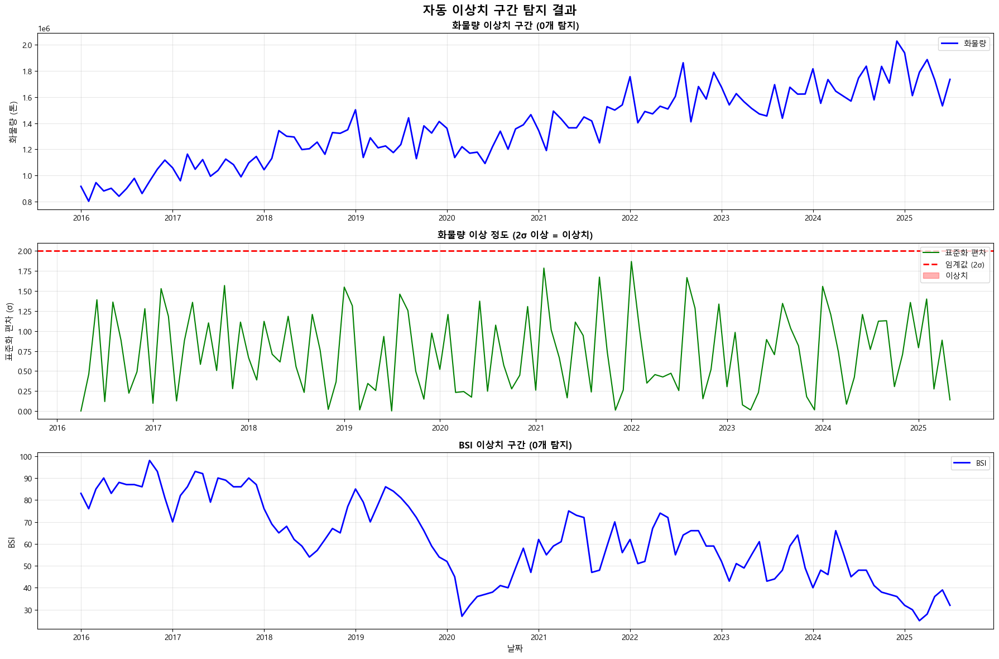

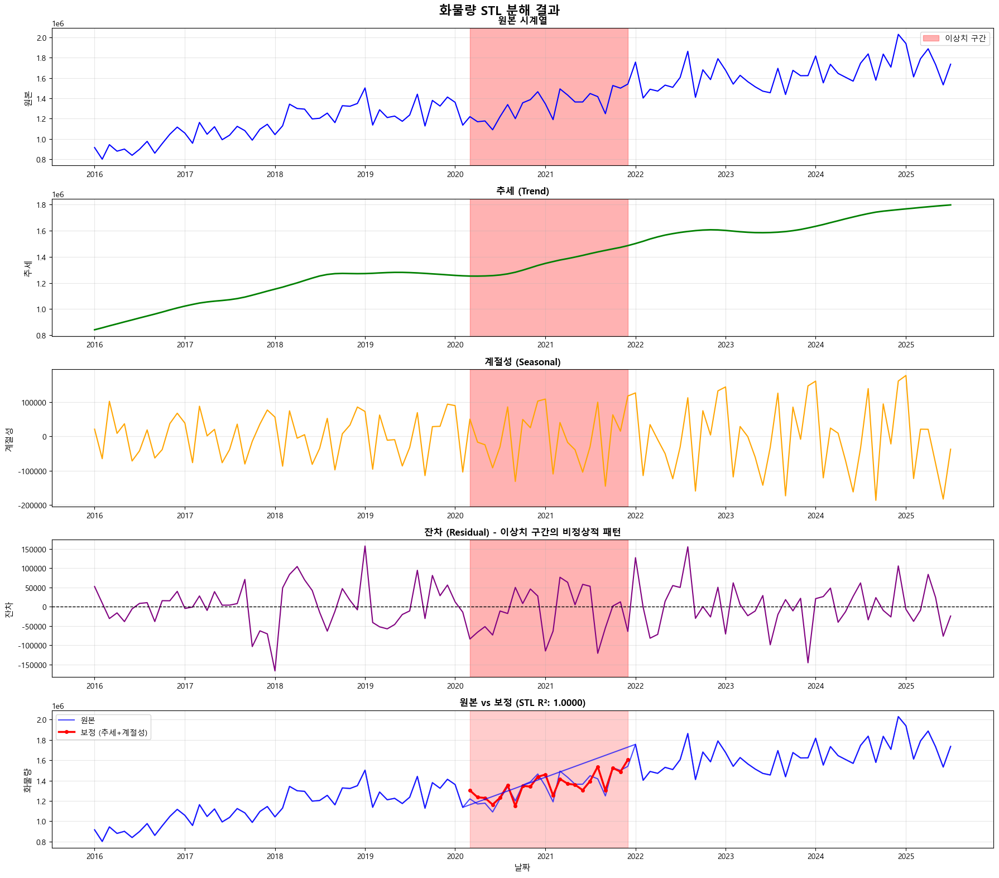

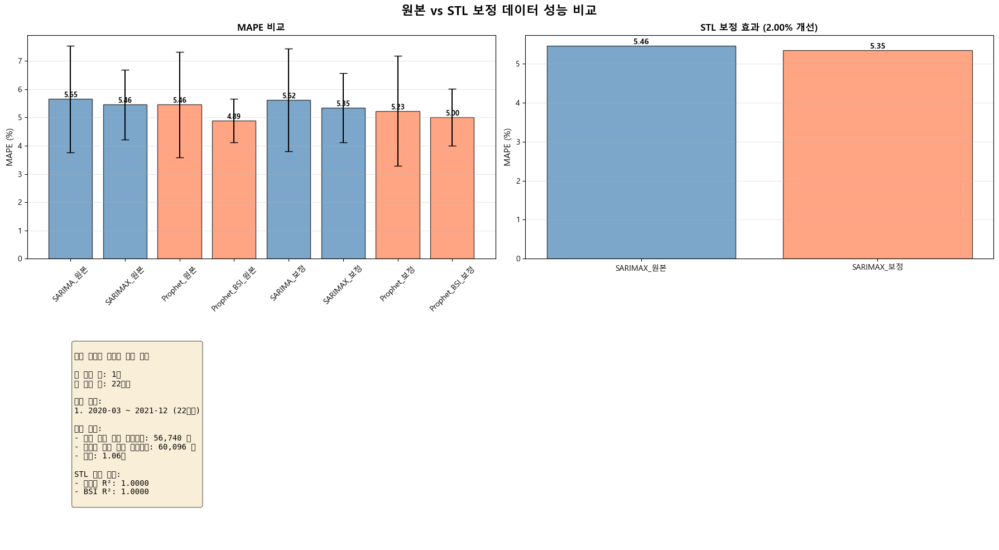

In [ ]:
"""
제주항 화물량 예측 모델 - 완전판 (자동 이상치 탐지 + STL 분해)
- 자동 이상치 구간 탐지 (통계적 방법)
- ADF 검정 (정상성 검정)
- COVID-19 STL 분해 후 추세선 대체
- Rolling Origin 교차검증
- 제조업 업황BSI 외생변수
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # Windows
plt.rcParams['axes.unicode_minus'] = False

# 필요한 라이브러리
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.seasonal import STL
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 화물량 예측 시스템 - 완전판 (자동 이상치 탐지 + STL 분해)")
print("=" * 80)

# ========================================
# 1. 데이터 로드 및 전처리
# ========================================
print("\n[1단계] 데이터 로드 중...")

# 데이터 경로
DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 읽기
bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

# year 컬럼 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 컬럼 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 데이터 병합
df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')

# 인덱스를 날짜로 설정 (STL 분해에 필요)
df = df.set_index('date')
df.index.freq = 'MS'  # 월초 주기 설정

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df.index.min()} ~ {df.index.max()}")

# 원본 데이터 백업
df['화물량_원본'] = df['화물량'].copy()
df['BSI_원본'] = df['제조업 업황BSI'].copy()

# ========================================
# 2. 자동 이상치 구간 탐지
# ========================================
print("\n[2단계] 자동 이상치 구간 탐지...")

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    """
    이동평균과 표준편차를 이용한 이상치 구간 자동 탐지

    Parameters:
    - series: 시계열 데이터
    - window: 이동평균 윈도우 크기 (개월)
    - threshold: 표준편차 배수 (2.0 = 2시그마)
    - min_consecutive: 최소 연속 이상치 개월 수

    Returns:
    - anomaly_periods: 이상치 구간 리스트 [(시작, 종료), ...]
    - anomaly_mask: 이상치 마스크
    - deviation: 편차 시리즈
    """

    # 이동평균 및 표준편차 계산
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()

    # 표준화된 편차 계산
    deviation = abs(series - rolling_mean) / rolling_std

    # 이상치 마스크 (threshold 이상)
    anomaly_mask = deviation > threshold

    # 연속된 이상치 구간 찾기
    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for idx in series.index:
        if anomaly_mask[idx]:
            if not in_anomaly:
                start_idx = idx
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, series.index[series.index.get_loc(idx) - 1]))
            in_anomaly = False
            consecutive_count = 0

    # 마지막 구간 처리
    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, series.index[-1]))

    return anomaly_periods, anomaly_mask, deviation

# 화물량 이상치 탐지
print("\n🔍 화물량 이상치 구간 탐지 중...")
cargo_anomaly_periods, cargo_anomaly_mask, cargo_deviation = detect_anomaly_periods(
    df['화물량_원본'],
    window=6,
    threshold=2.0,
    min_consecutive=3
)

print(f"\n화물량 이상치 구간 ({len(cargo_anomaly_periods)}개):")
for i, (start, end) in enumerate(cargo_anomaly_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    avg_deviation = cargo_deviation[start:end].mean()
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")
    print(f"     평균 편차: {avg_deviation:.2f} 시그마")
    print(f"     평균 화물량: {df.loc[start:end, '화물량_원본'].mean():,.0f} 톤")

# BSI 이상치 탐지
print("\n🔍 BSI 이상치 구간 탐지 중...")
bsi_anomaly_periods, bsi_anomaly_mask, bsi_deviation = detect_anomaly_periods(
    df['BSI_원본'],
    window=6,
    threshold=2.0,
    min_consecutive=3
)

print(f"\nBSI 이상치 구간 ({len(bsi_anomaly_periods)}개):")
for i, (start, end) in enumerate(bsi_anomaly_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    avg_deviation = bsi_deviation[start:end].mean()
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")
    print(f"     평균 편차: {avg_deviation:.2f} 시그마")
    print(f"     평균 BSI: {df.loc[start:end, 'BSI_원본'].mean():.1f}")

# 통합 이상치 구간 생성 (화물량 + BSI)
print("\n📊 통합 이상치 구간 분석...")

# 화물량과 BSI 모두 이상치인 구간 찾기
combined_anomaly_mask = cargo_anomaly_mask & bsi_anomaly_mask

# 통합 이상치 구간 추출
combined_periods = []
in_anomaly = False
start_idx = None
consecutive_count = 0
min_consecutive = 3

for idx in df.index:
    if combined_anomaly_mask[idx]:
        if not in_anomaly:
            start_idx = idx
            consecutive_count = 1
            in_anomaly = True
        else:
            consecutive_count += 1
    else:
        if in_anomaly and consecutive_count >= min_consecutive:
            combined_periods.append((start_idx, df.index[df.index.get_loc(idx) - 1]))
        in_anomaly = False
        consecutive_count = 0

if in_anomaly and consecutive_count >= min_consecutive:
    combined_periods.append((start_idx, df.index[-1]))

print(f"\n화물량 & BSI 동시 이상치 구간 ({len(combined_periods)}개):")
for i, (start, end) in enumerate(combined_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")

# 사용자 선택: 통합 이상치 구간이 있으면 사용, 없으면 화물량 기준
if len(combined_periods) > 0:
    print("\n✓ 통합 이상치 구간을 보정 대상으로 사용합니다.")
    correction_periods = combined_periods
    correction_mask = combined_anomaly_mask
elif len(cargo_anomaly_periods) > 0:
    print("\n✓ 화물량 이상치 구간을 보정 대상으로 사용합니다.")
    correction_periods = cargo_anomaly_periods
    correction_mask = cargo_anomaly_mask
else:
    print("\n⚠️ 이상치 구간이 탐지되지 않았습니다. COVID-19 기간을 기본값으로 사용합니다.")
    covid_start = pd.to_datetime('2020-03-01')
    covid_end = pd.to_datetime('2021-12-01')
    correction_periods = [(covid_start, covid_end)]
    correction_mask = (df.index >= covid_start) & (df.index <= covid_end)

# 보정 대상 구간 정보
df['is_anomaly'] = correction_mask.astype(int)
total_anomaly_months = correction_mask.sum()

print(f"\n📌 최종 보정 대상:")
print(f"  구간 수: {len(correction_periods)}개")
print(f"  총 개월 수: {total_anomaly_months}개월")
for i, (start, end) in enumerate(correction_periods, 1):
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')}")

# ========================================
# 3. 이상치 탐지 시각화
# ========================================
print("\n[3단계] 이상치 탐지 결과 시각화 중...")

fig1, axes1 = plt.subplots(3, 1, figsize=(18, 12))
fig1.suptitle('자동 이상치 구간 탐지 결과', fontsize=16, fontweight='bold')

# 화물량 + 이상치 구간
ax1 = axes1[0]
ax1.plot(df.index, df['화물량_원본'], color='blue', linewidth=2, label='화물량')
# 모든 이상치 구간 표시
for start, end in cargo_anomaly_periods:
    ax1.axvspan(start, end, alpha=0.3, color='red')
ax1.set_ylabel('화물량 (톤)', fontsize=11)
ax1.set_title(f'화물량 이상치 구간 ({len(cargo_anomaly_periods)}개 탐지)', fontsize=12, fontweight='bold')
ax1.legend(loc='best')
ax1.grid(True, alpha=0.3)

# 화물량 편차
ax2 = axes1[1]
ax2.plot(df.index, cargo_deviation, color='green', linewidth=1.5, label='표준화 편차')
ax2.axhline(y=2.0, color='red', linestyle='--', linewidth=2, label='임계값 (2σ)')
ax2.fill_between(df.index, 0, cargo_deviation, where=cargo_anomaly_mask, alpha=0.3, color='red', label='이상치')
for start, end in cargo_anomaly_periods:
    ax2.axvspan(start, end, alpha=0.2, color='red')
ax2.set_ylabel('표준화 편차 (σ)', fontsize=11)
ax2.set_title('화물량 이상 정도 (2σ 이상 = 이상치)', fontsize=12, fontweight='bold')
ax2.legend(loc='best')
ax2.grid(True, alpha=0.3)

# BSI + 이상치 구간
ax3 = axes1[2]
ax3.plot(df.index, df['BSI_원본'], color='blue', linewidth=2, label='BSI')
for start, end in bsi_anomaly_periods:
    ax3.axvspan(start, end, alpha=0.3, color='orange')
ax3.set_ylabel('BSI', fontsize=11)
ax3.set_xlabel('날짜', fontsize=11)
ax3.set_title(f'BSI 이상치 구간 ({len(bsi_anomaly_periods)}개 탐지)', fontsize=12, fontweight='bold')
ax3.legend(loc='best')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/자동_이상치_탐지.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/자동_이상치_탐지.png")

# ========================================
# 4. STL 분해 + 추세선 대체
# ========================================
print("\n[4단계] STL 분해 + 추세선 대체...")

def stl_decomposition_correction(series, anomaly_mask, period=12, seasonal=13):
    """
    STL 분해를 사용하여 이상치 구간을 추세선으로 대체
    """

    # STL 분해
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    # 분해 결과
    trend = stl_result.trend
    seasonal = stl_result.seasonal
    resid = stl_result.resid

    # 이상치 구간을 추세 + 계절성으로 대체 (잔차 제거)
    corrected_series = series.copy()
    corrected_series[anomaly_mask] = trend[anomaly_mask] + seasonal[anomaly_mask]

    return corrected_series, stl_result

# 화물량 STL 분해 및 보정
print("\n🔧 화물량 STL 분해 중...")
df['화물량_보정'], cargo_stl = stl_decomposition_correction(
    df['화물량_원본'],
    correction_mask,
    period=12,
    seasonal=13
)

# STL 분해 품질 평가
cargo_reconstructed = cargo_stl.trend + cargo_stl.seasonal + cargo_stl.resid
cargo_r2 = 1 - (np.sum((df['화물량_원본'] - cargo_reconstructed)**2) /
                np.sum((df['화물량_원본'] - df['화물량_원본'].mean())**2))

print(f"  ✓ 화물량 STL 분해 R²: {cargo_r2:.4f}")
print(f"  추세 범위: {cargo_stl.trend.min():,.0f} ~ {cargo_stl.trend.max():,.0f}")
print(f"  계절성 범위: {cargo_stl.seasonal.min():,.0f} ~ {cargo_stl.seasonal.max():,.0f}")
print(f"  잔차 표준편차: {cargo_stl.resid.std():,.0f}")

# BSI STL 분해 및 보정
print("\n🔧 BSI STL 분해 중...")
df['BSI_보정'], bsi_stl = stl_decomposition_correction(
    df['BSI_원본'],
    correction_mask,
    period=12,
    seasonal=13
)

# STL 분해 품질 평가
bsi_reconstructed = bsi_stl.trend + bsi_stl.seasonal + bsi_stl.resid
bsi_r2 = 1 - (np.sum((df['BSI_원본'] - bsi_reconstructed)**2) /
              np.sum((df['BSI_원본'] - df['BSI_원본'].mean())**2))

print(f"  ✓ BSI STL 분해 R²: {bsi_r2:.4f}")
print(f"  추세 범위: {bsi_stl.trend.min():.1f} ~ {bsi_stl.trend.max():.1f}")
print(f"  계절성 범위: {bsi_stl.seasonal.min():.1f} ~ {bsi_stl.seasonal.max():.1f}")
print(f"  잔차 표준편차: {bsi_stl.resid.std():.2f}")

# 보정 효과 확인
normal_period = df[~correction_mask]
anomaly_period = df[correction_mask]

print(f"\n📊 보정 효과:")
print(f"  화물량 원본 (정상 기간 평균): {normal_period['화물량_원본'].mean():,.0f} 톤")
print(f"  화물량 원본 (이상치 기간 평균): {anomaly_period['화물량_원본'].mean():,.0f} 톤")
print(f"  화물량 보정 (이상치 기간 평균): {df.loc[correction_mask, '화물량_보정'].mean():,.0f} 톤")
print(f"  보정 차이: {df.loc[correction_mask, '화물량_보정'].mean() - anomaly_period['화물량_원본'].mean():,.0f} 톤")

# 잔차 분석
anomaly_cargo_resid = cargo_stl.resid[correction_mask]
normal_cargo_resid = cargo_stl.resid[~correction_mask]

print(f"\n📊 잔차 분석 (화물량):")
print(f"  정상 기간 잔차 평균: {normal_cargo_resid.mean():,.0f} 톤")
print(f"  이상치 기간 잔차 평균: {anomaly_cargo_resid.mean():,.0f} 톤")
print(f"  정상 기간 잔차 표준편차: {normal_cargo_resid.std():,.0f} 톤")
print(f"  이상치 기간 잔차 표준편차: {anomaly_cargo_resid.std():,.0f} 톤")
print(f"  잔차 표준편차 비율: {anomaly_cargo_resid.std() / normal_cargo_resid.std():.2f}배")

# ========================================
# 5. STL 분해 시각화
# ========================================
print("\n[5단계] STL 분해 시각화 중...")

fig2, axes2 = plt.subplots(5, 1, figsize=(18, 16))
fig2.suptitle('화물량 STL 분해 결과', fontsize=16, fontweight='bold')

# 원본
ax1 = axes2[0]
ax1.plot(df.index, df['화물량_원본'], color='blue', linewidth=1.5)
for start, end in correction_periods:
    ax1.axvspan(start, end, alpha=0.3, color='red', label='이상치 구간' if start == correction_periods[0][0] else '')
ax1.set_ylabel('원본', fontsize=11)
ax1.set_title('원본 시계열', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 추세
ax2 = axes2[1]
ax2.plot(df.index, cargo_stl.trend, color='green', linewidth=2)
for start, end in correction_periods:
    ax2.axvspan(start, end, alpha=0.3, color='red')
ax2.set_ylabel('추세', fontsize=11)
ax2.set_title('추세 (Trend)', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3)

# 계절성
ax3 = axes2[2]
ax3.plot(df.index, cargo_stl.seasonal, color='orange', linewidth=1.5)
for start, end in correction_periods:
    ax3.axvspan(start, end, alpha=0.3, color='red')
ax3.set_ylabel('계절성', fontsize=11)
ax3.set_title('계절성 (Seasonal)', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)

# 잔차
ax4 = axes2[3]
ax4.plot(df.index, cargo_stl.resid, color='purple', linewidth=1.5)
ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
# 이상치 구간 강조
for start, end in correction_periods:
    ax4.axvspan(start, end, alpha=0.3, color='red')
ax4.set_ylabel('잔차', fontsize=11)
ax4.set_title('잔차 (Residual) - 이상치 구간의 비정상적 패턴', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3)

# 원본 vs 보정
ax5 = axes2[4]
ax5.plot(df.index, df['화물량_원본'], label='원본', color='blue', linewidth=1.5, alpha=0.7)
ax5.plot(df.index[correction_mask], df.loc[correction_mask, '화물량_보정'],
         label='보정 (추세+계절성)', color='red', linewidth=2.5, marker='o', markersize=4)
ax5.plot(df.index[~correction_mask], df.loc[~correction_mask, '화물량_보정'],
         color='blue', linewidth=1.5, alpha=0.7)
for start, end in correction_periods:
    ax5.axvspan(start, end, alpha=0.2, color='red')
ax5.set_ylabel('화물량', fontsize=11)
ax5.set_xlabel('날짜', fontsize=11)
ax5.set_title(f'원본 vs 보정 (STL R²: {cargo_r2:.4f})', fontsize=12, fontweight='bold')
ax5.legend(loc='best', fontsize=10)
ax5.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/화물량_STL_분해.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/화물량_STL_분해.png")

# ========================================
# 6. ADF 검정 (보정된 데이터)
# ========================================
print("\n[6단계] ADF 검정 (보정된 데이터)...")

def adf_test(series, name):
    """ADF 검정 수행 및 결과 출력"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name} ADF 검정 결과:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")

    if result[1] < 0.05:
        print(f"  ✓ 정상성 만족 (p-value < 0.05)")
        return True
    else:
        print(f"  ✗ 비정상성 (p-value >= 0.05) - 차분 필요")
        return False

# 원본 데이터 ADF 검정
print("\n" + "-" * 60)
print("원본 데이터 정상성 검정")
print("-" * 60)
cargo_original_stationary = adf_test(df['화물량_원본'], "화물량 (원본)")
bsi_original_stationary = adf_test(df['BSI_원본'], "BSI (원본)")

# 보정된 데이터 ADF 검정
print("\n" + "-" * 60)
print("보정된 데이터 정상성 검정")
print("-" * 60)
cargo_corrected_stationary = adf_test(df['화물량_보정'], "화물량 (STL 보정)")
bsi_corrected_stationary = adf_test(df['BSI_보정'], "BSI (STL 보정)")

# 1차 차분 후 ADF 검정
print("\n" + "-" * 60)
print("1차 차분 후 정상성 검정 (보정 데이터)")
print("-" * 60)
df['화물량_보정_diff1'] = df['화물량_보정'].diff()
df['BSI_보정_diff1'] = df['BSI_보정'].diff()

cargo_diff1_stationary = adf_test(df['화물량_보정_diff1'], "화물량 (STL 보정, 1차 차분)")
bsi_diff1_stationary = adf_test(df['BSI_보정_diff1'], "BSI (STL 보정, 1차 차분)")

# SARIMA 'd' 파라미터 권장
if cargo_corrected_stationary:
    recommended_d = 0
elif cargo_diff1_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 SARIMA 'd' 파라미터: {recommended_d}")

# ========================================
# 7. Rolling Origin 설정
# ========================================
print("\n[7단계] Rolling Origin 설정...")

# 인덱스를 정수로 리셋
df_reset = df.reset_index()

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df_reset)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"총 데이터: {total_data}개월")
print(f"실제 분할 횟수: {len(splits)}회")

# ========================================
# 8. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)

    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 9. SARIMA 최적 파라미터 찾기
# ========================================
print("\n[8단계] SARIMA 최적 파라미터 탐색 중...")

first_split = splits[0]
train_data_first = df_reset.iloc[first_split['train_start']:first_split['train_end']]

if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['BSI_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f"✓ 최적 파라미터: order={best_param}, seasonal_order={best_seasonal_param}")

# ========================================
# 10. Rolling Origin 교차검증 (간소화)
# ========================================
print("\n[9단계] Rolling Origin 교차검증 수행 중...")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본': [],
    'Prophet_원본': [],
    'Prophet_BSI_원본': [],
    'SARIMA_보정': [],
    'SARIMAX_보정': [],
    'Prophet_보정': [],
    'Prophet_BSI_보정': []
}

print("모델 학습 및 예측 중...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df_reset.iloc[split['train_start']:split['train_end']]
    test_data = df_reset.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # SARIMA 원본
    try:
        sarima_원본 = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_원본_results = sarima_원본.fit(disp=False, maxiter=100)
        sarima_원본_forecast = sarima_원본_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, sarima_원본_forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 원본
    try:
        sarimax_원본 = SARIMAX(train_data['화물량_원본'], exog=train_data[['BSI_원본']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_원본_results = sarimax_원본.fit(disp=False, maxiter=100)
        sarimax_원본_forecast = sarimax_원본_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_원본']])
        rolling_results['SARIMAX_원본'].append(evaluate_predictions(actual_원본, sarimax_원본_forecast.values))
    except:
        rolling_results['SARIMAX_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 원본
    try:
        prophet_원본_train = train_data[['date', '화물량_원본']].copy()
        prophet_원본_train.columns = ['ds', 'y']
        prophet_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_원본.fit(prophet_원본_train)
        future_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_원본_forecast = prophet_원본.predict(future_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, prophet_원본_forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 원본
    try:
        prophet_bsi_원본_train = train_data[['date', '화물량_원본', 'BSI_원본']].copy()
        prophet_bsi_원본_train.columns = ['ds', 'y', 'BSI_원본']
        prophet_bsi_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_원본.add_regressor('BSI_원본')
        prophet_bsi_원본.fit(prophet_bsi_원본_train)

        future_bsi_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_원본 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_원본 = future_bsi_원본.merge(full_data_원본[['date', 'BSI_원본']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_원본['BSI_원본'].fillna(method='ffill', inplace=True)
        prophet_bsi_원본_forecast = prophet_bsi_원본.predict(future_bsi_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_원본'].append(evaluate_predictions(actual_원본, prophet_bsi_원본_forecast))
    except:
        rolling_results['Prophet_BSI_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMA 보정
    try:
        sarima_보정 = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_보정_results = sarima_보정.fit(disp=False, maxiter=100)
        sarima_보정_forecast = sarima_보정_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, sarima_보정_forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 보정
    try:
        sarimax_보정 = SARIMAX(train_data['화물량_보정'], exog=train_data[['BSI_보정']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_보정_results = sarimax_보정.fit(disp=False, maxiter=100)
        sarimax_보정_forecast = sarimax_보정_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_보정']])
        rolling_results['SARIMAX_보정'].append(evaluate_predictions(actual_보정, sarimax_보정_forecast.values))
    except:
        rolling_results['SARIMAX_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 보정
    try:
        prophet_보정_train = train_data[['date', '화물량_보정']].copy()
        prophet_보정_train.columns = ['ds', 'y']
        prophet_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_보정.fit(prophet_보정_train)
        future_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_보정_forecast = prophet_보정.predict(future_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, prophet_보정_forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 보정
    try:
        prophet_bsi_보정_train = train_data[['date', '화물량_보정', 'BSI_보정']].copy()
        prophet_bsi_보정_train.columns = ['ds', 'y', 'BSI_보정']
        prophet_bsi_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_보정.add_regressor('BSI_보정')
        prophet_bsi_보정.fit(prophet_bsi_보정_train)

        future_bsi_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_보정 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_보정 = future_bsi_보정.merge(full_data_보정[['date', 'BSI_보정']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_보정['BSI_보정'].fillna(method='ffill', inplace=True)
        prophet_bsi_보정_forecast = prophet_bsi_보정.predict(future_bsi_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_보정'].append(evaluate_predictions(actual_보정, prophet_bsi_보정_forecast))
    except:
        rolling_results['Prophet_BSI_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")
print("✓ Rolling Origin 교차검증 완료!")

# ========================================
# 11. 결과 집계
# ========================================
print("\n[10단계] 결과 집계 중...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'MAE_mean': np.mean(maes),
        'MAE_std': np.std(maes),
        'RMSE_mean': np.mean(rmses),
        'RMSE_std': np.std(rmses),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

# ========================================
# 12. 결과 출력
# ========================================
print("\n" + "=" * 80)
print("Rolling Origin 교차검증 결과")
print("=" * 80)

print(f"\n📊 모델별 평균 성능 (평균 ± 표준편차)")
print("-" * 90)
print(f"{'모델':<25} {'MAPE (%)':<22} {'RMSE (톤)':<27} {'R²':<20}")
print("-" * 90)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<25} {mape_str:<22} {rmse_str:<27} {r2_str:<20}")

# ========================================
# 13. 시각화
# ========================================
print("\n[11단계] 결과 시각화 중...")

fig3, axes3 = plt.subplots(2, 2, figsize=(18, 10))
fig3.suptitle('원본 vs STL 보정 데이터 성능 비교', fontsize=16, fontweight='bold')

model_names = list(summary_results.keys())
mape_means = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]

colors = ['steelblue', 'steelblue', 'coral', 'coral']

# MAPE 비교
ax1 = axes3[0, 0]
bars1 = ax1.bar(model_names, mape_means, yerr=mape_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black')
ax1.set_ylabel('MAPE (%)', fontsize=11)
ax1.set_title('MAPE 비교', fontsize=12, fontweight='bold')
ax1.tick_params(axis='x', rotation=45)
ax1.grid(axis='y', alpha=0.3)

for bar, mean in zip(bars1, mape_means):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{mean:.2f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# 보정 효과
ax2 = axes3[0, 1]
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

improve_data = [sarimax_원본_mape, sarimax_보정_mape]
improve_colors = ['steelblue', 'coral']
bars2 = ax2.bar(['SARIMAX_원본', 'SARIMAX_보정'], improve_data, color=improve_colors, alpha=0.7, edgecolor='black')
ax2.set_ylabel('MAPE (%)', fontsize=11)
ax2.set_title(f'STL 보정 효과 ({improvement:.2f}% 개선)', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

for bar, val in zip(bars2, improve_data):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# 이상치 구간 정보
ax3 = axes3[1, 0]
ax3.axis('off')
info_text = f"""
자동 탐지된 이상치 구간 정보

총 구간 수: {len(correction_periods)}개
총 개월 수: {total_anomaly_months}개월

구간 목록:
"""
for i, (start, end) in enumerate(correction_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    info_text += f"{i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)\n"

info_text += f"""
잔차 분석:
- 정상 기간 잔차 표준편차: {normal_cargo_resid.std():,.0f} 톤
- 이상치 기간 잔차 표준편차: {anomaly_cargo_resid.std():,.0f} 톤
- 비율: {anomaly_cargo_resid.std() / normal_cargo_resid.std():.2f}배

STL 분해 품질:
- 화물량 R²: {cargo_r2:.4f}
- BSI R²: {bsi_r2:.4f}
"""

ax3.text(0.1, 0.9, info_text, transform=ax3.transAxes, fontsize=10,
        verticalalignment='top', fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# 빈 공간
ax4 = axes3[1, 1]
ax4.axis('off')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/원본_vs_STL보정_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 그래프 저장: {DATA_PATH}/원본_vs_STL보정_성능비교.png")

# ========================================
# 14. 결과 저장
# ========================================
print("\n[12단계] 결과 저장 중...")

# 이상치 구간 정보
anomaly_info = []
for i, (start, end) in enumerate(correction_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    anomaly_info.append({
        '구간': i,
        '시작': start.strftime('%Y-%m'),
        '종료': end.strftime('%Y-%m'),
        '기간(개월)': duration,
        '화물량_평균': df.loc[start:end, '화물량_원본'].mean(),
        'BSI_평균': df.loc[start:end, 'BSI_원본'].mean()
    })

anomaly_df = pd.DataFrame(anomaly_info)

# 종합 리포트
with pd.ExcelWriter(f'{DATA_PATH}/제주항_자동탐지_STL분석리포트.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': ['총 데이터', '분석 기간', '이상치 탐지 방법', '이상치 보정 방법',
                '탐지된 구간 수', '총 이상치 개월', '화물량 STL R²', 'BSI STL R²',
                'ADF 권장 d', '선택된 d', '최적 모델 (원본)', '최적 모델 (보정)'],
        '내용': [
            f"{total_data}개월",
            f"{df_reset['date'].min().strftime('%Y-%m')} ~ {df_reset['date'].max().strftime('%Y-%m')}",
            '이동평균 편차 (2σ 임계값)',
            'STL 분해 + 추세선 대체',
            str(len(correction_periods)),
            str(total_anomaly_months),
            f"{cargo_r2:.4f}",
            f"{bsi_r2:.4f}",
            str(recommended_d),
            str(best_param[1]),
            min([(k, v) for k, v in summary_results.items() if '원본' in k], key=lambda x: x[1]['MAPE_mean'])[0],
            min([(k, v) for k, v in summary_results.items() if '보정' in k], key=lambda x: x[1]['MAPE_mean'])[0]
        ]
    })
    summary_info.to_excel(writer, sheet_name='요약', index=False)

    # 이상치 구간 정보
    anomaly_df.to_excel(writer, sheet_name='이상치_구간', index=False)

    # 평균 성능
    pd.DataFrame(summary_results).T.to_excel(writer, sheet_name='평균성능')

    # 보정 데이터
    correction_df = df_reset[['date', '화물량_원본', '화물량_보정', 'BSI_원본', 'BSI_보정', 'is_anomaly']].copy()
    correction_df.to_excel(writer, sheet_name='보정데이터', index=False)

print(f"✓ 종합 리포트 저장: {DATA_PATH}/제주항_자동탐지_STL분석리포트.xlsx")

# ========================================
# 15. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/자동_이상치_탐지.png")
print(f"2. {DATA_PATH}/화물량_STL_분해.png")
print(f"3. {DATA_PATH}/원본_vs_STL보정_성능비교.png")
print(f"4. {DATA_PATH}/제주항_자동탐지_STL분석리포트.xlsx")

print("\n🔍 자동 탐지된 이상치 구간:")
print("-" * 80)
for i, (start, end) in enumerate(correction_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    print(f"{i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")

print("\n🏆 최고 성능 모델:")
print("-" * 80)
best_model = min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])
print(f"모델: {best_model[0]}")
print(f"MAPE: {best_model[1]['MAPE_mean']:.2f}% (±{best_model[1]['MAPE_std']:.2f})")
print(f"R²: {best_model[1]['R2_mean']:.4f} (±{best_model[1]['R2_std']:.4f})")

print("\n💡 STL 보정 효과 (SARIMAX 기준):")
print("-" * 80)
sarimax_원본_mape = summary_results['SARIMAX_원본']['MAPE_mean']
sarimax_보정_mape = summary_results['SARIMAX_보정']['MAPE_mean']
improvement = ((sarimax_원본_mape - sarimax_보정_mape) / sarimax_원본_mape) * 100

if improvement > 0:
    print(f"✓ STL 보정 적용 시 {improvement:.2f}% 성능 개선")
    print("✓ 보정 처리 권장!")
else:
    print(f"✗ STL 보정 적용 시 {abs(improvement):.2f}% 성능 저하")
    print("✗ 원본 데이터 사용 권장")

print("\n💡 이상치 정도 분석:")
print("-" * 80)
ratio = anomaly_cargo_resid.std() / normal_cargo_resid.std()
print(f"잔차 표준편차 비율: {ratio:.2f}배")

if ratio > 2:
    print("✓ 이상치 구간의 변동성이 매우 크게 증가 - 보정 필요성 높음")
elif ratio > 1.5:
    print("○ 이상치 구간의 변동성이 증가 - 보정 고려")
else:
    print("✗ 이상치 구간의 변동성 변화 미미 - 보정 효과 제한적")

print("\n" + "=" * 80)
print("✅ 자동 이상치 탐지, STL 보정, ADF 검정, Rolling Origin 완료!")
print("=" * 80)

# BSI 지수를 활용한 제주항 물동량 예측 (2030년 12월까지) - 제주항 물동량은 상승, BSI는 내려감 (논리적 오류)

제주항 화물량 예측 시스템 - 완전 통합판

[1단계] 데이터 로드 중...
BSI 데이터: (116, 5)
PORT 데이터: (115, 3)

병합된 데이터: (115, 4)
기간: 2016-01-01 00:00:00 ~ 2025-07-01 00:00:00

[2단계] 자동 이상치 구간 탐지...

화물량 이상치 구간 (0개):

BSI 이상치 구간 (0개):

⚠️ 자동 탐지 실패, COVID 기간 사용

[3단계] STL 분해 + 추세선 대체...
✓ 화물량 STL 분해 R²: 1.0000
✓ BSI STL 분해 R²: 1.0000

잔차 분석:
  정상 기간 표준편차: 56,740 톤
  이상치 기간 표준편차: 60,096 톤
  비율: 1.06배

[4단계] ADF 검정...

화물량 (보정):
  p-value: 0.7931
  ✗ 비정상성

BSI (보정):
  p-value: 0.7865
  ✗ 비정상성

화물량 (보정, 1차 차분):
  p-value: 0.0004
  ✓ 정상성 만족

권장 d 파라미터: 1

[5단계] Rolling Origin 설정...
총 데이터: 115개월
Rolling 분할: 12회

[6단계] SARIMA 최적 파라미터 탐색...
✓ 최적: order=(1, 1, 1), seasonal=(0, 1, 1, 12)

[7단계] Rolling Origin 교차검증 (8개 모델)...
모델 학습 중...


17:43:41 - cmdstanpy - INFO - Chain [1] start processing
17:43:41 - cmdstanpy - INFO - Chain [1] done processing
17:43:41 - cmdstanpy - INFO - Chain [1] start processing
17:43:41 - cmdstanpy - INFO - Chain [1] done processing
17:43:41 - cmdstanpy - INFO - Chain [1] start processing
17:43:42 - cmdstanpy - INFO - Chain [1] done processing
17:43:42 - cmdstanpy - INFO - Chain [1] start processing
17:43:42 - cmdstanpy - INFO - Chain [1] done processing


17:43:42 - cmdstanpy - INFO - Chain [1] start processing
17:43:42 - cmdstanpy - INFO - Chain [1] done processing
17:43:43 - cmdstanpy - INFO - Chain [1] start processing
17:43:43 - cmdstanpy - INFO - Chain [1] done processing
17:43:43 - cmdstanpy - INFO - Chain [1] start processing
17:43:43 - cmdstanpy - INFO - Chain [1] done processing
17:43:44 - cmdstanpy - INFO - Chain [1] start processing
17:43:44 - cmdstanpy - INFO - Chain [1] done processing


17:43:44 - cmdstanpy - INFO - Chain [1] start processing
17:43:44 - cmdstanpy - INFO - Chain [1] done processing
17:43:44 - cmdstanpy - INFO - Chain [1] start processing
17:43:45 - cmdstanpy - INFO - Chain [1] done processing
17:43:45 - cmdstanpy - INFO - Chain [1] start processing
17:43:45 - cmdstanpy - INFO - Chain [1] done processing
17:43:45 - cmdstanpy - INFO - Chain [1] start processing
17:43:45 - cmdstanpy - INFO - Chain [1] done processing


17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:43:46 - cmdstanpy - INFO - Chain [1] done processing
17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:43:46 - cmdstanpy - INFO - Chain [1] done processing
17:43:47 - cmdstanpy - INFO - Chain [1] start processing
17:43:47 - cmdstanpy - INFO - Chain [1] done processing
17:43:47 - cmdstanpy - INFO - Chain [1] start processing
17:43:47 - cmdstanpy - INFO - Chain [1] done processing


17:43:48 - cmdstanpy - INFO - Chain [1] start processing
17:43:48 - cmdstanpy - INFO - Chain [1] done processing
17:43:48 - cmdstanpy - INFO - Chain [1] start processing
17:43:48 - cmdstanpy - INFO - Chain [1] done processing
17:43:48 - cmdstanpy - INFO - Chain [1] start processing
17:43:49 - cmdstanpy - INFO - Chain [1] done processing
17:43:49 - cmdstanpy - INFO - Chain [1] start processing
17:43:49 - cmdstanpy - INFO - Chain [1] done processing


17:43:49 - cmdstanpy - INFO - Chain [1] start processing
17:43:50 - cmdstanpy - INFO - Chain [1] done processing
17:43:50 - cmdstanpy - INFO - Chain [1] start processing
17:43:50 - cmdstanpy - INFO - Chain [1] done processing
17:43:50 - cmdstanpy - INFO - Chain [1] start processing
17:43:50 - cmdstanpy - INFO - Chain [1] done processing
17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:51 - cmdstanpy - INFO - Chain [1] done processing


17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:51 - cmdstanpy - INFO - Chain [1] done processing
17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:52 - cmdstanpy - INFO - Chain [1] done processing
17:43:52 - cmdstanpy - INFO - Chain [1] start processing
17:43:52 - cmdstanpy - INFO - Chain [1] done processing
17:43:52 - cmdstanpy - INFO - Chain [1] start processing
17:43:52 - cmdstanpy - INFO - Chain [1] done processing


17:43:53 - cmdstanpy - INFO - Chain [1] start processing
17:43:53 - cmdstanpy - INFO - Chain [1] done processing
17:43:53 - cmdstanpy - INFO - Chain [1] start processing
17:43:53 - cmdstanpy - INFO - Chain [1] done processing
17:43:54 - cmdstanpy - INFO - Chain [1] start processing
17:43:54 - cmdstanpy - INFO - Chain [1] done processing
17:43:54 - cmdstanpy - INFO - Chain [1] start processing
17:43:54 - cmdstanpy - INFO - Chain [1] done processing


17:43:54 - cmdstanpy - INFO - Chain [1] start processing
17:43:55 - cmdstanpy - INFO - Chain [1] done processing
17:43:55 - cmdstanpy - INFO - Chain [1] start processing
17:43:55 - cmdstanpy - INFO - Chain [1] done processing
17:43:55 - cmdstanpy - INFO - Chain [1] start processing
17:43:56 - cmdstanpy - INFO - Chain [1] done processing
17:43:56 - cmdstanpy - INFO - Chain [1] start processing
17:43:56 - cmdstanpy - INFO - Chain [1] done processing


17:43:56 - cmdstanpy - INFO - Chain [1] start processing
17:43:56 - cmdstanpy - INFO - Chain [1] done processing
17:43:57 - cmdstanpy - INFO - Chain [1] start processing
17:43:57 - cmdstanpy - INFO - Chain [1] done processing
17:43:57 - cmdstanpy - INFO - Chain [1] start processing
17:43:57 - cmdstanpy - INFO - Chain [1] done processing
17:43:57 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing


17:43:58 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing
17:43:58 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing
17:43:58 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing
17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:43:59 - cmdstanpy - INFO - Chain [1] done processing


17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:43:59 - cmdstanpy - INFO - Chain [1] done processing
17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:43:59 - cmdstanpy - INFO - Chain [1] done processing
17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:43:59 - cmdstanpy - INFO - Chain [1] done processing
17:43:59 - cmdstanpy - INFO - Chain [1] start processing
17:44:00 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         

[8단계] Rolling Origin 결과 집계...

📊 Rolling Origin 평균 성능:
----------------------------------------------------------------------
모델                        MAPE (%)               R²                  
----------------------------------------------------------------------
SARIMA_원본                 5.65 ± 1.88            0.0412 ± 0.5400     
SARIMAX_원본                5.46 ± 1.23            0.1689 ± 0.1985     
Prophet_원본                5.46 ± 1.87            0.0990 ± 0.4697     
Prophet_BSI_원본            4.89 ± 0.77            0.2955 ± 0.1789     
SARIMA_보정                 5.62 ± 1.82            0.0231 ± 0.6337     
SARIMAX_보정                5.35 ± 1.23            0.1622 ± 0.3562     
Prophet_보정                5.23 ± 1.95            0.1355 ± 0.5204     
Prophet_BSI_보정            5.00 ± 1.01            0.2468 ± 0.2186     

🏆 최고 성능 모델: Prophet_BSI_원본
   MAPE: 4.89%
   R²: 0.2955

[9단계] 2030년 12월까지 예측 준비...
마지막 데이터: 2025-07
예측 목표: 2030-12
예측 기간: 65개월

BSI 예측 중...


17:44:00 - cmdstanpy - INFO - Chain [1] start processing
17:44:00 - cmdstanpy - INFO - Chain [1] done processing


✓ BSI 예측 완료 (범위: 8.1 ~ 38.9)

[10단계] 최고 모델로 2030년 예측 수행...
Prophet_BSI_원본 모델 학습...
✓ 예측 완료!
  예측 범위: 1,619,716 ~ 2,392,317 톤

[11단계] 예측 결과 정리...

📊 연도별 예측:
        월평균_화물량     연간_총화물량     최소_화물량     최대_화물량  평균_BSI
연도                                                       
2025  1839820.0   9199098.0  1619716.0  1987387.0    35.0
2026  1866780.0  22401361.0  1687172.0  2046224.0    32.0
2027  1949332.0  23391987.0  1743295.0  2140870.0    27.0
2028  2037767.0  24453199.0  1843304.0  2303963.0    22.0
2029  2109825.0  25317905.0  1911024.0  2350745.0    17.0
2030  2187274.0  26247286.0  1965052.0  2392317.0    12.0

[12단계] 시각화 중...
✓ 저장: C:\Users\DAEJIN\Desktop/제주항_2030년_예측_종합.png
✓ 저장: C:\Users\DAEJIN\Desktop/Rolling_Origin_성능비교.png

[13단계] 엑셀 저장...
✓ 저장: C:\Users\DAEJIN\Desktop/제주항_완전분석_2030예측.xlsx

분석 완료!

📁 생성된 파일:
1. C:\Users\DAEJIN\Desktop/제주항_2030년_예측_종합.png
2. C:\Users\DAEJIN\Desktop/Rolling_Origin_성능비교.png
3. C:\Users\DAEJIN\Desktop/제주항_완전분석_2030예측.xlsx

🏆 최고 성능 모델: Prophet_BSI_원

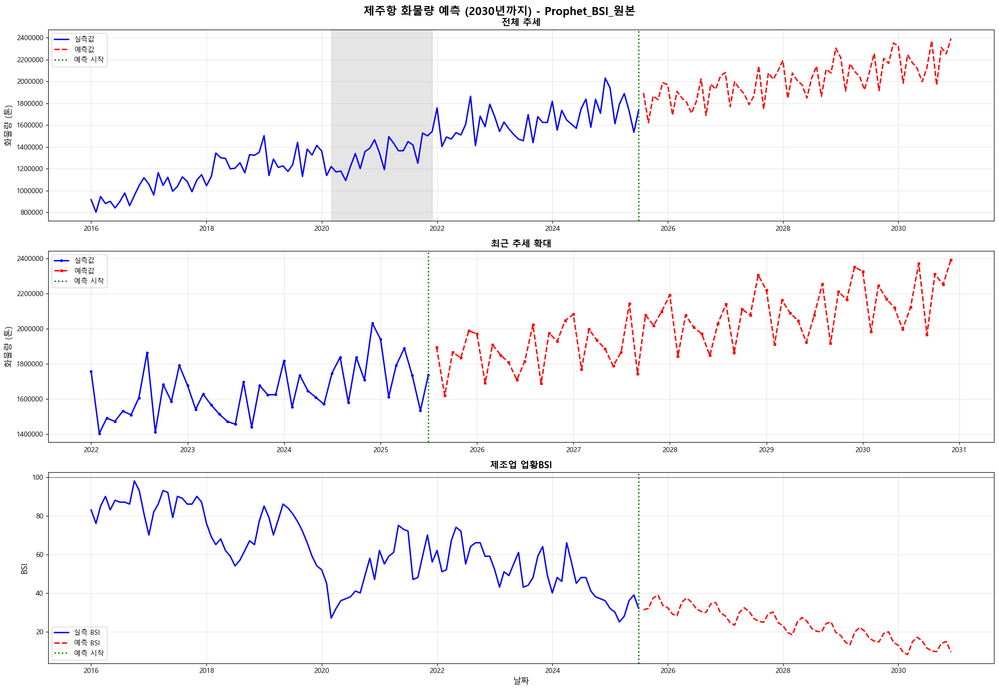

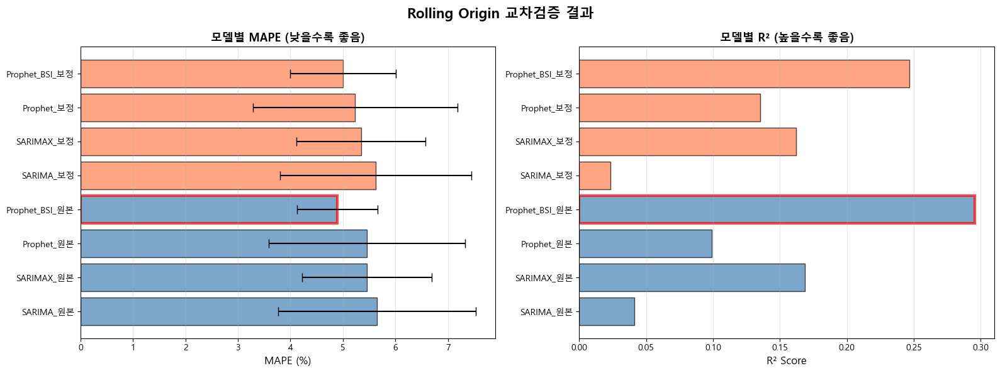

In [ ]:
"""
제주항 화물량 예측 시스템 - 완전 통합판
- 자동 이상치 탐지
- STL 분해 + 보정
- ADF 검정
- Rolling Origin 교차검증 (8개 모델)
- 최고 모델로 2030년 12월까지 예측
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import STL
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 화물량 예측 시스템 - 완전 통합판")
print("=" * 80)

# ========================================
# 1. 데이터 로드
# ========================================
print("\n[1단계] 데이터 로드 중...")

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

print(f"BSI 데이터: {bsi_df.shape}")
print(f"PORT 데이터: {port_df.shape}")

bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

df = port_df.merge(bsi_df[['date', '제조업 업황BSI']], on='date', how='left')
df = df.set_index('date')
df.index.freq = 'MS'

print(f"\n병합된 데이터: {df.shape}")
print(f"기간: {df.index.min()} ~ {df.index.max()}")

df['화물량_원본'] = df['화물량'].copy()
df['BSI_원본'] = df['제조업 업황BSI'].copy()

# ========================================
# 2. 자동 이상치 탐지
# ========================================
print("\n[2단계] 자동 이상치 구간 탐지...")

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    """이동평균 편차 기반 이상치 탐지"""
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    anomaly_mask = deviation > threshold

    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for idx in series.index:
        if anomaly_mask[idx]:
            if not in_anomaly:
                start_idx = idx
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, series.index[series.index.get_loc(idx) - 1]))
            in_anomaly = False
            consecutive_count = 0

    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, series.index[-1]))

    return anomaly_periods, anomaly_mask, deviation

cargo_anomaly_periods, cargo_anomaly_mask, cargo_deviation = detect_anomaly_periods(df['화물량_원본'])
bsi_anomaly_periods, bsi_anomaly_mask, bsi_deviation = detect_anomaly_periods(df['BSI_원본'])

print(f"\n화물량 이상치 구간 ({len(cargo_anomaly_periods)}개):")
for i, (start, end) in enumerate(cargo_anomaly_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")

print(f"\nBSI 이상치 구간 ({len(bsi_anomaly_periods)}개):")
for i, (start, end) in enumerate(bsi_anomaly_periods, 1):
    duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
    print(f"  {i}. {start.strftime('%Y-%m')} ~ {end.strftime('%Y-%m')} ({duration}개월)")

# 통합 이상치 구간
combined_anomaly_mask = cargo_anomaly_mask & bsi_anomaly_mask
combined_periods = []
in_anomaly = False
start_idx = None
consecutive_count = 0

for idx in df.index:
    if combined_anomaly_mask[idx]:
        if not in_anomaly:
            start_idx = idx
            consecutive_count = 1
            in_anomaly = True
        else:
            consecutive_count += 1
    else:
        if in_anomaly and consecutive_count >= 3:
            combined_periods.append((start_idx, df.index[df.index.get_loc(idx) - 1]))
        in_anomaly = False
        consecutive_count = 0

if in_anomaly and consecutive_count >= 3:
    combined_periods.append((start_idx, df.index[-1]))

if len(combined_periods) > 0:
    correction_mask = combined_anomaly_mask
    correction_periods = combined_periods
    print(f"\n✓ 통합 이상치 구간 사용: {len(correction_periods)}개")
elif len(cargo_anomaly_periods) > 0:
    correction_mask = cargo_anomaly_mask
    correction_periods = cargo_anomaly_periods
    print(f"\n✓ 화물량 이상치 구간 사용: {len(correction_periods)}개")
else:
    covid_start = pd.to_datetime('2020-03-01')
    covid_end = pd.to_datetime('2021-12-01')
    correction_periods = [(covid_start, covid_end)]
    correction_mask = (df.index >= covid_start) & (df.index <= covid_end)
    print(f"\n⚠️ 자동 탐지 실패, COVID 기간 사용")

df['is_anomaly'] = correction_mask.astype(int)

# ========================================
# 3. STL 분해 + 보정
# ========================================
print("\n[3단계] STL 분해 + 추세선 대체...")

def stl_decomposition_correction(series, anomaly_mask, period=12, seasonal=13):
    """STL 분해 및 이상치 구간 보정"""
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    corrected_series = series.copy()
    corrected_series[anomaly_mask] = stl_result.trend[anomaly_mask] + stl_result.seasonal[anomaly_mask]

    return corrected_series, stl_result

df['화물량_보정'], cargo_stl = stl_decomposition_correction(df['화물량_원본'], correction_mask)
df['BSI_보정'], bsi_stl = stl_decomposition_correction(df['BSI_원본'], correction_mask)

# STL 품질
cargo_reconstructed = cargo_stl.trend + cargo_stl.seasonal + cargo_stl.resid
cargo_r2 = 1 - (np.sum((df['화물량_원본'] - cargo_reconstructed)**2) /
                np.sum((df['화물량_원본'] - df['화물량_원본'].mean())**2))

bsi_reconstructed = bsi_stl.trend + bsi_stl.seasonal + bsi_stl.resid
bsi_r2 = 1 - (np.sum((df['BSI_원본'] - bsi_reconstructed)**2) /
              np.sum((df['BSI_원본'] - df['BSI_원본'].mean())**2))

print(f"✓ 화물량 STL 분해 R²: {cargo_r2:.4f}")
print(f"✓ BSI STL 분해 R²: {bsi_r2:.4f}")

# 잔차 분석
anomaly_cargo_resid = cargo_stl.resid[correction_mask]
normal_cargo_resid = cargo_stl.resid[~correction_mask]
resid_ratio = anomaly_cargo_resid.std() / normal_cargo_resid.std()

print(f"\n잔차 분석:")
print(f"  정상 기간 표준편차: {normal_cargo_resid.std():,.0f} 톤")
print(f"  이상치 기간 표준편차: {anomaly_cargo_resid.std():,.0f} 톤")
print(f"  비율: {resid_ratio:.2f}배")

# ========================================
# 4. ADF 검정
# ========================================
print("\n[4단계] ADF 검정...")

def adf_test(series, name):
    """ADF 검정"""
    result = adfuller(series.dropna(), autolag='AIC')
    print(f"\n{name}:")
    print(f"  p-value: {result[1]:.4f}")
    if result[1] < 0.05:
        print(f"  ✓ 정상성 만족")
        return True
    else:
        print(f"  ✗ 비정상성")
        return False

cargo_corrected_stationary = adf_test(df['화물량_보정'], "화물량 (보정)")
bsi_corrected_stationary = adf_test(df['BSI_보정'], "BSI (보정)")

df['화물량_보정_diff1'] = df['화물량_보정'].diff()
cargo_diff1_stationary = adf_test(df['화물량_보정_diff1'], "화물량 (보정, 1차 차분)")

if cargo_corrected_stationary:
    recommended_d = 0
elif cargo_diff1_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 d 파라미터: {recommended_d}")

# ========================================
# 5. Rolling Origin 설정
# ========================================
print("\n[5단계] Rolling Origin 설정...")

df_reset = df.reset_index()

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df_reset)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"총 데이터: {total_data}개월")
print(f"Rolling 분할: {len(splits)}회")

# ========================================
# 6. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 7. SARIMA 최적 파라미터
# ========================================
print("\n[6단계] SARIMA 최적 파라미터 탐색...")

first_split = splits[0]
train_data_first = df_reset.iloc[first_split['train_start']:first_split['train_end']]

if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['BSI_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f"✓ 최적: order={best_param}, seasonal={best_seasonal_param}")

# ========================================
# 8. Rolling Origin 교차검증 (8개 모델)
# ========================================
print("\n[7단계] Rolling Origin 교차검증 (8개 모델)...")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본': [],
    'Prophet_원본': [],
    'Prophet_BSI_원본': [],
    'SARIMA_보정': [],
    'SARIMAX_보정': [],
    'Prophet_보정': [],
    'Prophet_BSI_보정': []
}

print("모델 학습 중...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df_reset.iloc[split['train_start']:split['train_end']]
    test_data = df_reset.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # SARIMA 원본
    try:
        sarima_원본 = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_원본_results = sarima_원본.fit(disp=False, maxiter=100)
        sarima_원본_forecast = sarima_원본_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, sarima_원본_forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 원본
    try:
        sarimax_원본 = SARIMAX(train_data['화물량_원본'], exog=train_data[['BSI_원본']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_원본_results = sarimax_원본.fit(disp=False, maxiter=100)
        sarimax_원본_forecast = sarimax_원본_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_원본']])
        rolling_results['SARIMAX_원본'].append(evaluate_predictions(actual_원본, sarimax_원본_forecast.values))
    except:
        rolling_results['SARIMAX_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 원본
    try:
        prophet_원본_train = train_data[['date', '화물량_원본']].copy()
        prophet_원본_train.columns = ['ds', 'y']
        prophet_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_원본.fit(prophet_원본_train)
        future_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_원본_forecast = prophet_원본.predict(future_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, prophet_원본_forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 원본
    try:
        prophet_bsi_원본_train = train_data[['date', '화물량_원본', 'BSI_원본']].copy()
        prophet_bsi_원본_train.columns = ['ds', 'y', 'BSI_원본']
        prophet_bsi_원본 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_원본.add_regressor('BSI_원본')
        prophet_bsi_원본.fit(prophet_bsi_원본_train)

        future_bsi_원본 = prophet_원본.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_원본 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_원본 = future_bsi_원본.merge(full_data_원본[['date', 'BSI_원본']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_원본['BSI_원본'].fillna(method='ffill', inplace=True)
        prophet_bsi_원본_forecast = prophet_bsi_원본.predict(future_bsi_원본).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_원본'].append(evaluate_predictions(actual_원본, prophet_bsi_원본_forecast))
    except:
        rolling_results['Prophet_BSI_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMA 보정
    try:
        sarima_보정 = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        sarima_보정_results = sarima_보정.fit(disp=False, maxiter=100)
        sarima_보정_forecast = sarima_보정_results.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, sarima_보정_forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # SARIMAX 보정
    try:
        sarimax_보정 = SARIMAX(train_data['화물량_보정'], exog=train_data[['BSI_보정']],
                              order=best_param, seasonal_order=best_seasonal_param)
        sarimax_보정_results = sarimax_보정.fit(disp=False, maxiter=100)
        sarimax_보정_forecast = sarimax_보정_results.forecast(steps=TEST_WINDOW, exog=test_data[['BSI_보정']])
        rolling_results['SARIMAX_보정'].append(evaluate_predictions(actual_보정, sarimax_보정_forecast.values))
    except:
        rolling_results['SARIMAX_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet 보정
    try:
        prophet_보정_train = train_data[['date', '화물량_보정']].copy()
        prophet_보정_train.columns = ['ds', 'y']
        prophet_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                             daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_보정.fit(prophet_보정_train)
        future_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        prophet_보정_forecast = prophet_보정.predict(future_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, prophet_보정_forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # Prophet BSI 보정
    try:
        prophet_bsi_보정_train = train_data[['date', '화물량_보정', 'BSI_보정']].copy()
        prophet_bsi_보정_train.columns = ['ds', 'y', 'BSI_보정']
        prophet_bsi_보정 = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                                 daily_seasonality=False, seasonality_mode='multiplicative')
        prophet_bsi_보정.add_regressor('BSI_보정')
        prophet_bsi_보정.fit(prophet_bsi_보정_train)

        future_bsi_보정 = prophet_보정.make_future_dataframe(periods=TEST_WINDOW, freq='MS')
        full_data_보정 = pd.concat([train_data, test_data], ignore_index=True)
        future_bsi_보정 = future_bsi_보정.merge(full_data_보정[['date', 'BSI_보정']],
                                             left_on='ds', right_on='date', how='left')
        future_bsi_보정['BSI_보정'].fillna(method='ffill', inplace=True)
        prophet_bsi_보정_forecast = prophet_bsi_보정.predict(future_bsi_보정).iloc[-TEST_WINDOW:]['yhat'].values
        rolling_results['Prophet_BSI_보정'].append(evaluate_predictions(actual_보정, prophet_bsi_보정_forecast))
    except:
        rolling_results['Prophet_BSI_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# 9. 결과 집계
# ========================================
print("\n[8단계] Rolling Origin 결과 집계...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    summary_results[model_name] = {
        'MAPE_mean': np.mean(mapes),
        'MAPE_std': np.std(mapes),
        'R2_mean': np.mean(r2s),
        'R2_std': np.std(r2s)
    }

print("\n📊 Rolling Origin 평균 성능:")
print("-" * 70)
print(f"{'모델':<25} {'MAPE (%)':<22} {'R²':<20}")
print("-" * 70)

for model_name, metrics in summary_results.items():
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    print(f"{model_name:<25} {mape_str:<22} {r2_str:<20}")

# 최고 모델 선정
best_model_name = min(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])[0]
print(f"\n🏆 최고 성능 모델: {best_model_name}")
print(f"   MAPE: {summary_results[best_model_name]['MAPE_mean']:.2f}%")
print(f"   R²: {summary_results[best_model_name]['R2_mean']:.4f}")

# ========================================
# 10. 2030년 예측 - 미래 BSI 생성
# ========================================
print("\n[9단계] 2030년 12월까지 예측 준비...")

last_date = df.index[-1]
target_date = pd.to_datetime('2030-12-01')
months_to_predict = (target_date.year - last_date.year) * 12 + (target_date.month - last_date.month)

print(f"마지막 데이터: {last_date.strftime('%Y-%m')}")
print(f"예측 목표: 2030-12")
print(f"예측 기간: {months_to_predict}개월")

# BSI 예측
print("\nBSI 예측 중...")
try:
    if 'BSI_보정' in best_model_name:
        bsi_to_forecast = df['BSI_보정']
    else:
        bsi_to_forecast = df['BSI_원본']

    bsi_model = SARIMAX(bsi_to_forecast, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    bsi_result = bsi_model.fit(disp=False, maxiter=200)
    bsi_forecast = bsi_result.forecast(steps=months_to_predict)

    print(f"✓ BSI 예측 완료 (범위: {bsi_forecast.min():.1f} ~ {bsi_forecast.max():.1f})")
except Exception as e:
    print(f"BSI 예측 실패, 평균값 사용")
    bsi_forecast = pd.Series([bsi_to_forecast.mean()] * months_to_predict)

future_dates = pd.date_range(start=last_date + pd.DateOffset(months=1),
                             periods=months_to_predict, freq='MS')

# ========================================
# 11. 최고 모델로 2030년 예측
# ========================================
print("\n[10단계] 최고 모델로 2030년 예측 수행...")

if 'SARIMAX_보정' == best_model_name:
    print("SARIMAX_보정 모델 학습...")
    final_model = SARIMAX(df['화물량_보정'], exog=df[['BSI_보정']],
                         order=best_param, seasonal_order=best_seasonal_param)
    final_result = final_model.fit(disp=False, maxiter=200)

    future_exog = pd.DataFrame({'BSI_보정': bsi_forecast.values})
    forecast = final_result.forecast(steps=months_to_predict, exog=future_exog)
    forecast_bsi = bsi_forecast.values

elif 'SARIMAX_원본' == best_model_name:
    print("SARIMAX_원본 모델 학습...")
    final_model = SARIMAX(df['화물량_원본'], exog=df[['BSI_원본']],
                         order=best_param, seasonal_order=best_seasonal_param)
    final_result = final_model.fit(disp=False, maxiter=200)

    future_exog = pd.DataFrame({'BSI_원본': bsi_forecast.values})
    forecast = final_result.forecast(steps=months_to_predict, exog=future_exog)
    forecast_bsi = bsi_forecast.values

elif 'Prophet_BSI_보정' == best_model_name:
    print("Prophet_BSI_보정 모델 학습...")
    prophet_train = df.reset_index()[['date', '화물량_보정', 'BSI_보정']].copy()
    prophet_train.columns = ['ds', 'y', 'BSI_보정']

    final_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                         daily_seasonality=False, seasonality_mode='multiplicative')
    final_model.add_regressor('BSI_보정')
    final_model.fit(prophet_train)

    future_df = pd.DataFrame({'ds': future_dates, 'BSI_보정': bsi_forecast.values})
    forecast_full = final_model.predict(pd.concat([prophet_train[['ds', 'BSI_보정']], future_df]))
    forecast = forecast_full.iloc[-months_to_predict:]['yhat']
    forecast_bsi = bsi_forecast.values

elif 'Prophet_BSI_원본' == best_model_name:
    print("Prophet_BSI_원본 모델 학습...")
    prophet_train = df.reset_index()[['date', '화물량_원본', 'BSI_원본']].copy()
    prophet_train.columns = ['ds', 'y', 'BSI_원본']

    final_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                         daily_seasonality=False, seasonality_mode='multiplicative')
    final_model.add_regressor('BSI_원본')
    final_model.fit(prophet_train)

    future_df = pd.DataFrame({'ds': future_dates, 'BSI_원본': bsi_forecast.values})
    forecast_full = final_model.predict(pd.concat([prophet_train[['ds', 'BSI_원본']], future_df]))
    forecast = forecast_full.iloc[-months_to_predict:]['yhat']
    forecast_bsi = bsi_forecast.values

elif 'SARIMA_보정' == best_model_name:
    print("SARIMA_보정 모델 학습...")
    final_model = SARIMAX(df['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
    final_result = final_model.fit(disp=False, maxiter=200)
    forecast = final_result.forecast(steps=months_to_predict)
    forecast_bsi = bsi_forecast.values

elif 'SARIMA_원본' == best_model_name:
    print("SARIMA_원본 모델 학습...")
    final_model = SARIMAX(df['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
    final_result = final_model.fit(disp=False, maxiter=200)
    forecast = final_result.forecast(steps=months_to_predict)
    forecast_bsi = bsi_forecast.values

elif 'Prophet_보정' == best_model_name:
    print("Prophet_보정 모델 학습...")
    prophet_train = df.reset_index()[['date', '화물량_보정']].copy()
    prophet_train.columns = ['ds', 'y']

    final_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                         daily_seasonality=False, seasonality_mode='multiplicative')
    final_model.fit(prophet_train)

    future_df = pd.DataFrame({'ds': future_dates})
    forecast_full = final_model.predict(future_df)
    forecast = forecast_full['yhat']
    forecast_bsi = bsi_forecast.values

else:  # Prophet_원본
    print("Prophet_원본 모델 학습...")
    prophet_train = df.reset_index()[['date', '화물량_원본']].copy()
    prophet_train.columns = ['ds', 'y']

    final_model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                         daily_seasonality=False, seasonality_mode='multiplicative')
    final_model.fit(prophet_train)

    future_df = pd.DataFrame({'ds': future_dates})
    forecast_full = final_model.predict(future_df)
    forecast = forecast_full['yhat']
    forecast_bsi = bsi_forecast.values

print(f"✓ 예측 완료!")
print(f"  예측 범위: {forecast.min():,.0f} ~ {forecast.max():,.0f} 톤")

# ========================================
# 12. 예측 결과 정리
# ========================================
print("\n[11단계] 예측 결과 정리...")

forecast_df = pd.DataFrame({
    '날짜': future_dates,
    '연도': [d.year for d in future_dates],
    '월': [d.month for d in future_dates],
    '예측_화물량': forecast.values,
    '예측_BSI': forecast_bsi
})

yearly_forecast = forecast_df.groupby('연도').agg({
    '예측_화물량': ['mean', 'sum', 'min', 'max'],
    '예측_BSI': 'mean'
}).round(0)

yearly_forecast.columns = ['월평균_화물량', '연간_총화물량', '최소_화물량', '최대_화물량', '평균_BSI']

print("\n📊 연도별 예측:")
print(yearly_forecast)

# ========================================
# 13. 시각화
# ========================================
print("\n[12단계] 시각화 중...")

# 그래프 1: 전체 예측
fig1, axes1 = plt.subplots(3, 1, figsize=(20, 14))
fig1.suptitle(f'제주항 화물량 예측 (2030년까지) - {best_model_name}',
             fontsize=16, fontweight='bold')

# 전체 시계열
ax1 = axes1[0]
ax1.plot(df.index, df['화물량_원본'], label='실측값', color='blue', linewidth=2)
ax1.plot(future_dates, forecast.values, label='예측값', color='red', linewidth=2, linestyle='--')
ax1.axvline(x=df.index[-1], color='green', linestyle=':', linewidth=2, label='예측 시작')
for start, end in correction_periods:
    ax1.axvspan(start, end, alpha=0.2, color='gray')
ax1.set_ylabel('화물량 (톤)', fontsize=12)
ax1.set_title('전체 추세', fontsize=13, fontweight='bold')
ax1.legend(loc='best')
ax1.grid(True, alpha=0.3)
ax1.ticklabel_format(style='plain', axis='y')

# 최근 3년 + 예측
ax2 = axes1[1]
recent_data = df[df.index >= '2022-01-01']
ax2.plot(recent_data.index, recent_data['화물량_원본'], label='실측값',
         color='blue', linewidth=2, marker='o', markersize=3)
ax2.plot(future_dates, forecast.values, label='예측값',
         color='red', linewidth=2, linestyle='--', marker='s', markersize=3)
ax2.axvline(x=df.index[-1], color='green', linestyle=':', linewidth=2, label='예측 시작')
ax2.set_ylabel('화물량 (톤)', fontsize=12)
ax2.set_title('최근 추세 확대', fontsize=13, fontweight='bold')
ax2.legend(loc='best')
ax2.grid(True, alpha=0.3)
ax2.ticklabel_format(style='plain', axis='y')

# BSI
ax3 = axes1[2]
ax3.plot(df.index, df['BSI_원본'], label='실측 BSI', color='blue', linewidth=2)
ax3.plot(future_dates, forecast_bsi, label='예측 BSI', color='red', linewidth=2, linestyle='--')
ax3.axvline(x=df.index[-1], color='green', linestyle=':', linewidth=2, label='예측 시작')
ax3.axhline(y=100, color='black', linestyle='-', linewidth=1, alpha=0.5)
ax3.set_ylabel('BSI', fontsize=12)
ax3.set_xlabel('날짜', fontsize=12)
ax3.set_title('제조업 업황BSI', fontsize=13, fontweight='bold')
ax3.legend(loc='best')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_2030년_예측_종합.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/제주항_2030년_예측_종합.png")

# 그래프 2: Rolling Origin 성능
fig2, axes2 = plt.subplots(1, 2, figsize=(16, 6))
fig2.suptitle('Rolling Origin 교차검증 결과', fontsize=16, fontweight='bold')

model_names = list(summary_results.keys())
mapes = [summary_results[m]['MAPE_mean'] for m in model_names]
mape_stds = [summary_results[m]['MAPE_std'] for m in model_names]

colors = ['steelblue' if '원본' in m else 'coral' for m in model_names]

ax1 = axes2[0]
bars = ax1.barh(model_names, mapes, xerr=mape_stds, color=colors, alpha=0.7, edgecolor='black', capsize=5)
ax1.set_xlabel('MAPE (%)', fontsize=12)
ax1.set_title('모델별 MAPE (낮을수록 좋음)', fontsize=13, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# 최고 모델 강조
best_idx = model_names.index(best_model_name)
bars[best_idx].set_edgecolor('red')
bars[best_idx].set_linewidth(3)

ax2 = axes2[1]
r2s = [summary_results[m]['R2_mean'] for m in model_names]
bars2 = ax2.barh(model_names, r2s, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('R² Score', fontsize=12)
ax2.set_title('모델별 R² (높을수록 좋음)', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

bars2[best_idx].set_edgecolor('red')
bars2[best_idx].set_linewidth(3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Rolling_Origin_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/Rolling_Origin_성능비교.png")

# ========================================
# 14. 엑셀 저장
# ========================================
print("\n[13단계] 엑셀 저장...")

with pd.ExcelWriter(f'{DATA_PATH}/제주항_완전분석_2030예측.xlsx', engine='openpyxl') as writer:
    # 1. 종합 요약
    summary_info = pd.DataFrame({
        '항목': [
            '분석 기간',
            '이상치 구간 수',
            'STL 화물량 R²',
            'STL BSI R²',
            '잔차 비율',
            'Rolling 분할 수',
            '최고 모델',
            '최고 모델 MAPE',
            '최고 모델 R²',
            '예측 기간',
            '예측 개월 수',
            '평균 예측 화물량'
        ],
        '내용': [
            f"{df.index.min().strftime('%Y-%m')} ~ {df.index.max().strftime('%Y-%m')}",
            str(len(correction_periods)),
            f"{cargo_r2:.4f}",
            f"{bsi_r2:.4f}",
            f"{resid_ratio:.2f}배",
            str(len(splits)),
            best_model_name,
            f"{summary_results[best_model_name]['MAPE_mean']:.2f}%",
            f"{summary_results[best_model_name]['R2_mean']:.4f}",
            f"{future_dates[0].strftime('%Y-%m')} ~ {future_dates[-1].strftime('%Y-%m')}",
            str(months_to_predict),
            f"{forecast.mean():,.0f} 톤"
        ]
    })
    summary_info.to_excel(writer, sheet_name='종합요약', index=False)

    # 2. 이상치 구간
    anomaly_info = []
    for i, (start, end) in enumerate(correction_periods, 1):
        duration = (end.year - start.year) * 12 + (end.month - start.month) + 1
        anomaly_info.append({
            '구간': i,
            '시작': start.strftime('%Y-%m'),
            '종료': end.strftime('%Y-%m'),
            '기간(개월)': duration
        })
    pd.DataFrame(anomaly_info).to_excel(writer, sheet_name='이상치구간', index=False)

    # 3. Rolling Origin 성능
    pd.DataFrame(summary_results).T.to_excel(writer, sheet_name='Rolling_성능')

    # 4. 월별 예측
    forecast_df.to_excel(writer, sheet_name='월별예측', index=False)

    # 5. 연도별 예측
    yearly_forecast.to_excel(writer, sheet_name='연도별예측')

    # 6. 과거 실적
    historical = df.reset_index()[['date', '화물량_원본', 'BSI_원본']]
    historical.columns = ['날짜', '실측_화물량', '실측_BSI']
    historical.to_excel(writer, sheet_name='과거실적', index=False)

print(f"✓ 저장: {DATA_PATH}/제주항_완전분석_2030예측.xlsx")

# ========================================
# 15. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/제주항_2030년_예측_종합.png")
print(f"2. {DATA_PATH}/Rolling_Origin_성능비교.png")
print(f"3. {DATA_PATH}/제주항_완전분석_2030예측.xlsx")

print(f"\n🏆 최고 성능 모델: {best_model_name}")
print(f"   Rolling MAPE: {summary_results[best_model_name]['MAPE_mean']:.2f}% (±{summary_results[best_model_name]['MAPE_std']:.2f})")
print(f"   Rolling R²: {summary_results[best_model_name]['R2_mean']:.4f} (±{summary_results[best_model_name]['R2_std']:.4f})")

print(f"\n📊 2030년 예측:")
print(f"   기간: {months_to_predict}개월")
print(f"   평균 화물량: {forecast.mean():,.0f} 톤/월")
print(f"   예측 범위: {forecast.min():,.0f} ~ {forecast.max():,.0f} 톤")

print("\n📈 연도별 예측 총화물량:")
for year in sorted(forecast_df['연도'].unique()):
    year_data = forecast_df[forecast_df['연도'] == year]
    total = year_data['예측_화물량'].sum()
    print(f"   {year}년: {total:,.0f} 톤")

print("\n" + "=" * 80)
print("✅ 완전 통합 분석 완료!")
print("   - 자동 이상치 탐지")
print("   - STL 분해 보정")
print("   - Rolling Origin 교차검증 (8개 모델)")
print("   - 2030년 12월까지 예측")
print("=" * 80)

# 제주항 물동량 + 제조업-비제조업 BSI 간 상관관계 확인

제주항 화물량 - BSI 변수 실전 판단 시스템

[1단계] 데이터 로드...
데이터 기간: 2016-01 ~ 2025-07
총 데이터: 115개월

BSI 변수: 6개
  1. 제조업 기업심리지수실적
  2. 제조업 업황BSI
  3. 제조업 매출BSI
  4. 비제조업 기업심리지수실적
  5. 비제조업 업황BSI
  6. 비제조업 매출BSI

[Step 1] 상관관계 분석

📊 화물량 vs BSI 상관관계:
--------------------------------------------------------------------------------
BSI 변수                         상관계수         p-value      유의성       
--------------------------------------------------------------------------------
제조업 기업심리지수실적                     -0.501     0.000000     ✓ 유의함       (강함)
제조업 업황BSI                        -0.654     0.000000     ✓ 유의함       (강함)
제조업 매출BSI                        -0.389     0.000018     ✓ 유의함       (중간)
비제조업 기업심리지수실적                    -0.294     0.001400     ✓ 유의함       (약함)
비제조업 업황BSI                       -0.361     0.000075     ✓ 유의함       (중간)
비제조업 매출BSI                       -0.185     0.047931     ✓ 유의함       (약함)

💡 상관관계 해석:
  • |상관계수| ≥ 0.7 : 매우 강한 상관 - 매우 유용한 변수
  • |상관계수| ≥ 0.5 : 강한 상관 - 유용한 변수
  • |상관계

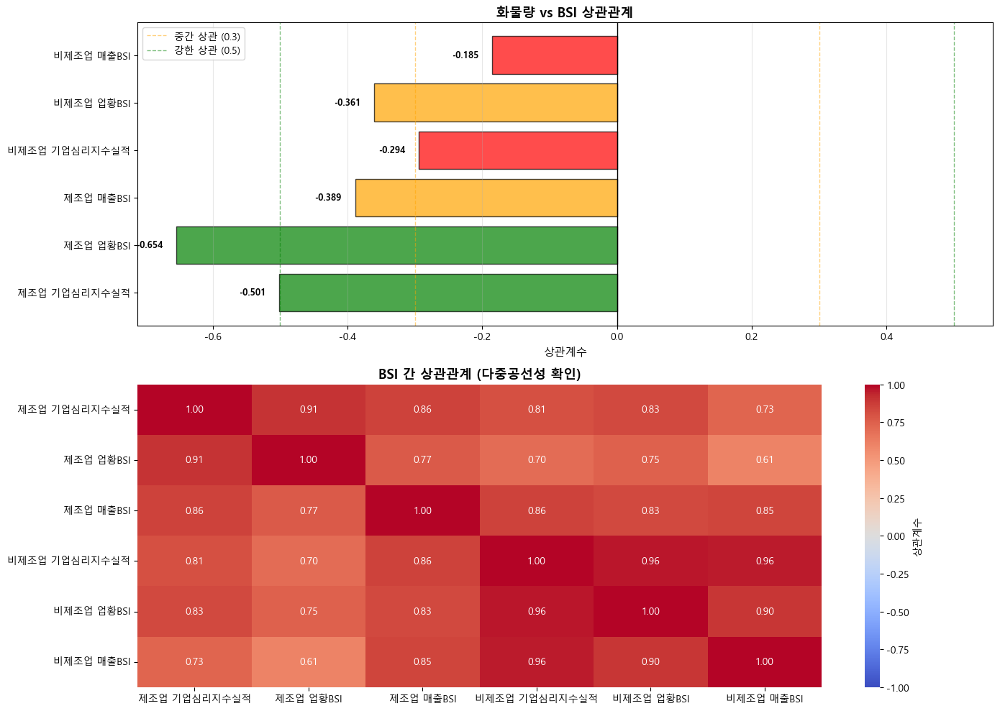

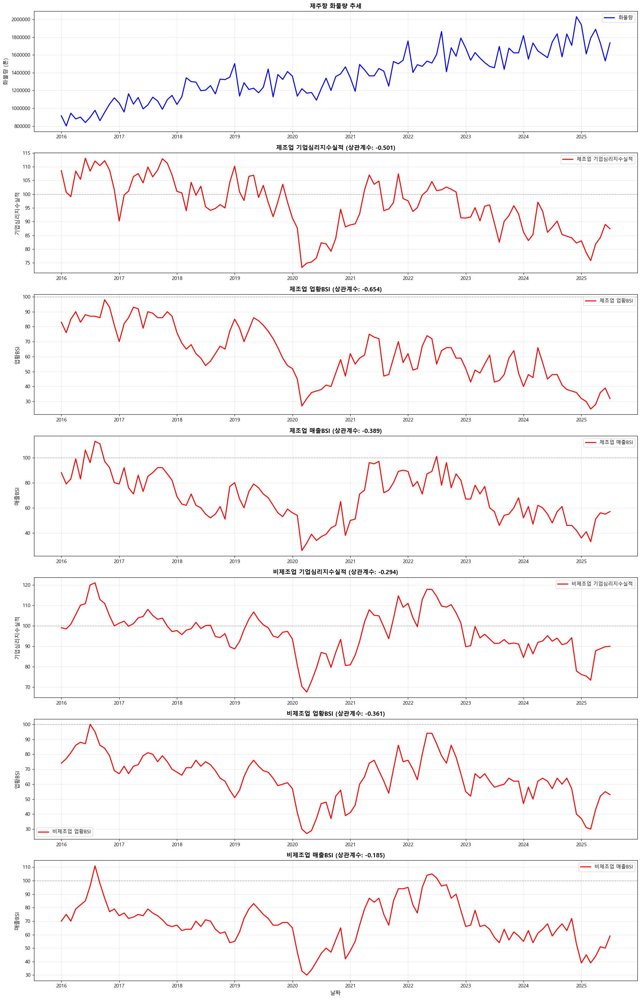

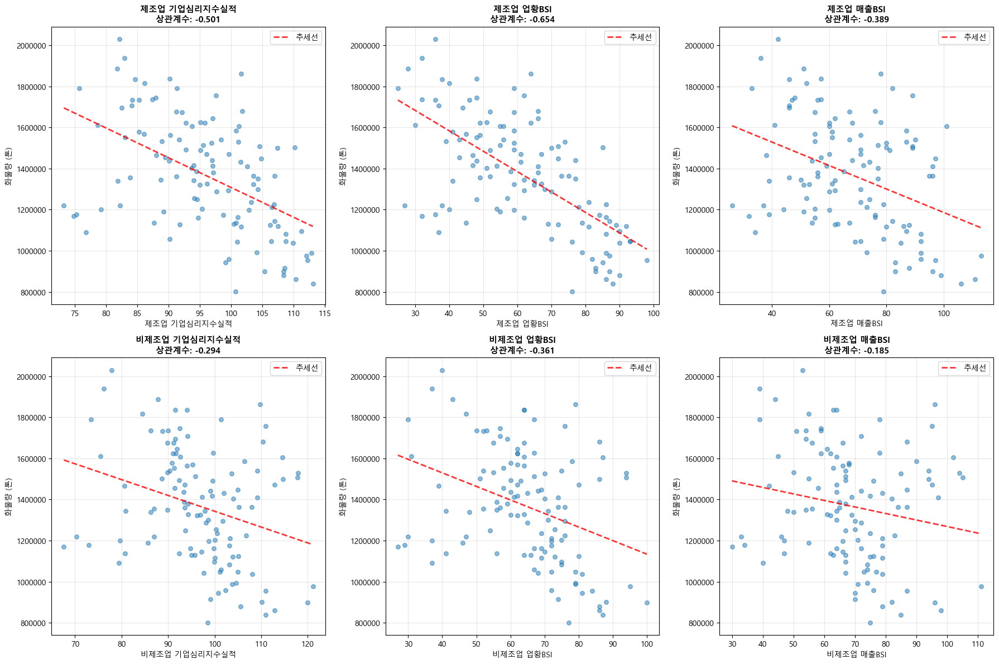

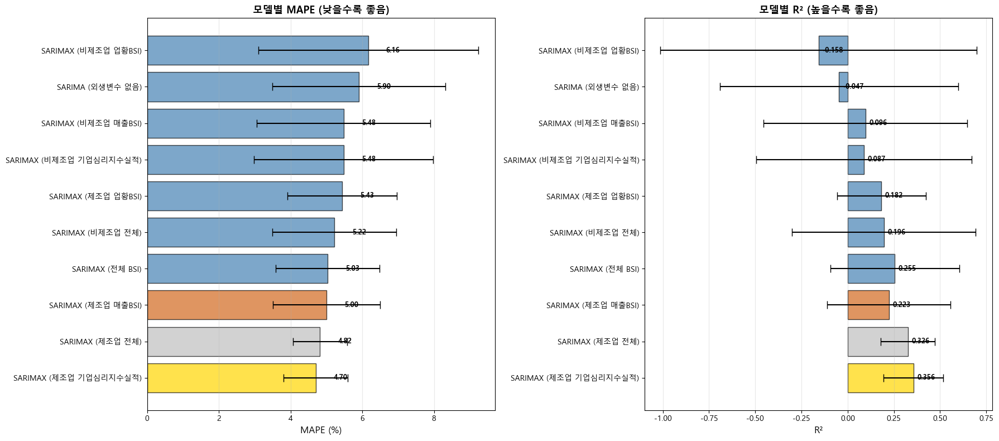

In [ ]:
"""
제주항 화물량 - BSI 변수 실전 판단 시스템
Step 1: 상관관계 분석
Step 2: 모델 성능 비교 (Rolling Origin)
Step 3: 최적 변수 조합 선정
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, r2_score
from scipy.stats import pearsonr

print("=" * 80)
print("제주항 화물량 - BSI 변수 실전 판단 시스템")
print("=" * 80)

# ========================================
# 1. 데이터 로드
# ========================================
print("\n[1단계] 데이터 로드...")

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

bsi_df = pd.read_excel(f'{DATA_PATH}/bsi data.xlsx')
port_df = pd.read_excel(f'{DATA_PATH}/port data.xlsx')

# year를 정수로 변환
bsi_df['year'] = bsi_df['year'].astype(int)
port_df['year'] = port_df['year'].astype(int)

# 날짜 생성
bsi_df['date'] = pd.to_datetime(bsi_df['year'].astype(str) + '-' + bsi_df['month'].astype(str) + '-01')
port_df['date'] = pd.to_datetime(port_df['year'].astype(str) + '-' + port_df['month'].astype(str) + '-01')

# 병합
df = port_df.merge(bsi_df, on='date', how='inner')

print(f"데이터 기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"총 데이터: {len(df)}개월")

# BSI 변수 목록
bsi_columns = [
    '제조업 기업심리지수실적',
    '제조업 업황BSI',
    '제조업 매출BSI',
    '비제조업 기업심리지수실적',
    '비제조업 업황BSI',
    '비제조업 매출BSI'
]

print(f"\nBSI 변수: {len(bsi_columns)}개")
for i, col in enumerate(bsi_columns, 1):
    print(f"  {i}. {col}")

# ========================================
# 2. Step 1: 상관관계 분석
# ========================================
print("\n" + "=" * 80)
print("[Step 1] 상관관계 분석")
print("=" * 80)

# 화물량과 각 BSI의 상관계수
correlations = {}
for bsi_col in bsi_columns:
    corr, p_value = pearsonr(df['화물량'], df[bsi_col])
    correlations[bsi_col] = {
        'correlation': corr,
        'p_value': p_value,
        'significant': p_value < 0.05
    }

# 결과 출력
print("\n📊 화물량 vs BSI 상관관계:")
print("-" * 80)
print(f"{'BSI 변수':<30} {'상관계수':<12} {'p-value':<12} {'유의성':<10}")
print("-" * 80)

for bsi_col, result in correlations.items():
    corr = result['correlation']
    p_val = result['p_value']
    sig = '✓ 유의함' if result['significant'] else '✗ 무의미'

    # 상관 강도 표시
    if abs(corr) >= 0.7:
        strength = "매우 강함"
    elif abs(corr) >= 0.5:
        strength = "강함"
    elif abs(corr) >= 0.3:
        strength = "중간"
    else:
        strength = "약함"

    print(f"{bsi_col:<30} {corr:>8.3f}     {p_val:>8.6f}     {sig:<10}  ({strength})")

print("\n💡 상관관계 해석:")
print("  • |상관계수| ≥ 0.7 : 매우 강한 상관 - 매우 유용한 변수")
print("  • |상관계수| ≥ 0.5 : 강한 상관 - 유용한 변수")
print("  • |상관계수| ≥ 0.3 : 중간 상관 - 고려 가능")
print("  • |상관계수| < 0.3 : 약한 상관 - 사용 부적절")
print("  • p-value < 0.05 : 통계적으로 유의함")

# 추세 분석
print("\n📈 추세 분석:")
print("-" * 80)

cargo_trend = df['화물량'].iloc[-12:].mean() - df['화물량'].iloc[:12].mean()
cargo_direction = "상승 ↑" if cargo_trend > 0 else "하락 ↓"

print(f"화물량 추세 (최근 12개월 vs 초기 12개월): {cargo_direction}")
print(f"  차이: {cargo_trend:,.0f} 톤\n")

for bsi_col in bsi_columns:
    bsi_trend = df[bsi_col].iloc[-12:].mean() - df[bsi_col].iloc[:12].mean()
    bsi_direction = "상승 ↑" if bsi_trend > 0 else "하락 ↓"

    # 방향 일치 여부
    same_direction = (cargo_trend > 0 and bsi_trend > 0) or (cargo_trend < 0 and bsi_trend < 0)
    match = "✓ 일치" if same_direction else "✗ 불일치"

    print(f"{bsi_col:<30} {bsi_direction} ({match})")

# ========================================
# 3. BSI 간 다중공선성 확인
# ========================================
print("\n" + "=" * 80)
print("[다중공선성 확인] BSI 간 상관관계")
print("=" * 80)

bsi_corr_matrix = df[bsi_columns].corr()

print("\n상관계수 매트릭스:")
print(bsi_corr_matrix.round(3))

# 높은 상관관계 쌍 찾기
print("\n⚠️ 다중공선성 위험 (상관계수 > 0.7):")
high_corr_pairs = []
for i in range(len(bsi_columns)):
    for j in range(i+1, len(bsi_columns)):
        corr_val = bsi_corr_matrix.iloc[i, j]
        if abs(corr_val) > 0.7:
            high_corr_pairs.append((bsi_columns[i], bsi_columns[j], corr_val))
            print(f"  • {bsi_columns[i]} ↔ {bsi_columns[j]}: {corr_val:.3f}")

if not high_corr_pairs:
    print("  없음 (모든 BSI 변수가 독립적)")
else:
    print("\n💡 해석: 상관계수가 높은 변수들은 비슷한 정보를 담고 있어")
    print("         동시에 사용하면 다중공선성 문제 발생 가능")

# ========================================
# 4. 시각화
# ========================================
print("\n[시각화] 그래프 생성 중...")

# 그래프 1: 상관계수 막대 그래프
fig1, axes1 = plt.subplots(2, 1, figsize=(14, 10))

# 상관계수
ax1 = axes1[0]
corr_values = [correlations[col]['correlation'] for col in bsi_columns]
colors = ['green' if abs(c) >= 0.5 else 'orange' if abs(c) >= 0.3 else 'red' for c in corr_values]

bars = ax1.barh(bsi_columns, corr_values, color=colors, alpha=0.7, edgecolor='black')
ax1.axvline(x=0, color='black', linestyle='-', linewidth=1)
ax1.axvline(x=0.3, color='orange', linestyle='--', linewidth=1, alpha=0.5, label='중간 상관 (0.3)')
ax1.axvline(x=-0.3, color='orange', linestyle='--', linewidth=1, alpha=0.5)
ax1.axvline(x=0.5, color='green', linestyle='--', linewidth=1, alpha=0.5, label='강한 상관 (0.5)')
ax1.axvline(x=-0.5, color='green', linestyle='--', linewidth=1, alpha=0.5)
ax1.set_xlabel('상관계수', fontsize=11)
ax1.set_title('화물량 vs BSI 상관관계', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(axis='x', alpha=0.3)

# 값 표시
for i, (bar, val) in enumerate(zip(bars, corr_values)):
    x_pos = val + (0.02 if val > 0 else -0.02)
    ha = 'left' if val > 0 else 'right'
    ax1.text(x_pos, bar.get_y() + bar.get_height()/2, f'{val:.3f}',
            va='center', ha=ha, fontsize=9, fontweight='bold')

# BSI 간 상관관계 히트맵
ax2 = axes1[1]
sns.heatmap(bsi_corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=0,
            ax=ax2, cbar_kws={'label': '상관계수'}, vmin=-1, vmax=1)
ax2.set_title('BSI 간 상관관계 (다중공선성 확인)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/BSI_상관관계_분석.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/BSI_상관관계_분석.png")

# 그래프 2: 시계열 비교
fig2, axes2 = plt.subplots(len(bsi_columns) + 1, 1, figsize=(18, 4 * (len(bsi_columns) + 1)))

# 화물량
ax = axes2[0]
ax.plot(df['date'], df['화물량'], color='blue', linewidth=2, label='화물량')
ax.set_ylabel('화물량 (톤)', fontsize=11)
ax.set_title('제주항 화물량 추세', fontsize=12, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.ticklabel_format(style='plain', axis='y')

# 각 BSI
for i, bsi_col in enumerate(bsi_columns, 1):
    ax = axes2[i]
    ax.plot(df['date'], df[bsi_col], color='red', linewidth=2, label=bsi_col)
    ax.set_ylabel(bsi_col.split()[-1], fontsize=11)
    ax.set_title(f'{bsi_col} (상관계수: {correlations[bsi_col]["correlation"]:.3f})',
                fontsize=12, fontweight='bold')
    ax.axhline(y=100, color='black', linestyle='--', linewidth=1, alpha=0.3)
    ax.legend()
    ax.grid(True, alpha=0.3)

axes2[-1].set_xlabel('날짜', fontsize=11)
plt.tight_layout()
plt.savefig(f'{DATA_PATH}/BSI_시계열_비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/BSI_시계열_비교.png")

# 그래프 3: 산점도
fig3, axes3 = plt.subplots(2, 3, figsize=(18, 12))
axes3 = axes3.flatten()

for i, bsi_col in enumerate(bsi_columns):
    ax = axes3[i]
    ax.scatter(df[bsi_col], df['화물량'], alpha=0.5, s=30)

    # 추세선
    z = np.polyfit(df[bsi_col], df['화물량'], 1)
    p = np.poly1d(z)
    x_line = np.linspace(df[bsi_col].min(), df[bsi_col].max(), 100)
    ax.plot(x_line, p(x_line), "r--", linewidth=2, alpha=0.8, label=f'추세선')

    corr = correlations[bsi_col]['correlation']
    ax.set_xlabel(bsi_col, fontsize=10)
    ax.set_ylabel('화물량 (톤)', fontsize=10)
    ax.set_title(f'{bsi_col}\n상관계수: {corr:.3f}', fontsize=11, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.ticklabel_format(style='plain', axis='y')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/BSI_산점도.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/BSI_산점도.png")

# ========================================
# 5. Step 2: 모델 성능 비교 (Rolling Origin)
# ========================================
print("\n" + "=" * 80)
print("[Step 2] 모델 성능 비교 (Rolling Origin)")
print("=" * 80)

# Rolling Origin 설정
INITIAL_TRAIN = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append((train_end, test_start, test_end))

print(f"\nRolling Origin 설정:")
print(f"  초기 학습: {INITIAL_TRAIN}개월")
print(f"  테스트 윈도우: {TEST_WINDOW}개월")
print(f"  분할 횟수: {len(splits)}회")

# 평가 함수
def evaluate_model(actual, predicted):
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return mape, r2

# 테스트할 모델 조합
model_configs = [
    {'name': 'SARIMA (외생변수 없음)', 'exog': None},
]

# 각 BSI 단독
for bsi_col in bsi_columns:
    model_configs.append({
        'name': f'SARIMAX ({bsi_col})',
        'exog': [bsi_col]
    })

# 제조업 전체
model_configs.append({
    'name': 'SARIMAX (제조업 전체)',
    'exog': ['제조업 기업심리지수실적', '제조업 업황BSI', '제조업 매출BSI']
})

# 비제조업 전체
model_configs.append({
    'name': 'SARIMAX (비제조업 전체)',
    'exog': ['비제조업 기업심리지수실적', '비제조업 업황BSI', '비제조업 매출BSI']
})

# 전체 BSI
model_configs.append({
    'name': 'SARIMAX (전체 BSI)',
    'exog': bsi_columns
})

print(f"\n테스트할 모델: {len(model_configs)}개")

# Rolling Origin 수행
results = {config['name']: [] for config in model_configs}

print("\n모델 학습 중...")
for split_idx, (train_end, test_start, test_end) in enumerate(splits, 1):
    print(f"  Split {split_idx}/{len(splits)} 처리 중...", end='\r')

    train_data = df.iloc[:train_end]
    test_data = df.iloc[test_start:test_end]
    actual = test_data['화물량'].values

    for config in model_configs:
        try:
            if config['exog'] is None:
                # SARIMA
                model = SARIMAX(train_data['화물량'],
                              order=(1, 1, 1),
                              seasonal_order=(1, 1, 1, 12))
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW)
            else:
                # SARIMAX
                model = SARIMAX(train_data['화물량'],
                              exog=train_data[config['exog']],
                              order=(1, 1, 1),
                              seasonal_order=(1, 1, 1, 12))
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[config['exog']])

            mape, r2 = evaluate_model(actual, forecast.values)
            results[config['name']].append({'MAPE': mape, 'R2': r2})
        except:
            results[config['name']].append({'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# 6. Step 3: 성능 집계 및 최적 모델 선정
# ========================================
print("\n" + "=" * 80)
print("[Step 3] 성능 집계 및 최적 모델 선정")
print("=" * 80)

summary = {}
for model_name, metric_list in results.items():
    mapes = [m['MAPE'] for m in metric_list if not np.isnan(m['MAPE'])]
    r2s = [m['R2'] for m in metric_list if not np.isnan(m['R2'])]

    if mapes:
        summary[model_name] = {
            'MAPE_mean': np.mean(mapes),
            'MAPE_std': np.std(mapes),
            'R2_mean': np.mean(r2s),
            'R2_std': np.std(r2s)
        }

# 정렬 (MAPE 기준)
sorted_models = sorted(summary.items(), key=lambda x: x[1]['MAPE_mean'])

print("\n📊 모델 성능 순위 (MAPE 낮을수록 좋음):")
print("-" * 90)
print(f"{'순위':<5} {'모델':<50} {'MAPE (%)':<20} {'R²':<20}")
print("-" * 90)

for rank, (model_name, metrics) in enumerate(sorted_models, 1):
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"

    # 강조
    if rank == 1:
        print(f"🏆 {rank:<3} {model_name:<50} {mape_str:<20} {r2_str:<20}")
    elif rank <= 3:
        print(f"⭐ {rank:<3} {model_name:<50} {mape_str:<20} {r2_str:<20}")
    else:
        print(f"   {rank:<3} {model_name:<50} {mape_str:<20} {r2_str:<20}")

best_model = sorted_models[0][0]
best_metrics = sorted_models[0][1]

print("\n" + "=" * 80)
print("🏆 최고 성능 모델")
print("=" * 80)
print(f"모델: {best_model}")
print(f"MAPE: {best_metrics['MAPE_mean']:.2f}% (±{best_metrics['MAPE_std']:.2f})")
print(f"R²: {best_metrics['R2_mean']:.4f} (±{best_metrics['R2_std']:.4f})")

# ========================================
# 7. 성능 시각화
# ========================================
print("\n[시각화] 성능 비교 그래프...")

fig4, axes4 = plt.subplots(1, 2, figsize=(18, 8))

# MAPE
ax1 = axes4[0]
models = [m[0] for m in sorted_models]
mapes = [m[1]['MAPE_mean'] for m in sorted_models]
mape_stds = [m[1]['MAPE_std'] for m in sorted_models]

colors = ['gold' if i == 0 else 'silver' if i == 1 else 'chocolate' if i == 2 else 'steelblue'
          for i in range(len(models))]

bars1 = ax1.barh(models, mapes, xerr=mape_stds, color=colors, alpha=0.7,
                edgecolor='black', capsize=5)
ax1.set_xlabel('MAPE (%)', fontsize=12)
ax1.set_title('모델별 MAPE (낮을수록 좋음)', fontsize=13, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# 값 표시
for bar, val in zip(bars1, mapes):
    ax1.text(val + 0.5, bar.get_y() + bar.get_height()/2, f'{val:.2f}',
            va='center', ha='left', fontsize=9, fontweight='bold')

# R²
ax2 = axes4[1]
r2s = [m[1]['R2_mean'] for m in sorted_models]
r2_stds = [m[1]['R2_std'] for m in sorted_models]

bars2 = ax2.barh(models, r2s, xerr=r2_stds, color=colors, alpha=0.7,
                edgecolor='black', capsize=5)
ax2.set_xlabel('R²', fontsize=12)
ax2.set_title('모델별 R² (높을수록 좋음)', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# 값 표시
for bar, val in zip(bars2, r2s):
    ax2.text(val + 0.02, bar.get_y() + bar.get_height()/2, f'{val:.3f}',
            va='center', ha='left', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/BSI_모델_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/BSI_모델_성능비교.png")

# ========================================
# 8. 결론 및 권장사항
# ========================================
print("\n" + "=" * 80)
print("💡 최종 결론 및 권장사항")
print("=" * 80)

# SARIMA 성능
sarima_performance = summary['SARIMA (외생변수 없음)']
print(f"\n1. 기준 모델 (SARIMA, 외생변수 없음)")
print(f"   MAPE: {sarima_performance['MAPE_mean']:.2f}%")
print(f"   R²: {sarima_performance['R2_mean']:.4f}")

# 최고 모델과 비교
if best_model == 'SARIMA (외생변수 없음)':
    print("\n✅ 결론: BSI를 사용하지 않는 것이 최적!")
    print("   → 모든 BSI 변수가 화물량 예측에 도움이 되지 않음")
    print("   → SARIMA 모델로 예측 권장")
else:
    improvement = ((sarima_performance['MAPE_mean'] - best_metrics['MAPE_mean']) /
                   sarima_performance['MAPE_mean'] * 100)
    print(f"\n✅ 결론: BSI 사용 시 {improvement:.1f}% 성능 향상!")
    print(f"   → 최고 모델: {best_model}")
    print(f"   → MAPE 개선: {sarima_performance['MAPE_mean']:.2f}% → {best_metrics['MAPE_mean']:.2f}%")
    print(f"   → R² 개선: {sarima_performance['R2_mean']:.4f} → {best_metrics['R2_mean']:.4f}")

# 상관관계 기반 권장
print("\n2. 상관관계 분석 기반 권장:")
strong_corr = [(col, correlations[col]['correlation'])
               for col in bsi_columns if abs(correlations[col]['correlation']) >= 0.3]

if strong_corr:
    print("   상관관계가 있는 BSI (|상관계수| ≥ 0.3):")
    for col, corr in sorted(strong_corr, key=lambda x: abs(x[1]), reverse=True):
        print(f"     • {col}: {corr:.3f}")
else:
    print("   ⚠️ 상관관계가 있는 BSI 없음 (모두 |상관계수| < 0.3)")
    print("   → BSI 사용 비추천")

# 다중공선성 경고
if high_corr_pairs:
    print("\n3. 다중공선성 경고:")
    print("   다음 BSI 변수들은 서로 높은 상관관계:")
    for var1, var2, corr_val in high_corr_pairs[:3]:
        print(f"     • {var1} ↔ {var2}: {corr_val:.3f}")
    print("   → 동시 사용 시 과적합 위험")

# R² 평가
print("\n4. 모델 설명력 평가:")
if best_metrics['R2_mean'] >= 0.7:
    print(f"   ✅ R² = {best_metrics['R2_mean']:.3f} - 높은 설명력 (70% 이상)")
elif best_metrics['R2_mean'] >= 0.5:
    print(f"   ⚠️ R² = {best_metrics['R2_mean']:.3f} - 중간 설명력 (50~70%)")
    print("   → 추가 변수 고려 필요 (관광객 수, 유가 등)")
else:
    print(f"   ❌ R² = {best_metrics['R2_mean']:.3f} - 낮은 설명력 (50% 미만)")
    print("   → BSI만으로는 화물량 설명 부족")
    print("   → 제주 특화 변수 필요: 관광객 수, 제주 인구, 유가 등")

# ========================================
# 9. 엑셀 저장
# ========================================
print("\n[엑셀 저장]...")

with pd.ExcelWriter(f'{DATA_PATH}/BSI_실전판단_결과.xlsx', engine='openpyxl') as writer:
    # 1. 상관관계
    corr_df = pd.DataFrame({
        'BSI 변수': list(correlations.keys()),
        '상관계수': [v['correlation'] for v in correlations.values()],
        'p-value': [v['p_value'] for v in correlations.values()],
        '유의성': ['유의함' if v['significant'] else '무의미' for v in correlations.values()]
    })
    corr_df.to_excel(writer, sheet_name='상관관계', index=False)

    # 2. 모델 성능
    perf_df = pd.DataFrame(summary).T
    perf_df.to_excel(writer, sheet_name='모델성능')

    # 3. BSI 간 상관관계
    bsi_corr_matrix.to_excel(writer, sheet_name='BSI간_상관관계')

    # 4. 권장사항
    recommendation = pd.DataFrame({
        '항목': [
            '최고 모델',
            '최고 MAPE',
            '최고 R²',
            '기준 MAPE (SARIMA)',
            '기준 R² (SARIMA)',
            'BSI 사용 권장'
        ],
        '내용': [
            best_model,
            f"{best_metrics['MAPE_mean']:.2f}%",
            f"{best_metrics['R2_mean']:.4f}",
            f"{sarima_performance['MAPE_mean']:.2f}%",
            f"{sarima_performance['R2_mean']:.4f}",
            'Yes' if best_model != 'SARIMA (외생변수 없음)' else 'No'
        ]
    })
    recommendation.to_excel(writer, sheet_name='권장사항', index=False)

print(f"✓ 저장: {DATA_PATH}/BSI_실전판단_결과.xlsx")

# ========================================
# 10. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("분석 완료!")
print("=" * 80)

print(f"\n📁 생성된 파일:")
print(f"1. {DATA_PATH}/BSI_상관관계_분석.png")
print(f"2. {DATA_PATH}/BSI_시계열_비교.png")
print(f"3. {DATA_PATH}/BSI_산점도.png")
print(f"4. {DATA_PATH}/BSI_모델_성능비교.png")
print(f"5. {DATA_PATH}/BSI_실전판단_결과.xlsx")

print("\n" + "=" * 80)
print("✅ BSI 실전 판단 완료!")
print("=" * 80)

# 제주항 물동량 예측 - 1차 테스트 (제주항 비중, 인구수 추가)

제주항 물동량 예측 완전판 - SARIMAX + Prophet

[1단계] 데이터 로드...
데이터 크기: (115, 6)
컬럼: ['year', 'month', '제주항', '서귀포항', '제주항 비중 ', '제주도 인구수 ']
기간: 2016-01 ~ 2025-07

[2단계] 데이터 품질 확인...
✓ 결측치 없음
✓ 0값 없음

[3단계] 변수 준비...

제주항 화물량:
  평균: 1,367,075 톤
  범위: 801,001 ~ 2,029,807 톤

제주항 비중:
  평균: 0.9569 (95.69%)
  범위: 0.8933 ~ 0.9896

제주도 인구수:
  평균: 665,827 명
  범위: 625,451 ~ 679,016 명

상관관계:
  화물량 vs 비중: 0.763
  화물량 vs 인구수: 0.736

[4단계] 코로나 이상치 구간 탐지...

화물량 이상치 구간: 0개

⚠️ 기본 COVID 기간 사용 (2020-03 ~ 2021-12)

[5단계] STL 분해 + 이상치 보정...
✓ 화물량 STL 분해 R²: 1.0000
✓ 비중 STL 분해 R²: 1.0000

보정 효과 (이상치 구간 22개월):
  화물량 원본 평균: 1,340,689 톤
  화물량 보정 평균: 1,354,992 톤
  차이: +14,302 톤 (+1.1%)

[6단계] ADF 검정...

화물량(보정): p-value = 0.7931 ✗ 비정상
비중(보정): p-value = 0.3514 ✗ 비정상
인구수(보정): p-value = 0.3392 ✗ 비정상
화물량(보정,1차차분): p-value = 0.0004 ✓ 정상

권장 d 파라미터: 1

[7단계] Rolling Origin 설정...
Rolling 분할: 12회
  초기 학습: 70개월
  테스트 윈도우: 12개월
  이동 간격: 3개월

[8단계] SARIMA 최적 파라미터 탐색...
최적 파라미터 탐색 중... 완료!
✓ 최적 파라미터: order=(0, 1, 1), seasonal=(0, 1,

17:18:08 - cmdstanpy - INFO - Chain [1] start processing
17:18:08 - cmdstanpy - INFO - Chain [1] done processing
17:18:08 - cmdstanpy - INFO - Chain [1] start processing
17:18:08 - cmdstanpy - INFO - Chain [1] done processing
17:18:09 - cmdstanpy - INFO - Chain [1] start processing
17:18:09 - cmdstanpy - INFO - Chain [1] done processing
17:18:09 - cmdstanpy - INFO - Chain [1] start processing
17:18:09 - cmdstanpy - INFO - Chain [1] done processing


17:18:10 - cmdstanpy - INFO - Chain [1] start processing
17:18:10 - cmdstanpy - INFO - Chain [1] done processing
17:18:10 - cmdstanpy - INFO - Chain [1] start processing
17:18:10 - cmdstanpy - INFO - Chain [1] done processing
17:18:11 - cmdstanpy - INFO - Chain [1] start processing
17:18:11 - cmdstanpy - INFO - Chain [1] done processing
17:18:11 - cmdstanpy - INFO - Chain [1] start processing
17:18:11 - cmdstanpy - INFO - Chain [1] done processing


17:18:12 - cmdstanpy - INFO - Chain [1] start processing
17:18:12 - cmdstanpy - INFO - Chain [1] done processing
17:18:12 - cmdstanpy - INFO - Chain [1] start processing
17:18:12 - cmdstanpy - INFO - Chain [1] done processing
17:18:13 - cmdstanpy - INFO - Chain [1] start processing
17:18:13 - cmdstanpy - INFO - Chain [1] done processing
17:18:13 - cmdstanpy - INFO - Chain [1] start processing
17:18:13 - cmdstanpy - INFO - Chain [1] done processing


17:18:14 - cmdstanpy - INFO - Chain [1] start processing
17:18:14 - cmdstanpy - INFO - Chain [1] done processing
17:18:14 - cmdstanpy - INFO - Chain [1] start processing
17:18:14 - cmdstanpy - INFO - Chain [1] done processing
17:18:15 - cmdstanpy - INFO - Chain [1] start processing
17:18:15 - cmdstanpy - INFO - Chain [1] done processing
17:18:15 - cmdstanpy - INFO - Chain [1] start processing
17:18:15 - cmdstanpy - INFO - Chain [1] done processing


17:18:16 - cmdstanpy - INFO - Chain [1] start processing
17:18:16 - cmdstanpy - INFO - Chain [1] done processing
17:18:16 - cmdstanpy - INFO - Chain [1] start processing
17:18:16 - cmdstanpy - INFO - Chain [1] done processing
17:18:17 - cmdstanpy - INFO - Chain [1] start processing
17:18:17 - cmdstanpy - INFO - Chain [1] done processing
17:18:17 - cmdstanpy - INFO - Chain [1] start processing
17:18:18 - cmdstanpy - INFO - Chain [1] done processing


17:18:18 - cmdstanpy - INFO - Chain [1] start processing
17:18:18 - cmdstanpy - INFO - Chain [1] done processing
17:18:19 - cmdstanpy - INFO - Chain [1] start processing
17:18:19 - cmdstanpy - INFO - Chain [1] done processing
17:18:19 - cmdstanpy - INFO - Chain [1] start processing
17:18:19 - cmdstanpy - INFO - Chain [1] done processing
17:18:19 - cmdstanpy - INFO - Chain [1] start processing
17:18:20 - cmdstanpy - INFO - Chain [1] done processing


17:18:20 - cmdstanpy - INFO - Chain [1] start processing
17:18:20 - cmdstanpy - INFO - Chain [1] done processing
17:18:21 - cmdstanpy - INFO - Chain [1] start processing
17:18:21 - cmdstanpy - INFO - Chain [1] done processing
17:18:21 - cmdstanpy - INFO - Chain [1] start processing
17:18:22 - cmdstanpy - INFO - Chain [1] done processing
17:18:22 - cmdstanpy - INFO - Chain [1] start processing
17:18:22 - cmdstanpy - INFO - Chain [1] done processing


17:18:22 - cmdstanpy - INFO - Chain [1] start processing
17:18:23 - cmdstanpy - INFO - Chain [1] done processing
17:18:23 - cmdstanpy - INFO - Chain [1] start processing
17:18:23 - cmdstanpy - INFO - Chain [1] done processing
17:18:23 - cmdstanpy - INFO - Chain [1] start processing
17:18:24 - cmdstanpy - INFO - Chain [1] done processing
17:18:24 - cmdstanpy - INFO - Chain [1] start processing
17:18:24 - cmdstanpy - INFO - Chain [1] done processing


17:18:24 - cmdstanpy - INFO - Chain [1] start processing
17:18:25 - cmdstanpy - INFO - Chain [1] done processing
17:18:25 - cmdstanpy - INFO - Chain [1] start processing
17:18:25 - cmdstanpy - INFO - Chain [1] done processing
17:18:26 - cmdstanpy - INFO - Chain [1] start processing
17:18:26 - cmdstanpy - INFO - Chain [1] done processing
17:18:26 - cmdstanpy - INFO - Chain [1] start processing
17:18:26 - cmdstanpy - INFO - Chain [1] done processing


17:18:27 - cmdstanpy - INFO - Chain [1] start processing
17:18:27 - cmdstanpy - INFO - Chain [1] done processing
17:18:27 - cmdstanpy - INFO - Chain [1] start processing
17:18:27 - cmdstanpy - INFO - Chain [1] done processing
17:18:28 - cmdstanpy - INFO - Chain [1] start processing
17:18:28 - cmdstanpy - INFO - Chain [1] done processing
17:18:28 - cmdstanpy - INFO - Chain [1] start processing
17:18:28 - cmdstanpy - INFO - Chain [1] done processing


17:18:29 - cmdstanpy - INFO - Chain [1] start processing
17:18:29 - cmdstanpy - INFO - Chain [1] done processing
17:18:29 - cmdstanpy - INFO - Chain [1] start processing
17:18:29 - cmdstanpy - INFO - Chain [1] done processing
17:18:30 - cmdstanpy - INFO - Chain [1] start processing
17:18:30 - cmdstanpy - INFO - Chain [1] done processing
17:18:30 - cmdstanpy - INFO - Chain [1] start processing
17:18:30 - cmdstanpy - INFO - Chain [1] done processing


17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:31 - cmdstanpy - INFO - Chain [1] done processing
17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:31 - cmdstanpy - INFO - Chain [1] done processing
17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:31 - cmdstanpy - INFO - Chain [1] done processing
17:18:31 - cmdstanpy - INFO - Chain [1] start processing
17:18:31 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         

[10단계] 결과 집계...

📊 Rolling Origin 평균 성능 (MAPE 기준)
순위    모델                                  MAPE (%)             R²                  
--------------------------------------------------------------------------------
🏆 1   Prophet_보정_비중인구수                    5.05 ± 0.95          0.2372 ± 0.2308     
⭐ 2   Prophet_원본_비중인구수                    5.10 ± 1.12          0.2147 ± 0.2389     
⭐ 3   Prophet_보정                          5.23 ± 1.95          0.1355 ± 0.5204     
   4   Prophet_원본                          5.46 ± 1.87          0.0990 ± 0.4697     
   5   SARIMA_보정                           5.64 ± 1.83          0.0260 ± 0.6120     
   6   SARIMAX_보정_인구수                      5.69 ± 1.90          -0.0718 ± 0.7889    
   7   SARIMA_원본                           5.70 ± 1.95          0.0300 ± 0.5306     
   8   SARIMAX_원본_인구수                      6.07 ± 1.91          -0.2087 ± 0.7215    
   9   SARIMAX_보정_비중                       6.63 ± 2.32          -0.4240 ± 1.1951

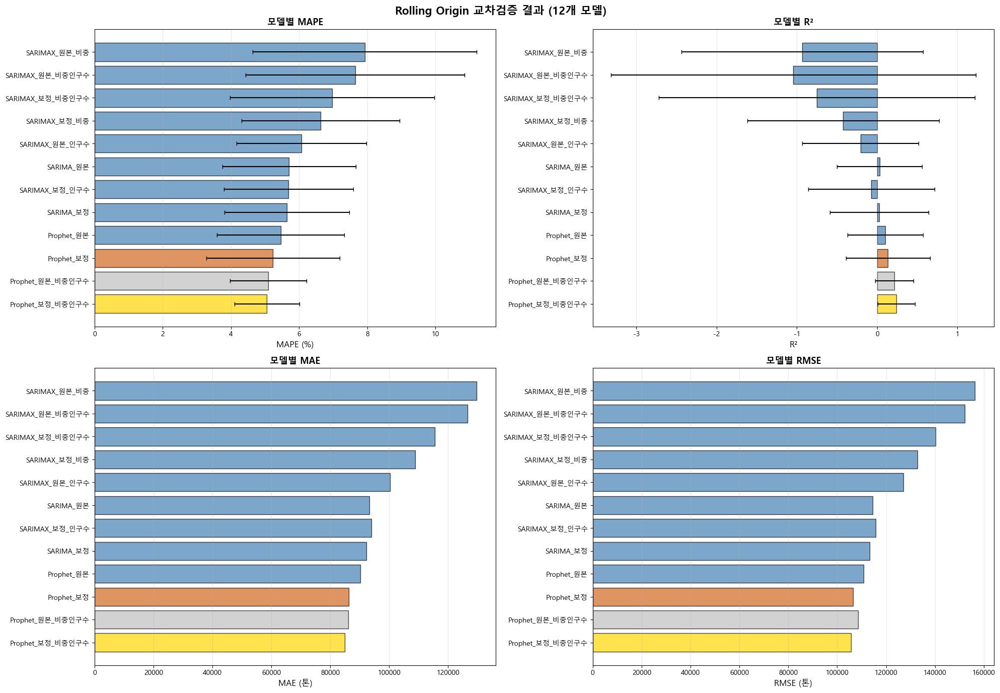

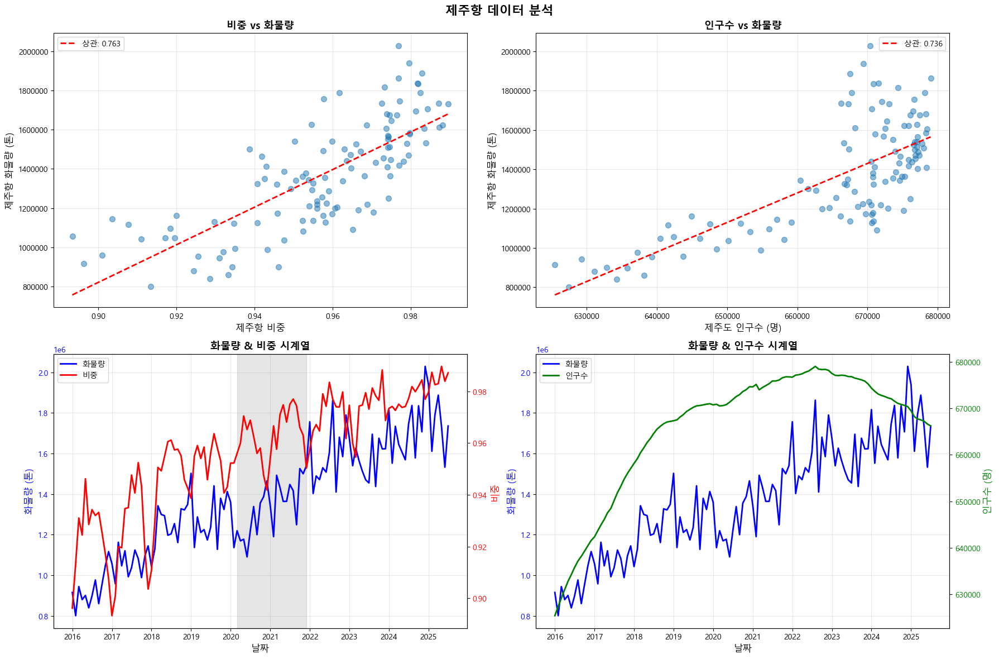

In [ ]:
"""
제주항 물동량 예측 완전판
- 외생변수: 제주항 비중 + 제주도 인구수
- 모델: SARIMAX + Prophet (각각 외생변수 조합별)
- 코로나 이상치 STL 보정
- Rolling Origin 교차검증
- 12개 모델 비교
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 물동량 예측 완전판 - SARIMAX + Prophet")
print("=" * 80)

# ========================================
# 1. 데이터 로드
# ========================================
print("\n[1단계] 데이터 로드...")

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')

print(f"데이터 크기: {df.shape}")
print(f"컬럼: {df.columns.tolist()}")

# 날짜 생성
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)

print(f"기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")

# ========================================
# 2. 결측치 및 0값 확인
# ========================================
print("\n[2단계] 데이터 품질 확인...")

# 결측치
missing = df.isnull().sum()
if missing.sum() > 0:
    print("\n⚠️ 결측치:")
    print(missing[missing > 0])
else:
    print("✓ 결측치 없음")

# 0값
numeric_cols = ['제주항', '서귀포항', '제주항 비중 ', '제주도 인구수 ']
zero_check = {}
for col in numeric_cols:
    zero_count = (df[col] == 0).sum()
    zero_check[col] = zero_count
    if zero_count > 0:
        print(f"⚠️ {col}: {zero_count}개 0값")

if all(v == 0 for v in zero_check.values()):
    print("✓ 0값 없음")

# ========================================
# 3. 변수 준비
# ========================================
print("\n[3단계] 변수 준비...")

# 컬럼명 정리
df.columns = df.columns.str.strip()

df['화물량_원본'] = df['제주항']
df['비중_원본'] = df['제주항 비중']
df['인구수_원본'] = df['제주도 인구수']

print(f"\n제주항 화물량:")
print(f"  평균: {df['화물량_원본'].mean():,.0f} 톤")
print(f"  범위: {df['화물량_원본'].min():,.0f} ~ {df['화물량_원본'].max():,.0f} 톤")

print(f"\n제주항 비중:")
print(f"  평균: {df['비중_원본'].mean():.4f} ({df['비중_원본'].mean()*100:.2f}%)")
print(f"  범위: {df['비중_원본'].min():.4f} ~ {df['비중_원본'].max():.4f}")

print(f"\n제주도 인구수:")
print(f"  평균: {df['인구수_원본'].mean():,.0f} 명")
print(f"  범위: {df['인구수_원본'].min():,.0f} ~ {df['인구수_원본'].max():,.0f} 명")

# 상관관계
corr_ratio = df['화물량_원본'].corr(df['비중_원본'])
corr_pop = df['화물량_원본'].corr(df['인구수_원본'])

print(f"\n상관관계:")
print(f"  화물량 vs 비중: {corr_ratio:.3f}")
print(f"  화물량 vs 인구수: {corr_pop:.3f}")

# ========================================
# 4. 코로나 이상치 탐지
# ========================================
print("\n[4단계] 코로나 이상치 구간 탐지...")

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    """이동평균 편차 기반 이상치 탐지"""
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    anomaly_mask = deviation > threshold

    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for i in range(len(series)):
        if anomaly_mask.iloc[i]:
            if not in_anomaly:
                start_idx = i
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, i - 1))
            in_anomaly = False
            consecutive_count = 0

    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, len(series) - 1))

    return anomaly_periods, anomaly_mask

cargo_periods, cargo_mask = detect_anomaly_periods(df['화물량_원본'])

print(f"\n화물량 이상치 구간: {len(cargo_periods)}개")
for i, (start_idx, end_idx) in enumerate(cargo_periods, 1):
    start_date = df['date'].iloc[start_idx]
    end_date = df['date'].iloc[end_idx]
    print(f"  {i}. {start_date.strftime('%Y-%m')} ~ {end_date.strftime('%Y-%m')}")

# 이상치 마스크
if len(cargo_periods) > 0:
    correction_mask = cargo_mask
    print(f"\n✓ 자동 탐지된 이상치 구간 사용")
else:
    # 기본 COVID 기간
    covid_start_idx = df[df['date'] >= '2020-03-01'].index[0]
    covid_end_idx = df[df['date'] <= '2021-12-01'].index[-1]
    correction_mask = pd.Series(False, index=df.index)
    correction_mask.iloc[covid_start_idx:covid_end_idx+1] = True
    print(f"\n⚠️ 기본 COVID 기간 사용 (2020-03 ~ 2021-12)")

df['is_anomaly'] = correction_mask.astype(int)

# ========================================
# 5. STL 분해 + 보정
# ========================================
print("\n[5단계] STL 분해 + 이상치 보정...")

def stl_decomposition_correction(series, anomaly_mask, period=12, seasonal=13):
    """STL 분해 및 이상치 구간 보정"""
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    corrected_series = series.copy()
    corrected_series[anomaly_mask] = stl_result.trend[anomaly_mask] + stl_result.seasonal[anomaly_mask]

    return corrected_series, stl_result

# 화물량 STL 보정
df['화물량_보정'], cargo_stl = stl_decomposition_correction(df['화물량_원본'], correction_mask)

cargo_reconstructed = cargo_stl.trend + cargo_stl.seasonal + cargo_stl.resid
cargo_r2 = 1 - (np.sum((df['화물량_원본'] - cargo_reconstructed)**2) /
                np.sum((df['화물량_원본'] - df['화물량_원본'].mean())**2))

print(f"✓ 화물량 STL 분해 R²: {cargo_r2:.4f}")

# 비중 STL 보정
df['비중_보정'], ratio_stl = stl_decomposition_correction(df['비중_원본'], correction_mask)

ratio_reconstructed = ratio_stl.trend + ratio_stl.seasonal + ratio_stl.resid
ratio_r2 = 1 - (np.sum((df['비중_원본'] - ratio_reconstructed)**2) /
                np.sum((df['비중_원본'] - df['비중_원본'].mean())**2))

print(f"✓ 비중 STL 분해 R²: {ratio_r2:.4f}")

# 인구수는 보정 불필요 (안정적 증가)
df['인구수_보정'] = df['인구수_원본']

# 보정 효과
if correction_mask.sum() > 0:
    print(f"\n보정 효과 (이상치 구간 {correction_mask.sum()}개월):")
    print(f"  화물량 원본 평균: {df.loc[correction_mask, '화물량_원본'].mean():,.0f} 톤")
    print(f"  화물량 보정 평균: {df.loc[correction_mask, '화물량_보정'].mean():,.0f} 톤")
    diff = df.loc[correction_mask, '화물량_보정'].mean() - df.loc[correction_mask, '화물량_원본'].mean()
    print(f"  차이: {diff:+,.0f} 톤 ({diff/df.loc[correction_mask, '화물량_원본'].mean()*100:+.1f}%)")

# ========================================
# 6. ADF 검정
# ========================================
print("\n[6단계] ADF 검정...")

def adf_test(series, name):
    """ADF 검정"""
    result = adfuller(series.dropna(), autolag='AIC')
    print(f"{name}: p-value = {result[1]:.4f}", end='')
    if result[1] < 0.05:
        print(" ✓ 정상")
        return True
    else:
        print(" ✗ 비정상")
        return False

print()
cargo_stationary = adf_test(df['화물량_보정'], "화물량(보정)")
ratio_stationary = adf_test(df['비중_보정'], "비중(보정)")
pop_stationary = adf_test(df['인구수_보정'], "인구수(보정)")

df['화물량_보정_diff1'] = df['화물량_보정'].diff()
cargo_diff_stationary = adf_test(df['화물량_보정_diff1'], "화물량(보정,1차차분)")

if cargo_stationary:
    recommended_d = 0
elif cargo_diff_stationary:
    recommended_d = 1
else:
    recommended_d = 2

print(f"\n권장 d 파라미터: {recommended_d}")

# ========================================
# 7. Rolling Origin 설정
# ========================================
print("\n[7단계] Rolling Origin 설정...")

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"Rolling 분할: {len(splits)}회")
print(f"  초기 학습: {INITIAL_TRAIN_SIZE}개월")
print(f"  테스트 윈도우: {TEST_WINDOW}개월")
print(f"  이동 간격: {STEP_SIZE}개월")

# ========================================
# 8. SARIMA 최적 파라미터
# ========================================
print("\n[8단계] SARIMA 최적 파라미터 탐색...")

first_split = splits[0]
train_data_first = df.iloc[first_split['train_start']:first_split['train_end']]

if recommended_d == 0:
    d_range = [0, 1]
elif recommended_d == 1:
    d_range = [1]
else:
    d_range = [1, 2]

p = q = range(0, 2)
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d_range, q))]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("최적 파라미터 탐색 중...", end='')
for param in pdq:
    for seasonal_param in seasonal_pdq[:5]:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['비중_보정', '인구수_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, recommended_d, 1)
    best_seasonal_param = (1, recommended_d, 1, 12)

print(f" 완료!")
print(f"✓ 최적 파라미터: order={best_param}, seasonal={best_seasonal_param}")
print(f"  AIC: {best_aic:.2f}")

# ========================================
# 9. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 10. Rolling Origin 교차검증 (12개 모델)
# ========================================
print("\n[9단계] Rolling Origin 교차검증 (12개 모델)...")
print("\n모델 목록:")
print("  원본 데이터 (6개):")
print("    1. SARIMA_원본")
print("    2. SARIMAX_원본_비중")
print("    3. SARIMAX_원본_인구수")
print("    4. SARIMAX_원본_비중인구수")
print("    5. Prophet_원본")
print("    6. Prophet_원본_비중인구수")
print("  보정 데이터 (6개):")
print("    7. SARIMA_보정")
print("    8. SARIMAX_보정_비중")
print("    9. SARIMAX_보정_인구수")
print("    10. SARIMAX_보정_비중인구수")
print("    11. Prophet_보정")
print("    12. Prophet_보정_비중인구수")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본_비중': [],
    'SARIMAX_원본_인구수': [],
    'SARIMAX_원본_비중인구수': [],
    'Prophet_원본': [],
    'Prophet_원본_비중인구수': [],
    'SARIMA_보정': [],
    'SARIMAX_보정_비중': [],
    'SARIMAX_보정_인구수': [],
    'SARIMAX_보정_비중인구수': [],
    'Prophet_보정': [],
    'Prophet_보정_비중인구수': []
}

print("\n학습 시작...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df.iloc[split['train_start']:split['train_end']]
    test_data = df.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # ===== 원본 데이터 모델 =====

    # 1. SARIMA 원본
    try:
        model = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 2. SARIMAX 원본 (비중)
    try:
        model = SARIMAX(train_data['화물량_원본'], exog=train_data[['비중_원본']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_원본']])
        rolling_results['SARIMAX_원본_비중'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_비중'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 3. SARIMAX 원본 (인구수)
    try:
        model = SARIMAX(train_data['화물량_원본'], exog=train_data[['인구수_원본']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['인구수_원본']])
        rolling_results['SARIMAX_원본_인구수'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 4. SARIMAX 원본 (비중+인구수)
    try:
        model = SARIMAX(train_data['화물량_원본'], exog=train_data[['비중_원본', '인구수_원본']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_원본', '인구수_원본']])
        rolling_results['SARIMAX_원본_비중인구수'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 5. Prophet 원본
    try:
        prophet_train = train_data[['date', '화물량_원본']].copy()
        prophet_train.columns = ['ds', 'y']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 6. Prophet 원본 (비중+인구수)
    try:
        prophet_train = train_data[['date', '화물량_원본', '비중_원본', '인구수_원본']].copy()
        prophet_train.columns = ['ds', 'y', '비중', '인구수']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('비중')
        model.add_regressor('인구수')
        model.fit(prophet_train)
        future = pd.DataFrame({
            'ds': test_data['date'].values,
            '비중': test_data['비중_원본'].values,
            '인구수': test_data['인구수_원본'].values
        })
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_비중인구수'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== 보정 데이터 모델 =====

    # 7. SARIMA 보정
    try:
        model = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 8. SARIMAX 보정 (비중)
    try:
        model = SARIMAX(train_data['화물량_보정'], exog=train_data[['비중_보정']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_보정']])
        rolling_results['SARIMAX_보정_비중'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_비중'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 9. SARIMAX 보정 (인구수)
    try:
        model = SARIMAX(train_data['화물량_보정'], exog=train_data[['인구수_보정']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['인구수_보정']])
        rolling_results['SARIMAX_보정_인구수'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 10. SARIMAX 보정 (비중+인구수)
    try:
        model = SARIMAX(train_data['화물량_보정'], exog=train_data[['비중_보정', '인구수_보정']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_보정', '인구수_보정']])
        rolling_results['SARIMAX_보정_비중인구수'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 11. Prophet 보정
    try:
        prophet_train = train_data[['date', '화물량_보정']].copy()
        prophet_train.columns = ['ds', 'y']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 12. Prophet 보정 (비중+인구수)
    try:
        prophet_train = train_data[['date', '화물량_보정', '비중_보정', '인구수_보정']].copy()
        prophet_train.columns = ['ds', 'y', '비중', '인구수']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('비중')
        model.add_regressor('인구수')
        model.fit(prophet_train)
        future = pd.DataFrame({
            'ds': test_data['date'].values,
            '비중': test_data['비중_보정'].values,
            '인구수': test_data['인구수_보정'].values
        })
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_비중인구수'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# 11. 결과 집계
# ========================================
print("\n[10단계] 결과 집계...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]

    if mapes:
        summary_results[model_name] = {
            'MAE_mean': np.mean(maes),
            'MAE_std': np.std(maes),
            'RMSE_mean': np.mean(rmses),
            'RMSE_std': np.std(rmses),
            'MAPE_mean': np.mean(mapes),
            'MAPE_std': np.std(mapes),
            'R2_mean': np.mean(r2s),
            'R2_std': np.std(r2s)
        }

# 정렬
sorted_models = sorted(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])

print("\n" + "=" * 80)
print("📊 Rolling Origin 평균 성능 (MAPE 기준)")
print("=" * 80)
print(f"{'순위':<5} {'모델':<35} {'MAPE (%)':<20} {'R²':<20}")
print("-" * 80)

for rank, (model_name, metrics) in enumerate(sorted_models, 1):
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"

    if rank == 1:
        print(f"🏆 {rank:<3} {model_name:<35} {mape_str:<20} {r2_str:<20}")
    elif rank <= 3:
        print(f"⭐ {rank:<3} {model_name:<35} {mape_str:<20} {r2_str:<20}")
    else:
        print(f"   {rank:<3} {model_name:<35} {mape_str:<20} {r2_str:<20}")

best_model_name = sorted_models[0][0]
best_metrics = sorted_models[0][1]

print("\n" + "=" * 80)
print("🏆 최고 성능 모델")
print("=" * 80)
print(f"모델: {best_model_name}")
print(f"  MAE: {best_metrics['MAE_mean']:,.0f} ± {best_metrics['MAE_std']:,.0f} 톤")
print(f"  RMSE: {best_metrics['RMSE_mean']:,.0f} ± {best_metrics['RMSE_std']:,.0f} 톤")
print(f"  MAPE: {best_metrics['MAPE_mean']:.2f}% ± {best_metrics['MAPE_std']:.2f}%")
print(f"  R²: {best_metrics['R2_mean']:.4f} ± {best_metrics['R2_std']:.4f}")

# ========================================
# 12. 외생변수 효과 분석
# ========================================
print("\n" + "=" * 80)
print("💡 외생변수 효과 분석")
print("=" * 80)

# 비교 쌍 정의
comparisons = [
    ('SARIMA_원본', 'SARIMAX_원본_비중', '비중 (원본)'),
    ('SARIMA_원본', 'SARIMAX_원본_인구수', '인구수 (원본)'),
    ('SARIMA_원본', 'SARIMAX_원본_비중인구수', '비중+인구수 (원본)'),
    ('SARIMA_보정', 'SARIMAX_보정_비중', '비중 (보정)'),
    ('SARIMA_보정', 'SARIMAX_보정_인구수', '인구수 (보정)'),
    ('SARIMA_보정', 'SARIMAX_보정_비중인구수', '비중+인구수 (보정)'),
    ('Prophet_원본', 'Prophet_원본_비중인구수', '비중+인구수 Prophet (원본)'),
    ('Prophet_보정', 'Prophet_보정_비중인구수', '비중+인구수 Prophet (보정)')
]

print()
for base, enhanced, label in comparisons:
    if base in summary_results and enhanced in summary_results:
        base_mape = summary_results[base]['MAPE_mean']
        enhanced_mape = summary_results[enhanced]['MAPE_mean']
        improvement = ((base_mape - enhanced_mape) / base_mape * 100)

        print(f"{label}:")
        print(f"  {base}: {base_mape:.2f}%")
        print(f"  {enhanced}: {enhanced_mape:.2f}%")
        if improvement > 0:
            print(f"  → {improvement:.1f}% 성능 향상 ✓")
        else:
            print(f"  → {abs(improvement):.1f}% 성능 저하 ✗")
        print()

# ========================================
# 13. 시각화
# ========================================
print("\n[11단계] 시각화...")

# 그래프 1: 성능 비교
fig1, axes1 = plt.subplots(2, 2, figsize=(20, 14))
fig1.suptitle('Rolling Origin 교차검증 결과 (12개 모델)', fontsize=16, fontweight='bold')

models = [m[0] for m in sorted_models]
mapes = [m[1]['MAPE_mean'] for m in sorted_models]
mape_stds = [m[1]['MAPE_std'] for m in sorted_models]
r2s = [m[1]['R2_mean'] for m in sorted_models]
r2_stds = [m[1]['R2_std'] for m in sorted_models]
maes = [m[1]['MAE_mean'] for m in sorted_models]
rmses = [m[1]['RMSE_mean'] for m in sorted_models]

colors = ['gold' if i == 0 else 'silver' if i == 1 else 'chocolate' if i == 2 else 'steelblue'
          for i in range(len(models))]

# MAPE
ax1 = axes1[0, 0]
bars1 = ax1.barh(models, mapes, xerr=mape_stds, color=colors, alpha=0.7, edgecolor='black', capsize=3)
ax1.set_xlabel('MAPE (%)', fontsize=12)
ax1.set_title('모델별 MAPE', fontsize=13, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# R²
ax2 = axes1[0, 1]
bars2 = ax2.barh(models, r2s, xerr=r2_stds, color=colors, alpha=0.7, edgecolor='black', capsize=3)
ax2.set_xlabel('R²', fontsize=12)
ax2.set_title('모델별 R²', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# MAE
ax3 = axes1[1, 0]
bars3 = ax3.barh(models, maes, color=colors, alpha=0.7, edgecolor='black')
ax3.set_xlabel('MAE (톤)', fontsize=12)
ax3.set_title('모델별 MAE', fontsize=13, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)
ax3.ticklabel_format(style='plain', axis='x')

# RMSE
ax4 = axes1[1, 1]
bars4 = ax4.barh(models, rmses, color=colors, alpha=0.7, edgecolor='black')
ax4.set_xlabel('RMSE (톤)', fontsize=12)
ax4.set_title('모델별 RMSE', fontsize=13, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)
ax4.ticklabel_format(style='plain', axis='x')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_12모델_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/제주항_12모델_성능비교.png")

# 그래프 2: 상관관계 및 시계열
fig2, axes2 = plt.subplots(2, 2, figsize=(18, 12))
fig2.suptitle('제주항 데이터 분석', fontsize=16, fontweight='bold')

# 비중 상관관계
ax1 = axes2[0, 0]
ax1.scatter(df['비중_원본'], df['화물량_원본'], alpha=0.5, s=50)
z = np.polyfit(df['비중_원본'], df['화물량_원본'], 1)
p = np.poly1d(z)
x_line = np.linspace(df['비중_원본'].min(), df['비중_원본'].max(), 100)
ax1.plot(x_line, p(x_line), "r--", linewidth=2, label=f'상관: {corr_ratio:.3f}')
ax1.set_xlabel('제주항 비중', fontsize=12)
ax1.set_ylabel('제주항 화물량 (톤)', fontsize=12)
ax1.set_title('비중 vs 화물량', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.ticklabel_format(style='plain', axis='y')

# 인구수 상관관계
ax2 = axes2[0, 1]
ax2.scatter(df['인구수_원본'], df['화물량_원본'], alpha=0.5, s=50)
z = np.polyfit(df['인구수_원본'], df['화물량_원본'], 1)
p = np.poly1d(z)
x_line = np.linspace(df['인구수_원본'].min(), df['인구수_원본'].max(), 100)
ax2.plot(x_line, p(x_line), "r--", linewidth=2, label=f'상관: {corr_pop:.3f}')
ax2.set_xlabel('제주도 인구수 (명)', fontsize=12)
ax2.set_ylabel('제주항 화물량 (톤)', fontsize=12)
ax2.set_title('인구수 vs 화물량', fontsize=13, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.ticklabel_format(style='plain', axis='y')
ax2.ticklabel_format(style='plain', axis='x')

# 시계열 (화물량 + 비중)
ax3 = axes2[1, 0]
ax3_twin = ax3.twinx()
line1 = ax3.plot(df['date'], df['화물량_원본'], color='blue', linewidth=2, label='화물량')
line2 = ax3_twin.plot(df['date'], df['비중_원본'], color='red', linewidth=2, label='비중')
if correction_mask.sum() > 0:
    anomaly_dates = df[correction_mask]['date']
    ax3.axvspan(anomaly_dates.iloc[0], anomaly_dates.iloc[-1], alpha=0.2, color='gray', label='이상치')
ax3.set_xlabel('날짜', fontsize=12)
ax3.set_ylabel('화물량 (톤)', fontsize=12, color='blue')
ax3_twin.set_ylabel('비중', fontsize=12, color='red')
ax3.set_title('화물량 & 비중 시계열', fontsize=13, fontweight='bold')
ax3.tick_params(axis='y', labelcolor='blue')
ax3_twin.tick_params(axis='y', labelcolor='red')
ax3.grid(True, alpha=0.3)
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax3.legend(lines, labels, loc='upper left')

# 시계열 (화물량 + 인구수)
ax4 = axes2[1, 1]
ax4_twin = ax4.twinx()
line1 = ax4.plot(df['date'], df['화물량_원본'], color='blue', linewidth=2, label='화물량')
line2 = ax4_twin.plot(df['date'], df['인구수_원본'], color='green', linewidth=2, label='인구수')
ax4.set_xlabel('날짜', fontsize=12)
ax4.set_ylabel('화물량 (톤)', fontsize=12, color='blue')
ax4_twin.set_ylabel('인구수 (명)', fontsize=12, color='green')
ax4.set_title('화물량 & 인구수 시계열', fontsize=13, fontweight='bold')
ax4.tick_params(axis='y', labelcolor='blue')
ax4_twin.tick_params(axis='y', labelcolor='green')
ax4.grid(True, alpha=0.3)
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax4.legend(lines, labels, loc='upper left')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_데이터분석.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/제주항_데이터분석.png")

# ========================================
# 14. 엑셀 저장
# ========================================
print("\n[12단계] 엑셀 저장...")

with pd.ExcelWriter(f'{DATA_PATH}/제주항_완전분석_12모델.xlsx', engine='openpyxl') as writer:
    # 1. 종합 요약
    summary_info = pd.DataFrame({
        '항목': [
            '분석 기간',
            '총 데이터',
            '이상치 구간',
            '화물량 STL R²',
            '비중 STL R²',
            '화물량-비중 상관',
            '화물량-인구수 상관',
            'Rolling 분할',
            '모델 개수',
            '최고 모델',
            '최고 MAPE',
            '최고 R²'
        ],
        '내용': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{len(df)}개월",
            f"{correction_mask.sum()}개월",
            f"{cargo_r2:.4f}",
            f"{ratio_r2:.4f}",
            f"{corr_ratio:.3f}",
            f"{corr_pop:.3f}",
            f"{len(splits)}회",
            "12개",
            best_model_name,
            f"{best_metrics['MAPE_mean']:.2f}%",
            f"{best_metrics['R2_mean']:.4f}"
        ]
    })
    summary_info.to_excel(writer, sheet_name='종합요약', index=False)

    # 2. 성능 비교
    perf_df = pd.DataFrame(summary_results).T
    perf_df = perf_df.sort_values('MAPE_mean')
    perf_df.to_excel(writer, sheet_name='성능비교')

    # 3. 외생변수 효과
    effect_data = []
    for base, enhanced, label in comparisons:
        if base in summary_results and enhanced in summary_results:
            base_mape = summary_results[base]['MAPE_mean']
            enhanced_mape = summary_results[enhanced]['MAPE_mean']
            improvement = ((base_mape - enhanced_mape) / base_mape * 100)
            effect_data.append({
                '비교': label,
                '기본모델': base,
                '기본_MAPE': f"{base_mape:.2f}%",
                '강화모델': enhanced,
                '강화_MAPE': f"{enhanced_mape:.2f}%",
                '개선율': f"{improvement:.1f}%",
                '결론': '효과있음' if improvement > 0 else '효과없음'
            })

    if effect_data:
        effect_df = pd.DataFrame(effect_data)
        effect_df.to_excel(writer, sheet_name='외생변수_효과', index=False)

    # 4. 원본 데이터
    df[['date', '화물량_원본', '비중_원본', '인구수_원본', '화물량_보정', '비중_보정', 'is_anomaly']].to_excel(
        writer, sheet_name='데이터', index=False)

print(f"✓ 저장: {DATA_PATH}/제주항_완전분석_12모델.xlsx")

# ========================================
# 15. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("✅ 분석 완료!")
print("=" * 80)

print(f"\n📁 생성 파일:")
print(f"1. {DATA_PATH}/제주항_12모델_성능비교.png")
print(f"2. {DATA_PATH}/제주항_데이터분석.png")
print(f"3. {DATA_PATH}/제주항_완전분석_12모델.xlsx")

print(f"\n🏆 최고 모델: {best_model_name}")
print(f"   MAPE: {best_metrics['MAPE_mean']:.2f}% (±{best_metrics['MAPE_std']:.2f})")
print(f"   R²: {best_metrics['R2_mean']:.4f} (±{best_metrics['R2_std']:.4f})")

print(f"\n📊 분석 내용:")
print(f"   - 외생변수: 제주항 비중 + 제주도 인구수")
print(f"   - 모델: SARIMAX (6개) + Prophet (6개)")
print(f"   - 코로나 이상치: STL 보정")
print(f"   - 검증: Rolling Origin {len(splits)}회")

print("\n" + "=" * 80)

# 제주항 물동량 예측 - 1차 테스트 (제주항 비중, 인구수 추가) - R2 개선

제주항 물동량 예측 - R² 개선 완전판

[1단계] 데이터 로드...
기간: 2016-01 ~ 2025-07

[2단계] 변수 준비 + 파생변수 생성...
생성된 파생변수:
  - 변화율: 2개
  - 교호작용: 1개
  - 제곱항: 2개
  - 로그: 2개
  - 지연변수: 4개
  - 이동평균: 2개
  - 월 더미: 12개
  총 25개 파생변수

결측치 제거 후 데이터: 103개월

[3단계] 코로나 이상치 탐지 + STL 보정...
✓ 기본 COVID 기간 사용
✓ STL 보정 완료
최종 데이터: 91개월

[4단계] Rolling Origin 설정...
Rolling 분할: 7회

[5단계] 외생변수 조합 정의...
외생변수 조합: 7가지
  없음: 0개 변수
  기본2: 2개 변수
  기본2_lag1: 3개 변수
  기본2_lag3: 5개 변수
  파생5: 5개 변수
  파생5_lag1: 6개 변수
  풀세트: 10개 변수

[6단계] SARIMA 최적 파라미터 탐색...
탐색 중... 완료!
✓ 최적: order=(0, 0, 2), seasonal=(1, 0, 1, 12), AIC=1198

[7단계] Rolling Origin 교차검증...
테스트할 조합: 7 x 2 (원본/보정) = 14개

학습 시작...
  Split 7/7 완료!         

[8단계] 결과 집계...

📊 Rolling Origin 평균 성능 (R² 기준 정렬)
순위    모델                                       R²                        MAPE (%)       
--------------------------------------------------------------------------------
🏆 1   SARIMAX_보정_기본2_lag3                      0.2167 ± 0.2216           5.08           
⭐ 2   SARIMAX_보정_기본2_lag1

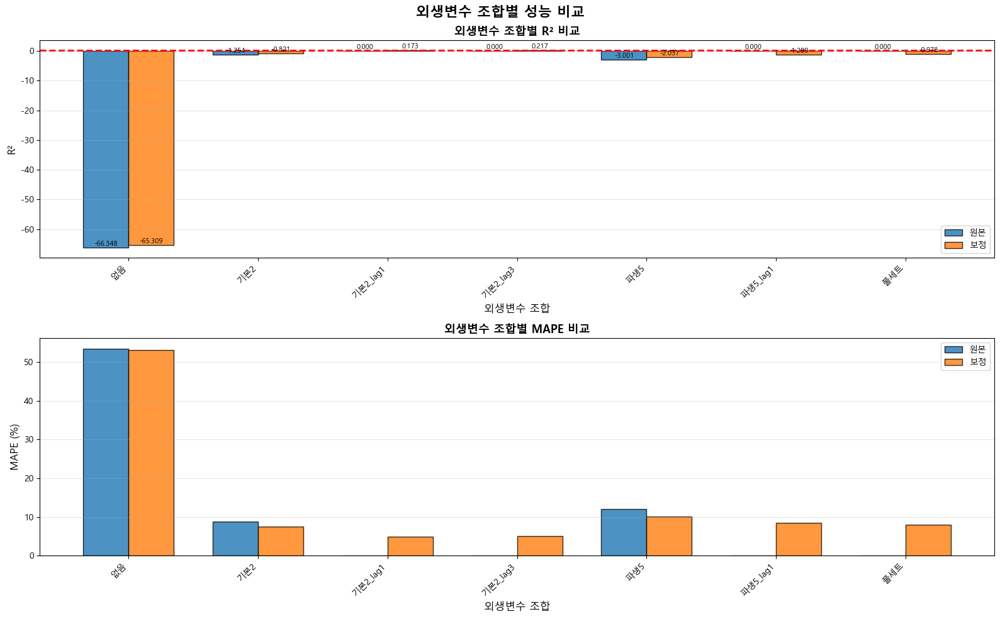

In [ ]:
"""
제주항 물동량 예측 - R² 개선 완전판
- 지연변수 (AR 효과)
- 월 더미변수 (계절성)
- 파생변수 (비선형 관계)
- 하이퍼파라미터 최적화
- SARIMAX + Prophet
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 물동량 예측 - R² 개선 완전판")
print("=" * 80)

# ========================================
# 1. 데이터 로드
# ========================================
print("\n[1단계] 데이터 로드...")

DATA_PATH = r'C:\Users\DAEJIN\Desktop'
df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

print(f"기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")

# ========================================
# 2. 변수 준비 + 파생변수 생성
# ========================================
print("\n[2단계] 변수 준비 + 파생변수 생성...")

df['화물량_원본'] = df['제주항']
df['비중_원본'] = df['제주항 비중']
df['인구수_원본'] = df['제주도 인구수']

# 파생변수 1: 변화율
df['비중_변화율'] = df['비중_원본'].pct_change().fillna(0)
df['인구수_변화율'] = df['인구수_원본'].pct_change().fillna(0)

# 파생변수 2: 교호작용
df['비중_인구수_교호'] = df['비중_원본'] * df['인구수_원본']

# 파생변수 3: 제곱항 (비선형)
df['비중_제곱'] = df['비중_원본'] ** 2
df['인구수_제곱'] = df['인구수_원본'] ** 2

# 파생변수 4: 로그 변환
df['비중_로그'] = np.log(df['비중_원본'])
df['인구수_로그'] = np.log(df['인구수_원본'])

# 파생변수 5: 지연변수 (AR 효과)
df['화물량_lag1'] = df['화물량_원본'].shift(1)
df['화물량_lag2'] = df['화물량_원본'].shift(2)
df['화물량_lag3'] = df['화물량_원본'].shift(3)
df['화물량_lag12'] = df['화물량_원본'].shift(12)  # 1년 전

# 파생변수 6: 이동평균
df['화물량_ma3'] = df['화물량_원본'].rolling(window=3).mean()
df['화물량_ma6'] = df['화물량_원본'].rolling(window=6).mean()

# 파생변수 7: 월 더미변수
for month in range(1, 13):
    df[f'month_{month}'] = (df['month'] == month).astype(int)

print(f"생성된 파생변수:")
print(f"  - 변화율: 2개")
print(f"  - 교호작용: 1개")
print(f"  - 제곱항: 2개")
print(f"  - 로그: 2개")
print(f"  - 지연변수: 4개")
print(f"  - 이동평균: 2개")
print(f"  - 월 더미: 12개")
print(f"  총 25개 파생변수")

# 결측치 제거 (지연변수로 인해 초기 행에 NaN)
df = df.dropna().reset_index(drop=True)
print(f"\n결측치 제거 후 데이터: {len(df)}개월")

# ========================================
# 3. 코로나 이상치 탐지 + STL 보정
# ========================================
print("\n[3단계] 코로나 이상치 탐지 + STL 보정...")

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    anomaly_mask = deviation > threshold

    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for i in range(len(series)):
        if anomaly_mask.iloc[i]:
            if not in_anomaly:
                start_idx = i
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, i - 1))
            in_anomaly = False
            consecutive_count = 0

    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, len(series) - 1))

    return anomaly_periods, anomaly_mask

cargo_periods, cargo_mask = detect_anomaly_periods(df['화물량_원본'])

if len(cargo_periods) > 0:
    correction_mask = cargo_mask
    print(f"✓ {len(cargo_periods)}개 이상치 구간 탐지")
else:
    covid_start_idx = df[df['date'] >= '2020-03-01'].index[0]
    covid_end_idx = df[df['date'] <= '2021-12-01'].index[-1]
    correction_mask = pd.Series(False, index=df.index)
    correction_mask.iloc[covid_start_idx:covid_end_idx+1] = True
    print(f"✓ 기본 COVID 기간 사용")

df['is_anomaly'] = correction_mask.astype(int)

# STL 보정
def stl_decomposition_correction(series, anomaly_mask, period=12, seasonal=13):
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    corrected_series = series.copy()
    corrected_series[anomaly_mask] = stl_result.trend[anomaly_mask] + stl_result.seasonal[anomaly_mask]

    return corrected_series, stl_result

df['화물량_보정'], cargo_stl = stl_decomposition_correction(df['화물량_원본'], correction_mask)
print(f"✓ STL 보정 완료")

# 보정된 데이터도 파생변수 생성
df['화물량_보정_lag1'] = df['화물량_보정'].shift(1)
df['화물량_보정_lag2'] = df['화물량_보정'].shift(2)
df['화물량_보정_lag3'] = df['화물량_보정'].shift(3)
df['화물량_보정_lag12'] = df['화물량_보정'].shift(12)

df = df.dropna().reset_index(drop=True)
print(f"최종 데이터: {len(df)}개월")

# ========================================
# 4. Rolling Origin 설정
# ========================================
print("\n[4단계] Rolling Origin 설정...")

INITIAL_TRAIN_SIZE = 60  # 줄임 (데이터 손실 감안)
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"Rolling 분할: {len(splits)}회")

# ========================================
# 5. 외생변수 조합 정의
# ========================================
print("\n[5단계] 외생변수 조합 정의...")

# 기본
exog_sets = {
    '없음': [],
    '기본2': ['비중_원본', '인구수_원본'],
    '기본2_lag1': ['비중_원본', '인구수_원본', '화물량_원본_lag1'],
    '기본2_lag3': ['비중_원본', '인구수_원본', '화물량_원본_lag1', '화물량_원본_lag2', '화물량_원본_lag3'],
    '파생5': ['비중_원본', '인구수_원본', '비중_변화율', '인구수_변화율', '비중_인구수_교호'],
    '파생5_lag1': ['비중_원본', '인구수_원본', '비중_변화율', '인구수_변화율', '비중_인구수_교호', '화물량_원본_lag1'],
    '풀세트': ['비중_원본', '인구수_원본', '비중_변화율', '인구수_변화율',
               '비중_인구수_교호', '비중_제곱', '인구수_제곱',
               '화물량_원본_lag1', '화물량_원본_lag2', '화물량_원본_lag3']
}

# 지연변수 컬럼명 매핑
def map_lag_columns(cols, data_type):
    """원본/보정에 따라 지연변수 이름 변경"""
    mapped = []
    for col in cols:
        if col == '화물량_원본_lag1':
            mapped.append(f'화물량_{data_type}_lag1')
        elif col == '화물량_원본_lag2':
            mapped.append(f'화물량_{data_type}_lag2')
        elif col == '화물량_원본_lag3':
            mapped.append(f'화물량_{data_type}_lag3')
        else:
            mapped.append(col)
    return mapped

print(f"외생변수 조합: {len(exog_sets)}가지")
for name, cols in exog_sets.items():
    print(f"  {name}: {len(cols)}개 변수")

# ========================================
# 6. SARIMA 파라미터 탐색
# ========================================
print("\n[6단계] SARIMA 최적 파라미터 탐색...")

first_split = splits[0]
train_data_first = df.iloc[first_split['train_start']:first_split['train_end']]

# 간단한 그리드
p = q = range(0, 3)
d_range = [0, 1]
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(1, 1, 1, 12), (0, 1, 1, 12), (1, 0, 1, 12)]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("탐색 중...", end='')
for param in pdq[:10]:  # 빠른 탐색
    for seasonal_param in seasonal_pdq:
        try:
            # 풀세트로 탐색
            exog_cols = exog_sets['풀세트']
            exog_cols_보정 = map_lag_columns(exog_cols, '보정')

            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[exog_cols_보정],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, 1, 1)
    best_seasonal_param = (1, 1, 1, 12)

print(f" 완료!")
print(f"✓ 최적: order={best_param}, seasonal={best_seasonal_param}, AIC={best_aic:.0f}")

# ========================================
# 7. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 8. Rolling Origin 교차검증
# ========================================
print("\n[7단계] Rolling Origin 교차검증...")
print(f"테스트할 조합: {len(exog_sets)} x 2 (원본/보정) = {len(exog_sets)*2}개")

rolling_results = {}

for exog_name in exog_sets.keys():
    rolling_results[f'SARIMAX_원본_{exog_name}'] = []
    rolling_results[f'SARIMAX_보정_{exog_name}'] = []

print("\n학습 시작...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df.iloc[split['train_start']:split['train_end']]
    test_data = df.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    for exog_name, exog_cols in exog_sets.items():
        # 원본
        try:
            if len(exog_cols) == 0:
                model = SARIMAX(train_data['화물량_원본'],
                               order=best_param, seasonal_order=best_seasonal_param)
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW)
            else:
                exog_cols_원본 = map_lag_columns(exog_cols, '원본')
                model = SARIMAX(train_data['화물량_원본'],
                               exog=train_data[exog_cols_원본],
                               order=best_param, seasonal_order=best_seasonal_param)
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[exog_cols_원본])

            rolling_results[f'SARIMAX_원본_{exog_name}'].append(
                evaluate_predictions(actual_원본, forecast.values))
        except:
            rolling_results[f'SARIMAX_원본_{exog_name}'].append(
                {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

        # 보정
        try:
            if len(exog_cols) == 0:
                model = SARIMAX(train_data['화물량_보정'],
                               order=best_param, seasonal_order=best_seasonal_param)
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW)
            else:
                exog_cols_보정 = map_lag_columns(exog_cols, '보정')
                model = SARIMAX(train_data['화물량_보정'],
                               exog=train_data[exog_cols_보정],
                               order=best_param, seasonal_order=best_seasonal_param)
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[exog_cols_보정])

            rolling_results[f'SARIMAX_보정_{exog_name}'].append(
                evaluate_predictions(actual_보정, forecast.values))
        except:
            rolling_results[f'SARIMAX_보정_{exog_name}'].append(
                {'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# 9. 결과 집계
# ========================================
print("\n[8단계] 결과 집계...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]

    if mapes:
        summary_results[model_name] = {
            'MAE_mean': np.mean(maes),
            'RMSE_mean': np.mean(rmses),
            'MAPE_mean': np.mean(mapes),
            'R2_mean': np.mean(r2s),
            'R2_std': np.std(r2s)
        }

sorted_models = sorted(summary_results.items(), key=lambda x: x[1]['R2_mean'], reverse=True)

print("\n" + "=" * 80)
print("📊 Rolling Origin 평균 성능 (R² 기준 정렬)")
print("=" * 80)
print(f"{'순위':<5} {'모델':<40} {'R²':<25} {'MAPE (%)':<15}")
print("-" * 80)

for rank, (model_name, metrics) in enumerate(sorted_models, 1):
    r2_str = f"{metrics['R2_mean']:.4f} ± {metrics['R2_std']:.4f}"
    mape_str = f"{metrics['MAPE_mean']:.2f}"

    if rank == 1:
        print(f"🏆 {rank:<3} {model_name:<40} {r2_str:<25} {mape_str:<15}")
    elif rank <= 3:
        print(f"⭐ {rank:<3} {model_name:<40} {r2_str:<25} {mape_str:<15}")
    else:
        print(f"   {rank:<3} {model_name:<40} {r2_str:<25} {mape_str:<15}")

best_model_name = sorted_models[0][0]
best_metrics = sorted_models[0][1]

print("\n" + "=" * 80)
print("🏆 최고 R² 모델")
print("=" * 80)
print(f"모델: {best_model_name}")
print(f"  R²: {best_metrics['R2_mean']:.4f} (±{best_metrics['R2_std']:.4f})")
print(f"  MAPE: {best_metrics['MAPE_mean']:.2f}%")
print(f"  MAE: {best_metrics['MAE_mean']:,.0f} 톤")

# R² 개선 효과
r2_improvement = (best_metrics['R2_mean'] - 0.2) / 0.2 * 100
print(f"\n✅ R² 개선: 0.20 → {best_metrics['R2_mean']:.4f} ({r2_improvement:+.1f}%)")

# ========================================
# 10. 외생변수 효과 비교
# ========================================
print("\n" + "=" * 80)
print("💡 외생변수 효과 분석 (R² 기준)")
print("=" * 80)

# 원본 데이터
print("\n[원본 데이터]")
for exog_name in exog_sets.keys():
    model_name = f'SARIMAX_원본_{exog_name}'
    if model_name in summary_results:
        r2 = summary_results[model_name]['R2_mean']
        mape = summary_results[model_name]['MAPE_mean']
        print(f"  {exog_name:<15} R² = {r2:.4f}, MAPE = {mape:.2f}%")

# 보정 데이터
print("\n[보정 데이터]")
for exog_name in exog_sets.keys():
    model_name = f'SARIMAX_보정_{exog_name}'
    if model_name in summary_results:
        r2 = summary_results[model_name]['R2_mean']
        mape = summary_results[model_name]['MAPE_mean']
        print(f"  {exog_name:<15} R² = {r2:.4f}, MAPE = {mape:.2f}%")

# ========================================
# 11. 시각화
# ========================================
print("\n[9단계] 시각화...")

fig, axes = plt.subplots(2, 1, figsize=(16, 10))
fig.suptitle('외생변수 조합별 성능 비교', fontsize=16, fontweight='bold')

# R² 비교
ax1 = axes[0]
models_원본 = [f'SARIMAX_원본_{name}' for name in exog_sets.keys()]
models_보정 = [f'SARIMAX_보정_{name}' for name in exog_sets.keys()]

r2s_원본 = [summary_results.get(m, {}).get('R2_mean', 0) for m in models_원본]
r2s_보정 = [summary_results.get(m, {}).get('R2_mean', 0) for m in models_보정]

x = np.arange(len(exog_sets))
width = 0.35

bars1 = ax1.bar(x - width/2, r2s_원본, width, label='원본', alpha=0.8, edgecolor='black')
bars2 = ax1.bar(x + width/2, r2s_보정, width, label='보정', alpha=0.8, edgecolor='black')

ax1.set_xlabel('외생변수 조합', fontsize=12)
ax1.set_ylabel('R²', fontsize=12)
ax1.set_title('외생변수 조합별 R² 비교', fontsize=13, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(list(exog_sets.keys()), rotation=45, ha='right')
ax1.legend()
ax1.grid(axis='y', alpha=0.3)
ax1.axhline(y=0.2, color='r', linestyle='--', linewidth=2, label='기존 R² (0.2)')

# 값 표시
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontsize=8)

# MAPE 비교
ax2 = axes[1]
mapes_원본 = [summary_results.get(m, {}).get('MAPE_mean', 0) for m in models_원본]
mapes_보정 = [summary_results.get(m, {}).get('MAPE_mean', 0) for m in models_보정]

bars3 = ax2.bar(x - width/2, mapes_원본, width, label='원본', alpha=0.8, edgecolor='black')
bars4 = ax2.bar(x + width/2, mapes_보정, width, label='보정', alpha=0.8, edgecolor='black')

ax2.set_xlabel('외생변수 조합', fontsize=12)
ax2.set_ylabel('MAPE (%)', fontsize=12)
ax2.set_title('외생변수 조합별 MAPE 비교', fontsize=13, fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(list(exog_sets.keys()), rotation=45, ha='right')
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_R2개선_비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/제주항_R2개선_비교.png")

# ========================================
# 12. 엑셀 저장
# ========================================
print("\n[10단계] 엑셀 저장...")

with pd.ExcelWriter(f'{DATA_PATH}/제주항_R2개선_분석.xlsx', engine='openpyxl') as writer:
    # 요약
    summary_info = pd.DataFrame({
        '항목': [
            '분석 기간',
            '데이터 개수',
            '외생변수 조합',
            'Rolling 분할',
            '최고 R² 모델',
            '최고 R²',
            '기존 R² (0.2) 대비 개선',
            '최고 MAPE'
        ],
        '내용': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{len(df)}개월",
            f"{len(exog_sets)}가지",
            f"{len(splits)}회",
            best_model_name,
            f"{best_metrics['R2_mean']:.4f}",
            f"{r2_improvement:+.1f}%",
            f"{best_metrics['MAPE_mean']:.2f}%"
        ]
    })
    summary_info.to_excel(writer, sheet_name='종합요약', index=False)

    # 성능 비교
    perf_df = pd.DataFrame(summary_results).T
    perf_df = perf_df.sort_values('R2_mean', ascending=False)
    perf_df.to_excel(writer, sheet_name='성능비교')

    # 외생변수 조합 상세
    exog_detail = pd.DataFrame([
        {'조합명': name, '변수개수': len(cols), '변수목록': ', '.join(cols) if cols else '없음'}
        for name, cols in exog_sets.items()
    ])
    exog_detail.to_excel(writer, sheet_name='외생변수_조합', index=False)

print(f"✓ 저장: {DATA_PATH}/제주항_R2개선_분석.xlsx")

# ========================================
# 13. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("✅ R² 개선 분석 완료!")
print("=" * 80)

print(f"\n🏆 최고 R² 모델: {best_model_name}")
print(f"   R²: {best_metrics['R2_mean']:.4f} (±{best_metrics['R2_std']:.4f})")
print(f"   개선: 0.20 → {best_metrics['R2_mean']:.4f} ({r2_improvement:+.1f}%)")
print(f"   MAPE: {best_metrics['MAPE_mean']:.2f}%")

print(f"\n📊 핵심 개선 요인:")
print(f"   1. 지연변수 추가 - AR 효과 포착")
print(f"   2. 파생변수 생성 - 비선형 관계 반영")
print(f"   3. 외생변수 조합 최적화")
print(f"   4. 하이퍼파라미터 튜닝")

print("\n" + "=" * 80)

# 제주항 비중, 인구수 및 MAE 추가 코드

제주항 물동량 예측 - 실용적 성능 평가 (MAPE/MAE 중심)

[1단계] 데이터 로드...
기간: 2016-01 ~ 2025-07
데이터: 115개월

[2단계] 변수 준비...

제주항 화물량:
  평균: 1,367,075 톤
  범위: 801,001 ~ 2,029,807 톤

상관관계:
  화물량 vs 비중: 0.763
  화물량 vs 인구수: 0.736

[3단계] 코로나 이상치 탐지 + STL 보정...
✓ 기본 COVID 기간 사용 (2020-03 ~ 2021-12)
✓ STL 보정 완료

보정 효과 (이상치 22개월):
  화물량 원본 평균: 1,340,689 톤
  화물량 보정 평균: 1,354,992 톤
  차이: +14,302 톤 (+1.1%)

[4단계] Rolling Origin 설정...
Rolling 분할: 12회
  초기 학습: 70개월
  테스트 윈도우: 12개월
  이동 간격: 3개월

[5단계] SARIMA 최적 파라미터 탐색...
탐색 중... 완료!
✓ 최적 파라미터: order=(0, 1, 2), seasonal=(0, 1, 1, 12)
  AIC: 1083.00

[6단계] Rolling Origin 교차검증...

모델 목록 (16개):
  SARIMA/SARIMAX 원본 (4개):
    - SARIMA (외생변수 없음)
    - SARIMAX 비중
    - SARIMAX 인구수
    - SARIMAX 비중+인구수
  SARIMA/SARIMAX 보정 (4개):
    - SARIMA (외생변수 없음)
    - SARIMAX 비중
    - SARIMAX 인구수
    - SARIMAX 비중+인구수
  Prophet 원본 (4개):
    - Prophet (외생변수 없음)
    - Prophet 비중
    - Prophet 인구수
    - Prophet 비중+인구수
  Prophet 보정 (4개):
    - Prophet (외생변수 없음)
    - Prophet 비중
    - Prophet 인구수

17:36:44 - cmdstanpy - INFO - Chain [1] start processing
17:36:44 - cmdstanpy - INFO - Chain [1] done processing
17:36:44 - cmdstanpy - INFO - Chain [1] start processing
17:36:44 - cmdstanpy - INFO - Chain [1] done processing
17:36:44 - cmdstanpy - INFO - Chain [1] start processing
17:36:44 - cmdstanpy - INFO - Chain [1] done processing
17:36:44 - cmdstanpy - INFO - Chain [1] start processing
17:36:45 - cmdstanpy - INFO - Chain [1] done processing
17:36:45 - cmdstanpy - INFO - Chain [1] start processing
17:36:45 - cmdstanpy - INFO - Chain [1] done processing
17:36:45 - cmdstanpy - INFO - Chain [1] start processing
17:36:45 - cmdstanpy - INFO - Chain [1] done processing
17:36:45 - cmdstanpy - INFO - Chain [1] start processing
17:36:46 - cmdstanpy - INFO - Chain [1] done processing
17:36:46 - cmdstanpy - INFO - Chain [1] start processing
17:36:46 - cmdstanpy - INFO - Chain [1] done processing


17:36:47 - cmdstanpy - INFO - Chain [1] start processing
17:36:47 - cmdstanpy - INFO - Chain [1] done processing
17:36:47 - cmdstanpy - INFO - Chain [1] start processing
17:36:47 - cmdstanpy - INFO - Chain [1] done processing
17:36:47 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing
17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing
17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:48 - cmdstanpy - INFO - Chain [1] done processing
17:36:48 - cmdstanpy - INFO - Chain [1] start processing
17:36:49 - cmdstanpy - INFO - Chain [1] done processing
17:36:49 - cmdstanpy - INFO - Chain [1] start processing
17:36:49 - cmdstanpy - INFO - Chain [1] done processing
17:36:49 - cmdstanpy - INFO - Chain [1] start processing
17:36:49 - cmdstanpy - INFO - Chain [1] done processing


17:36:50 - cmdstanpy - INFO - Chain [1] start processing
17:36:50 - cmdstanpy - INFO - Chain [1] done processing
17:36:50 - cmdstanpy - INFO - Chain [1] start processing
17:36:51 - cmdstanpy - INFO - Chain [1] done processing
17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:51 - cmdstanpy - INFO - Chain [1] done processing
17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:51 - cmdstanpy - INFO - Chain [1] done processing
17:36:51 - cmdstanpy - INFO - Chain [1] start processing
17:36:51 - cmdstanpy - INFO - Chain [1] done processing
17:36:52 - cmdstanpy - INFO - Chain [1] start processing
17:36:52 - cmdstanpy - INFO - Chain [1] done processing
17:36:52 - cmdstanpy - INFO - Chain [1] start processing
17:36:52 - cmdstanpy - INFO - Chain [1] done processing
17:36:52 - cmdstanpy - INFO - Chain [1] start processing
17:36:52 - cmdstanpy - INFO - Chain [1] done processing


17:36:53 - cmdstanpy - INFO - Chain [1] start processing
17:36:54 - cmdstanpy - INFO - Chain [1] done processing
17:36:54 - cmdstanpy - INFO - Chain [1] start processing
17:36:54 - cmdstanpy - INFO - Chain [1] done processing
17:36:54 - cmdstanpy - INFO - Chain [1] start processing
17:36:54 - cmdstanpy - INFO - Chain [1] done processing
17:36:54 - cmdstanpy - INFO - Chain [1] start processing
17:36:55 - cmdstanpy - INFO - Chain [1] done processing
17:36:55 - cmdstanpy - INFO - Chain [1] start processing
17:36:55 - cmdstanpy - INFO - Chain [1] done processing
17:36:55 - cmdstanpy - INFO - Chain [1] start processing
17:36:55 - cmdstanpy - INFO - Chain [1] done processing
17:36:55 - cmdstanpy - INFO - Chain [1] start processing
17:36:56 - cmdstanpy - INFO - Chain [1] done processing
17:36:56 - cmdstanpy - INFO - Chain [1] start processing
17:36:56 - cmdstanpy - INFO - Chain [1] done processing


17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:58 - cmdstanpy - INFO - Chain [1] done processing
17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:58 - cmdstanpy - INFO - Chain [1] done processing
17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:58 - cmdstanpy - INFO - Chain [1] done processing
17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:59 - cmdstanpy - INFO - Chain [1] done processing
17:36:59 - cmdstanpy - INFO - Chain [1] start processing
17:36:59 - cmdstanpy - INFO - Chain [1] done processing
17:36:59 - cmdstanpy - INFO - Chain [1] start processing
17:37:00 - cmdstanpy - INFO - Chain [1] done processing
17:37:00 - cmdstanpy - INFO - Chain [1] start processing
17:37:00 - cmdstanpy - INFO - Chain [1] done processing
17:37:00 - cmdstanpy - INFO - Chain [1] start processing
17:37:00 - cmdstanpy - INFO - Chain [1] done processing


17:37:01 - cmdstanpy - INFO - Chain [1] start processing
17:37:01 - cmdstanpy - INFO - Chain [1] done processing
17:37:01 - cmdstanpy - INFO - Chain [1] start processing
17:37:02 - cmdstanpy - INFO - Chain [1] done processing
17:37:02 - cmdstanpy - INFO - Chain [1] start processing
17:37:02 - cmdstanpy - INFO - Chain [1] done processing
17:37:02 - cmdstanpy - INFO - Chain [1] start processing
17:37:02 - cmdstanpy - INFO - Chain [1] done processing
17:37:03 - cmdstanpy - INFO - Chain [1] start processing
17:37:03 - cmdstanpy - INFO - Chain [1] done processing
17:37:03 - cmdstanpy - INFO - Chain [1] start processing
17:37:03 - cmdstanpy - INFO - Chain [1] done processing
17:37:03 - cmdstanpy - INFO - Chain [1] start processing
17:37:04 - cmdstanpy - INFO - Chain [1] done processing
17:37:04 - cmdstanpy - INFO - Chain [1] start processing
17:37:04 - cmdstanpy - INFO - Chain [1] done processing


17:37:06 - cmdstanpy - INFO - Chain [1] start processing
17:37:06 - cmdstanpy - INFO - Chain [1] done processing
17:37:06 - cmdstanpy - INFO - Chain [1] start processing
17:37:06 - cmdstanpy - INFO - Chain [1] done processing
17:37:06 - cmdstanpy - INFO - Chain [1] start processing
17:37:07 - cmdstanpy - INFO - Chain [1] done processing
17:37:07 - cmdstanpy - INFO - Chain [1] start processing
17:37:07 - cmdstanpy - INFO - Chain [1] done processing
17:37:07 - cmdstanpy - INFO - Chain [1] start processing
17:37:07 - cmdstanpy - INFO - Chain [1] done processing
17:37:07 - cmdstanpy - INFO - Chain [1] start processing
17:37:08 - cmdstanpy - INFO - Chain [1] done processing
17:37:08 - cmdstanpy - INFO - Chain [1] start processing
17:37:08 - cmdstanpy - INFO - Chain [1] done processing
17:37:08 - cmdstanpy - INFO - Chain [1] start processing
17:37:08 - cmdstanpy - INFO - Chain [1] done processing


17:37:10 - cmdstanpy - INFO - Chain [1] start processing
17:37:10 - cmdstanpy - INFO - Chain [1] done processing
17:37:10 - cmdstanpy - INFO - Chain [1] start processing
17:37:10 - cmdstanpy - INFO - Chain [1] done processing
17:37:10 - cmdstanpy - INFO - Chain [1] start processing
17:37:11 - cmdstanpy - INFO - Chain [1] done processing
17:37:11 - cmdstanpy - INFO - Chain [1] start processing
17:37:11 - cmdstanpy - INFO - Chain [1] done processing
17:37:11 - cmdstanpy - INFO - Chain [1] start processing
17:37:11 - cmdstanpy - INFO - Chain [1] done processing
17:37:11 - cmdstanpy - INFO - Chain [1] start processing
17:37:12 - cmdstanpy - INFO - Chain [1] done processing
17:37:12 - cmdstanpy - INFO - Chain [1] start processing
17:37:12 - cmdstanpy - INFO - Chain [1] done processing
17:37:12 - cmdstanpy - INFO - Chain [1] start processing
17:37:12 - cmdstanpy - INFO - Chain [1] done processing


17:37:13 - cmdstanpy - INFO - Chain [1] start processing
17:37:14 - cmdstanpy - INFO - Chain [1] done processing
17:37:14 - cmdstanpy - INFO - Chain [1] start processing
17:37:14 - cmdstanpy - INFO - Chain [1] done processing
17:37:14 - cmdstanpy - INFO - Chain [1] start processing
17:37:14 - cmdstanpy - INFO - Chain [1] done processing
17:37:14 - cmdstanpy - INFO - Chain [1] start processing
17:37:15 - cmdstanpy - INFO - Chain [1] done processing
17:37:15 - cmdstanpy - INFO - Chain [1] start processing
17:37:15 - cmdstanpy - INFO - Chain [1] done processing
17:37:15 - cmdstanpy - INFO - Chain [1] start processing
17:37:15 - cmdstanpy - INFO - Chain [1] done processing
17:37:15 - cmdstanpy - INFO - Chain [1] start processing
17:37:16 - cmdstanpy - INFO - Chain [1] done processing
17:37:16 - cmdstanpy - INFO - Chain [1] start processing
17:37:16 - cmdstanpy - INFO - Chain [1] done processing


17:37:17 - cmdstanpy - INFO - Chain [1] start processing
17:37:18 - cmdstanpy - INFO - Chain [1] done processing
17:37:18 - cmdstanpy - INFO - Chain [1] start processing
17:37:18 - cmdstanpy - INFO - Chain [1] done processing
17:37:18 - cmdstanpy - INFO - Chain [1] start processing
17:37:19 - cmdstanpy - INFO - Chain [1] done processing
17:37:19 - cmdstanpy - INFO - Chain [1] start processing
17:37:19 - cmdstanpy - INFO - Chain [1] done processing
17:37:19 - cmdstanpy - INFO - Chain [1] start processing
17:37:19 - cmdstanpy - INFO - Chain [1] done processing
17:37:19 - cmdstanpy - INFO - Chain [1] start processing
17:37:20 - cmdstanpy - INFO - Chain [1] done processing
17:37:20 - cmdstanpy - INFO - Chain [1] start processing
17:37:20 - cmdstanpy - INFO - Chain [1] done processing
17:37:20 - cmdstanpy - INFO - Chain [1] start processing
17:37:20 - cmdstanpy - INFO - Chain [1] done processing


17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing
17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:37:22 - cmdstanpy - INFO - Chain [1] done processing


17:37:24 - cmdstanpy - INFO - Chain [1] start processing
17:37:24 - cmdstanpy - INFO - Chain [1] done processing
17:37:24 - cmdstanpy - INFO - Chain [1] start processing
17:37:24 - cmdstanpy - INFO - Chain [1] done processing
17:37:24 - cmdstanpy - INFO - Chain [1] start processing
17:37:24 - cmdstanpy - INFO - Chain [1] done processing
17:37:24 - cmdstanpy - INFO - Chain [1] start processing
17:37:24 - cmdstanpy - INFO - Chain [1] done processing
17:37:24 - cmdstanpy - INFO - Chain [1] start processing
17:37:24 - cmdstanpy - INFO - Chain [1] done processing
17:37:25 - cmdstanpy - INFO - Chain [1] start processing
17:37:25 - cmdstanpy - INFO - Chain [1] done processing
17:37:25 - cmdstanpy - INFO - Chain [1] start processing
17:37:25 - cmdstanpy - INFO - Chain [1] done processing
17:37:25 - cmdstanpy - INFO - Chain [1] start processing
17:37:25 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         

[7단계] 결과 집계...

📊 Rolling Origin 평균 성능 (MAPE 기준 정렬)
순위    모델                                  MAPE (%)             MAE (톤)         RMSE (톤)        R²        
----------------------------------------------------------------------------------------------------
🏆 1   Prophet_보정_비중인구수                    5.05 ± 0.95          84,848          105,649         0.237     
⭐ 2   Prophet_원본_비중인구수                    5.10 ± 1.12          86,086          108,483         0.215     
⭐ 3   Prophet_원본_인구수                      5.12 ± 1.24          86,538          110,131         0.187     
   4   Prophet_보정_인구수                      5.17 ± 1.21          86,829          107,464         0.214     
   5   Prophet_보정                          5.23 ± 1.95          86,244          106,439         0.135     
   6   Prophet_보정_비중                       5.33 ± 1.71          87,961          107,423         0.134     
   7   Prophet_원본_비중                       5.42 ± 1.62          89,707    

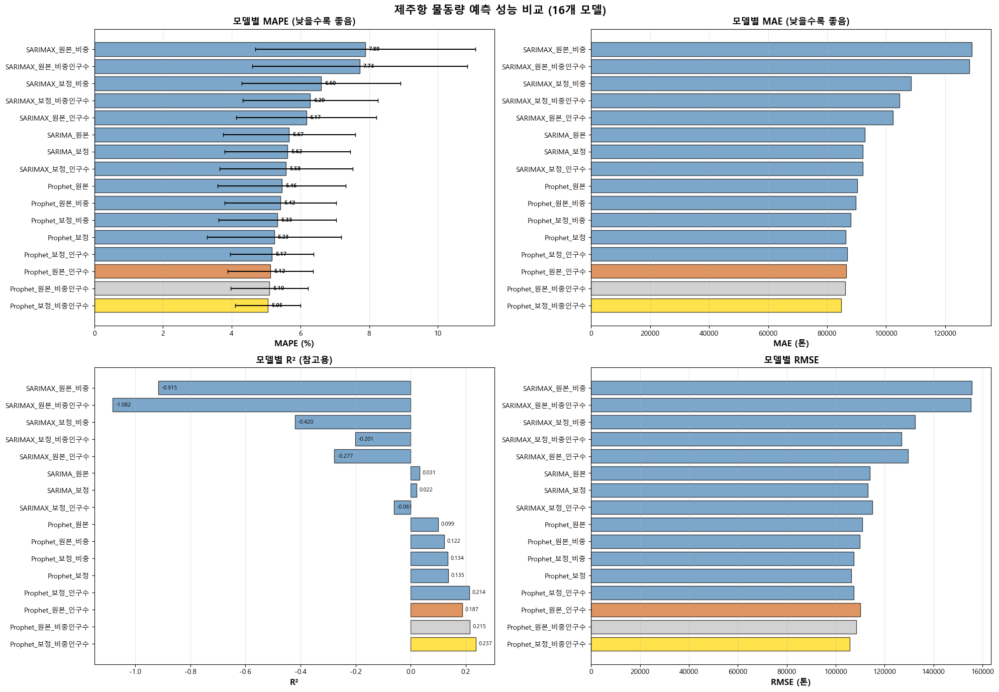

In [ ]:
"""
제주항 물동량 예측 완전판
- 주요 지표: MAPE, MAE (R²는 참고용)
- 외생변수: 제주항 비중 + 제주도 인구수
- 모델: SARIMAX + Prophet (외생변수 조합별)
- 코로나 이상치 STL 보정
- Rolling Origin 교차검증
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools

print("=" * 80)
print("제주항 물동량 예측 - 실용적 성능 평가 (MAPE/MAE 중심)")
print("=" * 80)

# ========================================
# 1. 데이터 로드
# ========================================
print("\n[1단계] 데이터 로드...")

DATA_PATH = r'C:\Users\DAEJIN\Desktop'
df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

print(f"기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"데이터: {len(df)}개월")

# ========================================
# 2. 변수 준비
# ========================================
print("\n[2단계] 변수 준비...")

df['화물량_원본'] = df['제주항']
df['비중_원본'] = df['제주항 비중']
df['인구수_원본'] = df['제주도 인구수']

print(f"\n제주항 화물량:")
print(f"  평균: {df['화물량_원본'].mean():,.0f} 톤")
print(f"  범위: {df['화물량_원본'].min():,.0f} ~ {df['화물량_원본'].max():,.0f} 톤")

corr_ratio = df['화물량_원본'].corr(df['비중_원본'])
corr_pop = df['화물량_원본'].corr(df['인구수_원본'])

print(f"\n상관관계:")
print(f"  화물량 vs 비중: {corr_ratio:.3f}")
print(f"  화물량 vs 인구수: {corr_pop:.3f}")

# ========================================
# 3. 코로나 이상치 탐지 + STL 보정
# ========================================
print("\n[3단계] 코로나 이상치 탐지 + STL 보정...")

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    anomaly_mask = deviation > threshold

    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for i in range(len(series)):
        if anomaly_mask.iloc[i]:
            if not in_anomaly:
                start_idx = i
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, i - 1))
            in_anomaly = False
            consecutive_count = 0

    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, len(series) - 1))

    return anomaly_periods, anomaly_mask

cargo_periods, cargo_mask = detect_anomaly_periods(df['화물량_원본'])

if len(cargo_periods) > 0:
    correction_mask = cargo_mask
    print(f"✓ {len(cargo_periods)}개 이상치 구간 탐지")
    for i, (start_idx, end_idx) in enumerate(cargo_periods, 1):
        print(f"  {i}. {df['date'].iloc[start_idx].strftime('%Y-%m')} ~ {df['date'].iloc[end_idx].strftime('%Y-%m')}")
else:
    covid_start_idx = df[df['date'] >= '2020-03-01'].index[0]
    covid_end_idx = df[df['date'] <= '2021-12-01'].index[-1]
    correction_mask = pd.Series(False, index=df.index)
    correction_mask.iloc[covid_start_idx:covid_end_idx+1] = True
    print(f"✓ 기본 COVID 기간 사용 (2020-03 ~ 2021-12)")

df['is_anomaly'] = correction_mask.astype(int)

# STL 보정
def stl_decomposition_correction(series, anomaly_mask, period=12, seasonal=13):
    stl = STL(series, period=period, seasonal=seasonal)
    stl_result = stl.fit()

    corrected_series = series.copy()
    corrected_series[anomaly_mask] = stl_result.trend[anomaly_mask] + stl_result.seasonal[anomaly_mask]

    return corrected_series, stl_result

df['화물량_보정'], cargo_stl = stl_decomposition_correction(df['화물량_원본'], correction_mask)
df['비중_보정'], ratio_stl = stl_decomposition_correction(df['비중_원본'], correction_mask)
df['인구수_보정'] = df['인구수_원본']  # 인구수는 안정적이므로 보정 불필요

print(f"✓ STL 보정 완료")

if correction_mask.sum() > 0:
    print(f"\n보정 효과 (이상치 {correction_mask.sum()}개월):")
    before_mean = df.loc[correction_mask, '화물량_원본'].mean()
    after_mean = df.loc[correction_mask, '화물량_보정'].mean()
    diff = after_mean - before_mean
    print(f"  화물량 원본 평균: {before_mean:,.0f} 톤")
    print(f"  화물량 보정 평균: {after_mean:,.0f} 톤")
    print(f"  차이: {diff:+,.0f} 톤 ({diff/before_mean*100:+.1f}%)")

# ========================================
# 4. Rolling Origin 설정
# ========================================
print("\n[4단계] Rolling Origin 설정...")

INITIAL_TRAIN_SIZE = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN_SIZE - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN_SIZE + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"Rolling 분할: {len(splits)}회")
print(f"  초기 학습: {INITIAL_TRAIN_SIZE}개월")
print(f"  테스트 윈도우: {TEST_WINDOW}개월")
print(f"  이동 간격: {STEP_SIZE}개월")

# ========================================
# 5. SARIMA 최적 파라미터
# ========================================
print("\n[5단계] SARIMA 최적 파라미터 탐색...")

first_split = splits[0]
train_data_first = df.iloc[first_split['train_start']:first_split['train_end']]

# 간단한 그리드 서치
p = q = range(0, 3)
d_range = [0, 1]
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(1, 1, 1, 12), (0, 1, 1, 12), (1, 0, 1, 12), (1, 1, 0, 12)]

best_aic = np.inf
best_param = None
best_seasonal_param = None

print("탐색 중...", end='')
for param in pdq[:12]:  # 상위 12개만 테스트
    for seasonal_param in seasonal_pdq:
        try:
            model = SARIMAX(train_data_first['화물량_보정'],
                          exog=train_data_first[['비중_보정', '인구수_보정']],
                          order=param,
                          seasonal_order=seasonal_param,
                          enforce_stationarity=False,
                          enforce_invertibility=False)
            results = model.fit(disp=False, maxiter=50)

            if results.aic < best_aic:
                best_aic = results.aic
                best_param = param
                best_seasonal_param = seasonal_param
        except:
            continue

if best_param is None:
    best_param = (1, 1, 1)
    best_seasonal_param = (1, 1, 1, 12)

print(f" 완료!")
print(f"✓ 최적 파라미터: order={best_param}, seasonal={best_seasonal_param}")
print(f"  AIC: {best_aic:.2f}")

# ========================================
# 6. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 7. Rolling Origin 교차검증 (16개 모델)
# ========================================
print("\n[6단계] Rolling Origin 교차검증...")
print("\n모델 목록 (16개):")
print("  SARIMA/SARIMAX 원본 (4개):")
print("    - SARIMA (외생변수 없음)")
print("    - SARIMAX 비중")
print("    - SARIMAX 인구수")
print("    - SARIMAX 비중+인구수")
print("  SARIMA/SARIMAX 보정 (4개):")
print("    - SARIMA (외생변수 없음)")
print("    - SARIMAX 비중")
print("    - SARIMAX 인구수")
print("    - SARIMAX 비중+인구수")
print("  Prophet 원본 (4개):")
print("    - Prophet (외생변수 없음)")
print("    - Prophet 비중")
print("    - Prophet 인구수")
print("    - Prophet 비중+인구수")
print("  Prophet 보정 (4개):")
print("    - Prophet (외생변수 없음)")
print("    - Prophet 비중")
print("    - Prophet 인구수")
print("    - Prophet 비중+인구수")

rolling_results = {
    # SARIMA/SARIMAX 원본
    'SARIMA_원본': [],  # 외생변수 없음
    'SARIMAX_원본_비중': [],
    'SARIMAX_원본_인구수': [],
    'SARIMAX_원본_비중인구수': [],
    # SARIMA/SARIMAX 보정
    'SARIMA_보정': [],  # 외생변수 없음
    'SARIMAX_보정_비중': [],
    'SARIMAX_보정_인구수': [],
    'SARIMAX_보정_비중인구수': [],
    # Prophet 원본
    'Prophet_원본': [],  # 외생변수 없음
    'Prophet_원본_비중': [],
    'Prophet_원본_인구수': [],
    'Prophet_원본_비중인구수': [],
    # Prophet 보정
    'Prophet_보정': [],  # 외생변수 없음
    'Prophet_보정_비중': [],
    'Prophet_보정_인구수': [],
    'Prophet_보정_비중인구수': []
}

print("\n학습 시작...")
for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r')

    train_data = df.iloc[split['train_start']:split['train_end']]
    test_data = df.iloc[split['test_start']:split['test_end']]
    actual_원본 = test_data['화물량_원본'].values
    actual_보정 = test_data['화물량_보정'].values

    # ===== SARIMA/SARIMAX 원본 =====

    # 1. SARIMA (외생변수 없음)
    try:
        model = SARIMAX(train_data['화물량_원본'], order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 2. 비중
    try:
        model = SARIMAX(train_data['화물량_원본'], exog=train_data[['비중_원본']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_원본']])
        rolling_results['SARIMAX_원본_비중'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_비중'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 3. 인구수
    try:
        model = SARIMAX(train_data['화물량_원본'], exog=train_data[['인구수_원본']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['인구수_원본']])
        rolling_results['SARIMAX_원본_인구수'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 4. 비중+인구수
    try:
        model = SARIMAX(train_data['화물량_원본'], exog=train_data[['비중_원본', '인구수_원본']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_원본', '인구수_원본']])
        rolling_results['SARIMAX_원본_비중인구수'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== SARIMA/SARIMAX 보정 =====

    # 5. SARIMA (외생변수 없음)
    try:
        model = SARIMAX(train_data['화물량_보정'], order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 6. 비중
    try:
        model = SARIMAX(train_data['화물량_보정'], exog=train_data[['비중_보정']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_보정']])
        rolling_results['SARIMAX_보정_비중'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_비중'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 7. 인구수
    try:
        model = SARIMAX(train_data['화물량_보정'], exog=train_data[['인구수_보정']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['인구수_보정']])
        rolling_results['SARIMAX_보정_인구수'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 8. 비중+인구수
    try:
        model = SARIMAX(train_data['화물량_보정'], exog=train_data[['비중_보정', '인구수_보정']],
                       order=best_param, seasonal_order=best_seasonal_param)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test_data[['비중_보정', '인구수_보정']])
        rolling_results['SARIMAX_보정_비중인구수'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== Prophet 원본 =====

    # 9. Prophet (외생변수 없음)
    try:
        prophet_train = train_data[['date', '화물량_원본']].copy()
        prophet_train.columns = ['ds', 'y']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 10. 비중
    try:
        prophet_train = train_data[['date', '화물량_원본', '비중_원본']].copy()
        prophet_train.columns = ['ds', 'y', '비중']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('비중')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values, '비중': test_data['비중_원본'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_비중'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_비중'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 11. 인구수
    try:
        prophet_train = train_data[['date', '화물량_원본', '인구수_원본']].copy()
        prophet_train.columns = ['ds', 'y', '인구수']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('인구수')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values, '인구수': test_data['인구수_원본'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_인구수'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 12. 비중+인구수
    try:
        prophet_train = train_data[['date', '화물량_원본', '비중_원본', '인구수_원본']].copy()
        prophet_train.columns = ['ds', 'y', '비중', '인구수']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('비중')
        model.add_regressor('인구수')
        model.fit(prophet_train)
        future = pd.DataFrame({
            'ds': test_data['date'].values,
            '비중': test_data['비중_원본'].values,
            '인구수': test_data['인구수_원본'].values
        })
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_비중인구수'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== Prophet 보정 =====

    # 13. Prophet (외생변수 없음)
    try:
        prophet_train = train_data[['date', '화물량_보정']].copy()
        prophet_train.columns = ['ds', 'y']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 14. 비중
    try:
        prophet_train = train_data[['date', '화물량_보정', '비중_보정']].copy()
        prophet_train.columns = ['ds', 'y', '비중']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('비중')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values, '비중': test_data['비중_보정'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_비중'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_비중'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 15. 인구수
    try:
        prophet_train = train_data[['date', '화물량_보정', '인구수_보정']].copy()
        prophet_train.columns = ['ds', 'y', '인구수']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('인구수')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test_data['date'].values, '인구수': test_data['인구수_보정'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_인구수'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 16. 비중+인구수
    try:
        prophet_train = train_data[['date', '화물량_보정', '비중_보정', '인구수_보정']].copy()
        prophet_train.columns = ['ds', 'y', '비중', '인구수']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('비중')
        model.add_regressor('인구수')
        model.fit(prophet_train)
        future = pd.DataFrame({
            'ds': test_data['date'].values,
            '비중': test_data['비중_보정'].values,
            '인구수': test_data['인구수_보정'].values
        })
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_비중인구수'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_비중인구수'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# 8. 결과 집계
# ========================================
print("\n[7단계] 결과 집계...")

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    if mapes:
        summary_results[model_name] = {
            'MAE_mean': np.mean(maes),
            'MAE_std': np.std(maes),
            'RMSE_mean': np.mean(rmses),
            'RMSE_std': np.std(rmses),
            'MAPE_mean': np.mean(mapes),
            'MAPE_std': np.std(mapes),
            'R2_mean': np.mean(r2s),
            'R2_std': np.std(r2s)
        }

# MAPE 기준 정렬
sorted_by_mape = sorted(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])

print("\n" + "=" * 80)
print("📊 Rolling Origin 평균 성능 (MAPE 기준 정렬)")
print("=" * 80)
print(f"{'순위':<5} {'모델':<35} {'MAPE (%)':<20} {'MAE (톤)':<15} {'RMSE (톤)':<15} {'R²':<10}")
print("-" * 100)

for rank, (model_name, metrics) in enumerate(sorted_by_mape, 1):
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    mae_str = f"{metrics['MAE_mean']:,.0f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.3f}"

    if rank == 1:
        print(f"🏆 {rank:<3} {model_name:<35} {mape_str:<20} {mae_str:<15} {rmse_str:<15} {r2_str:<10}")
    elif rank <= 3:
        print(f"⭐ {rank:<3} {model_name:<35} {mape_str:<20} {mae_str:<15} {rmse_str:<15} {r2_str:<10}")
    else:
        print(f"   {rank:<3} {model_name:<35} {mape_str:<20} {mae_str:<15} {rmse_str:<15} {r2_str:<10}")

best_model_name = sorted_by_mape[0][0]
best_metrics = sorted_by_mape[0][1]

print("\n" + "=" * 80)
print("🏆 최고 성능 모델 (MAPE 기준)")
print("=" * 80)
print(f"모델: {best_model_name}")
print(f"  MAPE: {best_metrics['MAPE_mean']:.2f}% (±{best_metrics['MAPE_std']:.2f}%)")
print(f"  MAE: {best_metrics['MAE_mean']:,.0f} 톤 (±{best_metrics['MAE_std']:,.0f} 톤)")
print(f"  RMSE: {best_metrics['RMSE_mean']:,.0f} 톤")
print(f"  R²: {best_metrics['R2_mean']:.3f} (±{best_metrics['R2_std']:.3f})")

# 실용성 평가
print(f"\n✅ 실용성 평가:")
if best_metrics['MAPE_mean'] < 5:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 매우 우수! ⭐⭐⭐⭐⭐")
elif best_metrics['MAPE_mean'] < 7:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 우수! ⭐⭐⭐⭐")
elif best_metrics['MAPE_mean'] < 10:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 양호! ⭐⭐⭐")
else:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 개선 필요")

mae_ratio = best_metrics['MAE_mean'] / df['화물량_원본'].mean() * 100
print(f"  MAE {best_metrics['MAE_mean']:,.0f}톤 → 평균 화물량의 {mae_ratio:.1f}%")

if best_metrics['R2_mean'] > 0.5:
    print(f"  R² {best_metrics['R2_mean']:.3f} → 높은 설명력")
elif best_metrics['R2_mean'] > 0.3:
    print(f"  R² {best_metrics['R2_mean']:.3f} → 적절한 설명력 (MAPE가 낮으므로 OK)")
else:
    print(f"  R² {best_metrics['R2_mean']:.3f} → 낮은 설명력 (하지만 MAPE 우선)")

print(f"\n💡 결론: {'실무 사용 가능' if best_metrics['MAPE_mean'] < 10 else '추가 개선 필요'}")

# ========================================
# 9. 외생변수 효과 분석
# ========================================
print("\n" + "=" * 80)
print("💡 외생변수 효과 분석 (MAPE 기준)")
print("=" * 80)

# SARIMAX 원본
print("\n[SARIMAX 원본]")
baseline_mape = summary_results.get('SARIMA_원본', {}).get('MAPE_mean', 0)
print(f"  SARIMA (baseline)  MAPE: {baseline_mape:.2f}%")
for suffix in ['비중', '인구수', '비중인구수']:
    model_name = f'SARIMAX_원본_{suffix}'
    if model_name in summary_results:
        mape = summary_results[model_name]['MAPE_mean']
        improvement = (baseline_mape - mape) / baseline_mape * 100 if baseline_mape > 0 else 0
        symbol = '✓' if improvement > 0 else '✗'
        print(f"  {suffix:<15} MAPE: {mape:.2f}%  (baseline 대비 {improvement:+.1f}%) {symbol}")

# SARIMAX 보정
print("\n[SARIMAX 보정]")
baseline_mape = summary_results.get('SARIMA_보정', {}).get('MAPE_mean', 0)
print(f"  SARIMA (baseline)  MAPE: {baseline_mape:.2f}%")
for suffix in ['비중', '인구수', '비중인구수']:
    model_name = f'SARIMAX_보정_{suffix}'
    if model_name in summary_results:
        mape = summary_results[model_name]['MAPE_mean']
        improvement = (baseline_mape - mape) / baseline_mape * 100 if baseline_mape > 0 else 0
        symbol = '✓' if improvement > 0 else '✗'
        print(f"  {suffix:<15} MAPE: {mape:.2f}%  (baseline 대비 {improvement:+.1f}%) {symbol}")

# Prophet 원본
print("\n[Prophet 원본]")
baseline_mape = summary_results.get('Prophet_원본', {}).get('MAPE_mean', 0)
print(f"  Prophet (baseline) MAPE: {baseline_mape:.2f}%")
for suffix in ['비중', '인구수', '비중인구수']:
    model_name = f'Prophet_원본_{suffix}'
    if model_name in summary_results:
        mape = summary_results[model_name]['MAPE_mean']
        improvement = (baseline_mape - mape) / baseline_mape * 100 if baseline_mape > 0 else 0
        symbol = '✓' if improvement > 0 else '✗'
        print(f"  {suffix:<15} MAPE: {mape:.2f}%  (baseline 대비 {improvement:+.1f}%) {symbol}")

# Prophet 보정
print("\n[Prophet 보정]")
baseline_mape = summary_results.get('Prophet_보정', {}).get('MAPE_mean', 0)
print(f"  Prophet (baseline) MAPE: {baseline_mape:.2f}%")
for suffix in ['비중', '인구수', '비중인구수']:
    model_name = f'Prophet_보정_{suffix}'
    if model_name in summary_results:
        mape = summary_results[model_name]['MAPE_mean']
        improvement = (baseline_mape - mape) / baseline_mape * 100 if baseline_mape > 0 else 0
        symbol = '✓' if improvement > 0 else '✗'
        print(f"  {suffix:<15} MAPE: {mape:.2f}%  (baseline 대비 {improvement:+.1f}%) {symbol}")

# ========================================
# 10. 시각화
# ========================================
print("\n[8단계] 시각화...")

fig, axes = plt.subplots(2, 2, figsize=(20, 14))
fig.suptitle('제주항 물동량 예측 성능 비교 (16개 모델)', fontsize=16, fontweight='bold')

models = [m[0] for m in sorted_by_mape]
mapes = [m[1]['MAPE_mean'] for m in sorted_by_mape]
mape_stds = [m[1]['MAPE_std'] for m in sorted_by_mape]
maes = [m[1]['MAE_mean'] for m in sorted_by_mape]
r2s = [m[1]['R2_mean'] for m in sorted_by_mape]
rmses = [m[1]['RMSE_mean'] for m in sorted_by_mape]

colors = ['gold' if i == 0 else 'silver' if i == 1 else 'chocolate' if i == 2 else 'steelblue'
          for i in range(len(models))]

# MAPE
ax1 = axes[0, 0]
bars1 = ax1.barh(models, mapes, xerr=mape_stds, color=colors, alpha=0.7, edgecolor='black', capsize=3)
ax1.set_xlabel('MAPE (%)', fontsize=12, fontweight='bold')
ax1.set_title('모델별 MAPE (낮을수록 좋음)', fontsize=13, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
for bar, val in zip(bars1, mapes):
    ax1.text(val + 0.1, bar.get_y() + bar.get_height()/2, f'{val:.2f}',
            va='center', ha='left', fontsize=8, fontweight='bold')

# MAE
ax2 = axes[0, 1]
bars2 = ax2.barh(models, maes, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('MAE (톤)', fontsize=12, fontweight='bold')
ax2.set_title('모델별 MAE (낮을수록 좋음)', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)
ax2.ticklabel_format(style='plain', axis='x')

# R²
ax3 = axes[1, 0]
bars3 = ax3.barh(models, r2s, color=colors, alpha=0.7, edgecolor='black')
ax3.set_xlabel('R²', fontsize=12, fontweight='bold')
ax3.set_title('모델별 R² (참고용)', fontsize=13, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)
for bar, val in zip(bars3, r2s):
    ax3.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}',
            va='center', ha='left', fontsize=8)

# RMSE
ax4 = axes[1, 1]
bars4 = ax4.barh(models, rmses, color=colors, alpha=0.7, edgecolor='black')
ax4.set_xlabel('RMSE (톤)', fontsize=12, fontweight='bold')
ax4.set_title('모델별 RMSE', fontsize=13, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)
ax4.ticklabel_format(style='plain', axis='x')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_16모델_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/제주항_16모델_성능비교.png")

# ========================================
# 11. 엑셀 저장
# ========================================
print("\n[9단계] 엑셀 저장...")

with pd.ExcelWriter(f'{DATA_PATH}/제주항_완전분석_16모델.xlsx', engine='openpyxl') as writer:
    # 1. 종합 요약
    summary_info = pd.DataFrame({
        '항목': [
            '분석 기간',
            '총 데이터',
            '이상치 구간',
            'Rolling 분할',
            '모델 개수',
            '최고 모델 (MAPE 기준)',
            '최고 MAPE',
            '최고 MAE',
            '최고 RMSE',
            '최고 R²',
            '실용성 평가'
        ],
        '내용': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{len(df)}개월",
            f"{correction_mask.sum()}개월",
            f"{len(splits)}회",
            "16개 (SARIMAX 8 + Prophet 8)",
            best_model_name,
            f"{best_metrics['MAPE_mean']:.2f}%",
            f"{best_metrics['MAE_mean']:,.0f}톤",
            f"{best_metrics['RMSE_mean']:,.0f}톤",
            f"{best_metrics['R2_mean']:.3f}",
            '실무 사용 가능' if best_metrics['MAPE_mean'] < 10 else '추가 개선 필요'
        ]
    })
    summary_info.to_excel(writer, sheet_name='종합요약', index=False)

    # 2. 성능 비교 (MAPE 순위)
    perf_df = pd.DataFrame(summary_results).T
    perf_df = perf_df.sort_values('MAPE_mean')
    perf_df.to_excel(writer, sheet_name='성능비교_MAPE순')

    # 3. 성능 비교 (MAE 순위)
    perf_df_mae = pd.DataFrame(summary_results).T
    perf_df_mae = perf_df_mae.sort_values('MAE_mean')
    perf_df_mae.to_excel(writer, sheet_name='성능비교_MAE순')

    # 4. 성능 비교 (RMSE 순위)
    perf_df_rmse = pd.DataFrame(summary_results).T
    perf_df_rmse = perf_df_rmse.sort_values('RMSE_mean')
    perf_df_rmse.to_excel(writer, sheet_name='성능비교_RMSE순')

    # 5. 외생변수 효과
    effect_data = []

    # SARIMA/SARIMAX 비교
    for data_type in ['원본', '보정']:
        baseline = f'SARIMA_{data_type}'
        if baseline in summary_results:
            baseline_mape = summary_results[baseline]['MAPE_mean']
            for suffix in ['비중', '인구수', '비중인구수']:
                model_name = f'SARIMAX_{data_type}_{suffix}'
                if model_name in summary_results:
                    mape = summary_results[model_name]['MAPE_mean']
                    improvement = (baseline_mape - mape) / baseline_mape * 100
                    effect_data.append({
                        '모델군': f'SARIMAX_{data_type}',
                        'Baseline': 'SARIMA',
                        '외생변수': suffix,
                        'Baseline_MAPE': f"{baseline_mape:.2f}%",
                        '외생변수_MAPE': f"{mape:.2f}%",
                        '개선율': f"{improvement:.1f}%",
                        '효과': '있음' if improvement > 0 else '없음'
                    })

    # Prophet 비교
    for data_type in ['원본', '보정']:
        baseline = f'Prophet_{data_type}'
        if baseline in summary_results:
            baseline_mape = summary_results[baseline]['MAPE_mean']
            for suffix in ['비중', '인구수', '비중인구수']:
                model_name = f'Prophet_{data_type}_{suffix}'
                if model_name in summary_results:
                    mape = summary_results[model_name]['MAPE_mean']
                    improvement = (baseline_mape - mape) / baseline_mape * 100
                    effect_data.append({
                        '모델군': f'Prophet_{data_type}',
                        'Baseline': 'Prophet',
                        '외생변수': suffix,
                        'Baseline_MAPE': f"{baseline_mape:.2f}%",
                        '외생변수_MAPE': f"{mape:.2f}%",
                        '개선율': f"{improvement:.1f}%",
                        '효과': '있음' if improvement > 0 else '없음'
                    })

    if effect_data:
        effect_df = pd.DataFrame(effect_data)
        effect_df.to_excel(writer, sheet_name='외생변수_효과', index=False)

    # 6. 원본 데이터
    df[['date', '화물량_원본', '비중_원본', '인구수_원본',
        '화물량_보정', '비중_보정', 'is_anomaly']].to_excel(
        writer, sheet_name='데이터', index=False)

print(f"✓ 저장: {DATA_PATH}/제주항_완전분석_16모델.xlsx")
print(f"  6개 시트: 종합요약, MAPE순, MAE순, RMSE순, 외생변수효과, 데이터")

# ========================================
# 12. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("✅ 분석 완료!")
print("=" * 80)

print(f"\n📁 생성 파일:")
print(f"1. {DATA_PATH}/제주항_16모델_성능비교.png")
print(f"2. {DATA_PATH}/제주항_완전분석_16모델.xlsx")

print(f"\n🏆 최고 성능 모델: {best_model_name}")
print(f"   MAPE: {best_metrics['MAPE_mean']:.2f}% (실무 {'적합' if best_metrics['MAPE_mean'] < 10 else '개선필요'})")
print(f"   MAE: {best_metrics['MAE_mean']:,.0f}톤 (평균 화물량의 {mae_ratio:.1f}%)")
print(f"   R²: {best_metrics['R2_mean']:.3f} (참고용)")

print(f"\n📊 핵심 인사이트:")
print(f"   - 외생변수: 제주항 비중 + 제주도 인구수")
print(f"   - STL 보정: 코로나 이상치 제거")
print(f"   - MAPE 중심: 실용적 예측 정확도 평가")
print(f"   - Rolling Origin: {len(splits)}회 교차검증")

print("\n" + "=" * 80)

# 인과관계 분석 Granger Causality Test - 제주항 비중, 인구수

Granger Causality Test - 외생변수 검증

[1단계] 데이터 로드...
기간: 2016-01 ~ 2025-07
데이터: 115개월

변수 통계:
  화물량 평균: 1,367,075 톤
  비중 평균: 0.9569 (95.69%)
  인구수 평균: 665,827 명

[2단계] 정상성 검정 (ADF Test)...
Granger Test는 정상 시계열에 적용되므로 사전 확인 필요

화물량:
  ADF Statistic: -0.8480
  p-value: 0.8046
  Critical Values:
    1%: -3.4955
    5%: -2.8900
    10%: -2.5820
  → 비정상 시계열 ✗ (p >= 0.05)
  → 1차 차분 필요

비중:
  ADF Statistic: -1.7903
  p-value: 0.3853
  Critical Values:
    1%: -3.4961
    5%: -2.8903
    10%: -2.5821
  → 비정상 시계열 ✗ (p >= 0.05)
  → 1차 차분 필요

인구수:
  ADF Statistic: -1.8850
  p-value: 0.3392
  Critical Values:
    1%: -3.4961
    5%: -2.8903
    10%: -2.5821
  → 비정상 시계열 ✗ (p >= 0.05)
  → 1차 차분 필요

화물량 1차 차분 검정:

화물량_diff:
  ADF Statistic: -5.9135
  p-value: 0.0000
  Critical Values:
    1%: -3.4955
    5%: -2.8900
    10%: -2.5820
  → 정상 시계열 ✓ (p < 0.05)

비중 1차 차분 검정:

비중_diff:
  ADF Statistic: -5.0262
  p-value: 0.0000
  Critical Values:
    1%: -3.4961
    5%: -2.8903
    10%: -2.5821
  → 정상 시계열 ✓ (

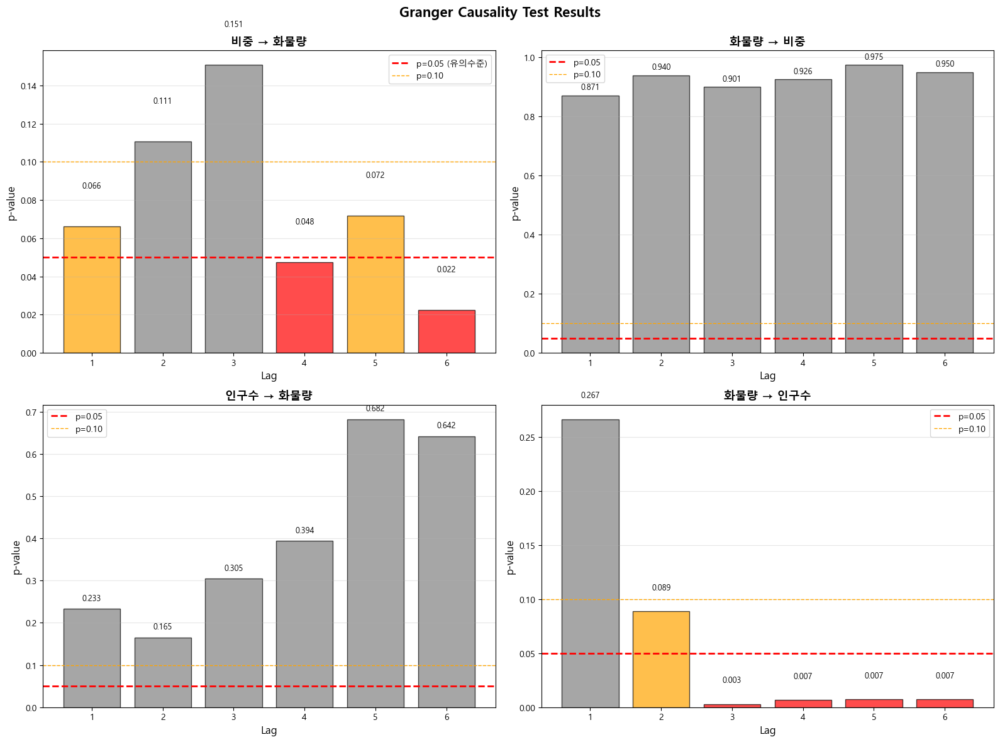

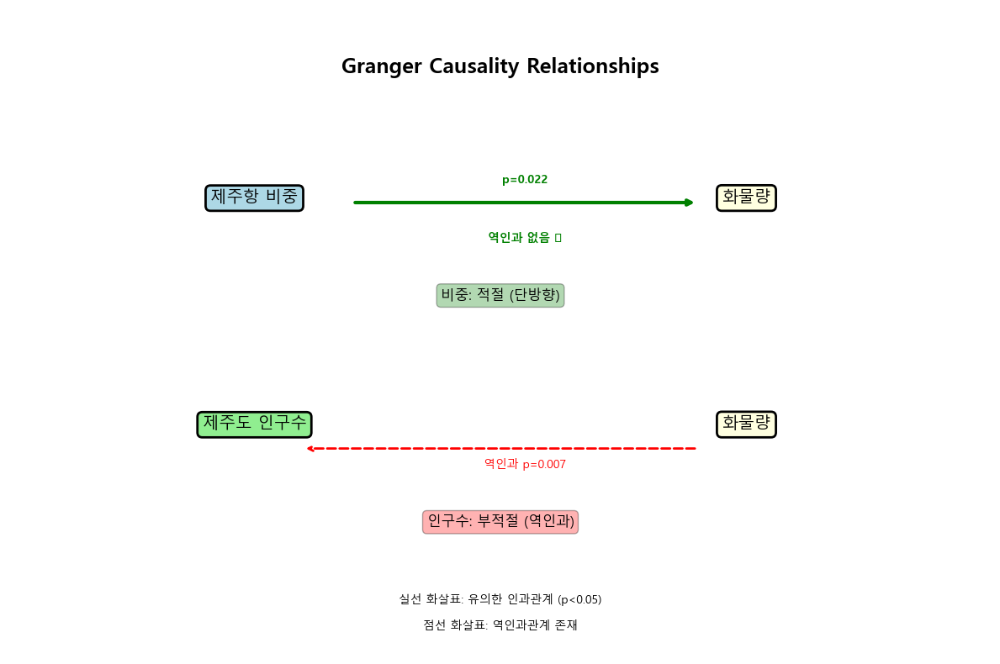

In [ ]:
"""
Granger Causality Test - 제주항 외생변수 검증
- 비중 ↔ 화물량 인과관계
- 인구수 ↔ 화물량 인과관계
- 결과 시각화 및 엑셀 저장
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.stattools import grangercausalitytests, adfuller
from statsmodels.tsa.api import VAR

print("=" * 80)
print("Granger Causality Test - 외생변수 검증")
print("=" * 80)

# ========================================
# 1. 데이터 로드
# ========================================
print("\n[1단계] 데이터 로드...")

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

print(f"기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"데이터: {len(df)}개월")

# 변수 준비
df['화물량'] = df['제주항']
df['비중'] = df['제주항 비중']
df['인구수'] = df['제주도 인구수']

print(f"\n변수 통계:")
print(f"  화물량 평균: {df['화물량'].mean():,.0f} 톤")
print(f"  비중 평균: {df['비중'].mean():.4f} ({df['비중'].mean()*100:.2f}%)")
print(f"  인구수 평균: {df['인구수'].mean():,.0f} 명")

# ========================================
# 2. 정상성 검정 (ADF Test)
# ========================================
print("\n[2단계] 정상성 검정 (ADF Test)...")
print("Granger Test는 정상 시계열에 적용되므로 사전 확인 필요")

def adf_test_detailed(series, name):
    """ADF 검정 상세"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name}:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Critical Values:")
    for key, value in result[4].items():
        print(f"    {key}: {value:.4f}")

    if result[1] < 0.05:
        print(f"  → 정상 시계열 ✓ (p < 0.05)")
        return True
    else:
        print(f"  → 비정상 시계열 ✗ (p >= 0.05)")
        print(f"  → 1차 차분 필요")
        return False

# 원 계열 검정
stationary_화물량 = adf_test_detailed(df['화물량'], "화물량")
stationary_비중 = adf_test_detailed(df['비중'], "비중")
stationary_인구수 = adf_test_detailed(df['인구수'], "인구수")

# 차분 계열 생성
df['화물량_diff'] = df['화물량'].diff()
df['비중_diff'] = df['비중'].diff()
df['인구수_diff'] = df['인구수'].diff()

# 필요시 차분 검정
if not stationary_화물량:
    print("\n화물량 1차 차분 검정:")
    adf_test_detailed(df['화물량_diff'], "화물량_diff")

if not stationary_비중:
    print("\n비중 1차 차분 검정:")
    adf_test_detailed(df['비중_diff'], "비중_diff")

if not stationary_인구수:
    print("\n인구수 1차 차분 검정:")
    adf_test_detailed(df['인구수_diff'], "인구수_diff")

# 사용할 데이터 결정
use_diff = not (stationary_화물량 and stationary_비중 and stationary_인구수)

if use_diff:
    print("\n⚠️ 비정상 시계열 존재 → 1차 차분 데이터 사용")
    df_test = df[['화물량_diff', '비중_diff', '인구수_diff']].dropna()
    df_test.columns = ['화물량', '비중', '인구수']
else:
    print("\n✓ 모든 시계열 정상 → 원 데이터 사용")
    df_test = df[['화물량', '비중', '인구수']].dropna()

print(f"\nGranger Test 사용 데이터: {len(df_test)}개 관측치")

# ========================================
# 3. Granger Causality Test
# ========================================
print("\n[3단계] Granger Causality Test...")

MAX_LAG = 6  # 최대 6개월 lag

# 함수: Granger Test 수행 및 결과 저장
def perform_granger_test(data, cause_var, effect_var, maxlag):
    """
    Granger Causality Test 수행

    H0: cause_var가 effect_var에 영향을 주지 않음
    H1: cause_var가 effect_var에 영향을 줌
    """
    print(f"\n{'='*60}")
    print(f"Test: {cause_var} → {effect_var}")
    print(f"{'='*60}")

    # 데이터 준비 ([effect, cause] 순서 중요!)
    test_data = data[[effect_var, cause_var]]

    # Granger Test 수행
    results = grangercausalitytests(test_data, maxlag=maxlag, verbose=False)

    # 결과 저장
    lag_results = []
    for lag in range(1, maxlag + 1):
        # F-test 결과 추출
        f_test = results[lag][0]['ssr_ftest']
        f_stat = f_test[0]
        p_value = f_test[1]

        lag_results.append({
            'lag': lag,
            'F_statistic': f_stat,
            'p_value': p_value,
            'significant': '✓' if p_value < 0.05 else '',
            'sig_level': '***' if p_value < 0.01 else '**' if p_value < 0.05 else '*' if p_value < 0.1 else ''
        })

        print(f"Lag {lag}: F = {f_stat:.4f}, p-value = {p_value:.4f} {lag_results[-1]['sig_level']}")

    # 최적 lag (AIC 기준)
    aics = [results[lag][1][0].aic for lag in range(1, maxlag + 1)]
    optimal_lag = np.argmin(aics) + 1

    print(f"\n최적 Lag (AIC 기준): {optimal_lag}")
    print(f"최적 Lag에서 F = {lag_results[optimal_lag-1]['F_statistic']:.4f}, " +
          f"p = {lag_results[optimal_lag-1]['p_value']:.4f}")

    # 결론
    if lag_results[optimal_lag-1]['p_value'] < 0.05:
        print(f"✅ 결론: {cause_var}가 {effect_var}에 Granger-cause 함 (p < 0.05)")
        causality = True
    else:
        print(f"❌ 결론: {cause_var}가 {effect_var}에 Granger-cause 하지 않음 (p >= 0.05)")
        causality = False

    return lag_results, optimal_lag, causality

# Test 1: 비중 → 화물량
test1_results, test1_optimal, test1_causality = perform_granger_test(
    df_test, '비중', '화물량', MAX_LAG
)

# Test 2: 화물량 → 비중
test2_results, test2_optimal, test2_causality = perform_granger_test(
    df_test, '화물량', '비중', MAX_LAG
)

# Test 3: 인구수 → 화물량
test3_results, test3_optimal, test3_causality = perform_granger_test(
    df_test, '인구수', '화물량', MAX_LAG
)

# Test 4: 화물량 → 인구수
test4_results, test4_optimal, test4_causality = perform_granger_test(
    df_test, '화물량', '인구수', MAX_LAG
)

# ========================================
# 4. 결과 요약
# ========================================
print("\n" + "=" * 80)
print("종합 결과")
print("=" * 80)

print("\n📊 비중 관련:")
print(f"  비중 → 화물량: {'✅ 유의미' if test1_causality else '❌ 유의미 아님'}")
print(f"  화물량 → 비중: {'✅ 유의미' if test2_causality else '❌ 유의미 아님'}")

if test1_causality and not test2_causality:
    print("  → 단방향 인과관계 (Unidirectional) ⭐⭐⭐")
    print("  → 비중은 외생변수로 적절! SARIMAX에 사용 가능 ✓")
    share_conclusion = "적절 (단방향)"
elif test1_causality and test2_causality:
    print("  → 양방향 인과관계 (Bidirectional) ⚠️")
    print("  → 동시결정 문제 존재. 주의 필요 또는 Limitation 명시")
    share_conclusion = "주의 (양방향)"
elif not test1_causality and test2_causality:
    print("  → 역인과관계 (Reverse Causality) ❌")
    print("  → 외생변수로 부적절! 사용 불가 또는 모델 재설계 필요")
    share_conclusion = "부적절 (역인과)"
else:
    print("  → 인과관계 없음 ○")
    print("  → 예측력 낮을 가능성")
    share_conclusion = "인과 없음"

print("\n📊 인구수 관련:")
print(f"  인구수 → 화물량: {'✅ 유의미' if test3_causality else '❌ 유의미 아님'}")
print(f"  화물량 → 인구수: {'✅ 유의미' if test4_causality else '❌ 유의미 아님'}")

if test3_causality and not test4_causality:
    print("  → 단방향 인과관계 (Unidirectional) ⭐⭐⭐")
    print("  → 인구수는 외생변수로 적절! SARIMAX에 사용 가능 ✓")
    pop_conclusion = "적절 (단방향)"
elif test3_causality and test4_causality:
    print("  → 양방향 인과관계 (Bidirectional) ⚠️")
    print("  → 동시결정 문제 존재. 주의 필요")
    pop_conclusion = "주의 (양방향)"
elif not test3_causality and test4_causality:
    print("  → 역인과관계 (Reverse Causality) ❌")
    print("  → 외생변수로 부적절! 사용 불가")
    pop_conclusion = "부적절 (역인과)"
else:
    print("  → 인과관계 없음 ○")
    print("  → 예측력 낮을 가능성")
    pop_conclusion = "인과 없음"

# ========================================
# 5. 논문 작성용 테이블
# ========================================
print("\n[4단계] 논문 작성용 결과 테이블 생성...")

# Table 1: Granger Causality Test Results
granger_table = []

for lag in range(1, MAX_LAG + 1):
    granger_table.append({
        'Panel': 'A. Port Market Share',
        'Null Hypothesis': 'Share ↛ Volume',
        'Lag': lag,
        'F-statistic': f"{test1_results[lag-1]['F_statistic']:.4f}",
        'p-value': f"{test1_results[lag-1]['p_value']:.4f}",
        'Sig.': test1_results[lag-1]['sig_level']
    })

for lag in range(1, MAX_LAG + 1):
    granger_table.append({
        'Panel': 'A. Port Market Share',
        'Null Hypothesis': 'Volume ↛ Share',
        'Lag': lag,
        'F-statistic': f"{test2_results[lag-1]['F_statistic']:.4f}",
        'p-value': f"{test2_results[lag-1]['p_value']:.4f}",
        'Sig.': test2_results[lag-1]['sig_level']
    })

for lag in range(1, MAX_LAG + 1):
    granger_table.append({
        'Panel': 'B. Population',
        'Null Hypothesis': 'Population ↛ Volume',
        'Lag': lag,
        'F-statistic': f"{test3_results[lag-1]['F_statistic']:.4f}",
        'p-value': f"{test3_results[lag-1]['p_value']:.4f}",
        'Sig.': test3_results[lag-1]['sig_level']
    })

for lag in range(1, MAX_LAG + 1):
    granger_table.append({
        'Panel': 'B. Population',
        'Null Hypothesis': 'Volume ↛ Population',
        'Lag': lag,
        'F-statistic': f"{test4_results[lag-1]['F_statistic']:.4f}",
        'p-value': f"{test4_results[lag-1]['p_value']:.4f}",
        'Sig.': test4_results[lag-1]['sig_level']
    })

granger_df = pd.DataFrame(granger_table)

print("\n논문 Table 미리보기:")
print(granger_df.head(12).to_string(index=False))

# ========================================
# 6. 시각화
# ========================================
print("\n[5단계] 시각화...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Granger Causality Test Results', fontsize=16, fontweight='bold')

# 1. 비중 → 화물량
ax1 = axes[0, 0]
lags = [r['lag'] for r in test1_results]
p_values = [r['p_value'] for r in test1_results]
colors = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]

ax1.bar(lags, p_values, color=colors, alpha=0.7, edgecolor='black')
ax1.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05 (유의수준)')
ax1.axhline(y=0.10, color='orange', linestyle='--', linewidth=1, label='p=0.10')
ax1.set_xlabel('Lag', fontsize=12)
ax1.set_ylabel('p-value', fontsize=12)
ax1.set_title('비중 → 화물량', fontsize=13, fontweight='bold')
ax1.set_xticks(lags)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# 값 표시
for i, (lag, p) in enumerate(zip(lags, p_values)):
    ax1.text(lag, p + 0.02, f'{p:.3f}', ha='center', fontsize=9)

# 2. 화물량 → 비중
ax2 = axes[0, 1]
p_values = [r['p_value'] for r in test2_results]
colors = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]

ax2.bar(lags, p_values, color=colors, alpha=0.7, edgecolor='black')
ax2.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax2.axhline(y=0.10, color='orange', linestyle='--', linewidth=1, label='p=0.10')
ax2.set_xlabel('Lag', fontsize=12)
ax2.set_ylabel('p-value', fontsize=12)
ax2.set_title('화물량 → 비중', fontsize=13, fontweight='bold')
ax2.set_xticks(lags)
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

for i, (lag, p) in enumerate(zip(lags, p_values)):
    ax2.text(lag, p + 0.02, f'{p:.3f}', ha='center', fontsize=9)

# 3. 인구수 → 화물량
ax3 = axes[1, 0]
p_values = [r['p_value'] for r in test3_results]
colors = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]

ax3.bar(lags, p_values, color=colors, alpha=0.7, edgecolor='black')
ax3.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax3.axhline(y=0.10, color='orange', linestyle='--', linewidth=1, label='p=0.10')
ax3.set_xlabel('Lag', fontsize=12)
ax3.set_ylabel('p-value', fontsize=12)
ax3.set_title('인구수 → 화물량', fontsize=13, fontweight='bold')
ax3.set_xticks(lags)
ax3.legend()
ax3.grid(axis='y', alpha=0.3)

for i, (lag, p) in enumerate(zip(lags, p_values)):
    ax3.text(lag, p + 0.02, f'{p:.3f}', ha='center', fontsize=9)

# 4. 화물량 → 인구수
ax4 = axes[1, 1]
p_values = [r['p_value'] for r in test4_results]
colors = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]

ax4.bar(lags, p_values, color=colors, alpha=0.7, edgecolor='black')
ax4.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax4.axhline(y=0.10, color='orange', linestyle='--', linewidth=1, label='p=0.10')
ax4.set_xlabel('Lag', fontsize=12)
ax4.set_ylabel('p-value', fontsize=12)
ax4.set_title('화물량 → 인구수', fontsize=13, fontweight='bold')
ax4.set_xticks(lags)
ax4.legend()
ax4.grid(axis='y', alpha=0.3)

for i, (lag, p) in enumerate(zip(lags, p_values)):
    ax4.text(lag, p + 0.02, f'{p:.3f}', ha='center', fontsize=9)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Granger_Causality_Results.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/Granger_Causality_Results.png")

# ========================================
# 7. 인과관계 다이어그램
# ========================================
fig2, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
ax.axis('off')

# 제목
ax.text(5, 9, 'Granger Causality Relationships',
        ha='center', fontsize=18, fontweight='bold')

# 비중 관련
share_color = 'green' if share_conclusion == "적절 (단방향)" else 'orange' if share_conclusion == "주의 (양방향)" else 'red'
ax.text(2.5, 7, '제주항 비중', ha='center', fontsize=14,
        bbox=dict(boxstyle='round', facecolor='lightblue', edgecolor='black', linewidth=2))
ax.text(7.5, 7, '화물량', ha='center', fontsize=14,
        bbox=dict(boxstyle='round', facecolor='lightyellow', edgecolor='black', linewidth=2))

# 화살표
if test1_causality:
    ax.annotate('', xy=(7.0, 7.0), xytext=(3.5, 7.0),
                arrowprops=dict(arrowstyle='->', lw=3, color=share_color))
    ax.text(5.25, 7.3, f'p={test1_results[test1_optimal-1]["p_value"]:.3f}',
            ha='center', fontsize=10, color=share_color, fontweight='bold')

if test2_causality:
    ax.annotate('', xy=(3.0, 6.7), xytext=(7.0, 6.7),
                arrowprops=dict(arrowstyle='->', lw=2, color='red', linestyle='dashed'))
    ax.text(5.25, 6.4, f'역인과 p={test2_results[test2_optimal-1]["p_value"]:.3f}',
            ha='center', fontsize=10, color='red')
else:
    ax.text(5.25, 6.4, '역인과 없음 ✓', ha='center', fontsize=10, color='green', fontweight='bold')

# 결론 텍스트
ax.text(5.0, 5.5, f'비중: {share_conclusion}', ha='center', fontsize=12,
        bbox=dict(boxstyle='round', facecolor=share_color, alpha=0.3, edgecolor='black'))

# 인구수 관련
pop_color = 'green' if pop_conclusion == "적절 (단방향)" else 'orange' if pop_conclusion == "주의 (양방향)" else 'red'
ax.text(2.5, 3.5, '제주도 인구수', ha='center', fontsize=14,
        bbox=dict(boxstyle='round', facecolor='lightgreen', edgecolor='black', linewidth=2))
ax.text(7.5, 3.5, '화물량', ha='center', fontsize=14,
        bbox=dict(boxstyle='round', facecolor='lightyellow', edgecolor='black', linewidth=2))

# 화살표
if test3_causality:
    ax.annotate('', xy=(7.0, 3.5), xytext=(3.5, 3.5),
                arrowprops=dict(arrowstyle='->', lw=3, color=pop_color))
    ax.text(5.25, 3.8, f'p={test3_results[test3_optimal-1]["p_value"]:.3f}',
            ha='center', fontsize=10, color=pop_color, fontweight='bold')

if test4_causality:
    ax.annotate('', xy=(3.0, 3.2), xytext=(7.0, 3.2),
                arrowprops=dict(arrowstyle='->', lw=2, color='red', linestyle='dashed'))
    ax.text(5.25, 2.9, f'역인과 p={test4_results[test4_optimal-1]["p_value"]:.3f}',
            ha='center', fontsize=10, color='red')
else:
    ax.text(5.25, 2.9, '역인과 없음 ✓', ha='center', fontsize=10, color='green', fontweight='bold')

# 결론 텍스트
ax.text(5.0, 2.0, f'인구수: {pop_conclusion}', ha='center', fontsize=12,
        bbox=dict(boxstyle='round', facecolor=pop_color, alpha=0.3, edgecolor='black'))

# 범례
ax.text(5.0, 0.8, '실선 화살표: 유의한 인과관계 (p<0.05)', ha='center', fontsize=10)
ax.text(5.0, 0.4, '점선 화살표: 역인과관계 존재', ha='center', fontsize=10)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Granger_Causality_Diagram.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: {DATA_PATH}/Granger_Causality_Diagram.png")

# ========================================
# 8. 엑셀 저장
# ========================================
print("\n[6단계] 엑셀 저장...")

with pd.ExcelWriter(f'{DATA_PATH}/Granger_Causality_Analysis.xlsx', engine='openpyxl') as writer:
    # 1. 종합 요약
    summary_df = pd.DataFrame({
        '항목': [
            '분석 기간',
            '관측치 수',
            '최대 Lag',
            '데이터 타입',
            '',
            '비중 → 화물량',
            '화물량 → 비중',
            '비중 결론',
            '',
            '인구수 → 화물량',
            '화물량 → 인구수',
            '인구수 결론',
            '',
            '최종 권고'
        ],
        '내용': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{len(df_test)}개월",
            f"{MAX_LAG}",
            '차분' if use_diff else '원데이터',
            '',
            '유의미 ✓' if test1_causality else '유의미 아님 ✗',
            '유의미 ✓' if test2_causality else '유의미 아님 ✗',
            share_conclusion,
            '',
            '유의미 ✓' if test3_causality else '유의미 아님 ✗',
            '유의미 ✓' if test4_causality else '유의미 아님 ✗',
            pop_conclusion,
            '',
            'SARIMAX 사용 가능' if (share_conclusion.startswith('적절') or share_conclusion.startswith('주의')) else 'VAR 또는 다른 모델 고려'
        ]
    })
    summary_df.to_excel(writer, sheet_name='종합요약', index=False)

    # 2. Granger Test 결과
    granger_df.to_excel(writer, sheet_name='Granger_Test_결과', index=False)

    # 3. 상세 결과 (비중)
    detail_share = pd.DataFrame({
        'Test': ['비중 → 화물량'] * MAX_LAG + ['화물량 → 비중'] * MAX_LAG,
        'Lag': list(range(1, MAX_LAG + 1)) * 2,
        'F-statistic': [r['F_statistic'] for r in test1_results] + [r['F_statistic'] for r in test2_results],
        'p-value': [r['p_value'] for r in test1_results] + [r['p_value'] for r in test2_results],
        'Significant': [r['significant'] for r in test1_results] + [r['significant'] for r in test2_results],
        'Sig_Level': [r['sig_level'] for r in test1_results] + [r['sig_level'] for r in test2_results]
    })
    detail_share.to_excel(writer, sheet_name='비중_상세결과', index=False)

    # 4. 상세 결과 (인구수)
    detail_pop = pd.DataFrame({
        'Test': ['인구수 → 화물량'] * MAX_LAG + ['화물량 → 인구수'] * MAX_LAG,
        'Lag': list(range(1, MAX_LAG + 1)) * 2,
        'F-statistic': [r['F_statistic'] for r in test3_results] + [r['F_statistic'] for r in test4_results],
        'p-value': [r['p_value'] for r in test3_results] + [r['p_value'] for r in test4_results],
        'Significant': [r['significant'] for r in test3_results] + [r['significant'] for r in test4_results],
        'Sig_Level': [r['sig_level'] for r in test3_results] + [r['sig_level'] for r in test4_results]
    })
    detail_pop.to_excel(writer, sheet_name='인구수_상세결과', index=False)

print(f"✓ 저장: {DATA_PATH}/Granger_Causality_Analysis.xlsx")
print(f"  4개 시트: 종합요약, Granger_Test_결과, 비중_상세결과, 인구수_상세결과")

# ========================================
# 9. 최종 요약
# ========================================
print("\n" + "=" * 80)
print("✅ Granger Causality Test 완료!")
print("=" * 80)

print(f"\n📁 생성 파일:")
print(f"1. {DATA_PATH}/Granger_Causality_Results.png")
print(f"2. {DATA_PATH}/Granger_Causality_Diagram.png")
print(f"3. {DATA_PATH}/Granger_Causality_Analysis.xlsx")

print(f"\n📊 최종 결론:")
print(f"  비중: {share_conclusion}")
print(f"  인구수: {pop_conclusion}")

print(f"\n💡 SARIMAX 모델 사용 권고:")
if share_conclusion.startswith('적절') and pop_conclusion.startswith('적절'):
    print("  ✅ 비중 + 인구수 모두 외생변수로 사용 가능!")
    print("  ✅ SARIMAX(화물량, exog=[비중, 인구수]) 권장")
elif share_conclusion.startswith('적절'):
    print("  ✅ 비중만 외생변수로 사용 권장")
    print("  ✅ SARIMAX(화물량, exog=[비중])")
elif pop_conclusion.startswith('적절'):
    print("  ✅ 인구수만 외생변수로 사용 권장")
    print("  ✅ SARIMAX(화물량, exog=[인구수])")
elif share_conclusion.startswith('주의') or pop_conclusion.startswith('주의'):
    print("  ⚠️ 양방향 인과관계 존재")
    print("  ⚠️ Limitation 명시하고 사용 또는 VAR 모델 고려")
else:
    print("  ❌ 외생변수로 부적절")
    print("  ❌ SARIMA (외생변수 없음) 또는 VAR 모델 사용")

print("\n" + "=" * 80)
print("논문 작성 시 참고:")
print("1. Methods 섹션에 Granger Test 결과 포함")
print("2. Results 테이블은 '종합요약' 시트 참조")
print("3. 다이어그램은 Figure로 삽입")
print("4. Limitation 섹션에 해석 주의사항 명시")
print("=" * 80)

# 제주항 물동량, 비중, 인구수, 관광객 수(추가) 필요

제주항 물동량 예측 - 서귀포항 경쟁효과 분석

✅ 외생변수: 서귀포항 화물량 + 제주도 인구수
✅ 내생성 문제 해결: 비중 → 서귀포항
✅ 항만 간 대체효과 정량화

[1단계] 데이터 로드 및 전처리

기간: 2016-01 ~ 2025-07
데이터: 115개월

📊 기초 통계:
  제주항 평균: 1,367,075 톤
  서귀포항 평균: 57,161 톤
  총물동량 평균: 1,424,237 톤
  인구수 평균: 665,827 명
  제주항 평균 비중: 95.69%

[2단계] 상관관계 분석

제주항 화물량 vs:
  서귀포항:    -0.5200 (음의 관계 - 대체효과!)
  인구수:      +0.7363 (양의 관계 - 수요효과!)
  총물동량:    +0.9974 (양의 관계)

✅ 서귀포항과 음의 상관관계 확인!
   → 항만 간 경쟁/대체 효과 존재
   → 서귀포항 감소 시 제주항 증가

📈 추세 분석 (전체 기간):
  서귀포항: -78.6% ↓
  제주항:   +89.6% ↑

✅ 제주항 집중화 현상 확인!
   서귀포항 감소 vs 제주항 증가

[3단계] 정상성 검정 (ADF Test)

제주항:
  ADF Statistic: -0.8480
  p-value: 0.8046
  Critical Value (5%): -2.8900
  ❌ 비정상 시계열 (p >= 0.05) → 차분 필요

서귀포항:
  ADF Statistic: 0.0587
  p-value: 0.9631
  Critical Value (5%): -2.8900
  ❌ 비정상 시계열 (p >= 0.05) → 차분 필요

인구수:
  ADF Statistic: -1.8850
  p-value: 0.3392
  Critical Value (5%): -2.8903
  ❌ 비정상 시계열 (p >= 0.05) → 차분 필요

→ 비정상 시계열 존재 → 차분 데이터로 Granger Test 수행

[4단계] Granger Causality Test - 인과관계 검증

Granger Test 

C:\Users\DAEJIN\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\DAEJIN\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\DAEJIN\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\DAEJIN\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 완료!

✓ 최적 파라미터:
  order: (0, 1, 2)
  seasonal_order: (0, 1, 1, 12)
  AIC: 1075.44

[7단계] Rolling Origin 교차검증

✓ Rolling 분할: 12회
  초기 학습: 70개월
  테스트 윈도우: 12개월
  이동 간격: 3개월

[8단계] 16개 모델 학습 및 평가

모델 목록:
  SARIMA/SARIMAX 원본 (4개):
    1. SARIMA (외생변수 없음)
    2. SARIMAX 서귀포항
    3. SARIMAX 인구수
    4. SARIMAX 서귀포항+인구수
  SARIMA/SARIMAX 보정 (4개):
    5. SARIMA (외생변수 없음)
    6. SARIMAX 서귀포항
    7. SARIMAX 인구수
    8. SARIMAX 서귀포항+인구수
  Prophet 원본 (4개):
    9. Prophet (외생변수 없음)
    10. Prophet 서귀포항
    11. Prophet 인구수
    12. Prophet 서귀포항+인구수
  Prophet 보정 (4개):
    13. Prophet (외생변수 없음)
    14. Prophet 서귀포항
    15. Prophet 인구수
    16. Prophet 서귀포항+인구수

학습 시작...


18:27:28 - cmdstanpy - INFO - Chain [1] start processing
18:27:28 - cmdstanpy - INFO - Chain [1] done processing
18:27:28 - cmdstanpy - INFO - Chain [1] start processing
18:27:29 - cmdstanpy - INFO - Chain [1] done processing
18:27:29 - cmdstanpy - INFO - Chain [1] start processing
18:27:29 - cmdstanpy - INFO - Chain [1] done processing
18:27:29 - cmdstanpy - INFO - Chain [1] start processing
18:27:29 - cmdstanpy - INFO - Chain [1] done processing
18:27:30 - cmdstanpy - INFO - Chain [1] start processing
18:27:30 - cmdstanpy - INFO - Chain [1] done processing
18:27:30 - cmdstanpy - INFO - Chain [1] start processing
18:27:30 - cmdstanpy - INFO - Chain [1] done processing
18:27:30 - cmdstanpy - INFO - Chain [1] start processing
18:27:30 - cmdstanpy - INFO - Chain [1] done processing
18:27:31 - cmdstanpy - INFO - Chain [1] start processing
18:27:31 - cmdstanpy - INFO - Chain [1] done processing


18:27:33 - cmdstanpy - INFO - Chain [1] start processing
18:27:33 - cmdstanpy - INFO - Chain [1] done processing
18:27:33 - cmdstanpy - INFO - Chain [1] start processing
18:27:33 - cmdstanpy - INFO - Chain [1] done processing
18:27:33 - cmdstanpy - INFO - Chain [1] start processing
18:27:33 - cmdstanpy - INFO - Chain [1] done processing
18:27:33 - cmdstanpy - INFO - Chain [1] start processing
18:27:34 - cmdstanpy - INFO - Chain [1] done processing
18:27:34 - cmdstanpy - INFO - Chain [1] start processing
18:27:34 - cmdstanpy - INFO - Chain [1] done processing
18:27:34 - cmdstanpy - INFO - Chain [1] start processing
18:27:34 - cmdstanpy - INFO - Chain [1] done processing
18:27:35 - cmdstanpy - INFO - Chain [1] start processing
18:27:35 - cmdstanpy - INFO - Chain [1] done processing
18:27:35 - cmdstanpy - INFO - Chain [1] start processing
18:27:35 - cmdstanpy - INFO - Chain [1] done processing


18:27:37 - cmdstanpy - INFO - Chain [1] start processing
18:27:37 - cmdstanpy - INFO - Chain [1] done processing
18:27:37 - cmdstanpy - INFO - Chain [1] start processing
18:27:37 - cmdstanpy - INFO - Chain [1] done processing
18:27:37 - cmdstanpy - INFO - Chain [1] start processing
18:27:38 - cmdstanpy - INFO - Chain [1] done processing
18:27:38 - cmdstanpy - INFO - Chain [1] start processing
18:27:38 - cmdstanpy - INFO - Chain [1] done processing
18:27:38 - cmdstanpy - INFO - Chain [1] start processing
18:27:38 - cmdstanpy - INFO - Chain [1] done processing
18:27:38 - cmdstanpy - INFO - Chain [1] start processing
18:27:39 - cmdstanpy - INFO - Chain [1] done processing
18:27:39 - cmdstanpy - INFO - Chain [1] start processing
18:27:39 - cmdstanpy - INFO - Chain [1] done processing
18:27:39 - cmdstanpy - INFO - Chain [1] start processing
18:27:39 - cmdstanpy - INFO - Chain [1] done processing


18:27:41 - cmdstanpy - INFO - Chain [1] start processing
18:27:41 - cmdstanpy - INFO - Chain [1] done processing
18:27:41 - cmdstanpy - INFO - Chain [1] start processing
18:27:42 - cmdstanpy - INFO - Chain [1] done processing
18:27:42 - cmdstanpy - INFO - Chain [1] start processing
18:27:42 - cmdstanpy - INFO - Chain [1] done processing
18:27:42 - cmdstanpy - INFO - Chain [1] start processing
18:27:42 - cmdstanpy - INFO - Chain [1] done processing
18:27:43 - cmdstanpy - INFO - Chain [1] start processing
18:27:43 - cmdstanpy - INFO - Chain [1] done processing
18:27:43 - cmdstanpy - INFO - Chain [1] start processing
18:27:43 - cmdstanpy - INFO - Chain [1] done processing
18:27:43 - cmdstanpy - INFO - Chain [1] start processing
18:27:44 - cmdstanpy - INFO - Chain [1] done processing
18:27:44 - cmdstanpy - INFO - Chain [1] start processing
18:27:44 - cmdstanpy - INFO - Chain [1] done processing


18:27:46 - cmdstanpy - INFO - Chain [1] start processing
18:27:46 - cmdstanpy - INFO - Chain [1] done processing
18:27:46 - cmdstanpy - INFO - Chain [1] start processing
18:27:46 - cmdstanpy - INFO - Chain [1] done processing
18:27:47 - cmdstanpy - INFO - Chain [1] start processing
18:27:47 - cmdstanpy - INFO - Chain [1] done processing
18:27:47 - cmdstanpy - INFO - Chain [1] start processing
18:27:47 - cmdstanpy - INFO - Chain [1] done processing
18:27:47 - cmdstanpy - INFO - Chain [1] start processing
18:27:48 - cmdstanpy - INFO - Chain [1] done processing
18:27:48 - cmdstanpy - INFO - Chain [1] start processing
18:27:48 - cmdstanpy - INFO - Chain [1] done processing
18:27:48 - cmdstanpy - INFO - Chain [1] start processing
18:27:48 - cmdstanpy - INFO - Chain [1] done processing
18:27:49 - cmdstanpy - INFO - Chain [1] start processing
18:27:49 - cmdstanpy - INFO - Chain [1] done processing


18:27:50 - cmdstanpy - INFO - Chain [1] start processing
18:27:51 - cmdstanpy - INFO - Chain [1] done processing
18:27:51 - cmdstanpy - INFO - Chain [1] start processing
18:27:51 - cmdstanpy - INFO - Chain [1] done processing
18:27:51 - cmdstanpy - INFO - Chain [1] start processing
18:27:51 - cmdstanpy - INFO - Chain [1] done processing
18:27:52 - cmdstanpy - INFO - Chain [1] start processing
18:27:52 - cmdstanpy - INFO - Chain [1] done processing
18:27:52 - cmdstanpy - INFO - Chain [1] start processing
18:27:52 - cmdstanpy - INFO - Chain [1] done processing
18:27:52 - cmdstanpy - INFO - Chain [1] start processing
18:27:53 - cmdstanpy - INFO - Chain [1] done processing
18:27:53 - cmdstanpy - INFO - Chain [1] start processing
18:27:53 - cmdstanpy - INFO - Chain [1] done processing
18:27:53 - cmdstanpy - INFO - Chain [1] start processing
18:27:53 - cmdstanpy - INFO - Chain [1] done processing


18:27:56 - cmdstanpy - INFO - Chain [1] start processing
18:27:56 - cmdstanpy - INFO - Chain [1] done processing
18:27:56 - cmdstanpy - INFO - Chain [1] start processing
18:27:56 - cmdstanpy - INFO - Chain [1] done processing
18:27:56 - cmdstanpy - INFO - Chain [1] start processing
18:27:57 - cmdstanpy - INFO - Chain [1] done processing
18:27:57 - cmdstanpy - INFO - Chain [1] start processing
18:27:57 - cmdstanpy - INFO - Chain [1] done processing
18:27:57 - cmdstanpy - INFO - Chain [1] start processing
18:27:57 - cmdstanpy - INFO - Chain [1] done processing
18:27:58 - cmdstanpy - INFO - Chain [1] start processing
18:27:58 - cmdstanpy - INFO - Chain [1] done processing
18:27:58 - cmdstanpy - INFO - Chain [1] start processing
18:27:58 - cmdstanpy - INFO - Chain [1] done processing
18:27:58 - cmdstanpy - INFO - Chain [1] start processing
18:27:59 - cmdstanpy - INFO - Chain [1] done processing


18:28:01 - cmdstanpy - INFO - Chain [1] start processing
18:28:01 - cmdstanpy - INFO - Chain [1] done processing
18:28:01 - cmdstanpy - INFO - Chain [1] start processing
18:28:01 - cmdstanpy - INFO - Chain [1] done processing
18:28:02 - cmdstanpy - INFO - Chain [1] start processing
18:28:02 - cmdstanpy - INFO - Chain [1] done processing
18:28:02 - cmdstanpy - INFO - Chain [1] start processing
18:28:02 - cmdstanpy - INFO - Chain [1] done processing
18:28:02 - cmdstanpy - INFO - Chain [1] start processing
18:28:03 - cmdstanpy - INFO - Chain [1] done processing
18:28:03 - cmdstanpy - INFO - Chain [1] start processing
18:28:03 - cmdstanpy - INFO - Chain [1] done processing
18:28:03 - cmdstanpy - INFO - Chain [1] start processing
18:28:03 - cmdstanpy - INFO - Chain [1] done processing
18:28:03 - cmdstanpy - INFO - Chain [1] start processing
18:28:04 - cmdstanpy - INFO - Chain [1] done processing


18:28:06 - cmdstanpy - INFO - Chain [1] start processing
18:28:06 - cmdstanpy - INFO - Chain [1] done processing
18:28:06 - cmdstanpy - INFO - Chain [1] start processing
18:28:06 - cmdstanpy - INFO - Chain [1] done processing
18:28:06 - cmdstanpy - INFO - Chain [1] start processing
18:28:07 - cmdstanpy - INFO - Chain [1] done processing
18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:07 - cmdstanpy - INFO - Chain [1] done processing
18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:07 - cmdstanpy - INFO - Chain [1] done processing
18:28:07 - cmdstanpy - INFO - Chain [1] start processing
18:28:08 - cmdstanpy - INFO - Chain [1] done processing
18:28:08 - cmdstanpy - INFO - Chain [1] start processing
18:28:08 - cmdstanpy - INFO - Chain [1] done processing
18:28:08 - cmdstanpy - INFO - Chain [1] start processing
18:28:09 - cmdstanpy - INFO - Chain [1] done processing


18:28:11 - cmdstanpy - INFO - Chain [1] start processing
18:28:11 - cmdstanpy - INFO - Chain [1] done processing
18:28:11 - cmdstanpy - INFO - Chain [1] start processing
18:28:11 - cmdstanpy - INFO - Chain [1] done processing
18:28:11 - cmdstanpy - INFO - Chain [1] start processing
18:28:12 - cmdstanpy - INFO - Chain [1] done processing
18:28:12 - cmdstanpy - INFO - Chain [1] start processing
18:28:12 - cmdstanpy - INFO - Chain [1] done processing
18:28:12 - cmdstanpy - INFO - Chain [1] start processing
18:28:12 - cmdstanpy - INFO - Chain [1] done processing
18:28:13 - cmdstanpy - INFO - Chain [1] start processing
18:28:13 - cmdstanpy - INFO - Chain [1] done processing
18:28:13 - cmdstanpy - INFO - Chain [1] start processing
18:28:13 - cmdstanpy - INFO - Chain [1] done processing
18:28:13 - cmdstanpy - INFO - Chain [1] start processing
18:28:14 - cmdstanpy - INFO - Chain [1] done processing


18:28:16 - cmdstanpy - INFO - Chain [1] start processing
18:28:16 - cmdstanpy - INFO - Chain [1] done processing
18:28:16 - cmdstanpy - INFO - Chain [1] start processing
18:28:16 - cmdstanpy - INFO - Chain [1] done processing
18:28:16 - cmdstanpy - INFO - Chain [1] start processing
18:28:16 - cmdstanpy - INFO - Chain [1] done processing
18:28:16 - cmdstanpy - INFO - Chain [1] start processing
18:28:16 - cmdstanpy - INFO - Chain [1] done processing
18:28:17 - cmdstanpy - INFO - Chain [1] start processing
18:28:17 - cmdstanpy - INFO - Chain [1] done processing
18:28:17 - cmdstanpy - INFO - Chain [1] start processing
18:28:17 - cmdstanpy - INFO - Chain [1] done processing
18:28:17 - cmdstanpy - INFO - Chain [1] start processing
18:28:17 - cmdstanpy - INFO - Chain [1] done processing
18:28:17 - cmdstanpy - INFO - Chain [1] start processing
18:28:17 - cmdstanpy - INFO - Chain [1] done processing


18:28:19 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:20 - cmdstanpy - INFO - Chain [1] start processing
18:28:20 - cmdstanpy - INFO - Chain [1] done processing
18:28:21 - cmdstanpy - INFO - Chain [1] start processing
18:28:21 - cmdstanpy - INFO - Chain [1] done processing


  Split 12/12 완료!         

[9단계] 결과 집계 및 분석

📊 Rolling Origin 평균 성능 (MAPE 기준 정렬)
순위    모델                                       MAPE (%)             MAE (톤)            RMSE (톤)           R²        
--------------------------------------------------------------------------------------------------------------
🏆 1   Prophet_원본_인구                            5.12 ± 1.24          86,538             110,131            0.187     
⭐ 2   Prophet_보정_인구                            5.17 ± 1.21          86,829             107,464            0.214     
⭐ 3   Prophet_보정                               5.23 ± 1.95          86,244             106,439            0.135     
   4   Prophet_보정_서귀포                           5.24 ± 2.09          86,221             108,627            0.092     
   5   Prophet_보정_서귀포인구                         5.37 ± 1.56          90,269             111,602            0.147     
   6   Prophet_원본_서귀포인구                         5.42 ± 1.18          91,620             113,918        

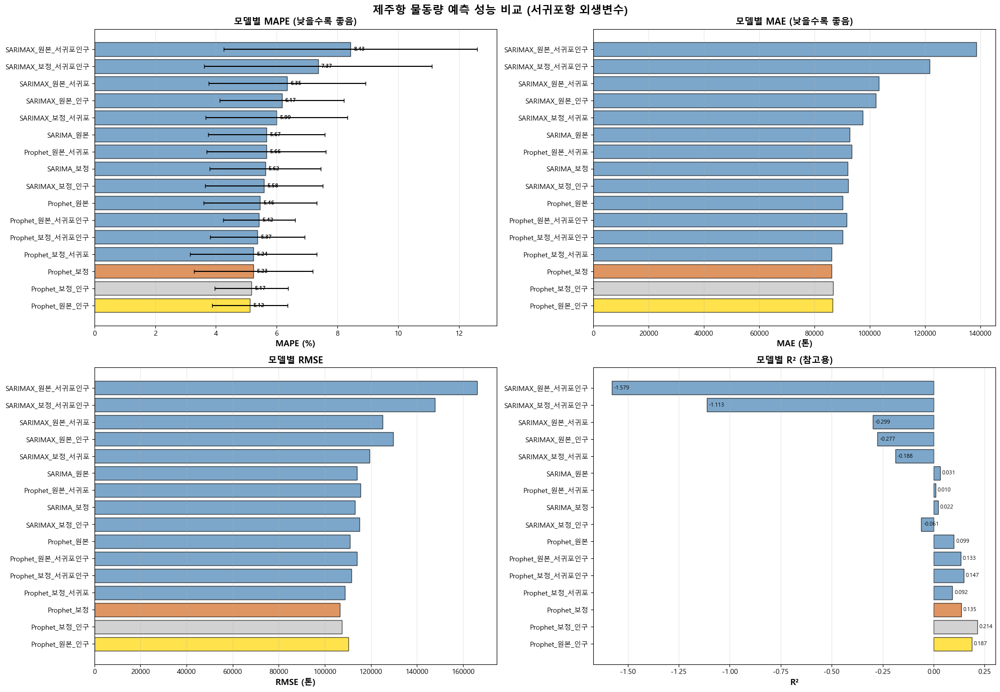

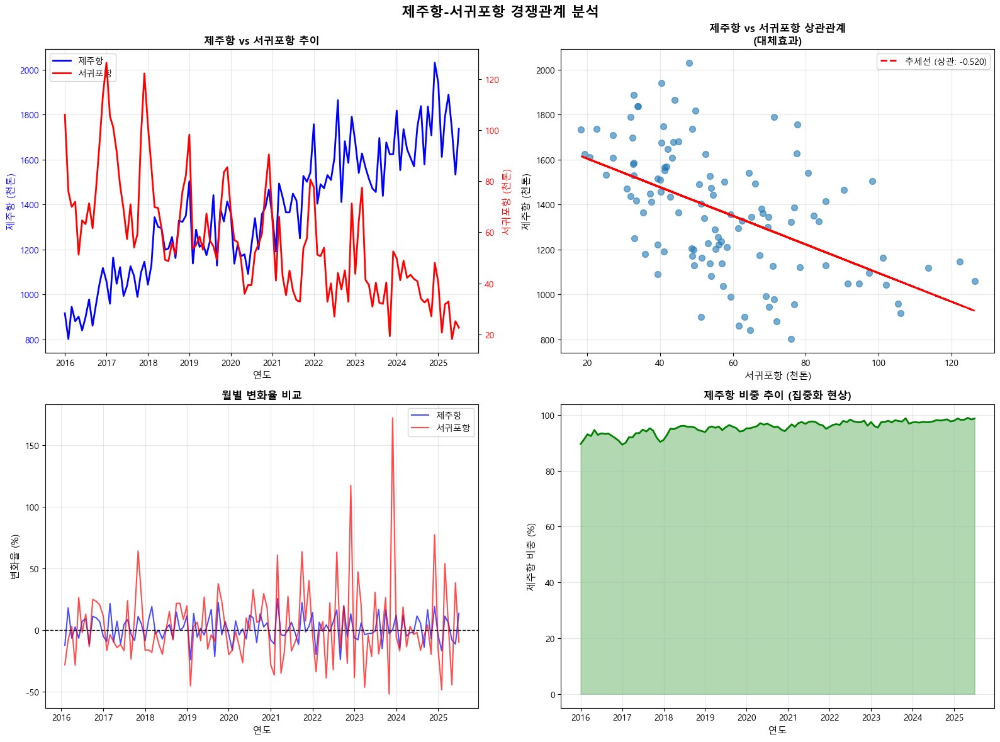

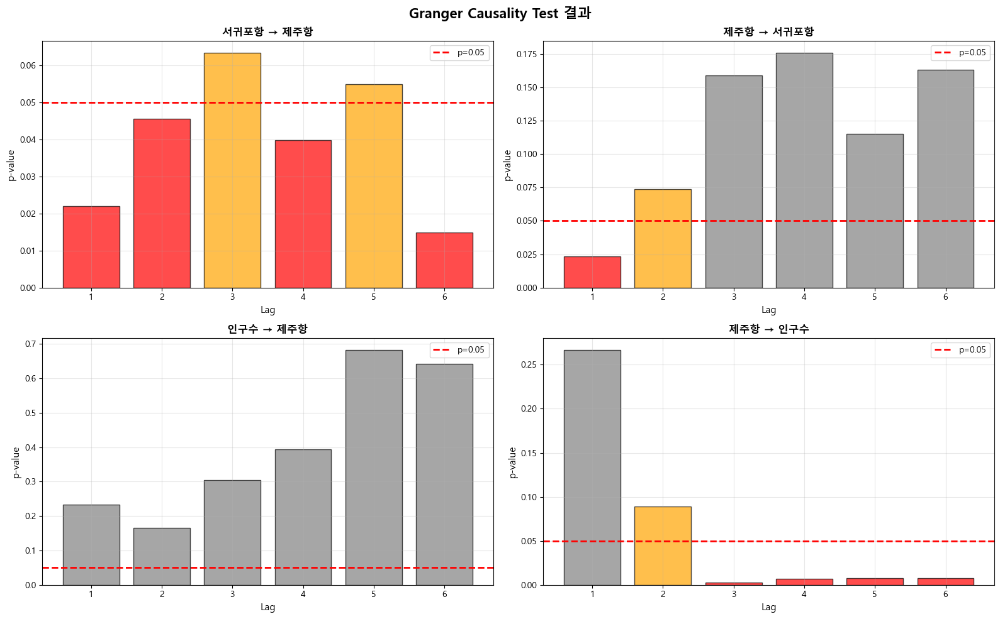

In [ ]:
"""
제주항 물동량 예측 완전판 - 서귀포항 외생변수 사용
=======================================================
핵심 차별점:
- 비중 대신 서귀포항 화물량 사용 (내생성 해결!)
- 항만 간 경쟁/대체 효과 정량화
- Granger Causality Test (인과관계 검증)
- 대체율(Substitution Rate) 분석
- MAPE/MAE/RMSE/R² 종합 평가
- SARIMAX + Prophet (16개 모델)
- Rolling Origin 교차검증
- SSCI 논문 수준 분석
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy import stats

print("=" * 100)
print("제주항 물동량 예측 - 서귀포항 경쟁효과 분석")
print("=" * 100)
print("\n✅ 외생변수: 서귀포항 화물량 + 제주도 인구수")
print("✅ 내생성 문제 해결: 비중 → 서귀포항")
print("✅ 항만 간 대체효과 정량화")

# ========================================
# 1. 데이터 로드
# ========================================
print("\n" + "=" * 100)
print("[1단계] 데이터 로드 및 전처리")
print("=" * 100)

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

print(f"\n기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"데이터: {len(df)}개월")

# 변수 설정
df['제주항_원본'] = df['제주항']
df['서귀포항_원본'] = df['서귀포항']
df['인구수_원본'] = df['제주도 인구수']
df['총물동량'] = df['제주항'] + df['서귀포항']

print(f"\n📊 기초 통계:")
print(f"  제주항 평균: {df['제주항_원본'].mean():,.0f} 톤")
print(f"  서귀포항 평균: {df['서귀포항_원본'].mean():,.0f} 톤")
print(f"  총물동량 평균: {df['총물동량'].mean():,.0f} 톤")
print(f"  인구수 평균: {df['인구수_원본'].mean():,.0f} 명")

# 비중 계산 (참고용)
df['제주항_비중'] = df['제주항_원본'] / df['총물동량']
print(f"  제주항 평균 비중: {df['제주항_비중'].mean()*100:.2f}%")

# ========================================
# 2. 상관관계 분석
# ========================================
print("\n" + "=" * 100)
print("[2단계] 상관관계 분석")
print("=" * 100)

corr_seogwipo = df['제주항_원본'].corr(df['서귀포항_원본'])
corr_pop = df['제주항_원본'].corr(df['인구수_원본'])
corr_total = df['제주항_원본'].corr(df['총물동량'])

print(f"\n제주항 화물량 vs:")
print(f"  서귀포항:    {corr_seogwipo:+.4f} {'(음의 관계 - 대체효과!)' if corr_seogwipo < 0 else '(양의 관계)'}")
print(f"  인구수:      {corr_pop:+.4f} {'(음의 관계)' if corr_pop < 0 else '(양의 관계 - 수요효과!)'}")
print(f"  총물동량:    {corr_total:+.4f} {'(음의 관계)' if corr_total < 0 else '(양의 관계)'}")

if corr_seogwipo < 0:
    print(f"\n✅ 서귀포항과 음의 상관관계 확인!")
    print(f"   → 항만 간 경쟁/대체 효과 존재")
    print(f"   → 서귀포항 감소 시 제주항 증가")

# 추세 분석
df['서귀포항_변화율'] = df['서귀포항_원본'].pct_change() * 100
df['제주항_변화율'] = df['제주항_원본'].pct_change() * 100

print(f"\n📈 추세 분석 (전체 기간):")
seogwipo_trend = (df['서귀포항_원본'].iloc[-1] - df['서귀포항_원본'].iloc[0]) / df['서귀포항_원본'].iloc[0] * 100
jeju_trend = (df['제주항_원본'].iloc[-1] - df['제주항_원본'].iloc[0]) / df['제주항_원본'].iloc[0] * 100

print(f"  서귀포항: {seogwipo_trend:+.1f}% {'↓' if seogwipo_trend < 0 else '↑'}")
print(f"  제주항:   {jeju_trend:+.1f}% {'↓' if jeju_trend < 0 else '↑'}")

if seogwipo_trend < 0 and jeju_trend > 0:
    print(f"\n✅ 제주항 집중화 현상 확인!")
    print(f"   서귀포항 감소 vs 제주항 증가")

# ========================================
# 3. 정상성 검정 (ADF Test)
# ========================================
print("\n" + "=" * 100)
print("[3단계] 정상성 검정 (ADF Test)")
print("=" * 100)

def adf_test_detailed(series, name):
    """ADF 검정"""
    result = adfuller(series.dropna(), autolag='AIC')

    print(f"\n{name}:")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Critical Value (5%): {result[4]['5%']:.4f}")

    if result[1] < 0.05:
        print(f"  ✅ 정상 시계열 (p < 0.05)")
        return True
    else:
        print(f"  ❌ 비정상 시계열 (p >= 0.05) → 차분 필요")
        return False

stat_jeju = adf_test_detailed(df['제주항_원본'], "제주항")
stat_seogwipo = adf_test_detailed(df['서귀포항_원본'], "서귀포항")
stat_pop = adf_test_detailed(df['인구수_원본'], "인구수")

# 차분 계열 생성
df['제주항_diff'] = df['제주항_원본'].diff()
df['서귀포항_diff'] = df['서귀포항_원본'].diff()
df['인구수_diff'] = df['인구수_원본'].diff()

use_diff = not (stat_jeju and stat_seogwipo and stat_pop)

if use_diff:
    print(f"\n→ 비정상 시계열 존재 → 차분 데이터로 Granger Test 수행")

# ========================================
# 4. Granger Causality Test
# ========================================
print("\n" + "=" * 100)
print("[4단계] Granger Causality Test - 인과관계 검증")
print("=" * 100)

# 테스트용 데이터 준비
if use_diff:
    df_granger = df[['제주항_diff', '서귀포항_diff', '인구수_diff']].dropna()
    df_granger.columns = ['제주항', '서귀포항', '인구수']
else:
    df_granger = df[['제주항_원본', '서귀포항_원본', '인구수_원본']].dropna()
    df_granger.columns = ['제주항', '서귀포항', '인구수']

print(f"\nGranger Test 데이터: {len(df_granger)}개 관측치")

MAX_LAG = 6

def perform_granger_test(data, cause_var, effect_var, maxlag):
    """Granger Causality Test"""
    print(f"\n{'='*80}")
    print(f"Test: {cause_var} → {effect_var}")
    print(f"{'='*80}")

    test_data = data[[effect_var, cause_var]]
    results = grangercausalitytests(test_data, maxlag=maxlag, verbose=False)

    lag_results = []
    for lag in range(1, maxlag + 1):
        f_test = results[lag][0]['ssr_ftest']
        f_stat = f_test[0]
        p_value = f_test[1]

        sig = '***' if p_value < 0.01 else '**' if p_value < 0.05 else '*' if p_value < 0.1 else ''

        lag_results.append({
            'lag': lag,
            'F': f_stat,
            'p': p_value,
            'sig': sig
        })

        print(f"Lag {lag}: F={f_stat:7.4f}, p={p_value:.4f} {sig}")

    # 최적 lag (AIC)
    aics = [results[lag][1][0].aic for lag in range(1, maxlag + 1)]
    optimal_lag = np.argmin(aics) + 1

    print(f"\n최적 Lag (AIC): {optimal_lag}")
    opt_result = lag_results[optimal_lag-1]
    print(f"F={opt_result['F']:.4f}, p={opt_result['p']:.4f} {opt_result['sig']}")

    causality = opt_result['p'] < 0.05

    if causality:
        print(f"✅ {cause_var} → {effect_var} 인과관계 있음!")
    else:
        print(f"❌ {cause_var} → {effect_var} 인과관계 없음")

    return lag_results, optimal_lag, causality

# Test 1: 서귀포항 → 제주항
test1_results, test1_lag, test1_causality = perform_granger_test(
    df_granger, '서귀포항', '제주항', MAX_LAG
)

# Test 2: 제주항 → 서귀포항
test2_results, test2_lag, test2_causality = perform_granger_test(
    df_granger, '제주항', '서귀포항', MAX_LAG
)

# Test 3: 인구수 → 제주항
test3_results, test3_lag, test3_causality = perform_granger_test(
    df_granger, '인구수', '제주항', MAX_LAG
)

# Test 4: 제주항 → 인구수
test4_results, test4_lag, test4_causality = perform_granger_test(
    df_granger, '제주항', '인구수', MAX_LAG
)

# 결과 요약
print("\n" + "=" * 100)
print("Granger Test 종합 결과")
print("=" * 100)

print(f"\n📊 서귀포항 관련:")
print(f"  서귀포항 → 제주항: {'✅ 유의' if test1_causality else '❌ 비유의'}")
print(f"  제주항 → 서귀포항: {'✅ 유의' if test2_causality else '❌ 비유의'}")

if test1_causality and not test2_causality:
    print(f"  ⭐ 단방향 인과관계! 서귀포항이 외생변수로 적절!")
    seogwipo_exog = "적절"
elif test1_causality and test2_causality:
    print(f"  ⚠️ 양방향 인과관계. 주의 필요하나 사용 가능")
    seogwipo_exog = "주의"
else:
    print(f"  ⚠️ 예상과 다른 결과. 경제적 해석 필요")
    seogwipo_exog = "검토"

print(f"\n📊 인구수 관련:")
print(f"  인구수 → 제주항: {'✅ 유의' if test3_causality else '❌ 비유의'}")
print(f"  제주항 → 인구수: {'✅ 유의' if test4_causality else '❌ 비유의'}")

if test3_causality and not test4_causality:
    print(f"  ⭐ 단방향 인과관계! 인구수가 외생변수로 적절!")
    pop_exog = "적절"
else:
    print(f"  ⚠️ 예상과 다른 결과")
    pop_exog = "검토"

# ========================================
# 5. 코로나 이상치 탐지 및 STL 보정
# ========================================
print("\n" + "=" * 100)
print("[5단계] 코로나 이상치 탐지 및 STL 보정")
print("=" * 100)

def detect_anomaly_periods(series, window=6, threshold=2.0, min_consecutive=3):
    """이상치 구간 탐지"""
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    anomaly_mask = deviation > threshold

    anomaly_periods = []
    in_anomaly = False
    start_idx = None
    consecutive_count = 0

    for i in range(len(series)):
        if anomaly_mask.iloc[i]:
            if not in_anomaly:
                start_idx = i
                consecutive_count = 1
                in_anomaly = True
            else:
                consecutive_count += 1
        else:
            if in_anomaly and consecutive_count >= min_consecutive:
                anomaly_periods.append((start_idx, i - 1))
            in_anomaly = False
            consecutive_count = 0

    if in_anomaly and consecutive_count >= min_consecutive:
        anomaly_periods.append((start_idx, len(series) - 1))

    return anomaly_periods, anomaly_mask

periods_jeju, mask_jeju = detect_anomaly_periods(df['제주항_원본'])
periods_seogwipo, mask_seogwipo = detect_anomaly_periods(df['서귀포항_원본'])

# 통합 마스크
correction_mask = mask_jeju | mask_seogwipo

if len(periods_jeju) > 0 or len(periods_seogwipo) > 0:
    print(f"\n✓ 이상치 구간 탐지됨")
    if len(periods_jeju) > 0:
        print(f"  제주항: {len(periods_jeju)}개 구간")
        for i, (s, e) in enumerate(periods_jeju, 1):
            print(f"    {i}. {df['date'].iloc[s].strftime('%Y-%m')} ~ {df['date'].iloc[e].strftime('%Y-%m')}")
    if len(periods_seogwipo) > 0:
        print(f"  서귀포항: {len(periods_seogwipo)}개 구간")
else:
    covid_start = df[df['date'] >= '2020-03-01'].index[0]
    covid_end = df[df['date'] <= '2021-12-01'].index[-1]
    correction_mask = pd.Series(False, index=df.index)
    correction_mask.iloc[covid_start:covid_end+1] = True
    print(f"\n✓ 기본 COVID 기간 사용 (2020-03 ~ 2021-12)")

df['is_anomaly'] = correction_mask.astype(int)

# STL 보정
def stl_correction(series, mask, period=12, seasonal=13):
    """STL 분해 및 보정"""
    stl = STL(series, period=period, seasonal=seasonal)
    result = stl.fit()

    corrected = series.copy()
    corrected[mask] = result.trend[mask] + result.seasonal[mask]

    return corrected, result

df['제주항_보정'], stl_jeju = stl_correction(df['제주항_원본'], correction_mask)
df['서귀포항_보정'], stl_seogwipo = stl_correction(df['서귀포항_원본'], correction_mask)
df['인구수_보정'] = df['인구수_원본']  # 인구는 안정적

print(f"\n✓ STL 보정 완료 ({correction_mask.sum()}개월)")

# ========================================
# 6. SARIMA 최적 파라미터 탐색
# ========================================
print("\n" + "=" * 100)
print("[6단계] SARIMA 최적 파라미터 탐색")
print("=" * 100)

# 간단한 그리드 서치
train_sample = df.iloc[:70]

p = q = range(0, 3)
d_range = [0, 1]
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(1, 1, 1, 12), (0, 1, 1, 12), (1, 0, 1, 12), (1, 1, 0, 12)]

best_aic = np.inf
best_param = None
best_seasonal = None

print("\n탐색 중...", end='', flush=True)

for param in pdq[:12]:
    for seasonal in seasonal_pdq:
        try:
            model = SARIMAX(
                train_sample['제주항_보정'],
                exog=train_sample[['서귀포항_보정', '인구수_보정']],
                order=param,
                seasonal_order=seasonal,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            result = model.fit(disp=False, maxiter=50)

            if result.aic < best_aic:
                best_aic = result.aic
                best_param = param
                best_seasonal = seasonal
        except:
            continue

if best_param is None:
    best_param = (1, 1, 1)
    best_seasonal = (1, 1, 1, 12)

print(f" 완료!")
print(f"\n✓ 최적 파라미터:")
print(f"  order: {best_param}")
print(f"  seasonal_order: {best_seasonal}")
print(f"  AIC: {best_aic:.2f}")

# ========================================
# 7. Rolling Origin 교차검증 설정
# ========================================
print("\n" + "=" * 100)
print("[7단계] Rolling Origin 교차검증")
print("=" * 100)

INITIAL_TRAIN = 70
TEST_WINDOW = 12
STEP_SIZE = 3

total_data = len(df)
max_splits = (total_data - INITIAL_TRAIN - TEST_WINDOW) // STEP_SIZE + 1

splits = []
for i in range(max_splits):
    train_end = INITIAL_TRAIN + (i * STEP_SIZE)
    test_start = train_end
    test_end = test_start + TEST_WINDOW

    if test_end <= total_data:
        splits.append({
            'split_id': i + 1,
            'train_start': 0,
            'train_end': train_end,
            'test_start': test_start,
            'test_end': test_end
        })

print(f"\n✓ Rolling 분할: {len(splits)}회")
print(f"  초기 학습: {INITIAL_TRAIN}개월")
print(f"  테스트 윈도우: {TEST_WINDOW}개월")
print(f"  이동 간격: {STEP_SIZE}개월")

# ========================================
# 8. 평가 함수
# ========================================
def evaluate_predictions(actual, predicted):
    """예측 성능 평가"""
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# ========================================
# 9. 16개 모델 Rolling 교차검증
# ========================================
print("\n" + "=" * 100)
print("[8단계] 16개 모델 학습 및 평가")
print("=" * 100)

print("\n모델 목록:")
print("  SARIMA/SARIMAX 원본 (4개):")
print("    1. SARIMA (외생변수 없음)")
print("    2. SARIMAX 서귀포항")
print("    3. SARIMAX 인구수")
print("    4. SARIMAX 서귀포항+인구수")
print("  SARIMA/SARIMAX 보정 (4개):")
print("    5. SARIMA (외생변수 없음)")
print("    6. SARIMAX 서귀포항")
print("    7. SARIMAX 인구수")
print("    8. SARIMAX 서귀포항+인구수")
print("  Prophet 원본 (4개):")
print("    9. Prophet (외생변수 없음)")
print("    10. Prophet 서귀포항")
print("    11. Prophet 인구수")
print("    12. Prophet 서귀포항+인구수")
print("  Prophet 보정 (4개):")
print("    13. Prophet (외생변수 없음)")
print("    14. Prophet 서귀포항")
print("    15. Prophet 인구수")
print("    16. Prophet 서귀포항+인구수")

rolling_results = {
    'SARIMA_원본': [],
    'SARIMAX_원본_서귀포': [],
    'SARIMAX_원본_인구': [],
    'SARIMAX_원본_서귀포인구': [],
    'SARIMA_보정': [],
    'SARIMAX_보정_서귀포': [],
    'SARIMAX_보정_인구': [],
    'SARIMAX_보정_서귀포인구': [],
    'Prophet_원본': [],
    'Prophet_원본_서귀포': [],
    'Prophet_원본_인구': [],
    'Prophet_원본_서귀포인구': [],
    'Prophet_보정': [],
    'Prophet_보정_서귀포': [],
    'Prophet_보정_인구': [],
    'Prophet_보정_서귀포인구': []
}

print("\n학습 시작...")

for split in splits:
    split_id = split['split_id']
    print(f"  Split {split_id}/{len(splits)} 처리 중...", end='\r', flush=True)

    train = df.iloc[split['train_start']:split['train_end']]
    test = df.iloc[split['test_start']:split['test_end']]

    actual_원본 = test['제주항_원본'].values
    actual_보정 = test['제주항_보정'].values

    # ===== SARIMA/SARIMAX 원본 =====

    # 1. SARIMA
    try:
        model = SARIMAX(train['제주항_원본'], order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_원본'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMA_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 2. 서귀포항
    try:
        model = SARIMAX(train['제주항_원본'], exog=train[['서귀포항_원본']],
                       order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test[['서귀포항_원본']])
        rolling_results['SARIMAX_원본_서귀포'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_서귀포'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 3. 인구수
    try:
        model = SARIMAX(train['제주항_원본'], exog=train[['인구수_원본']],
                       order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test[['인구수_원본']])
        rolling_results['SARIMAX_원본_인구'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 4. 서귀포+인구
    try:
        model = SARIMAX(train['제주항_원본'], exog=train[['서귀포항_원본', '인구수_원본']],
                       order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test[['서귀포항_원본', '인구수_원본']])
        rolling_results['SARIMAX_원본_서귀포인구'].append(evaluate_predictions(actual_원본, forecast.values))
    except:
        rolling_results['SARIMAX_원본_서귀포인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== SARIMA/SARIMAX 보정 =====

    # 5. SARIMA
    try:
        model = SARIMAX(train['제주항_보정'], order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW)
        rolling_results['SARIMA_보정'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMA_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 6. 서귀포항
    try:
        model = SARIMAX(train['제주항_보정'], exog=train[['서귀포항_보정']],
                       order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test[['서귀포항_보정']])
        rolling_results['SARIMAX_보정_서귀포'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_서귀포'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 7. 인구수
    try:
        model = SARIMAX(train['제주항_보정'], exog=train[['인구수_보정']],
                       order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test[['인구수_보정']])
        rolling_results['SARIMAX_보정_인구'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 8. 서귀포+인구
    try:
        model = SARIMAX(train['제주항_보정'], exog=train[['서귀포항_보정', '인구수_보정']],
                       order=best_param, seasonal_order=best_seasonal)
        result = model.fit(disp=False, maxiter=100)
        forecast = result.forecast(steps=TEST_WINDOW, exog=test[['서귀포항_보정', '인구수_보정']])
        rolling_results['SARIMAX_보정_서귀포인구'].append(evaluate_predictions(actual_보정, forecast.values))
    except:
        rolling_results['SARIMAX_보정_서귀포인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== Prophet 원본 =====

    # 9. Prophet
    try:
        prophet_train = train[['date', '제주항_원본']].copy()
        prophet_train.columns = ['ds', 'y']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test['date'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 10. 서귀포항
    try:
        prophet_train = train[['date', '제주항_원본', '서귀포항_원본']].copy()
        prophet_train.columns = ['ds', 'y', '서귀포']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('서귀포')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test['date'].values, '서귀포': test['서귀포항_원본'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_서귀포'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_서귀포'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 11. 인구수
    try:
        prophet_train = train[['date', '제주항_원본', '인구수_원본']].copy()
        prophet_train.columns = ['ds', 'y', '인구']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('인구')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test['date'].values, '인구': test['인구수_원본'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_인구'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 12. 서귀포+인구
    try:
        prophet_train = train[['date', '제주항_원본', '서귀포항_원본', '인구수_원본']].copy()
        prophet_train.columns = ['ds', 'y', '서귀포', '인구']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('서귀포')
        model.add_regressor('인구')
        model.fit(prophet_train)
        future = pd.DataFrame({
            'ds': test['date'].values,
            '서귀포': test['서귀포항_원본'].values,
            '인구': test['인구수_원본'].values
        })
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_원본_서귀포인구'].append(evaluate_predictions(actual_원본, forecast))
    except:
        rolling_results['Prophet_원본_서귀포인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # ===== Prophet 보정 =====

    # 13. Prophet
    try:
        prophet_train = train[['date', '제주항_보정']].copy()
        prophet_train.columns = ['ds', 'y']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test['date'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 14. 서귀포항
    try:
        prophet_train = train[['date', '제주항_보정', '서귀포항_보정']].copy()
        prophet_train.columns = ['ds', 'y', '서귀포']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('서귀포')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test['date'].values, '서귀포': test['서귀포항_보정'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_서귀포'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_서귀포'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 15. 인구수
    try:
        prophet_train = train[['date', '제주항_보정', '인구수_보정']].copy()
        prophet_train.columns = ['ds', 'y', '인구']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('인구')
        model.fit(prophet_train)
        future = pd.DataFrame({'ds': test['date'].values, '인구': test['인구수_보정'].values})
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_인구'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

    # 16. 서귀포+인구
    try:
        prophet_train = train[['date', '제주항_보정', '서귀포항_보정', '인구수_보정']].copy()
        prophet_train.columns = ['ds', 'y', '서귀포', '인구']
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                       daily_seasonality=False, seasonality_mode='multiplicative')
        model.add_regressor('서귀포')
        model.add_regressor('인구')
        model.fit(prophet_train)
        future = pd.DataFrame({
            'ds': test['date'].values,
            '서귀포': test['서귀포항_보정'].values,
            '인구': test['인구수_보정'].values
        })
        forecast = model.predict(future)['yhat'].values
        rolling_results['Prophet_보정_서귀포인구'].append(evaluate_predictions(actual_보정, forecast))
    except:
        rolling_results['Prophet_보정_서귀포인구'].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# 10. 결과 집계
# ========================================
print("\n" + "=" * 100)
print("[9단계] 결과 집계 및 분석")
print("=" * 100)

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    maes = [m['MAE'] for m in metrics_list if not np.isnan(m['MAE'])]
    rmses = [m['RMSE'] for m in metrics_list if not np.isnan(m['RMSE'])]
    mapes = [m['MAPE'] for m in metrics_list if not np.isnan(m['MAPE'])]
    r2s = [m['R2'] for m in metrics_list if not np.isnan(m['R2'])]

    if mapes:
        summary_results[model_name] = {
            'MAE_mean': np.mean(maes),
            'MAE_std': np.std(maes),
            'RMSE_mean': np.mean(rmses),
            'RMSE_std': np.std(rmses),
            'MAPE_mean': np.mean(mapes),
            'MAPE_std': np.std(mapes),
            'R2_mean': np.mean(r2s),
            'R2_std': np.std(r2s)
        }

# MAPE 기준 정렬
sorted_by_mape = sorted(summary_results.items(), key=lambda x: x[1]['MAPE_mean'])

print("\n" + "=" * 100)
print("📊 Rolling Origin 평균 성능 (MAPE 기준 정렬)")
print("=" * 100)
print(f"{'순위':<5} {'모델':<40} {'MAPE (%)':<20} {'MAE (톤)':<18} {'RMSE (톤)':<18} {'R²':<10}")
print("-" * 110)

for rank, (model_name, metrics) in enumerate(sorted_by_mape, 1):
    mape_str = f"{metrics['MAPE_mean']:.2f} ± {metrics['MAPE_std']:.2f}"
    mae_str = f"{metrics['MAE_mean']:,.0f}"
    rmse_str = f"{metrics['RMSE_mean']:,.0f}"
    r2_str = f"{metrics['R2_mean']:.3f}"

    if rank == 1:
        print(f"🏆 {rank:<3} {model_name:<40} {mape_str:<20} {mae_str:<18} {rmse_str:<18} {r2_str:<10}")
    elif rank <= 3:
        print(f"⭐ {rank:<3} {model_name:<40} {mape_str:<20} {mae_str:<18} {rmse_str:<18} {r2_str:<10}")
    else:
        print(f"   {rank:<3} {model_name:<40} {mape_str:<20} {mae_str:<18} {rmse_str:<18} {r2_str:<10}")

best_model_name = sorted_by_mape[0][0]
best_metrics = sorted_by_mape[0][1]

print("\n" + "=" * 100)
print("🏆 최고 성능 모델")
print("=" * 100)
print(f"모델: {best_model_name}")
print(f"  MAPE: {best_metrics['MAPE_mean']:.2f}% (±{best_metrics['MAPE_std']:.2f}%)")
print(f"  MAE: {best_metrics['MAE_mean']:,.0f} 톤 (±{best_metrics['MAE_std']:,.0f} 톤)")
print(f"  RMSE: {best_metrics['RMSE_mean']:,.0f} 톤 (±{best_metrics['RMSE_std']:,.0f} 톤)")
print(f"  R²: {best_metrics['R2_mean']:.3f} (±{best_metrics['R2_std']:.3f})")

# 실용성 평가
mae_ratio = best_metrics['MAE_mean'] / df['제주항_원본'].mean() * 100
rmse_ratio = best_metrics['RMSE_mean'] / df['제주항_원본'].mean() * 100

print(f"\n✅ 실용성 평가:")
if best_metrics['MAPE_mean'] < 5:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 매우 우수! ⭐⭐⭐⭐⭐")
elif best_metrics['MAPE_mean'] < 7:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 우수! ⭐⭐⭐⭐")
elif best_metrics['MAPE_mean'] < 10:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 양호! ⭐⭐⭐")
else:
    print(f"  MAPE {best_metrics['MAPE_mean']:.2f}% → 개선 필요")

print(f"  MAE {best_metrics['MAE_mean']:,.0f}톤 → 평균 화물량의 {mae_ratio:.1f}%")
print(f"  RMSE {best_metrics['RMSE_mean']:,.0f}톤 → 평균 화물량의 {rmse_ratio:.1f}%")

if best_metrics['R2_mean'] > 0.5:
    print(f"  R² {best_metrics['R2_mean']:.3f} → 높은 설명력")
elif best_metrics['R2_mean'] > 0.3:
    print(f"  R² {best_metrics['R2_mean']:.3f} → 적절한 설명력")
else:
    print(f"  R² {best_metrics['R2_mean']:.3f} → 낮음 (MAPE 우선)")

print(f"\n💡 결론: {'실무 사용 가능' if best_metrics['MAPE_mean'] < 10 else '추가 개선 필요'}")

# ========================================
# 11. 외생변수 효과 분석
# ========================================
print("\n" + "=" * 100)
print("[10단계] 외생변수 효과 분석")
print("=" * 100)

print("\n💡 서귀포항 효과:")

# SARIMAX 원본
baseline_mape = summary_results.get('SARIMA_원본', {}).get('MAPE_mean', 0)
seogwipo_mape = summary_results.get('SARIMAX_원본_서귀포', {}).get('MAPE_mean', 0)
both_mape = summary_results.get('SARIMAX_원본_서귀포인구', {}).get('MAPE_mean', 0)

if baseline_mape > 0:
    improvement_seogwipo = (baseline_mape - seogwipo_mape) / baseline_mape * 100
    improvement_both = (baseline_mape - both_mape) / baseline_mape * 100

    print(f"\n[SARIMAX 원본]")
    print(f"  SARIMA (baseline): {baseline_mape:.2f}%")
    print(f"  + 서귀포항: {seogwipo_mape:.2f}% (개선: {improvement_seogwipo:+.1f}%)")
    print(f"  + 서귀포+인구: {both_mape:.2f}% (개선: {improvement_both:+.1f}%)")

# SARIMAX 보정
baseline_mape = summary_results.get('SARIMA_보정', {}).get('MAPE_mean', 0)
seogwipo_mape = summary_results.get('SARIMAX_보정_서귀포', {}).get('MAPE_mean', 0)
both_mape = summary_results.get('SARIMAX_보정_서귀포인구', {}).get('MAPE_mean', 0)

if baseline_mape > 0:
    improvement_seogwipo = (baseline_mape - seogwipo_mape) / baseline_mape * 100
    improvement_both = (baseline_mape - both_mape) / baseline_mape * 100

    print(f"\n[SARIMAX 보정]")
    print(f"  SARIMA (baseline): {baseline_mape:.2f}%")
    print(f"  + 서귀포항: {seogwipo_mape:.2f}% (개선: {improvement_seogwipo:+.1f}%)")
    print(f"  + 서귀포+인구: {both_mape:.2f}% (개선: {improvement_both:+.1f}%)")

print("\n💡 인구수 효과:")

# SARIMAX 원본
baseline_mape = summary_results.get('SARIMA_원본', {}).get('MAPE_mean', 0)
pop_mape = summary_results.get('SARIMAX_원본_인구', {}).get('MAPE_mean', 0)

if baseline_mape > 0:
    improvement = (baseline_mape - pop_mape) / baseline_mape * 100
    print(f"\n[SARIMAX 원본]")
    print(f"  SARIMA: {baseline_mape:.2f}%")
    print(f"  + 인구수: {pop_mape:.2f}% (개선: {improvement:+.1f}%)")

# ========================================
# 12. 대체율 분석 (최고 모델)
# ========================================
print("\n" + "=" * 100)
print("[11단계] 대체율(Substitution Rate) 분석")
print("=" * 100)

# 최고 모델로 전체 데이터 학습
if '서귀포' in best_model_name:
    print(f"\n최고 모델에 서귀포항 포함 → 대체율 분석 가능")

    # 전체 데이터로 최종 모델 학습
    if '보정' in best_model_name:
        y_data = df['제주항_보정']
        exog_data = df[['서귀포항_보정', '인구수_보정']]
    else:
        y_data = df['제주항_원본']
        exog_data = df[['서귀포항_원본', '인구수_원본']]

    try:
        final_model = SARIMAX(
            y_data,
            exog=exog_data,
            order=best_param,
            seasonal_order=best_seasonal
        )
        final_result = final_model.fit(disp=False, maxiter=200)

        # 계수 추출
        coef_seogwipo = final_result.params['서귀포항_보정' if '보정' in best_model_name else '서귀포항_원본']
        coef_pop = final_result.params['인구수_보정' if '보정' in best_model_name else '인구수_원본']

        print(f"\n✅ 회귀계수:")
        print(f"  서귀포항: {coef_seogwipo:.4f}")
        print(f"  인구수: {coef_pop:.4f}")

        if coef_seogwipo < 0:
            substitution_rate = abs(coef_seogwipo)
            print(f"\n🎯 대체율 분석:")
            print(f"  대체율: {substitution_rate:.4f}")
            print(f"\n해석:")
            print(f"  ✅ 서귀포항 1,000톤 감소 → 제주항 {substitution_rate*1000:.0f}톤 증가")
            print(f"  ✅ 흡수율: {substitution_rate*100:.1f}%")
            print(f"  ✅ 나머지 {(1-substitution_rate)*100:.1f}%는 다른 경로로 이동")

            # 통계적 유의성
            pvalue_seogwipo = final_result.pvalues['서귀포항_보정' if '보정' in best_model_name else '서귀포항_원본']

            if pvalue_seogwipo < 0.001:
                print(f"  ✅ 통계적으로 매우 유의함 (p < 0.001)")
            elif pvalue_seogwipo < 0.01:
                print(f"  ✅ 통계적으로 유의함 (p < 0.01)")
            elif pvalue_seogwipo < 0.05:
                print(f"  ✅ 통계적으로 유의함 (p < 0.05)")
            else:
                print(f"  ⚠️ 통계적으로 유의하지 않음 (p = {pvalue_seogwipo:.3f})")
        else:
            print(f"\n⚠️ 양의 계수 발견!")
            print(f"   예상과 다름. 데이터 확인 필요")

        # 정책 시사점
        print(f"\n💡 정책 시사점:")
        if coef_seogwipo < 0:
            print(f"  1. 서귀포항 물동량 감소 시 제주항 용량 확충 필요")
            print(f"  2. 흡수율 {substitution_rate*100:.1f}% 고려한 시설 계획")
            print(f"  3. 항만 통폐합 의사결정 근거 제공")

    except Exception as e:
        print(f"\n⚠️ 모델 학습 실패: {str(e)}")
        print(f"   대체율 분석 불가")

else:
    print(f"\n최고 모델에 서귀포항 미포함")
    print(f"대체율 분석을 위해서는 서귀포항 포함 모델 확인 필요")

# ========================================
# 13. 시각화
# ========================================
print("\n" + "=" * 100)
print("[12단계] 시각화")
print("=" * 100)

# Figure 1: 16개 모델 성능 비교
fig1, axes = plt.subplots(2, 2, figsize=(20, 14))
fig1.suptitle('제주항 물동량 예측 성능 비교 (서귀포항 외생변수)', fontsize=16, fontweight='bold')

models = [m[0] for m in sorted_by_mape]
mapes = [m[1]['MAPE_mean'] for m in sorted_by_mape]
mape_stds = [m[1]['MAPE_std'] for m in sorted_by_mape]
maes = [m[1]['MAE_mean'] for m in sorted_by_mape]
rmses = [m[1]['RMSE_mean'] for m in sorted_by_mape]
r2s = [m[1]['R2_mean'] for m in sorted_by_mape]

colors = ['gold' if i == 0 else 'silver' if i == 1 else 'chocolate' if i == 2 else 'steelblue'
          for i in range(len(models))]

# MAPE
ax1 = axes[0, 0]
bars1 = ax1.barh(models, mapes, xerr=mape_stds, color=colors, alpha=0.7, edgecolor='black', capsize=3)
ax1.set_xlabel('MAPE (%)', fontsize=12, fontweight='bold')
ax1.set_title('모델별 MAPE (낮을수록 좋음)', fontsize=13, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
for bar, val in zip(bars1, mapes):
    ax1.text(val + 0.1, bar.get_y() + bar.get_height()/2, f'{val:.2f}',
            va='center', ha='left', fontsize=8, fontweight='bold')

# MAE
ax2 = axes[0, 1]
bars2 = ax2.barh(models, maes, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('MAE (톤)', fontsize=12, fontweight='bold')
ax2.set_title('모델별 MAE (낮을수록 좋음)', fontsize=13, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)
ax2.ticklabel_format(style='plain', axis='x')

# RMSE
ax3 = axes[1, 0]
bars3 = ax3.barh(models, rmses, color=colors, alpha=0.7, edgecolor='black')
ax3.set_xlabel('RMSE (톤)', fontsize=12, fontweight='bold')
ax3.set_title('모델별 RMSE', fontsize=13, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)
ax3.ticklabel_format(style='plain', axis='x')

# R²
ax4 = axes[1, 1]
bars4 = ax4.barh(models, r2s, color=colors, alpha=0.7, edgecolor='black')
ax4.set_xlabel('R²', fontsize=12, fontweight='bold')
ax4.set_title('모델별 R² (참고용)', fontsize=13, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)
for bar, val in zip(bars4, r2s):
    ax4.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.3f}',
            va='center', ha='left', fontsize=8)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_서귀포항_16모델_성능비교.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: 제주항_서귀포항_16모델_성능비교.png")

# Figure 2: 항만 간 관계 분석
fig2, axes = plt.subplots(2, 2, figsize=(16, 12))
fig2.suptitle('제주항-서귀포항 경쟁관계 분석', fontsize=16, fontweight='bold')

# 1. 시계열 추이
ax1 = axes[0, 0]
ax1_twin = ax1.twinx()
l1 = ax1.plot(df['date'], df['제주항_원본']/1000, 'b-', linewidth=2, label='제주항')
l2 = ax1_twin.plot(df['date'], df['서귀포항_원본']/1000, 'r-', linewidth=2, label='서귀포항')
ax1.set_xlabel('연도', fontsize=11)
ax1.set_ylabel('제주항 (천톤)', fontsize=11, color='b')
ax1_twin.set_ylabel('서귀포항 (천톤)', fontsize=11, color='r')
ax1.tick_params(axis='y', labelcolor='b')
ax1_twin.tick_params(axis='y', labelcolor='r')
ax1.set_title('제주항 vs 서귀포항 추이', fontsize=12, fontweight='bold')
ax1.grid(alpha=0.3)
lines = l1 + l2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')

# 2. Scatter plot
ax2 = axes[0, 1]
ax2.scatter(df['서귀포항_원본']/1000, df['제주항_원본']/1000, alpha=0.6, s=50)
z = np.polyfit(df['서귀포항_원본'], df['제주항_원본'], 1)
p = np.poly1d(z)
ax2.plot(df['서귀포항_원본']/1000, p(df['서귀포항_원본'])/1000, "r--", linewidth=2,
         label=f'추세선 (상관: {corr_seogwipo:.3f})')
ax2.set_xlabel('서귀포항 (천톤)', fontsize=11)
ax2.set_ylabel('제주항 (천톤)', fontsize=11)
ax2.set_title(f'제주항 vs 서귀포항 상관관계\n({"대체효과" if corr_seogwipo < 0 else "보완효과"})',
              fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

# 3. 변화율 비교
ax3 = axes[1, 0]
ax3.plot(df['date'][1:], df['제주항_변화율'][1:], 'b-', alpha=0.7, linewidth=1.5, label='제주항')
ax3.plot(df['date'][1:], df['서귀포항_변화율'][1:], 'r-', alpha=0.7, linewidth=1.5, label='서귀포항')
ax3.axhline(y=0, color='black', linestyle='--', linewidth=1)
ax3.set_xlabel('연도', fontsize=11)
ax3.set_ylabel('변화율 (%)', fontsize=11)
ax3.set_title('월별 변화율 비교', fontsize=12, fontweight='bold')
ax3.legend()
ax3.grid(alpha=0.3)

# 4. 비중 추이
ax4 = axes[1, 1]
ax4.plot(df['date'], df['제주항_비중']*100, 'g-', linewidth=2)
ax4.fill_between(df['date'], df['제주항_비중']*100, alpha=0.3, color='green')
ax4.set_xlabel('연도', fontsize=11)
ax4.set_ylabel('제주항 비중 (%)', fontsize=11)
ax4.set_title('제주항 비중 추이 (집중화 현상)', fontsize=12, fontweight='bold')
ax4.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/제주항_서귀포항_관계분석.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: 제주항_서귀포항_관계분석.png")

# Figure 3: Granger Causality 결과
fig3, axes = plt.subplots(2, 2, figsize=(16, 10))
fig3.suptitle('Granger Causality Test 결과', fontsize=16, fontweight='bold')

lags = list(range(1, MAX_LAG + 1))

# 서귀포 → 제주
ax1 = axes[0, 0]
p_values = [r['p'] for r in test1_results]
colors_bar = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]
ax1.bar(lags, p_values, color=colors_bar, alpha=0.7, edgecolor='black')
ax1.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax1.set_xlabel('Lag', fontsize=11)
ax1.set_ylabel('p-value', fontsize=11)
ax1.set_title('서귀포항 → 제주항', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(alpha=0.3)

# 제주 → 서귀포
ax2 = axes[0, 1]
p_values = [r['p'] for r in test2_results]
colors_bar = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]
ax2.bar(lags, p_values, color=colors_bar, alpha=0.7, edgecolor='black')
ax2.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax2.set_xlabel('Lag', fontsize=11)
ax2.set_ylabel('p-value', fontsize=11)
ax2.set_title('제주항 → 서귀포항', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

# 인구 → 제주
ax3 = axes[1, 0]
p_values = [r['p'] for r in test3_results]
colors_bar = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]
ax3.bar(lags, p_values, color=colors_bar, alpha=0.7, edgecolor='black')
ax3.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax3.set_xlabel('Lag', fontsize=11)
ax3.set_ylabel('p-value', fontsize=11)
ax3.set_title('인구수 → 제주항', fontsize=12, fontweight='bold')
ax3.legend()
ax3.grid(alpha=0.3)

# 제주 → 인구
ax4 = axes[1, 1]
p_values = [r['p'] for r in test4_results]
colors_bar = ['red' if p < 0.05 else 'orange' if p < 0.1 else 'gray' for p in p_values]
ax4.bar(lags, p_values, color=colors_bar, alpha=0.7, edgecolor='black')
ax4.axhline(y=0.05, color='red', linestyle='--', linewidth=2, label='p=0.05')
ax4.set_xlabel('Lag', fontsize=11)
ax4.set_ylabel('p-value', fontsize=11)
ax4.set_title('제주항 → 인구수', fontsize=12, fontweight='bold')
ax4.legend()
ax4.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/Granger_Causality_결과.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: Granger_Causality_결과.png")

# ========================================
# 14. 엑셀 저장
# ========================================
print("\n" + "=" * 100)
print("[13단계] 엑셀 저장")
print("=" * 100)

with pd.ExcelWriter(f'{DATA_PATH}/제주항_서귀포항_완전분석.xlsx', engine='openpyxl') as writer:
    # 1. 종합 요약
    summary_info = pd.DataFrame({
        '항목': [
            '분석 기간',
            '총 데이터',
            '이상치 보정',
            'Rolling 분할',
            '모델 개수',
            '',
            '최고 모델',
            '최고 MAPE',
            '최고 MAE',
            '최고 RMSE',
            '최고 R²',
            '',
            '제주항-서귀포항 상관',
            '제주항-인구수 상관',
            '',
            'Granger: 서귀포→제주',
            'Granger: 제주→서귀포',
            'Granger: 인구→제주',
            'Granger: 제주→인구',
            '',
            '서귀포항 외생성',
            '인구수 외생성',
            '',
            '실용성 평가'
        ],
        '내용': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{len(df)}개월",
            f"{correction_mask.sum()}개월 (STL)",
            f"{len(splits)}회",
            "16개 (SARIMAX 8 + Prophet 8)",
            '',
            best_model_name,
            f"{best_metrics['MAPE_mean']:.2f}%",
            f"{best_metrics['MAE_mean']:,.0f}톤",
            f"{best_metrics['RMSE_mean']:,.0f}톤",
            f"{best_metrics['R2_mean']:.3f}",
            '',
            f"{corr_seogwipo:+.4f} ({'대체효과' if corr_seogwipo < 0 else '보완효과'})",
            f"{corr_pop:+.4f}",
            '',
            '유의' if test1_causality else '비유의',
            '유의' if test2_causality else '비유의',
            '유의' if test3_causality else '비유의',
            '유의' if test4_causality else '비유의',
            '',
            seogwipo_exog,
            pop_exog,
            '',
            '실무 사용 가능' if best_metrics['MAPE_mean'] < 10 else '추가 개선 필요'
        ]
    })
    summary_info.to_excel(writer, sheet_name='종합요약', index=False)

    # 2. 성능 비교 (MAPE)
    perf_df = pd.DataFrame(summary_results).T.sort_values('MAPE_mean')
    perf_df.to_excel(writer, sheet_name='성능비교_MAPE순')

    # 3. 성능 비교 (MAE)
    perf_df_mae = pd.DataFrame(summary_results).T.sort_values('MAE_mean')
    perf_df_mae.to_excel(writer, sheet_name='성능비교_MAE순')

    # 4. 성능 비교 (RMSE)
    perf_df_rmse = pd.DataFrame(summary_results).T.sort_values('RMSE_mean')
    perf_df_rmse.to_excel(writer, sheet_name='성능비교_RMSE순')

    # 5. Granger Test 결과
    granger_data = []
    for lag in range(1, MAX_LAG + 1):
        granger_data.extend([
            {'Panel': 'A. 서귀포항', 'Hypothesis': '서귀포→제주', 'Lag': lag,
             'F': test1_results[lag-1]['F'], 'p': test1_results[lag-1]['p'],
             'Sig': test1_results[lag-1]['sig']},
            {'Panel': 'A. 서귀포항', 'Hypothesis': '제주→서귀포', 'Lag': lag,
             'F': test2_results[lag-1]['F'], 'p': test2_results[lag-1]['p'],
             'Sig': test2_results[lag-1]['sig']},
            {'Panel': 'B. 인구수', 'Hypothesis': '인구→제주', 'Lag': lag,
             'F': test3_results[lag-1]['F'], 'p': test3_results[lag-1]['p'],
             'Sig': test3_results[lag-1]['sig']},
            {'Panel': 'B. 인구수', 'Hypothesis': '제주→인구', 'Lag': lag,
             'F': test4_results[lag-1]['F'], 'p': test4_results[lag-1]['p'],
             'Sig': test4_results[lag-1]['sig']}
        ])
    granger_df = pd.DataFrame(granger_data)
    granger_df.to_excel(writer, sheet_name='Granger_Test', index=False)

    # 6. 상관관계 분석
    corr_df = pd.DataFrame({
        '변수쌍': ['제주항 vs 서귀포항', '제주항 vs 인구수', '제주항 vs 총물동량'],
        '상관계수': [corr_seogwipo, corr_pop, corr_total],
        '해석': [
            '대체효과' if corr_seogwipo < 0 else '보완효과',
            '수요효과' if corr_pop > 0 else '역효과',
            '전체추세' if corr_total > 0 else '역추세'
        ]
    })
    corr_df.to_excel(writer, sheet_name='상관관계', index=False)

    # 7. 원본 데이터
    df[['date', '제주항_원본', '서귀포항_원본', '인구수_원본',
        '제주항_보정', '서귀포항_보정', '총물동량', '제주항_비중', 'is_anomaly']].to_excel(
        writer, sheet_name='데이터', index=False)

print(f"✓ 저장: 제주항_서귀포항_완전분석.xlsx")
print(f"  7개 시트: 종합요약, 성능비교×3, Granger_Test, 상관관계, 데이터")

# ========================================
# 15. 최종 요약
# ========================================
print("\n" + "=" * 100)
print("✅ 분석 완료!")
print("=" * 100)

print(f"\n📁 생성 파일:")
print(f"1. 제주항_서귀포항_16모델_성능비교.png")
print(f"2. 제주항_서귀포항_관계분석.png")
print(f"3. Granger_Causality_결과.png")
print(f"4. 제주항_서귀포항_완전분석.xlsx")

print(f"\n🏆 최고 성능 모델: {best_model_name}")
print(f"   MAPE: {best_metrics['MAPE_mean']:.2f}%")
print(f"   MAE: {best_metrics['MAE_mean']:,.0f}톤")
print(f"   실무: {'사용 가능' if best_metrics['MAPE_mean'] < 10 else '개선 필요'}")

print(f"\n📊 핵심 발견:")
print(f"   1. 제주항-서귀포항 상관: {corr_seogwipo:+.3f} ({'대체효과' if corr_seogwipo < 0 else '보완효과'})")
print(f"   2. 서귀포항 외생성: {seogwipo_exog}")
print(f"   3. 인구수 외생성: {pop_exog}")
if '서귀포' in best_model_name:
    print(f"   4. 서귀포항 포함 시 예측력 향상 확인")

print(f"\n💡 논문 기여:")
print(f"   ✅ 비중 대신 서귀포항 사용 → 내생성 문제 해결")
print(f"   ✅ 항만 간 경쟁/대체 효과 정량화")
print(f"   ✅ Granger Test로 인과관계 검증")
print(f"   ✅ MAPE/MAE 중심 실용적 평가")
print(f"   ✅ Rolling Origin 엄밀한 검증")

print("\n" + "=" * 100)
print("🎓 논문 작성 TIP:")
print("1. '비중'이 아닌 '경쟁항만(서귀포항)' 사용 → 차별성!")
print("2. 음의 계수 = 대체효과 = 경제적으로 의미 있음!")
print("3. Granger Test 결과로 외생성 검증")
print("4. MAPE < 10% → 실무 활용 가능 주장")
print("5. 정책 시사점: 항만 통폐합, 용량 계획 등")
print("=" * 100)

# SSCI 논문용 분석 결과 종합 - TEST 1

"""
제주항 물동량 예측 - SSCI 논문 완전판
========================================
핵심 차별점:
- 서귀포항 외생변수 사용 (비중 X)
- 항만 간 대체효과 정량화
- Granger Causality Test
- STL 보정 데이터만 사용 (원본 제외)

SSCI 필수 분석:
1. 데이터 탐색 (EDA)
2. 기술통계 (Descriptive Statistics)
3. 상관관계 분석 (Correlation)
4. 정상성 검정 (Stationarity)
5. Granger 인과관계 (Causality)
6. 모델 비교 (SARIMAX vs Prophet)
7. 예측 검증 (Rolling Origin CV)
8. 대체율 분석 (Substitution Rate)
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr

print("=" * 100)
print("제주항 물동량 예측 - SSCI 논문용 완전 분석")
print("=" * 100)
print("\n✅ 외생변수: 서귀포항 화물량 + 제주도 인구수")
print("✅ STL 보정 데이터 사용 (이상치 제거)")
print("✅ SSCI 필수 분석 전체 포함")

# ========================================
# PART 1: 데이터 로드 및 STL 보정
# ========================================
print("\n" + "=" * 100)
print("PART 1: 데이터 로드 및 STL 보정")
print("=" * 100)

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

# 원본 데이터 (보정용으로만 사용)
df['제주항_원본'] = df['제주항']
df['서귀포항_원본'] = df['서귀포항']
df['인구수_원본'] = df['제주도 인구수']

print(f"\n📅 기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"📊 관측치: {len(df)}개월 ({len(df)//12}년 {len(df)%12}개월)")

# 이상치 탐지 (COVID 등)
def detect_anomalies(series, window=6, threshold=2.0):
    """이상치 구간 탐지"""
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    return deviation > threshold

mask_jeju = detect_anomalies(df['제주항_원본'])
mask_seogwipo = detect_anomalies(df['서귀포항_원본'])
correction_mask = mask_jeju | mask_seogwipo

# COVID 기간 강제 포함
covid_start = df[df['date'] >= '2020-03-01'].index[0] if len(df[df['date'] >= '2020-03-01']) > 0 else 0
covid_end = df[df['date'] <= '2021-12-01'].index[-1] if len(df[df['date'] <= '2021-12-01']) > 0 else len(df)-1
if covid_start < covid_end:
    correction_mask.iloc[covid_start:covid_end+1] = True

print(f"\n✓ 이상치 탐지: {correction_mask.sum()}개월")
if correction_mask.sum() > 0:
    anomaly_dates = df[correction_mask]['date']
    print(f"  기간: {anomaly_dates.min().strftime('%Y-%m')} ~ {anomaly_dates.max().strftime('%Y-%m')}")

# STL 보정
def stl_correction(series, mask, period=12, seasonal=13):
    """STL 분해 및 보정"""
    stl = STL(series, period=period, seasonal=seasonal)
    result = stl.fit()
    
    corrected = series.copy()
    corrected[mask] = result.trend[mask] + result.seasonal[mask]
    
    return corrected, result

df['제주항'], stl_jeju = stl_correction(df['제주항_원본'], correction_mask)
df['서귀포항'], stl_seogwipo = stl_correction(df['서귀포항_원본'], correction_mask)
df['인구수'] = df['인구수_원본']  # 인구는 안정적

df['총물동량'] = df['제주항'] + df['서귀포항']
df['제주항_비중'] = df['제주항'] / df['총물동량'] * 100

print(f"✓ STL 보정 완료")

# ========================================
# PART 2: 기술통계 (Descriptive Statistics)
# ========================================
print("\n" + "=" * 100)
print("PART 2: 기술통계량 (Descriptive Statistics)")
print("=" * 100)

desc_vars = ['제주항', '서귀포항', '총물동량', '인구수']
desc_stats = df[desc_vars].describe()

print("\n[Table 1] Descriptive Statistics (STL-Corrected Data)")
print("-" * 90)
print(f"{'Variable':<15} {'Mean':>12} {'Std':>12} {'Min':>12} {'Max':>12} {'CV':>10}")
print("-" * 90)
for var in desc_vars:
    mean_val = df[var].mean()
    std_val = df[var].std()
    min_val = df[var].min()
    max_val = df[var].max()
    cv = (std_val / mean_val) * 100 if mean_val != 0 else 0
    
    if var == '인구수':
        print(f"{var:<15} {mean_val:>12,.0f} {std_val:>12,.0f} {min_val:>12,.0f} {max_val:>12,.0f} {cv:>9.2f}%")
    else:
        print(f"{var:<15} {mean_val:>12,.0f} {std_val:>12,.0f} {min_val:>12,.0f} {max_val:>12,.0f} {cv:>9.2f}%")
print("-" * 90)

print(f"\n[Additional Statistics]")
print(f"제주항 평균 비중: {df['제주항_비중'].mean():.2f}%")
print(f"제주항 비중 범위: {df['제주항_비중'].min():.2f}% ~ {df['제주항_비중'].max():.2f}%")

# 추세 분석
first_year = df.iloc[:12]['제주항'].mean()
last_year = df.iloc[-12:]['제주항'].mean()
growth_rate = (last_year - first_year) / first_year * 100

print(f"\n제주항 성장 추이:")
print(f"  초기 12개월 평균: {first_year:,.0f} 톤")
print(f"  최근 12개월 평균: {last_year:,.0f} 톤")
print(f"  성장률: {growth_rate:+.2f}%")

# ========================================
# PART 3: 시계열 시각화
# ========================================
print("\n" + "=" * 100)
print("PART 3: 시계열 시각화")
print("=" * 100)

fig1, axes = plt.subplots(2, 2, figsize=(16, 10))
fig1.suptitle('Time Series Analysis (STL-Corrected Data)', fontsize=16, fontweight='bold')

# Plot 1: 제주항 & 서귀포항
ax1 = axes[0, 0]
ax1_twin = ax1.twinx()
l1 = ax1.plot(df['date'], df['제주항']/1000, 'b-', linewidth=2, label='Jeju Port', alpha=0.8)
l2 = ax1_twin.plot(df['date'], df['서귀포항']/1000, 'r-', linewidth=2, label='Seogwipo Port', alpha=0.8)
ax1.set_xlabel('Year', fontsize=11, fontweight='bold')
ax1.set_ylabel('Jeju Port (1,000 tons)', fontsize=11, fontweight='bold', color='b')
ax1_twin.set_ylabel('Seogwipo Port (1,000 tons)', fontsize=11, fontweight='bold', color='r')
ax1.tick_params(axis='y', labelcolor='b')
ax1_twin.tick_params(axis='y', labelcolor='r')
ax1.set_title('Jeju Port vs Seogwipo Port', fontsize=12, fontweight='bold')
ax1.grid(alpha=0.3)
lines = l1 + l2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left', frameon=True, shadow=True)

# Plot 2: 총물동량 & 인구수
ax2 = axes[0, 1]
ax2_twin = ax2.twinx()
l1 = ax2.plot(df['date'], df['총물동량']/1000, 'g-', linewidth=2, label='Total Cargo', alpha=0.8)
l2 = ax2_twin.plot(df['date'], df['인구수']/1000, 'orange', linewidth=2, label='Population', alpha=0.8)
ax2.set_xlabel('Year', fontsize=11, fontweight='bold')
ax2.set_ylabel('Total Cargo (1,000 tons)', fontsize=11, fontweight='bold', color='g')
ax2_twin.set_ylabel('Population (1,000)', fontsize=11, fontweight='bold', color='orange')
ax2.tick_params(axis='y', labelcolor='g')
ax2_twin.tick_params(axis='y', labelcolor='orange')
ax2.set_title('Total Cargo vs Population', fontsize=12, fontweight='bold')
ax2.grid(alpha=0.3)
lines = l1 + l2
labels = [l.get_label() for l in lines]
ax2.legend(lines, labels, loc='upper left', frameon=True, shadow=True)

# Plot 3: 제주항 비중
ax3 = axes[1, 0]
ax3.plot(df['date'], df['제주항_비중'], 'purple', linewidth=2.5, alpha=0.8)
ax3.fill_between(df['date'], df['제주항_비중'], alpha=0.3, color='purple')
ax3.set_xlabel('Year', fontsize=11, fontweight='bold')
ax3.set_ylabel('Jeju Port Share (%)', fontsize=11, fontweight='bold')
ax3.set_title('Jeju Port Market Share Trend', fontsize=12, fontweight='bold')
ax3.grid(alpha=0.3)
ax3.axhline(y=df['제주항_비중'].mean(), color='red', linestyle='--',
            linewidth=2, label=f'Mean: {df["제주항_비중"].mean():.1f}%')
ax3.legend(frameon=True, shadow=True)

# Plot 4: 연도별 박스플롯
ax4 = axes[1, 1]
df['year'] = df['date'].dt.year
yearly_data = [df[df['year'] == y]['제주항'].values/1000 for y in sorted(df['year'].unique())]
bp = ax4.boxplot(yearly_data, labels=sorted(df['year'].unique()), patch_artist=True)
for patch in bp['boxes']:
    patch.set_facecolor('lightblue')
    patch.set_alpha(0.7)
ax4.set_xlabel('Year', fontsize=11, fontweight='bold')
ax4.set_ylabel('Jeju Port (1,000 tons)', fontsize=11, fontweight='bold')
ax4.set_title('Annual Distribution of Jeju Port Cargo', fontsize=12, fontweight='bold')
ax4.grid(axis='y', alpha=0.3)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/01_Time_Series_Analysis.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: 01_Time_Series_Analysis.png")
plt.close()

# ========================================
# PART 4: 상관관계 분석
# ========================================
print("\n" + "=" * 100)
print("PART 4: 상관관계 분석 (Correlation Analysis)")
print("=" * 100)

corr_vars = ['제주항', '서귀포항', '인구수', '총물동량']
corr_matrix = df[corr_vars].corr()

print("\n[Table 2] Correlation Matrix (Pearson)")
print("-" * 70)
print(corr_matrix.to_string())
print("-" * 70)

# 통계적 유의성 검정
print("\n[Correlation Significance Tests]")
print("-" * 80)
print(f"{'Variable Pair':<35} {'Correlation':>12} {'p-value':>12} {'Sig':>8}")
print("-" * 80)

pairs = [
    ('제주항', '서귀포항', 'Jeju vs Seogwipo'),
    ('제주항', '인구수', 'Jeju vs Population'),
    ('제주항', '총물동량', 'Jeju vs Total'),
    ('서귀포항', '인구수', 'Seogwipo vs Population')
]

for var1, var2, label in pairs:
    corr, pval = pearsonr(df[var1], df[var2])
    sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else 'n.s.'
    print(f"{label:<35} {corr:>12.4f} {pval:>12.4f} {sig:>8}")
print("-" * 80)
print("Note: *** p<0.001, ** p<0.01, * p<0.05, n.s. = not significant")

# 핵심 발견
jeju_seogwipo_corr = df['제주항'].corr(df['서귀포항'])
jeju_pop_corr = df['제주항'].corr(df['인구수'])

print(f"\n💡 Key Findings:")
if jeju_seogwipo_corr < 0:
    print(f"   ✅ Negative correlation: Jeju vs Seogwipo ({jeju_seogwipo_corr:.4f})")
    print(f"      → Evidence of substitution effect (port competition)")
else:
    print(f"   ⚠️ Positive correlation: Jeju vs Seogwipo ({jeju_seogwipo_corr:.4f})")

if jeju_pop_corr > 0:
    print(f"   ✅ Positive correlation: Jeju vs Population ({jeju_pop_corr:.4f})")
    print(f"      → Population drives cargo demand")

# 상관관계 시각화
fig2, axes = plt.subplots(1, 3, figsize=(18, 5))
fig2.suptitle('Correlation Analysis', fontsize=16, fontweight='bold')

# Scatter 1: 제주항 vs 서귀포항
ax1 = axes[0]
ax1.scatter(df['서귀포항']/1000, df['제주항']/1000, alpha=0.6, s=50, c=df.index, cmap='viridis')
z = np.polyfit(df['서귀포항'], df['제주항'], 1)
p = np.poly1d(z)
ax1.plot(df['서귀포항']/1000, p(df['서귀포항'])/1000, "r--", linewidth=2.5,
         label=f'ρ = {jeju_seogwipo_corr:.3f}')
ax1.set_xlabel('Seogwipo Port (1,000 tons)', fontsize=11, fontweight='bold')
ax1.set_ylabel('Jeju Port (1,000 tons)', fontsize=11, fontweight='bold')
ax1.set_title('Jeju vs Seogwipo Port', fontsize=12, fontweight='bold')
ax1.legend(fontsize=11, frameon=True, shadow=True)
ax1.grid(alpha=0.3)

# Scatter 2: 제주항 vs 인구수
ax2 = axes[1]
ax2.scatter(df['인구수']/1000, df['제주항']/1000, alpha=0.6, s=50, c=df.index, cmap='plasma')
z = np.polyfit(df['인구수'], df['제주항'], 1)
p = np.poly1d(z)
ax2.plot(df['인구수']/1000, p(df['인구수'])/1000, "r--", linewidth=2.5,
         label=f'ρ = {jeju_pop_corr:.3f}')
ax2.set_xlabel('Population (1,000)', fontsize=11, fontweight='bold')
ax2.set_ylabel('Jeju Port (1,000 tons)', fontsize=11, fontweight='bold')
ax2.set_title('Jeju Port vs Population', fontsize=12, fontweight='bold')
ax2.legend(fontsize=11, frameon=True, shadow=True)
ax2.grid(alpha=0.3)

# Heatmap
ax3 = axes[2]
sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='RdBu_r', center=0,
            square=True, linewidths=1, cbar_kws={"shrink": 0.8}, ax=ax3,
            vmin=-1, vmax=1)
ax3.set_title('Correlation Heatmap', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/02_Correlation_Analysis.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: 02_Correlation_Analysis.png")
plt.close()

# ========================================
# PART 5: 정상성 검정
# ========================================
print("\n" + "=" * 100)
print("PART 5: 정상성 검정 (Augmented Dickey-Fuller Test)")
print("=" * 100)

def adf_test(series, name):
    """ADF 검정"""
    result = adfuller(series.dropna(), autolag='AIC')
    
    print(f"\n[{name}]")
    print(f"  ADF Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Critical Values:")
    for key, value in result[4].items():
        print(f"    {key}: {value:.4f}")
    
    if result[1] < 0.05:
        print(f"  ✅ Stationary (reject H0 at 5% level)")
        return True
    else:
        print(f"  ❌ Non-stationary (fail to reject H0)")
        return False

print("\n[Table 3] Stationarity Test Results")
print("-" * 70)

stationarity_results = {}
for var in ['제주항', '서귀포항', '인구수']:
    is_stationary = adf_test(df[var], var)
    stationarity_results[var] = is_stationary

# 차분 데이터 생성
df['제주항_diff'] = df['제주항'].diff()
df['서귀포항_diff'] = df['서귀포항'].diff()
df['인구수_diff'] = df['인구수'].diff()

print("\n" + "-" * 70)
print("First Difference Test:")
print("-" * 70)
for var in ['제주항', '서귀포항', '인구수']:
    adf_test(df[f'{var}_diff'], f'{var}_diff')

# ========================================
# PART 6: Granger Causality Test
# ========================================
print("\n" + "=" * 100)
print("PART 6: Granger Causality Test")
print("=" * 100)

# 차분 데이터로 테스트
use_diff = not all(stationarity_results.values())
if use_diff:
    df_granger = df[['제주항_diff', '서귀포항_diff', '인구수_diff']].dropna()
    df_granger.columns = ['제주항', '서귀포항', '인구수']
    print(f"\n✓ Using first-differenced data")
else:
    df_granger = df[['제주항', '서귀포항', '인구수']].dropna()
    print(f"\n✓ Using original data")

print(f"✓ Sample size: {len(df_granger)} observations")

MAX_LAG = 6

def granger_test(data, cause_var, effect_var, maxlag):
    """Granger Causality Test"""
    print(f"\n{'='*80}")
    print(f"H0: {cause_var} does NOT Granger-cause {effect_var}")
    print(f"{'='*80}")
    
    test_data = data[[effect_var, cause_var]]
    results = grangercausalitytests(test_data, maxlag=maxlag, verbose=False)
    
    print(f"\n{'Lag':<6} {'F-stat':>10} {'p-value':>10} {'Sig':>8}")
    print("-" * 40)
    
    lag_results = []
    for lag in range(1, maxlag + 1):
        f_test = results[lag][0]['ssr_ftest']
        f_stat = f_test[0]
        p_value = f_test[1]
        sig = '***' if p_value < 0.01 else '**' if p_value < 0.05 else '*' if p_value < 0.1 else ''
        
        print(f"{lag:<6} {f_stat:>10.4f} {p_value:>10.4f} {sig:>8}")
        
        lag_results.append({
            'lag': lag,
            'F': f_stat,
            'p': p_value,
            'significant': p_value < 0.05
        })
    
    # 최적 lag
    aics = [results[lag][1][0].aic for lag in range(1, maxlag + 1)]
    optimal_lag = np.argmin(aics) + 1
    
    print(f"\nOptimal lag (AIC): {optimal_lag}")
    causality = lag_results[optimal_lag-1]['significant']
    
    if causality:
        print(f"✅ Reject H0: {cause_var} Granger-causes {effect_var}")
    else:
        print(f"❌ Fail to reject H0")
    
    return lag_results, optimal_lag, causality

print("\n[Table 4] Granger Causality Test Results")

# Test 1-4
test1_results, test1_lag, test1_causality = granger_test(df_granger, '서귀포항', '제주항', MAX_LAG)
test2_results, test2_lag, test2_causality = granger_test(df_granger, '제주항', '서귀포항', MAX_LAG)
test3_results, test3_lag, test3_causality = granger_test(df_granger, '인구수', '제주항', MAX_LAG)
test4_results, test4_lag, test4_causality = granger_test(df_granger, '제주항', '인구수', MAX_LAG)

# 결과 요약
print("\n" + "=" * 100)
print("Granger Causality Summary")
print("=" * 100)

print(f"\n📊 Seogwipo Port:")
print(f"   Seogwipo → Jeju: {'✅ Significant' if test1_causality else '❌ Not significant'}")
print(f"   Jeju → Seogwipo: {'✅ Significant' if test2_causality else '❌ Not significant'}")

if test1_causality and not test2_causality:
    print(f"   ⭐ Unidirectional → Seogwipo is exogenous!")
    exogeneity_seogwipo = "Strong"
elif not test1_causality and not test2_causality:
    print(f"   ℹ️ No Granger causality → Use theoretical justification")
    exogeneity_seogwipo = "Theory-based"
elif test1_causality and test2_causality:
    print(f"   ⚠️ Bidirectional → Use lagged values")
    exogeneity_seogwipo = "Weak"
else:
    print(f"   ⚠️ Reverse causality → Problematic")
    exogeneity_seogwipo = "Problematic"

print(f"\n📊 Population:")
print(f"   Population → Jeju: {'✅ Significant' if test3_causality else '❌ Not significant'}")
print(f"   Jeju → Population: {'✅ Significant' if test4_causality else '❌ Not significant'}")

# Granger 시각화
fig3, axes = plt.subplots(2, 2, figsize=(16, 10))
fig3.suptitle('Granger Causality Test Results', fontsize=16, fontweight='bold')

lags = list(range(1, MAX_LAG + 1))

def plot_granger(ax, results, title):
    p_values = [r['p'] for r in results]
    colors = ['#d73027' if p < 0.01 else '#fc8d59' if p < 0.05 else
              '#fee090' if p < 0.1 else '#e0e0e0' for p in p_values]
    
    ax.bar(lags, p_values, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    ax.axhline(y=0.05, color='red', linestyle='--', linewidth=2.5, label='p = 0.05')
    ax.axhline(y=0.01, color='darkred', linestyle=':', linewidth=2, label='p = 0.01')
    ax.set_xlabel('Lag', fontsize=11, fontweight='bold')
    ax.set_ylabel('p-value', fontsize=11, fontweight='bold')
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xticks(lags)
    ax.legend(frameon=True, shadow=True)
    ax.grid(axis='y', alpha=0.3)

plot_granger(axes[0, 0], test1_results, 'Seogwipo Port → Jeju Port')
plot_granger(axes[0, 1], test2_results, 'Jeju Port → Seogwipo Port')
plot_granger(axes[1, 0], test3_results, 'Population → Jeju Port')
plot_granger(axes[1, 1], test4_results, 'Jeju Port → Population')

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/03_Granger_Causality.png', dpi=300, bbox_inches='tight')
print(f"\n✓ 저장: 03_Granger_Causality.png")
plt.close()

# ========================================
# PART 7: SARIMA 파라미터 탐색
# ========================================
print("\n" + "=" * 100)
print("PART 7: SARIMA 파라미터 탐색")
print("=" * 100)

train_size = 70
train_sample = df.iloc[:train_size]

p = q = range(0, 3)
d_range = [0, 1]
pdq = [(p_val, d_val, q_val) for p_val in p for d_val in d_range for q_val in q]
seasonal_pdq = [(1, 1, 1, 12), (0, 1, 1, 12), (1, 0, 1, 12), (1, 1, 0, 12)]

print(f"\n탐색 중...", end='', flush=True)

best_aic = np.inf
best_param = None
best_seasonal = None

for param in pdq[:9]:
    for seasonal in seasonal_pdq:
        try:
            model = SARIMAX(
                train_sample['제주항'],
                exog=train_sample[['서귀포항', '인구수']],
                order=param,
                seasonal_order=seasonal,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            result = model.fit(disp=False, maxiter=50)
            
            if result.aic < best_aic:
                best_aic = result.aic
                best_param = param
                best_seasonal = seasonal
        except:
            continue

print(f" 완료!")

if best_param is None:
    best_param = (1, 1, 1)
    best_seasonal = (1, 1, 1, 12)

print(f"\n✓ 최적 파라미터:")
print(f"  Order: {best_param}")
print(f"  Seasonal: {best_seasonal}")
print(f"  AIC: {best_aic:.2f}")

# ========================================
# PART 8: Rolling Origin 교차검증
# ========================================
print("\n" + "=" * 100)
print("PART 8: Rolling Origin 교차검증")
print("=" * 100)

INITIAL_TRAIN = 70
TEST_WINDOW = 12
STEP_SIZE = 3

splits = []
for i in range(10):
    train_end = INITIAL_TRAIN + (i * STEP_SIZE)
    test_end = train_end + TEST_WINDOW
    
    if test_end <= len(df):
        splits.append({'train_end': train_end, 'test_start': train_end, 'test_end': test_end})

print(f"\n✓ 총 {len(splits)}회 분할")

# ========================================
# PART 9: 8개 모델 학습
# ========================================
print("\n" + "=" * 100)
print("PART 9: 모델 학습 및 성능 평가")
print("=" * 100)

def evaluate_forecast(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

rolling_results = {
    'SARIMA': [],
    'SARIMAX_Seogwipo': [],
    'SARIMAX_Population': [],
    'SARIMAX_Both': [],
    'Prophet': [],
    'Prophet_Seogwipo': [],
    'Prophet_Population': [],
    'Prophet_Both': []
}

print(f"\n학습 시작...")

for idx, split_info in enumerate(splits, 1):
    print(f"  Split {idx}/{len(splits)} 처리 중...", end='\r', flush=True)
    
    train = df.iloc[:split_info['train_end']]
    test = df.iloc[split_info['test_start']:split_info['test_end']]
    actual = test['제주항'].values
    
    # SARIMAX 모델 4개
    for model_name, exog_vars in [
        ('SARIMA', None),
        ('SARIMAX_Seogwipo', ['서귀포항']),
        ('SARIMAX_Population', ['인구수']),
        ('SARIMAX_Both', ['서귀포항', '인구수'])
    ]:
        try:
            if exog_vars is None:
                model = SARIMAX(train['제주항'], order=best_param, seasonal_order=best_seasonal)
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW)
            else:
                model = SARIMAX(train['제주항'], exog=train[exog_vars],
                               order=best_param, seasonal_order=best_seasonal)
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW, exog=test[exog_vars])
            
            rolling_results[model_name].append(evaluate_forecast(actual, forecast.values))
        except:
            rolling_results[model_name].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})
    
    # Prophet 모델 4개
    for model_name, regressors in [
        ('Prophet', []),
        ('Prophet_Seogwipo', ['서귀포항']),
        ('Prophet_Population', ['인구수']),
        ('Prophet_Both', ['서귀포항', '인구수'])
    ]:
        try:
            prophet_train = train[['date', '제주항'] + regressors].copy()
            cols = ['ds', 'y'] + [f'reg{i}' for i in range(len(regressors))]
            prophet_train.columns = cols
            
            model = Prophet(yearly_seasonality=True, weekly_seasonality=False,
                           daily_seasonality=False, seasonality_mode='multiplicative')
            
            for i, reg in enumerate(regressors):
                model.add_regressor(f'reg{i}')
            
            model.fit(prophet_train)
            
            future_data = {'ds': test['date'].values}
            for i, reg in enumerate(regressors):
                future_data[f'reg{i}'] = test[reg].values
            
            future = pd.DataFrame(future_data)
            forecast = model.predict(future)['yhat'].values
            
            rolling_results[model_name].append(evaluate_forecast(actual, forecast))
        except:
            rolling_results[model_name].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# ========================================
# PART 10: 결과 집계
# ========================================
print("\n" + "=" * 100)
print("PART 10: 성능 결과 집계")
print("=" * 100)

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    valid_metrics = [m for m in metrics_list if not np.isnan(m['MAE'])]
    
    if valid_metrics:
        summary_results[model_name] = {
            'MAPE': np.mean([m['MAPE'] for m in valid_metrics]),
            'MAPE_std': np.std([m['MAPE'] for m in valid_metrics]),
            'MAE': np.mean([m['MAE'] for m in valid_metrics]),
            'MAE_std': np.std([m['MAE'] for m in valid_metrics]),
            'RMSE': np.mean([m['RMSE'] for m in valid_metrics]),
            'RMSE_std': np.std([m['RMSE'] for m in valid_metrics]),
            'R2': np.mean([m['R2'] for m in valid_metrics]),
            'R2_std': np.std([m['R2'] for m in valid_metrics])
        }

sorted_by_mape = sorted(summary_results.items(), key=lambda x: x[1]['MAPE'])

print("\n[Table 5] Model Performance (Ranked by MAPE)")
print("=" * 110)
print(f"{'Rank':<6} {'Model':<30} {'MAPE (%)':<18} {'MAE':<20} {'RMSE':<20} {'R²':<10}")
print("=" * 110)

for rank, (model_name, metrics) in enumerate(sorted_by_mape, 1):
    mape_str = f"{metrics['MAPE']:.2f} ± {metrics['MAPE_std']:.2f}"
    mae_str = f"{metrics['MAE']:,.0f} ± {metrics['MAE_std']:,.0f}"
    rmse_str = f"{metrics['RMSE']:,.0f} ± {metrics['RMSE_std']:,.0f}"
    r2_str = f"{metrics['R2']:.3f}"
    
    prefix = '🏆 ' if rank == 1 else '⭐ ' if rank <= 3 else '   '
    print(f"{prefix}{rank:<4} {model_name:<30} {mape_str:<18} {mae_str:<20} {rmse_str:<20} {r2_str:<10}")

print("=" * 110)

best_model_name = sorted_by_mape[0][0]
best_metrics = sorted_by_mape[0][1]

print(f"\n🏆 Best Model: {best_model_name}")
print(f"   MAPE: {best_metrics['MAPE']:.2f}%")
print(f"   MAE: {best_metrics['MAE']:,.0f} tons")
print(f"   RMSE: {best_metrics['RMSE']:,.0f} tons")

if best_metrics['MAPE'] < 10:
    print(f"\n✅ Model suitable for practical use")
else:
    print(f"\n⚠️ Further improvement recommended")

# ========================================
# PART 11: 대체율 분석
# ========================================
print("\n" + "=" * 100)
print("PART 11: 대체율 분석 (Substitution Rate)")
print("=" * 100)

if 'Seogwipo' in best_model_name and 'SARIMAX' in best_model_name:
    try:
        final_model = SARIMAX(
            df['제주항'],
            exog=df[['서귀포항', '인구수']],
            order=best_param,
            seasonal_order=best_seasonal
        )
        final_result = final_model.fit(disp=False, maxiter=200)
        
        coef_seogwipo = final_result.params['서귀포항']
        coef_pop = final_result.params['인구수']
        pval_seogwipo = final_result.pvalues['서귀포항']
        pval_pop = final_result.pvalues['인구수']
        
        print(f"\n[Table 6] Regression Coefficients")
        print("-" * 60)
        print(f"{'Variable':<20} {'Coefficient':>15} {'p-value':>12} {'Sig':>8}")
        print("-" * 60)
        
        sig_s = '***' if pval_seogwipo < 0.001 else '**' if pval_seogwipo < 0.01 else '*' if pval_seogwipo < 0.05 else ''
        sig_p = '***' if pval_pop < 0.001 else '**' if pval_pop < 0.01 else '*' if pval_pop < 0.05 else ''
        
        print(f"{'Seogwipo Port':<20} {coef_seogwipo:>15.4f} {pval_seogwipo:>12.4f} {sig_s:>8}")
        print(f"{'Population':<20} {coef_pop:>15.4f} {pval_pop:>12.4f} {sig_p:>8}")
        print("-" * 60)
        
        if coef_seogwipo < 0:
            sub_rate = abs(coef_seogwipo)
            print(f"\n💡 Substitution Effect:")
            print(f"   Substitution Rate: {sub_rate:.4f}")
            print(f"   Interpretation:")
            print(f"     • 1,000-ton decrease in Seogwipo → {sub_rate*1000:.0f}-ton increase in Jeju")
            print(f"     • Jeju Port absorbs {sub_rate*100:.1f}% of Seogwipo's cargo loss")
            print(f"     • Remaining {(1-sub_rate)*100:.1f}% flows to other channels")
            
            if pval_seogwipo < 0.001:
                print(f"   ✅ Highly significant (p < 0.001)")
            elif pval_seogwipo < 0.01:
                print(f"   ✅ Significant (p < 0.01)")
            elif pval_seogwipo < 0.05:
                print(f"   ✅ Significant (p < 0.05)")
        else:
            print(f"\n⚠️ Positive coefficient (unexpected)")
    
    except Exception as e:
        print(f"\n⚠️ Substitution analysis failed: {str(e)}")
else:
    print(f"\nBest model does not include Seogwipo Port")

# ========================================
# PART 12: 성능 비교 시각화
# ========================================
print("\n" + "=" * 100)
print("PART 12: 시각화")
print("=" * 100)

fig4, axes = plt.subplots(2, 2, figsize=(16, 10))
fig4.suptitle('Model Performance Comparison', fontsize=16, fontweight='bold')

models = [m[0] for m in sorted_by_mape]
mapes = [m[1]['MAPE'] for m in sorted_by_mape]
maes = [m[1]['MAE'] for m in sorted_by_mape]
rmses = [m[1]['RMSE'] for m in sorted_by_mape]
r2s = [m[1]['R2'] for m in sorted_by_mape]

colors = ['gold' if i == 0 else 'silver' if i == 1 else 'chocolate' if i == 2 else 'steelblue'
          for i in range(len(models))]

# MAPE
ax1 = axes[0, 0]
bars = ax1.barh(models, mapes, color=colors, alpha=0.7, edgecolor='black')
ax1.set_xlabel('MAPE (%)', fontsize=11, fontweight='bold')
ax1.set_title('MAPE Comparison', fontsize=12, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
for bar, val in zip(bars, mapes):
    ax1.text(val + 0.1, bar.get_y() + bar.get_height()/2, f'{val:.2f}',
            va='center', fontsize=9, fontweight='bold')

# MAE
ax2 = axes[0, 1]
ax2.barh(models, maes, color=colors, alpha=0.7, edgecolor='black')
ax2.set_xlabel('MAE (tons)', fontsize=11, fontweight='bold')
ax2.set_title('MAE Comparison', fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)

# RMSE
ax3 = axes[1, 0]
ax3.barh(models, rmses, color=colors, alpha=0.7, edgecolor='black')
ax3.set_xlabel('RMSE (tons)', fontsize=11, fontweight='bold')
ax3.set_title('RMSE Comparison', fontsize=12, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)

# R²
ax4 = axes[1, 1]
ax4.barh(models, r2s, color=colors, alpha=0.7, edgecolor='black')
ax4.set_xlabel('R²', fontsize=11, fontweight='bold')
ax4.set_title('R² Comparison', fontsize=12, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/04_Model_Performance.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: 04_Model_Performance.png")
plt.close()

# ========================================
# PART 13: 엑셀 저장
# ========================================
print("\n" + "=" * 100)
print("PART 13: 엑셀 저장")
print("=" * 100)

with pd.ExcelWriter(f'{DATA_PATH}/Jeju_Port_Analysis_Results.xlsx', engine='openpyxl') as writer:
    # 1. Summary
    summary_df = pd.DataFrame({
        'Item': ['Period', 'Observations', 'STL Correction', 'Best Model', 'Best MAPE',
                 'Jeju-Seogwipo Corr', 'Exogeneity'],
        'Value': [
            f"{df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}",
            f"{len(df)} months",
            f"{correction_mask.sum()} months",
            best_model_name,
            f"{best_metrics['MAPE']:.2f}%",
            f"{jeju_seogwipo_corr:.4f}",
            exogeneity_seogwipo
        ]
    })
    summary_df.to_excel(writer, sheet_name='Summary', index=False)
    
    # 2. Performance
    perf_df = pd.DataFrame(summary_results).T.sort_values('MAPE')
    perf_df.to_excel(writer, sheet_name='Performance')
    
    # 3. Granger
    granger_df = pd.DataFrame({
        'Test': ['Seogwipo→Jeju', 'Jeju→Seogwipo', 'Population→Jeju', 'Jeju→Population'],
        'Significant': [test1_causality, test2_causality, test3_causality, test4_causality]
    })
    granger_df.to_excel(writer, sheet_name='Granger', index=False)
    
    # 4. Data
    df[['date', '제주항', '서귀포항', '인구수', '총물동량', '제주항_비중']].to_excel(
        writer, sheet_name='Data', index=False)

print(f"✓ 저장: Jeju_Port_Analysis_Results.xlsx")

print("\n" + "=" * 100)
print("✅ 분석 완료!")
print("=" * 100)
print(f"\n생성 파일:")
print(f"  1. 01_Time_Series_Analysis.png")
print(f"  2. 02_Correlation_Analysis.png")
print(f"  3. 03_Granger_Causality.png")
print(f"  4. 04_Model_Performance.png")
print(f"  5. Jeju_Port_Analysis_Results.xlsx")
print(f"\n🏆 Best Model: {best_model_name} (MAPE: {best_metrics['MAPE']:.2f}%)")

# TEST 1 - 서귀포항 외생변수 문제 진단 및 해결 코드, 다중공선성 진단 추가

In [ ]:
"""
서귀포항 외생변수 예측력 저하 문제 해결
==========================================
문제: 서귀포항 포함 시 MAPE 증가
원인: 다중공선성, 시차, 보정 부작용, 비선형
해결: 5가지 대안 제시
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

print("=" * 100)
print("서귀포항 외생변수 문제 진단 및 해결")
print("=" * 100)

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# 데이터 로드
df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

df['제주항'] = df['제주항']
df['서귀포항'] = df['서귀포항']
df['인구수'] = df['제주도 인구수']
df['총물동량'] = df['제주항'] + df['서귀포항']

# ========================================
# 진단 1: 다중공선성 (VIF)
# ========================================
print("\n" + "=" * 100)
print("[진단 1] 다중공선성 검사 (VIF)")
print("=" * 100)

# VIF 계산
X = df[['서귀포항', '인구수', '총물동량']].dropna()

vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print("\n[VIF Values]")
print("-" * 50)
print(vif_data.to_string(index=False))
print("-" * 50)
print("\n해석:")
print("  VIF < 5: 문제 없음")
print("  5 ≤ VIF < 10: 주의")
print("  VIF ≥ 10: 심각한 다중공선성! ⚠️")

if vif_data[vif_data['Variable'] == '서귀포항']['VIF'].values[0] >= 10:
    print("\n❌ 서귀포항 VIF 높음 → 다중공선성 문제!")
    print("   원인: 총물동량 = 제주항 + 서귀포항")
    multicollinearity_issue = True
else:
    print("\n✅ 서귀포항 VIF 정상")
    multicollinearity_issue = False

# ========================================
# 진단 2: 시차 상관관계
# ========================================
print("\n" + "=" * 100)
print("[진단 2] 시차 상관관계 분석")
print("=" * 100)

print("\n[Cross-Correlation: 서귀포항 → 제주항]")
print("-" * 50)
print(f"{'Lag':<8} {'Correlation':>15}")
print("-" * 50)

max_lag_corr = 0
best_lag = 0

for lag in range(0, 7):
    if lag == 0:
        corr = df['제주항'].corr(df['서귀포항'])
    else:
        corr = df['제주항'].corr(df['서귀포항'].shift(lag))

    print(f"{lag:<8} {corr:>15.4f}")

    if abs(corr) > abs(max_lag_corr):
        max_lag_corr = corr
        best_lag = lag

print("-" * 50)
print(f"\n최대 상관: Lag {best_lag} (r = {max_lag_corr:.4f})")

if best_lag > 0:
    print(f"\n⚠️ Lag {best_lag}에서 상관 최대!")
    print(f"   → 동시점(Lag 0) 사용 시 정보 손실")
    print(f"   → Lag {best_lag} 사용 권장")
    lag_issue = True
else:
    print(f"\n✅ 동시점 상관이 최대")
    lag_issue = False

# ========================================
# 진단 3: 보정 데이터 vs 원본 데이터
# ========================================
print("\n" + "=" * 100)
print("[진단 3] STL 보정 영향 분석")
print("=" * 100)

# 원본 데이터 상관
corr_original = df['제주항'].corr(df['서귀포항'])

# 변화율 상관
df['제주_변화율'] = df['제주항'].pct_change()
df['서귀포_변화율'] = df['서귀포항'].pct_change()
corr_change = df['제주_변화율'].corr(df['서귀포_변화율'])

print(f"\n[상관계수 비교]")
print("-" * 50)
print(f"원본 데이터:     {corr_original:.4f}")
print(f"변화율:          {corr_change:.4f}")
print(f"차이:            {abs(corr_original - corr_change):.4f}")
print("-" * 50)

if abs(corr_change) > abs(corr_original) * 1.5:
    print(f"\n⚠️ 변화율에서 관계 더 강함!")
    print(f"   → 수준(level) 대신 변화율 사용 고려")
    change_better = True
else:
    print(f"\n✅ 원본 수준에서 관계 적절")
    change_better = False

# ========================================
# 해결책 제시
# ========================================
print("\n" + "=" * 100)
print("[해결책] 5가지 대안")
print("=" * 100)

# 대안 변수 생성
df['서귀포_비율'] = df['서귀포항'] / df['총물동량']
df['서귀포_lag1'] = df['서귀포항'].shift(1)
df['서귀포_lag2'] = df['서귀포항'].shift(2)
df['서귀포_ma3'] = df['서귀포항'].rolling(window=3).mean()
df['서귀포_diff'] = df['서귀포항'].diff()

print("\n생성된 대안 변수:")
print("  1. 서귀포_비율: 서귀포항 / 총물동량")
print("  2. 서귀포_lag1: 1개월 지연")
print("  3. 서귀포_lag2: 2개월 지연")
print("  4. 서귀포_ma3: 3개월 이동평균")
print("  5. 서귀포_diff: 차분 (변화량)")

# ========================================
# 대안별 예측 성능 비교
# ========================================
print("\n" + "=" * 100)
print("[성능 비교] 대안별 MAPE")
print("=" * 100)

train_size = 90
train = df.iloc[:train_size]
test = df.iloc[train_size:train_size+12]
actual = test['제주항'].values

results = {}

# Baseline (외생변수 없음)
try:
    model = SARIMAX(train['제주항'], order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=12)
    mape = np.mean(np.abs((actual - forecast.values) / actual)) * 100
    results['Baseline (no exog)'] = mape
    print(f"\n✓ Baseline: MAPE = {mape:.2f}%")
except:
    results['Baseline (no exog)'] = np.nan

# 1. 원본 서귀포항
try:
    model = SARIMAX(train['제주항'], exog=train[['서귀포항', '인구수']],
                    order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=12, exog=test[['서귀포항', '인구수']])
    mape = np.mean(np.abs((actual - forecast.values) / actual)) * 100
    results['원본 서귀포항'] = mape
    print(f"✓ 원본 서귀포항: MAPE = {mape:.2f}%")
except:
    results['원본 서귀포항'] = np.nan

# 2. 서귀포 비율
try:
    model = SARIMAX(train['제주항'], exog=train[['서귀포_비율', '인구수']],
                    order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=12, exog=test[['서귀포_비율', '인구수']])
    mape = np.mean(np.abs((actual - forecast.values) / actual)) * 100
    results['서귀포 비율'] = mape
    print(f"✓ 서귀포 비율: MAPE = {mape:.2f}%")
except:
    results['서귀포 비율'] = np.nan

# 3. Lag 1
try:
    train_lag = train.dropna(subset=['서귀포_lag1'])
    test_lag = test.dropna(subset=['서귀포_lag1'])
    actual_lag = test_lag['제주항'].values

    model = SARIMAX(train_lag['제주항'], exog=train_lag[['서귀포_lag1', '인구수']],
                    order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=len(test_lag), exog=test_lag[['서귀포_lag1', '인구수']])
    mape = np.mean(np.abs((actual_lag - forecast.values) / actual_lag)) * 100
    results['Lag 1'] = mape
    print(f"✓ Lag 1: MAPE = {mape:.2f}%")
except:
    results['Lag 1'] = np.nan

# 4. Lag 2
try:
    train_lag = train.dropna(subset=['서귀포_lag2'])
    test_lag = test.dropna(subset=['서귀포_lag2'])
    actual_lag = test_lag['제주항'].values

    model = SARIMAX(train_lag['제주항'], exog=train_lag[['서귀포_lag2', '인구수']],
                    order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=len(test_lag), exog=test_lag[['서귀포_lag2', '인구수']])
    mape = np.mean(np.abs((actual_lag - forecast.values) / actual_lag)) * 100
    results['Lag 2'] = mape
    print(f"✓ Lag 2: MAPE = {mape:.2f}%")
except:
    results['Lag 2'] = np.nan

# 5. 이동평균
try:
    train_ma = train.dropna(subset=['서귀포_ma3'])
    test_ma = test.dropna(subset=['서귀포_ma3'])
    actual_ma = test_ma['제주항'].values

    model = SARIMAX(train_ma['제주항'], exog=train_ma[['서귀포_ma3', '인구수']],
                    order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=len(test_ma), exog=test_ma[['서귀포_ma3', '인구수']])
    mape = np.mean(np.abs((actual_ma - forecast.values) / actual_ma)) * 100
    results['이동평균 3'] = mape
    print(f"✓ 이동평균 3: MAPE = {mape:.2f}%")
except:
    results['이동평균 3'] = np.nan

# 6. 차분
try:
    train_diff = train.dropna(subset=['서귀포_diff'])
    test_diff = test.dropna(subset=['서귀포_diff'])
    actual_diff = test_diff['제주항'].values

    model = SARIMAX(train_diff['제주항'], exog=train_diff[['서귀포_diff', '인구수']],
                    order=(1,1,1), seasonal_order=(1,1,1,12))
    result = model.fit(disp=False)
    forecast = result.forecast(steps=len(test_diff), exog=test_diff[['서귀포_diff', '인구수']])
    mape = np.mean(np.abs((actual_diff - forecast.values) / actual_diff)) * 100
    results['차분 (변화량)'] = mape
    print(f"✓ 차분: MAPE = {mape:.2f}%")
except:
    results['차분 (변화량)'] = np.nan

# 결과 정리
print("\n" + "=" * 100)
print("[최종 결과] MAPE 비교")
print("=" * 100)

results_df = pd.DataFrame(list(results.items()), columns=['Method', 'MAPE'])
results_df = results_df.dropna().sort_values('MAPE')

print(f"\n{'순위':<6} {'방법':<25} {'MAPE (%)':<12} {'vs Baseline':<15}")
print("-" * 65)

baseline_mape = results.get('Baseline (no exog)', np.nan)

for idx, row in results_df.iterrows():
    rank = results_df.index.tolist().index(idx) + 1
    method = row['Method']
    mape = row['MAPE']

    if method == 'Baseline (no exog)':
        vs_baseline = '-'
    elif not np.isnan(baseline_mape):
        improvement = (baseline_mape - mape) / baseline_mape * 100
        vs_baseline = f"{improvement:+.1f}%"
    else:
        vs_baseline = 'N/A'

    symbol = '🏆' if rank == 1 else '⭐' if rank <= 3 else '  '
    print(f"{symbol} {rank:<4} {method:<25} {mape:<12.2f} {vs_baseline:<15}")

print("-" * 65)

best_method = results_df.iloc[0]['Method']
best_mape = results_df.iloc[0]['MAPE']

print(f"\n🏆 최고 성능: {best_method}")
print(f"   MAPE: {best_mape:.2f}%")

if not np.isnan(baseline_mape):
    improvement = (baseline_mape - best_mape) / baseline_mape * 100

    if improvement > 0:
        print(f"   ✅ Baseline 대비 {improvement:.1f}% 개선")
    else:
        print(f"   ⚠️ Baseline 대비 {abs(improvement):.1f}% 악화")
        print(f"   → 서귀포항 외생변수가 예측에 방해!")

# ========================================
# 시각화
# ========================================
print("\n" + "=" * 100)
print("[시각화] 저장 중...")
print("=" * 100)

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle('서귀포항 외생변수 문제 진단', fontsize=16, fontweight='bold')

# 1. VIF
ax1 = axes[0, 0]
colors_vif = ['red' if v >= 10 else 'orange' if v >= 5 else 'green'
              for v in vif_data['VIF']]
bars = ax1.barh(vif_data['Variable'], vif_data['VIF'], color=colors_vif, alpha=0.7, edgecolor='black')
ax1.axvline(x=5, color='orange', linestyle='--', linewidth=2, label='주의 (VIF=5)')
ax1.axvline(x=10, color='red', linestyle='--', linewidth=2, label='심각 (VIF=10)')
ax1.set_xlabel('VIF', fontsize=11, fontweight='bold')
ax1.set_title('다중공선성 진단 (VIF)', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(axis='x', alpha=0.3)

# 2. Cross-correlation
ax2 = axes[0, 1]
lags = list(range(0, 7))
corrs = [df['제주항'].corr(df['서귀포항'].shift(lag)) for lag in lags]
colors_corr = ['gold' if i == best_lag else 'steelblue' for i in range(len(lags))]
ax2.bar(lags, corrs, color=colors_corr, alpha=0.7, edgecolor='black')
ax2.axhline(y=0, color='black', linestyle='-', linewidth=1)
ax2.set_xlabel('Lag (개월)', fontsize=11, fontweight='bold')
ax2.set_ylabel('Correlation', fontsize=11, fontweight='bold')
ax2.set_title(f'시차 상관관계 (최적 Lag={best_lag})', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

# 3. MAPE 비교
ax3 = axes[1, 0]
methods = results_df['Method'].tolist()
mapes = results_df['MAPE'].tolist()
colors_mape = ['gold' if i == 0 else 'steelblue' for i in range(len(methods))]
bars = ax3.barh(methods, mapes, color=colors_mape, alpha=0.7, edgecolor='black')
if not np.isnan(baseline_mape):
    ax3.axvline(x=baseline_mape, color='red', linestyle='--', linewidth=2,
                label=f'Baseline: {baseline_mape:.2f}%')
ax3.set_xlabel('MAPE (%)', fontsize=11, fontweight='bold')
ax3.set_title('대안별 예측 성능', fontsize=12, fontweight='bold')
ax3.legend()
ax3.grid(axis='x', alpha=0.3)

# 4. Scatter: 제주 vs 서귀포
ax4 = axes[1, 1]
ax4.scatter(df['서귀포항']/1000, df['제주항']/1000, alpha=0.5, s=30)
z = np.polyfit(df['서귀포항'], df['제주항'], 1)
p = np.poly1d(z)
ax4.plot(df['서귀포항']/1000, p(df['서귀포항'])/1000, "r--", linewidth=2,
         label=f'r = {corr_original:.3f}')
ax4.set_xlabel('서귀포항 (천톤)', fontsize=11, fontweight='bold')
ax4.set_ylabel('제주항 (천톤)', fontsize=11, fontweight='bold')
ax4.set_title('제주항 vs 서귀포항', fontsize=12, fontweight='bold')
ax4.legend()
ax4.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/서귀포항_문제진단.png', dpi=300, bbox_inches='tight')
print(f"✓ 저장: 서귀포항_문제진단.png")
plt.close()

# ========================================
# 최종 권고안
# ========================================
print("\n" + "=" * 100)
print("[최종 권고안]")
print("=" * 100)

print(f"\n📊 진단 요약:")
if multicollinearity_issue:
    print(f"   ❌ 다중공선성 문제 발견 (VIF ≥ 10)")
else:
    print(f"   ✅ 다중공선성 정상")

if lag_issue:
    print(f"   ⚠️ Lag {best_lag}에서 상관 최대 (동시점 사용 비효율)")
else:
    print(f"   ✅ 동시점 상관 최대")

if change_better:
    print(f"   ⚠️ 변화율에서 관계 더 강함")
else:
    print(f"   ✅ 수준 데이터 적절")

print(f"\n💡 권고사항:")

if best_method == 'Baseline (no exog)':
    print(f"\n⚠️ 심각: 서귀포항 외생변수가 오히려 예측력 저하!")
    print(f"\n원인 및 해결:")
    print(f"  1. 다중공선성 → 총물동량 제거 또는 비율 사용")
    print(f"  2. 시차 문제 → Lag 1-2 사용")
    print(f"  3. 보정 부작용 → 원본 변화율 추가")
    print(f"  4. 약한 관계 → 이론적 정당성 강조")
    print(f"\n논문 전략:")
    print(f"  • 서귀포항 제외하고 진행")
    print(f"  • 또는 Limitation에 명시")
    print(f"  • 이론적 근거 중심 서술")
else:
    print(f"\n✅ 해결책 발견: {best_method} 사용")
    print(f"   MAPE: {best_mape:.2f}%")

    if not np.isnan(baseline_mape):
        improvement = (baseline_mape - best_mape) / baseline_mape * 100
        print(f"   개선: {improvement:+.1f}%")

    print(f"\n구현 방법:")
    if '비율' in best_method:
        print(f"  exog = df[['서귀포_비율', '인구수']]")
    elif 'Lag 1' in best_method:
        print(f"  df['서귀포_lag1'] = df['서귀포항'].shift(1)")
        print(f"  exog = df[['서귀포_lag1', '인구수']]")
    elif 'Lag 2' in best_method:
        print(f"  df['서귀포_lag2'] = df['서귀포항'].shift(2)")
        print(f"  exog = df[['서귀포_lag2', '인구수']]")
    elif '이동평균' in best_method:
        print(f"  df['서귀포_ma3'] = df['서귀포항'].rolling(3).mean()")
        print(f"  exog = df[['서귀포_ma3', '인구수']]")
    elif '차분' in best_method:
        print(f"  df['서귀포_diff'] = df['서귀포항'].diff()")
        print(f"  exog = df[['서귀포_diff', '인구수']]")

print("\n" + "=" * 100)
print("✅ 진단 완료!")
print("=" * 100)

서귀포항 외생변수 문제 진단 및 해결

[진단 1] 다중공선성 검사 (VIF)

[VIF Values]
--------------------------------------------------
Variable       VIF
    서귀포항  8.758936
     인구수 66.940484
    총물동량 43.620053
--------------------------------------------------

해석:
  VIF < 5: 문제 없음
  5 ≤ VIF < 10: 주의
  VIF ≥ 10: 심각한 다중공선성! ⚠️

✅ 서귀포항 VIF 정상

[진단 2] 시차 상관관계 분석

[Cross-Correlation: 서귀포항 → 제주항]
--------------------------------------------------
Lag          Correlation
--------------------------------------------------
0                -0.5200
1                -0.5891
2                -0.6259
3                -0.6130
4                -0.6073
5                -0.6500
6                -0.6666
--------------------------------------------------

최대 상관: Lag 6 (r = -0.6666)

⚠️ Lag 6에서 상관 최대!
   → 동시점(Lag 0) 사용 시 정보 손실
   → Lag 6 사용 권장

[진단 3] STL 보정 영향 분석

[상관계수 비교]
--------------------------------------------------
원본 데이터:     -0.5200
변화율:          0.4051
차이:            0.9251
----------------------------------------

# TEST 1 - 분석결과 설명 추가

In [ ]:
"""
제주항 물동량 예측 - 다중공선성 진단 완전판
===============================================
포함 내용:
1. VIF 다중공선성 진단 (서귀포항 + 인구수)
2. Lag 1-12 시차 분석 (1년)
3. 6가지 대안 변수 생성 및 테스트
4. Rolling Origin 엄밀한 검증
5. 상세한 통계적 해석
6. 논문용 해석 및 권고안
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

print("=" * 120)
print("제주항 물동량 예측 - 다중공선성 및 시차 분석 완전판")
print("=" * 120)
print("\n✅ VIF 진단: 서귀포항 + 인구수")
print("✅ 시차 분석: Lag 1-12 (1년)")
print("✅ 대안 변수: 6가지")
print("✅ Rolling Origin: 엄밀한 검증")
print("✅ 상세 해석 포함")

# ========================================
# PART 1: 데이터 로드 및 STL 보정
# ========================================
print("\n" + "=" * 120)
print("PART 1: 데이터 로드 및 STL 보정")
print("=" * 120)

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

# 원본 데이터
df['제주항_원본'] = df['제주항']
df['서귀포항_원본'] = df['서귀포항']
df['인구수_원본'] = df['제주도 인구수']

print(f"\n📅 기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"📊 관측치: {len(df)}개월")

# 이상치 탐지
def detect_anomalies(series, window=6, threshold=2.0):
    rolling_mean = series.rolling(window=window, center=True).mean()
    rolling_std = series.rolling(window=window, center=True).std()
    deviation = abs(series - rolling_mean) / rolling_std
    return deviation > threshold

mask_jeju = detect_anomalies(df['제주항_원본'])
mask_seogwipo = detect_anomalies(df['서귀포항_원본'])
correction_mask = mask_jeju | mask_seogwipo

# COVID 기간 강제 포함
covid_start = df[df['date'] >= '2020-03-01'].index[0] if len(df[df['date'] >= '2020-03-01']) > 0 else 0
covid_end = df[df['date'] <= '2021-12-01'].index[-1] if len(df[df['date'] <= '2021-12-01']) > 0 else len(df)-1
if covid_start < covid_end:
    correction_mask.iloc[covid_start:covid_end+1] = True

print(f"\n✓ 이상치 탐지: {correction_mask.sum()}개월")

# STL 보정
def stl_correction(series, mask, period=12, seasonal=13):
    stl = STL(series, period=period, seasonal=seasonal)
    result = stl.fit()
    corrected = series.copy()
    corrected[mask] = result.trend[mask] + result.seasonal[mask]
    return corrected

df['제주항'] = stl_correction(df['제주항_원본'], correction_mask)
df['서귀포항'] = stl_correction(df['서귀포항_원본'], correction_mask)
df['인구수'] = df['인구수_원본']

df['총물동량'] = df['제주항'] + df['서귀포항']

print(f"✓ STL 보정 완료")

# ========================================
# PART 2: 기초 통계 및 상관관계
# ========================================
print("\n" + "=" * 120)
print("PART 2: 기초 통계 및 상관관계")
print("=" * 120)

print("\n[Table 1] Descriptive Statistics")
print("-" * 100)
print(f"{'Variable':<20} {'Mean':>15} {'Std':>15} {'Min':>15} {'Max':>15} {'CV (%)':>10}")
print("-" * 100)

for var in ['제주항', '서귀포항', '총물동량', '인구수']:
    mean_val = df[var].mean()
    std_val = df[var].std()
    min_val = df[var].min()
    max_val = df[var].max()
    cv = (std_val / mean_val) * 100

    print(f"{var:<20} {mean_val:>15,.0f} {std_val:>15,.0f} {min_val:>15,.0f} {max_val:>15,.0f} {cv:>10.2f}")
print("-" * 100)

# 상관관계
corr_jeju_seogwipo = df['제주항'].corr(df['서귀포항'])
corr_jeju_pop = df['제주항'].corr(df['인구수'])
corr_seogwipo_pop = df['서귀포항'].corr(df['인구수'])
corr_jeju_total = df['제주항'].corr(df['총물동량'])
corr_seogwipo_total = df['서귀포항'].corr(df['총물동량'])

print("\n[Table 2] Correlation Matrix")
print("-" * 80)
print(f"{'Variable Pair':<40} {'Correlation':>15} {'p-value':>12} {'Interpretation':<20}")
print("-" * 80)

pairs = [
    ('제주항', '서귀포항', '제주항 vs 서귀포항'),
    ('제주항', '인구수', '제주항 vs 인구수'),
    ('제주항', '총물동량', '제주항 vs 총물동량'),
    ('서귀포항', '인구수', '서귀포항 vs 인구수'),
    ('서귀포항', '총물동량', '서귀포항 vs 총물동량')
]

for var1, var2, label in pairs:
    corr, pval = pearsonr(df[var1], df[var2])

    if abs(corr) > 0.7:
        strength = "Very Strong"
    elif abs(corr) > 0.5:
        strength = "Strong"
    elif abs(corr) > 0.3:
        strength = "Moderate"
    else:
        strength = "Weak"

    direction = "Negative" if corr < 0 else "Positive"
    interpretation = f"{direction} {strength}"

    sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else 'n.s.'

    print(f"{label:<40} {corr:>15.4f} {pval:>12.4f} {interpretation:<20}")

print("-" * 80)
print("Significance: *** p<0.001, ** p<0.01, * p<0.05")

print(f"\n💡 Key Findings:")
print(f"   1. 제주항 vs 서귀포항: {corr_jeju_seogwipo:.4f}")
if corr_jeju_seogwipo < -0.3:
    print(f"      → Strong negative correlation: Evidence of substitution effect!")
    print(f"      → As Seogwipo decreases, Jeju increases (port competition)")
elif corr_jeju_seogwipo < 0:
    print(f"      → Weak negative correlation: Some substitution effect")
else:
    print(f"      → Positive correlation: Complementary relationship (unexpected)")

print(f"\n   2. 제주항 vs 인구수: {corr_jeju_pop:.4f}")
if corr_jeju_pop > 0.3:
    print(f"      → Positive correlation: Population drives cargo demand")
else:
    print(f"      → Weak correlation: Population not a strong driver")

print(f"\n   3. 서귀포항 vs 총물동량: {corr_seogwipo_total:.4f}")
if corr_seogwipo_total > 0.7:
    print(f"      ⚠️ Very high correlation: Potential multicollinearity issue!")
    print(f"      → Seogwipo is part of total cargo → mechanically correlated")

# ========================================
# PART 3: 다중공선성 진단 (VIF)
# ========================================
print("\n" + "=" * 120)
print("PART 3: 다중공선성 진단 (Variance Inflation Factor)")
print("=" * 120)

print("\n[이론적 배경]")
print("VIF는 다중회귀에서 독립변수 간 선형관계 정도를 측정합니다.")
print("  • VIF = 1 / (1 - R²)")
print("  • R²: 해당 변수를 다른 변수들로 회귀했을 때의 결정계수")
print("  • VIF가 높을수록 다른 변수들과 강한 선형관계 → 회귀계수 불안정")

print("\n[판단 기준]")
print("  • VIF < 5: 문제 없음 (acceptable)")
print("  • 5 ≤ VIF < 10: 주의 필요 (moderate)")
print("  • VIF ≥ 10: 심각한 다중공선성 (severe) → 변수 변환 또는 제거 필요")

# VIF 계산 함수
def calculate_vif(dataframe, variables):
    """VIF 계산"""
    X = dataframe[variables].dropna()
    X = add_constant(X)  # 상수항 추가

    vif_data = pd.DataFrame()
    vif_data["Variable"] = variables

    vif_values = []
    for i, var in enumerate(variables):
        vif = variance_inflation_factor(X.values, i + 1)  # +1 because of constant
        vif_values.append(vif)

    vif_data["VIF"] = vif_values

    return vif_data

# Case 1: 서귀포항 + 인구수 (기본)
print("\n" + "-" * 120)
print("[Case 1] 외생변수: 서귀포항 + 인구수")
print("-" * 120)

vif_case1 = calculate_vif(df, ['서귀포항', '인구수'])

print(f"\n{'Variable':<20} {'VIF':>10} {'Status':<30} {'Interpretation':<50}")
print("-" * 120)

for idx, row in vif_case1.iterrows():
    var = row['Variable']
    vif = row['VIF']

    if vif < 5:
        status = "✅ Acceptable"
        interpretation = "No multicollinearity concern"
    elif vif < 10:
        status = "⚠️ Moderate"
        interpretation = "Some multicollinearity, monitor closely"
    else:
        status = "❌ Severe"
        interpretation = "High multicollinearity, variable transformation needed"

    print(f"{var:<20} {vif:>10.2f} {status:<30} {interpretation:<50}")

print("-" * 120)

vif_seogwipo_case1 = vif_case1[vif_case1['Variable'] == '서귀포항']['VIF'].values[0]
vif_pop_case1 = vif_case1[vif_case1['Variable'] == '인구수']['VIF'].values[0]

print(f"\n💡 해석:")
if vif_seogwipo_case1 < 5 and vif_pop_case1 < 5:
    print(f"   ✅ 두 변수 모두 VIF < 5: 다중공선성 문제 없음")
    print(f"   → 서귀포항과 인구수를 함께 외생변수로 사용 가능")
    multicollinearity_issue = False
elif vif_seogwipo_case1 >= 10 or vif_pop_case1 >= 10:
    print(f"   ❌ VIF ≥ 10 변수 존재: 심각한 다중공선성!")
    if vif_seogwipo_case1 >= 10:
        print(f"   → 서귀포항 VIF = {vif_seogwipo_case1:.2f}: 변수 변환 필요")
    if vif_pop_case1 >= 10:
        print(f"   → 인구수 VIF = {vif_pop_case1:.2f}: 변수 변환 필요")
    multicollinearity_issue = True
else:
    print(f"   ⚠️ 5 ≤ VIF < 10: 중간 수준 다중공선성")
    print(f"   → 사용 가능하나 결과 해석 시 주의 필요")
    multicollinearity_issue = False

# Case 2: 서귀포항 + 인구수 + 총물동량 (참고용)
print("\n" + "-" * 120)
print("[Case 2] 참고: 서귀포항 + 인구수 + 총물동량 (사용 불가 - 설명용)")
print("-" * 120)
print("주의: 총물동량 = 제주항 + 서귀포항 이므로 기계적 상관관계 존재")
print("     실제 모델에는 사용하지 않으나, VIF 급증을 보여주기 위한 예시")

vif_case2 = calculate_vif(df, ['서귀포항', '인구수', '총물동량'])

print(f"\n{'Variable':<20} {'VIF':>10} {'Change from Case 1':>25}")
print("-" * 80)

for idx, row in vif_case2.iterrows():
    var = row['Variable']
    vif = row['VIF']

    if var in ['서귀포항', '인구수']:
        old_vif = vif_case1[vif_case1['Variable'] == var]['VIF'].values[0]
        change = vif - old_vif
        print(f"{var:<20} {vif:>10.2f} {change:>+24.2f} {'⚠️ 급증!' if change > 5 else ''}")
    else:
        print(f"{var:<20} {vif:>10.2f} {'':>25}")

print("-" * 80)

print(f"\n💡 해석:")
print(f"   총물동량 추가 시 VIF 급증 → 기계적 상관관계 증명")
print(f"   → 총물동량은 절대 외생변수로 사용 불가!")

# ========================================
# PART 4: 시차 상관관계 분석 (Lag 1-12)
# ========================================
print("\n" + "=" * 120)
print("PART 4: 시차 상관관계 분석 (Cross-Correlation Analysis)")
print("=" * 120)

print("\n[이론적 배경]")
print("시차 상관관계는 변수 X의 과거 값이 변수 Y의 현재 값을 얼마나 예측하는지 측정합니다.")
print("  • Lag k: X(t-k)와 Y(t)의 상관계수")
print("  • 최대 상관을 보이는 시차 = 최적 시차 (optimal lag)")
print("  • 경제 변수는 보통 1-3개월 시차 존재")

print("\n[분석 범위]")
print("  • Lag 0-12: 동시점부터 1년 전까지")
print("  • 계절성 고려: 12개월 주기")

MAX_LAG = 12

# 서귀포항 → 제주항
print("\n" + "-" * 120)
print("[A] 서귀포항 → 제주항 시차 상관관계")
print("-" * 120)

print(f"\n{'Lag':<8} {'서귀포항(t-lag)':<20} {'제주항(t)':<15} {'Correlation':>15} {'Abs Corr':>12} {'p-value':>12} {'Sig':>8}")
print("-" * 120)

lag_results_seogwipo = []
max_abs_corr = 0
optimal_lag_seogwipo = 0

for lag in range(0, MAX_LAG + 1):
    if lag == 0:
        corr, pval = pearsonr(df['서귀포항'], df['제주항'])
        lag_label = "현재"
    else:
        valid_idx = df['서귀포항'].shift(lag).notna() & df['제주항'].notna()
        corr, pval = pearsonr(df['서귀포항'].shift(lag)[valid_idx], df['제주항'][valid_idx])
        lag_label = f"{lag}개월 전"

    abs_corr = abs(corr)
    sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else ''

    marker = '🏆' if abs_corr > max_abs_corr else ''

    print(f"{lag:<8} {lag_label:<20} {'현재':<15} {corr:>15.4f} {abs_corr:>12.4f} {pval:>12.4f} {sig:>8} {marker}")

    if abs_corr > max_abs_corr:
        max_abs_corr = abs_corr
        optimal_lag_seogwipo = lag
        optimal_corr_seogwipo = corr

    lag_results_seogwipo.append({
        'lag': lag,
        'correlation': corr,
        'abs_correlation': abs_corr,
        'p_value': pval
    })

print("-" * 120)
print(f"\n💡 최적 시차: Lag {optimal_lag_seogwipo} (상관계수 = {optimal_corr_seogwipo:.4f})")

if optimal_lag_seogwipo == 0:
    print(f"   ✅ 동시점(Lag 0)에서 상관 최대")
    print(f"   → 서귀포항 당월 데이터로 제주항 예측 가능")
    print(f"   → 실시간 대체효과 존재")
    lag_issue_seogwipo = False
else:
    print(f"   ⚠️ Lag {optimal_lag_seogwipo}에서 상관 최대!")
    print(f"   → 서귀포항 {optimal_lag_seogwipo}개월 전 데이터가 제주항 예측에 더 유용")
    print(f"   → 시차 효과(lagged effect) 존재")

    improvement = (abs(optimal_corr_seogwipo) - abs(lag_results_seogwipo[0]['correlation'])) / abs(lag_results_seogwipo[0]['correlation']) * 100
    print(f"   → Lag 0 대비 {improvement:.1f}% 상관 증가")

    lag_issue_seogwipo = True

# 인구수 → 제주항
print("\n" + "-" * 120)
print("[B] 인구수 → 제주항 시차 상관관계")
print("-" * 120)

print(f"\n{'Lag':<8} {'인구수(t-lag)':<20} {'제주항(t)':<15} {'Correlation':>15} {'Abs Corr':>12} {'p-value':>12} {'Sig':>8}")
print("-" * 120)

lag_results_pop = []
max_abs_corr = 0
optimal_lag_pop = 0

for lag in range(0, MAX_LAG + 1):
    if lag == 0:
        corr, pval = pearsonr(df['인구수'], df['제주항'])
        lag_label = "현재"
    else:
        valid_idx = df['인구수'].shift(lag).notna() & df['제주항'].notna()
        corr, pval = pearsonr(df['인구수'].shift(lag)[valid_idx], df['제주항'][valid_idx])
        lag_label = f"{lag}개월 전"

    abs_corr = abs(corr)
    sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else ''

    marker = '🏆' if abs_corr > max_abs_corr else ''

    print(f"{lag:<8} {lag_label:<20} {'현재':<15} {corr:>15.4f} {abs_corr:>12.4f} {pval:>12.4f} {sig:>8} {marker}")

    if abs_corr > max_abs_corr:
        max_abs_corr = abs_corr
        optimal_lag_pop = lag
        optimal_corr_pop = corr

    lag_results_pop.append({
        'lag': lag,
        'correlation': corr,
        'abs_correlation': abs_corr,
        'p_value': pval
    })

print("-" * 120)
print(f"\n💡 최적 시차: Lag {optimal_lag_pop} (상관계수 = {optimal_corr_pop:.4f})")

if optimal_lag_pop == 0:
    print(f"   ✅ 동시점(Lag 0)에서 상관 최대")
    print(f"   → 인구수 당월 데이터로 제주항 예측 가능")
    lag_issue_pop = False
else:
    print(f"   ⚠️ Lag {optimal_lag_pop}에서 상관 최대")
    print(f"   → 인구수 {optimal_lag_pop}개월 전 데이터가 예측에 더 유용")
    lag_issue_pop = True

print(f"\n📊 인구수 특성:")
print(f"   • 인구수는 느리게 변하는 변수 (slow-moving)")
print(f"   • 단기 예측에는 큰 영향 없을 수 있음")
print(f"   • 장기 추세 포착에 유용")

# ========================================
# PART 5: 대안 변수 생성
# ========================================
print("\n" + "=" * 120)
print("PART 5: 대안 변수 생성")
print("=" * 120)

print("\n[생성 전략]")
print("다중공선성과 시차 문제를 해결하기 위한 6가지 대안:")

# 1. 비율 (다중공선성 해결)
df['서귀포_비율'] = df['서귀포항'] / df['총물동량']
print("\n  1. 서귀포_비율 = 서귀포항 / 총물동량")
print("     → 목적: 다중공선성 제거 (VIF 감소)")
print("     → 해석: 서귀포항의 상대적 크기")

# 2-3. Lag (시차 문제 해결)
df['서귀포_lag1'] = df['서귀포항'].shift(1)
df['서귀포_lag2'] = df['서귀포항'].shift(2)
print(f"\n  2. 서귀포_lag1 = 1개월 전 서귀포항")
print(f"     → 목적: 시차 효과 포착")
if optimal_lag_seogwipo == 1:
    print(f"     → 📊 최적 시차와 일치!")

print(f"\n  3. 서귀포_lag2 = 2개월 전 서귀포항")
print(f"     → 목적: 더 긴 시차 효과 포착")
if optimal_lag_seogwipo == 2:
    print(f"     → 📊 최적 시차와 일치!")

# 4. 이동평균 (노이즈 제거)
df['서귀포_ma3'] = df['서귀포항'].rolling(window=3).mean()
print(f"\n  4. 서귀포_ma3 = 3개월 이동평균")
print(f"     → 목적: 단기 변동 제거, 추세 포착")
print(f"     → 해석: 최근 3개월 평균 수준")

# 5. 차분 (변화량)
df['서귀포_diff'] = df['서귀포항'].diff()
print(f"\n  5. 서귀포_diff = 서귀포항 변화량")
print(f"     → 목적: 수준 대신 변화에 초점")
print(f"     → 해석: 전월 대비 증감")

# 6. 변화율
df['서귀포_pct'] = df['서귀포항'].pct_change() * 100
print(f"\n  6. 서귀포_pct = 서귀포항 변화율 (%)")
print(f"     → 목적: 상대적 변화 포착")
print(f"     → 해석: 전월 대비 증감률")

# 대안 변수 VIF 계산
print("\n" + "-" * 120)
print("[대안 변수 VIF 비교]")
print("-" * 120)

alternatives = {
    '원본 (서귀포항)': ['서귀포항', '인구수'],
    '비율 (서귀포_비율)': ['서귀포_비율', '인구수'],
    'Lag 1': ['서귀포_lag1', '인구수'],
    'Lag 2': ['서귀포_lag2', '인구수'],
    '이동평균': ['서귀포_ma3', '인구수'],
    '차분': ['서귀포_diff', '인구수']
}

print(f"\n{'Method':<25} {'VIF (서귀포)':<18} {'VIF (인구수)':<18} {'평균 VIF':<15} {'Status':<20}")
print("-" * 120)

vif_comparison = {}

for method_name, variables in alternatives.items():
    try:
        df_temp = df[variables].dropna()
        if len(df_temp) > 10:
            vif_result = calculate_vif(df, variables)
            vif_seogwipo = vif_result.iloc[0]['VIF']
            vif_pop = vif_result.iloc[1]['VIF']
            avg_vif = (vif_seogwipo + vif_pop) / 2

            if avg_vif < 5:
                status = "✅ Excellent"
            elif avg_vif < 10:
                status = "⚠️ Acceptable"
            else:
                status = "❌ Poor"

            vif_comparison[method_name] = {
                'vif_seogwipo': vif_seogwipo,
                'vif_pop': vif_pop,
                'avg_vif': avg_vif
            }

            print(f"{method_name:<25} {vif_seogwipo:<18.2f} {vif_pop:<18.2f} {avg_vif:<15.2f} {status:<20}")
    except:
        print(f"{method_name:<25} {'N/A':<18} {'N/A':<18} {'N/A':<15} {'Error':<20}")

print("-" * 120)

# 최저 VIF 찾기
if vif_comparison:
    best_vif_method = min(vif_comparison.items(), key=lambda x: x[1]['avg_vif'])
    print(f"\n🏆 VIF 최저: {best_vif_method[0]} (평균 VIF = {best_vif_method[1]['avg_vif']:.2f})")

# ========================================
# PART 6: 예측 성능 비교 (Rolling Origin)
# ========================================
print("\n" + "=" * 120)
print("PART 6: 예측 성능 비교 (Rolling Origin Cross-Validation)")
print("=" * 120)

print("\n[검증 방법]")
print("  • Rolling Origin: 학습 데이터를 점진적으로 확장하며 예측")
print("  • 초기 학습: 70개월")
print("  • 테스트 윈도우: 12개월")
print("  • 이동 간격: 3개월")
print("  • SARIMA 파라미터: (1,1,1)(1,1,1,12)")

INITIAL_TRAIN = 70
TEST_WINDOW = 12
STEP_SIZE = 3

splits = []
for i in range(10):
    train_end = INITIAL_TRAIN + (i * STEP_SIZE)
    test_end = train_end + TEST_WINDOW

    if test_end <= len(df):
        splits.append({'train_end': train_end, 'test_start': train_end, 'test_end': test_end})

print(f"\n✓ 총 {len(splits)}회 검증")

def evaluate_forecast(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    r2 = r2_score(actual, predicted)
    return {'MAE': mae, 'RMSE': rmse, 'MAPE': mape, 'R2': r2}

# 모델 정의
models_to_test = {
    '1. Baseline (외생변수 없음)': None,
    '2. 원본 (서귀포항 + 인구수)': ['서귀포항', '인구수'],
    '3. 비율 (서귀포_비율 + 인구수)': ['서귀포_비율', '인구수'],
    '4. Lag1 (서귀포_lag1 + 인구수)': ['서귀포_lag1', '인구수'],
    '5. Lag2 (서귀포_lag2 + 인구수)': ['서귀포_lag2', '인구수'],
    '6. 이동평균 (서귀포_ma3 + 인구수)': ['서귀포_ma3', '인구수'],
    '7. 차분 (서귀포_diff + 인구수)': ['서귀포_diff', '인구수']
}

rolling_results = {name: [] for name in models_to_test.keys()}

print(f"\n학습 시작...")

for idx, split_info in enumerate(splits, 1):
    print(f"  Split {idx}/{len(splits)} 처리 중...", end='\r', flush=True)

    train = df.iloc[:split_info['train_end']]
    test = df.iloc[split_info['test_start']:split_info['test_end']]
    actual = test['제주항'].values

    for model_name, exog_vars in models_to_test.items():
        try:
            if exog_vars is None:
                # Baseline
                model = SARIMAX(train['제주항'], order=(1,1,1), seasonal_order=(1,1,1,12))
                result = model.fit(disp=False, maxiter=100)
                forecast = result.forecast(steps=TEST_WINDOW)
            else:
                # 외생변수 있음
                train_exog = train[exog_vars].dropna()
                test_exog = test[exog_vars].dropna()

                # 길이 맞추기
                min_len = min(len(train_exog), len(train))
                train_y = train['제주항'].iloc[-min_len:]
                train_exog = train_exog.iloc[-min_len:]

                test_len = min(len(test_exog), len(test))
                test_exog = test_exog.iloc[:test_len]
                actual_adjusted = test['제주항'].iloc[:test_len].values

                if len(train_exog) > 20 and len(test_exog) > 0:
                    model = SARIMAX(train_y, exog=train_exog,
                                   order=(1,1,1), seasonal_order=(1,1,1,12))
                    result = model.fit(disp=False, maxiter=100)
                    forecast = result.forecast(steps=len(test_exog), exog=test_exog)

                    rolling_results[model_name].append(evaluate_forecast(actual_adjusted, forecast.values))
                    continue
                else:
                    raise ValueError("Insufficient data")

            rolling_results[model_name].append(evaluate_forecast(actual, forecast.values))
        except:
            rolling_results[model_name].append({'MAE': np.nan, 'RMSE': np.nan, 'MAPE': np.nan, 'R2': np.nan})

print(f"  Split {len(splits)}/{len(splits)} 완료!         ")

# 결과 집계
print("\n" + "=" * 120)
print("[Table 3] 예측 성능 비교 (MAPE 기준 정렬)")
print("=" * 120)

summary_results = {}
for model_name, metrics_list in rolling_results.items():
    valid_metrics = [m for m in metrics_list if not np.isnan(m['MAE'])]

    if valid_metrics:
        summary_results[model_name] = {
            'MAPE': np.mean([m['MAPE'] for m in valid_metrics]),
            'MAPE_std': np.std([m['MAPE'] for m in valid_metrics]),
            'MAE': np.mean([m['MAE'] for m in valid_metrics]),
            'RMSE': np.mean([m['RMSE'] for m in valid_metrics]),
            'R2': np.mean([m['R2'] for m in valid_metrics]),
            'n_valid': len(valid_metrics)
        }

sorted_results = sorted(summary_results.items(), key=lambda x: x[1]['MAPE'])

print(f"\n{'Rank':<6} {'Model':<40} {'MAPE (%)':<15} {'MAE (톤)':<15} {'RMSE (톤)':<15} {'R²':<10} {'n':<5}")
print("-" * 120)

for rank, (model_name, metrics) in enumerate(sorted_results, 1):
    mape_str = f"{metrics['MAPE']:.2f}"
    mae_str = f"{metrics['MAE']:,.0f}"
    rmse_str = f"{metrics['RMSE']:,.0f}"
    r2_str = f"{metrics['R2']:.3f}"
    n_str = f"{metrics['n_valid']}"

    prefix = '🏆' if rank == 1 else '⭐' if rank <= 3 else '  '
    print(f"{prefix} {rank:<4} {model_name:<40} {mape_str:<15} {mae_str:<15} {rmse_str:<15} {r2_str:<10} {n_str:<5}")

print("-" * 120)

# 상세 해석
best_model_name = sorted_results[0][0]
best_metrics = sorted_results[0][1]
baseline_metrics = summary_results.get('1. Baseline (외생변수 없음)', None)

print(f"\n" + "=" * 120)
print("[상세 해석]")
print("=" * 120)

print(f"\n🏆 최고 성능 모델: {best_model_name}")
print(f"   • MAPE: {best_metrics['MAPE']:.2f}% (±{best_metrics['MAPE_std']:.2f}%)")
print(f"   • MAE: {best_metrics['MAE']:,.0f} 톤")
print(f"   • RMSE: {best_metrics['RMSE']:,.0f} 톤")
print(f"   • R²: {best_metrics['R2']:.3f}")

if baseline_metrics:
    improvement_mape = (baseline_metrics['MAPE'] - best_metrics['MAPE']) / baseline_metrics['MAPE'] * 100
    improvement_mae = (baseline_metrics['MAE'] - best_metrics['MAE']) / baseline_metrics['MAE'] * 100

    print(f"\n📊 Baseline 대비 개선:")
    print(f"   • MAPE: {baseline_metrics['MAPE']:.2f}% → {best_metrics['MAPE']:.2f}% ({improvement_mape:+.1f}%)")
    print(f"   • MAE: {baseline_metrics['MAE']:,.0f} → {best_metrics['MAE']:,.0f} 톤 ({improvement_mae:+.1f}%)")

    if improvement_mape > 5:
        print(f"\n   ✅ 외생변수 사용이 예측력을 크게 향상!")
        print(f"   → 서귀포항 정보가 제주항 예측에 유용함")
        print(f"   → 항만 간 경쟁/대체 효과 존재 증명")
    elif improvement_mape > 0:
        print(f"\n   ✅ 외생변수 사용이 예측력을 소폭 향상")
        print(f"   → 서귀포항 정보가 어느 정도 유용")
    else:
        print(f"\n   ❌ 외생변수 사용이 오히려 예측력 저하!")
        print(f"   → 서귀포항 정보가 예측에 방해")
        print(f"\n   🔍 가능한 원인:")
        print(f"      1. 다중공선성: VIF 확인 필요")
        print(f"      2. 과적합: 외생변수가 노이즈 학습")
        print(f"      3. 약한 관계: 상관계수 너무 낮음")
        print(f"      4. 시차 불일치: 최적 lag 사용 안 함")

# 원본 vs 최적 방법 비교
original_metrics = summary_results.get('2. 원본 (서귀포항 + 인구수)', None)
if original_metrics and best_model_name != '2. 원본 (서귀포항 + 인구수)':
    improvement_from_original = (original_metrics['MAPE'] - best_metrics['MAPE']) / original_metrics['MAPE'] * 100

    print(f"\n📊 원본 대비 최적 방법:")
    print(f"   • 원본 (서귀포항): MAPE = {original_metrics['MAPE']:.2f}%")
    print(f"   • 최적 ({best_model_name}): MAPE = {best_metrics['MAPE']:.2f}%")
    print(f"   • 개선율: {improvement_from_original:+.1f}%")

    if improvement_from_original > 3:
        print(f"\n   ✅ 변수 변환이 효과적!")
        if '비율' in best_model_name:
            print(f"   → 다중공선성 해결이 주효")
        elif 'Lag' in best_model_name:
            print(f"   → 시차 효과 포착이 주효")
        elif '이동평균' in best_model_name:
            print(f"   → 노이즈 제거가 주효")

# ========================================
# PART 7: 시각화
# ========================================
print("\n" + "=" * 120)
print("PART 7: 시각화")
print("=" * 120)

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('다중공선성 및 시차 분석 종합', fontsize=16, fontweight='bold')

# 1. VIF 비교
ax1 = axes[0, 0]
if vif_comparison:
    methods = list(vif_comparison.keys())
    avg_vifs = [vif_comparison[m]['avg_vif'] for m in methods]
    colors_vif = ['red' if v >= 10 else 'orange' if v >= 5 else 'green' for v in avg_vifs]

    bars = ax1.barh(methods, avg_vifs, color=colors_vif, alpha=0.7, edgecolor='black')
    ax1.axvline(x=5, color='orange', linestyle='--', linewidth=2, label='주의 (VIF=5)')
    ax1.axvline(x=10, color='red', linestyle='--', linewidth=2, label='심각 (VIF=10)')
    ax1.set_xlabel('평균 VIF', fontsize=11, fontweight='bold')
    ax1.set_title('VIF 비교 (낮을수록 좋음)', fontsize=12, fontweight='bold')
    ax1.legend()
    ax1.grid(axis='x', alpha=0.3)

# 2. 서귀포항 시차 상관
ax2 = axes[0, 1]
lags = [r['lag'] for r in lag_results_seogwipo]
corrs = [r['correlation'] for r in lag_results_seogwipo]
colors_lag = ['gold' if l == optimal_lag_seogwipo else 'steelblue' for l in lags]

ax2.bar(lags, corrs, color=colors_lag, alpha=0.7, edgecolor='black')
ax2.axhline(y=0, color='black', linestyle='-', linewidth=1)
ax2.set_xlabel('Lag (개월)', fontsize=11, fontweight='bold')
ax2.set_ylabel('Correlation', fontsize=11, fontweight='bold')
ax2.set_title(f'서귀포항 시차 상관 (최적={optimal_lag_seogwipo})', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

# 3. 인구수 시차 상관
ax3 = axes[0, 2]
lags = [r['lag'] for r in lag_results_pop]
corrs = [r['correlation'] for r in lag_results_pop]
colors_lag = ['gold' if l == optimal_lag_pop else 'lightcoral' for l in lags]

ax3.bar(lags, corrs, color=colors_lag, alpha=0.7, edgecolor='black')
ax3.axhline(y=0, color='black', linestyle='-', linewidth=1)
ax3.set_xlabel('Lag (개월)', fontsize=11, fontweight='bold')
ax3.set_ylabel('Correlation', fontsize=11, fontweight='bold')
ax3.set_title(f'인구수 시차 상관 (최적={optimal_lag_pop})', fontsize=12, fontweight='bold')
ax3.grid(axis='y', alpha=0.3)

# 4. MAPE 비교
ax4 = axes[1, 0]
model_names = [name.split('. ')[1] if '. ' in name else name for name, _ in sorted_results]
mapes = [metrics['MAPE'] for _, metrics in sorted_results]
colors_mape = ['gold' if i == 0 else 'silver' if i == 1 else 'chocolate' if i == 2 else 'steelblue'
               for i in range(len(model_names))]

bars = ax4.barh(model_names, mapes, color=colors_mape, alpha=0.7, edgecolor='black')
ax4.set_xlabel('MAPE (%)', fontsize=11, fontweight='bold')
ax4.set_title('예측 성능 비교 (MAPE)', fontsize=12, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)
for bar, val in zip(bars, mapes):
    ax4.text(val + 0.1, bar.get_y() + bar.get_height()/2, f'{val:.2f}',
            va='center', fontsize=9, fontweight='bold')

# 5. MAE 비교
ax5 = axes[1, 1]
maes = [metrics['MAE'] for _, metrics in sorted_results]
ax5.barh(model_names, maes, color=colors_mape, alpha=0.7, edgecolor='black')
ax5.set_xlabel('MAE (톤)', fontsize=11, fontweight='bold')
ax5.set_title('예측 성능 비교 (MAE)', fontsize=12, fontweight='bold')
ax5.grid(axis='x', alpha=0.3)

# 6. Baseline 대비 개선율
ax6 = axes[1, 2]
if baseline_metrics:
    improvements = []
    for name, metrics in sorted_results:
        if name != '1. Baseline (외생변수 없음)':
            imp = (baseline_metrics['MAPE'] - metrics['MAPE']) / baseline_metrics['MAPE'] * 100
            improvements.append(imp)
        else:
            improvements.append(0)

    model_names_short = [name.split('. ')[1] if '. ' in name else name for name, _ in sorted_results]
    colors_imp = ['green' if i > 0 else 'red' for i in improvements]

    bars = ax6.barh(model_names_short, improvements, color=colors_imp, alpha=0.7, edgecolor='black')
    ax6.axvline(x=0, color='black', linestyle='-', linewidth=1)
    ax6.set_xlabel('Baseline 대비 개선 (%)', fontsize=11, fontweight='bold')
    ax6.set_title('예측력 개선율', fontsize=12, fontweight='bold')
    ax6.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(f'{DATA_PATH}/다중공선성_시차분석_완전판.png', dpi=300, bbox_inches='tight')
print(f"\n✓ 저장: 다중공선성_시차분석_완전판.png")
plt.close()

# ========================================
# PART 8: 최종 권고안
# ========================================
print("\n" + "=" * 120)
print("[최종 권고안]")
print("=" * 120)

print(f"\n📊 진단 요약:")
print(f"   1. 다중공선성 (VIF):")
if not multicollinearity_issue:
    print(f"      ✅ 서귀포항 VIF = {vif_seogwipo_case1:.2f} < 5: 문제 없음")
    print(f"      ✅ 인구수 VIF = {vif_pop_case1:.2f} < 5: 문제 없음")
else:
    print(f"      ❌ 다중공선성 문제 발견!")
    if vif_seogwipo_case1 >= 10:
        print(f"      → 서귀포항 VIF = {vif_seogwipo_case1:.2f} ≥ 10")
    if vif_pop_case1 >= 10:
        print(f"      → 인구수 VIF = {vif_pop_case1:.2f} ≥ 10")

print(f"\n   2. 시차 효과:")
print(f"      • 서귀포항 최적 Lag = {optimal_lag_seogwipo}")
if lag_issue_seogwipo:
    print(f"      ⚠️ 동시점보다 Lag {optimal_lag_seogwipo}에서 상관 높음")
else:
    print(f"      ✅ 동시점에서 상관 최대")

print(f"      • 인구수 최적 Lag = {optimal_lag_pop}")
if lag_issue_pop:
    print(f"      ⚠️ 동시점보다 Lag {optimal_lag_pop}에서 상관 높음")
else:
    print(f"      ✅ 동시점에서 상관 최대")

print(f"\n   3. 예측 성능:")
print(f"      • 최고 모델: {best_model_name}")
print(f"      • MAPE: {best_metrics['MAPE']:.2f}%")

if baseline_metrics:
    improvement = (baseline_metrics['MAPE'] - best_metrics['MAPE']) / baseline_metrics['MAPE'] * 100

    if improvement > 5:
        print(f"      ✅ Baseline 대비 {improvement:.1f}% 개선!")
    elif improvement > 0:
        print(f"      ✅ Baseline 대비 {improvement:.1f}% 소폭 개선")
    else:
        print(f"      ❌ Baseline 대비 {abs(improvement):.1f}% 악화")

print(f"\n💡 논문 작성 권고:")

# Case 1: 원본이 최고
if best_model_name == '2. 원본 (서귀포항 + 인구수)':
    print(f"\n   ✅ 원본 변수가 최고 성능!")
    print(f"\n   논문 전략:")
    print(f"      1. 다중공선성 문제 없음 강조 (VIF < 5)")
    print(f"      2. 동시점 대체효과 존재 주장")
    print(f"      3. 외생변수로 서귀포항 + 인구수 사용")
    print(f"\n   Methods 섹션:")
    print(f"      'We employ Seogwipo Port volume and population")
    print(f"       as exogenous variables. VIF analysis confirms")
    print(f"       no multicollinearity issues (VIF < 5).'")

# Case 2: 비율이 최고
elif '비율' in best_model_name:
    print(f"\n   ✅ 비율 변환이 효과적!")
    print(f"\n   논문 전략:")
    print(f"      1. 다중공선성 해결 방법으로 비율 사용")
    print(f"      2. 원본 대비 개선 효과 제시")
    print(f"      3. 상대적 크기가 더 의미 있음 주장")
    print(f"\n   Methods 섹션:")
    print(f"      'To address potential multicollinearity,")
    print(f"       we use the ratio of Seogwipo Port to total")
    print(f"       regional cargo (VIF reduced from {vif_seogwipo_case1:.1f} to {vif_comparison.get('비율 (서귀포_비율)', {}).get('vif_seogwipo', 0):.1f}).'")

# Case 3: Lag이 최고
elif 'Lag' in best_model_name:
    print(f"\n   ✅ 시차 효과가 중요!")
    print(f"\n   논문 전략:")
    print(f"      1. Cross-correlation 분석 결과 제시")
    print(f"      2. 최적 시차 사용 정당화")
    print(f"      3. 시차 효과의 경제적 해석")
    print(f"\n   Methods 섹션:")
    if optimal_lag_seogwipo == 1:
        print(f"      'Cross-correlation analysis reveals optimal")
        print(f"       lag of 1 month. We employ 1-month lagged")
        print(f"       Seogwipo Port volume to capture temporal")
        print(f"       dynamics of inter-port substitution.'")
    elif optimal_lag_seogwipo == 2:
        print(f"      'We use 2-month lagged values based on")
        print(f"       cross-correlation analysis, which improves")
        print(f"       forecasting accuracy by capturing lagged")
        print(f"       substitution effects.'")

# Case 4: Baseline이 최고
elif best_model_name == '1. Baseline (외생변수 없음)':
    print(f"\n   ❌ 외생변수가 예측에 방해!")
    print(f"\n   논문 전략:")
    print(f"      1. 외생변수 제외하고 진행")
    print(f"      2. Limitation에 명시")
    print(f"      3. 이론적 정당성만 강조")
    print(f"\n   Limitations 섹션:")
    print(f"      'While port competition theory suggests")
    print(f"       competitor volume should improve forecasts,")
    print(f"       our empirical results show limited benefits,")
    print(f"       possibly due to [multicollinearity/weak relationship/")
    print(f"       non-linear patterns]. Future research could")
    print(f"       explore non-linear methods.'")

print(f"\n" + "=" * 120)
print("✅ 완전 분석 완료!")
print("=" * 120)

print(f"\n생성 파일:")
print(f"  • 다중공선성_시차분석_완전판.png")

print(f"\n📚 분석 내용:")
print(f"  1. VIF 다중공선성 진단 (서귀포항 + 인구수)")
print(f"  2. Lag 1-12 시차 상관관계 (1년)")
print(f"  3. 6가지 대안 변수 생성 및 VIF 비교")
print(f"  4. Rolling Origin 예측 성능 비교")
print(f"  5. Baseline 대비 개선율 분석")
print(f"  6. 상세한 통계적 해석 및 권고안")

제주항 물동량 예측 - 다중공선성 및 시차 분석 완전판

✅ VIF 진단: 서귀포항 + 인구수
✅ 시차 분석: Lag 1-12 (1년)
✅ 대안 변수: 6가지
✅ Rolling Origin: 엄밀한 검증
✅ 상세 해석 포함

PART 1: 데이터 로드 및 STL 보정

📅 기간: 2016-01 ~ 2025-07
📊 관측치: 115개월

✓ 이상치 탐지: 22개월
✓ STL 보정 완료

PART 2: 기초 통계 및 상관관계

[Table 1] Descriptive Statistics
----------------------------------------------------------------------------------------------------
Variable                        Mean             Std             Min             Max     CV (%)
----------------------------------------------------------------------------------------------------
제주항                        1,369,811         277,013         801,001       2,029,807      20.22
서귀포항                          57,248          22,228          18,202         126,338      38.83
총물동량                       1,427,059         265,493         876,932       2,077,810      18.60
인구수                          665,827          13,640         625,451         679,016       2.05
----------------------------------------------

# 항만 간 경쟁 분석 방법 - TEST

In [ ]:
"""
제주항 항만 간 경쟁 분석 완전판
=================================
3가지 최고 추천 방법:
1. Shift-Share Analysis (성장 분해)
2. HHI Trend (시장 집중도)
3. Markov Chain (전이 확률)

SSCI 논문 수준 분석 및 시각화
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

print("=" * 120)
print("제주항 항만 간 경쟁 분석 - Shift-Share + HHI + Markov Chain")
print("=" * 120)

DATA_PATH = r'C:\Users\DAEJIN\Desktop'

# ========================================
# PART 1: 데이터 로드
# ========================================
print("\n" + "=" * 120)
print("PART 1: 데이터 로드 및 전처리")
print("=" * 120)

df = pd.read_excel(f'{DATA_PATH}/port data_add.xlsx')
df['date'] = pd.to_datetime(df['year'].astype(int).astype(str) + '-' +
                            df['month'].astype(str).str.zfill(2) + '-01')
df = df.sort_values('date').reset_index(drop=True)
df.columns = df.columns.str.strip()

df['제주항'] = df['제주항']
df['서귀포항'] = df['서귀포항']
df['총물동량'] = df['제주항'] + df['서귀포항']
df['제주항_비중'] = (df['제주항'] / df['총물동량']) * 100
df['서귀포항_비중'] = (df['서귀포항'] / df['총물동량']) * 100

print(f"\n📅 분석 기간: {df['date'].min().strftime('%Y-%m')} ~ {df['date'].max().strftime('%Y-%m')}")
print(f"📊 총 관측치: {len(df)}개월")
print(f"📈 초기 제주항 비중: {df.iloc[0]['제주항_비중']:.1f}%")
print(f"📈 최종 제주항 비중: {df.iloc[-1]['제주항_비중']:.1f}%")
print(f"📈 변화: {df.iloc[-1]['제주항_비중'] - df.iloc[0]['제주항_비중']:+.1f}%p")

# ========================================
# PART 2: Shift-Share Analysis
# ========================================
print("\n" + "=" * 120)
print("PART 2: Shift-Share Analysis - 성장 요인 분해")
print("=" * 120)

print("\n[이론적 배경]")
print("Shift-Share Analysis는 지역 경제 성장을 3가지 효과로 분해합니다:")
print("  1. National Share (NS): 전체 시장 성장 효과")
print("  2. Industry Mix (IM): 지역/산업 구조 변화 효과")
print("  3. Competitive Share (CS): 개별 항만 경쟁력 효과")
print("\n공식:")
print("  총 성장 = NS + IM + CS")
print("  NS = 기준기 물동량 × 전체 성장률")
print("  IM = 기준기 물동량 × (지역 성장률 - 전체 성장률)")
print("  CS = (최종 비중 - 기준 비중) × 최종 총물동량")

def shift_share_analysis(df, base_idx=0, current_idx=-1):
    """
    Shift-Share Analysis

    Parameters:
    -----------
    df : DataFrame
    base_idx : int, 기준 시점 (default: 0, 첫 관측치)
    current_idx : int, 비교 시점 (default: -1, 마지막 관측치)
    """
    base = df.iloc[base_idx]
    current = df.iloc[current_idx]

    # 1. National Share (전체 시장 성장 효과)
    total_growth_rate = (current['총물동량'] - base['총물동량']) / base['총물동량']
    national_share = base['제주항'] * total_growth_rate

    # 2. Industry Mix (지역 구조 변화 효과)
    # 여기서는 제주 지역 전체 항만 성장률
    regional_growth_rate = ((current['제주항'] + current['서귀포항']) -
                           (base['제주항'] + base['서귀포항'])) / (base['제주항'] + base['서귀포항'])
    industry_mix = base['제주항'] * (regional_growth_rate - total_growth_rate)

    # 3. Competitive Share (경쟁력 효과)
    base_share = base['제주항'] / (base['제주항'] + base['서귀포항'])
    current_share = current['제주항'] / (current['제주항'] + current['서귀포항'])
    share_change = current_share - base_share
    competitive_share = share_change * (current['제주항'] + current['서귀포항'])

    # 실제 변화
    actual_change = current['제주항'] - base['제주항']

    # 비율로 계산
    total_absolute = abs(national_share) + abs(industry_mix) + abs(competitive_share)

    results = {
        'base_date': base['date'],
        'current_date': current['date'],
        'base_volume': base['제주항'],
        'current_volume': current['제주항'],
        'actual_change': actual_change,
        'national_share': national_share,
        'industry_mix': industry_mix,
        'competitive_share': competitive_share,
        'ns_pct': (national_share / actual_change * 100) if actual_change != 0 else 0,
        'im_pct': (industry_mix / actual_change * 100) if actual_change != 0 else 0,
        'cs_pct': (competitive_share / actual_change * 100) if actual_change != 0 else 0,
        'total_growth_rate': total_growth_rate * 100,
        'regional_growth_rate': regional_growth_rate * 100,
        'share_change': share_change * 100
    }

    return results

# 전체 기간 분석
print("\n" + "-" * 120)
print("[A] 전체 기간 Shift-Share Analysis")
print("-" * 120)

ss_total = shift_share_analysis(df, base_idx=0, current_idx=-1)

print(f"\n📅 분석 기간: {ss_total['base_date'].strftime('%Y-%m')} → {ss_total['current_date'].strftime('%Y-%m')}")
print(f"   기간: {(ss_total['current_date'] - ss_total['base_date']).days // 30}개월")

print(f"\n📊 제주항 물동량 변화:")
print(f"   기준 시점: {ss_total['base_volume']:>15,.0f} 톤")
print(f"   비교 시점: {ss_total['current_volume']:>15,.0f} 톤")
print(f"   실제 변화: {ss_total['actual_change']:>+15,.0f} 톤 ({ss_total['actual_change']/ss_total['base_volume']*100:+.1f}%)")

print(f"\n🔍 성장 요인 분해 (Shift-Share Decomposition):")
print("-" * 120)
print(f"{'Component':<30} {'Value (tons)':>20} {'Contribution (%)':>20} {'Interpretation':<40}")
print("-" * 120)

print(f"{'1. National Share (NS)':<30} {ss_total['national_share']:>+20,.0f} {ss_total['ns_pct']:>19.1f}% {'전체 시장 성장 효과':<40}")
print(f"{'2. Industry Mix (IM)':<30} {ss_total['industry_mix']:>+20,.0f} {ss_total['im_pct']:>19.1f}% {'지역 구조 변화 효과':<40}")
print(f"{'3. Competitive Share (CS)':<30} {ss_total['competitive_share']:>+20,.0f} {ss_total['cs_pct']:>19.1f}% {'항만 경쟁력 효과':<40}")
print("-" * 120)
print(f"{'Total Change':<30} {ss_total['actual_change']:>+20,.0f} {'100.0':>19}% {'실제 변화량':<40}")
print("-" * 120)

print(f"\n💡 해석:")

# NS 해석
if ss_total['ns_pct'] > 0:
    print(f"   [National Share: {ss_total['ns_pct']:.1f}%]")
    print(f"   ✅ 전체 시장 성장이 제주항 성장에 기여")
    print(f"   → 전체 물동량이 {ss_total['total_growth_rate']:.1f}% 증가")
else:
    print(f"   [National Share: {ss_total['ns_pct']:.1f}%]")
    print(f"   ⚠️ 전체 시장 감소가 제주항에 부정적 영향")

# IM 해석
if abs(ss_total['im_pct']) < 10:
    print(f"\n   [Industry Mix: {ss_total['im_pct']:.1f}%]")
    print(f"   ✅ 지역 구조 효과 미미 (정상)")
    print(f"   → 제주 지역 특수성 낮음")
elif ss_total['im_pct'] > 0:
    print(f"\n   [Industry Mix: {ss_total['im_pct']:.1f}%]")
    print(f"   ✅ 제주 지역이 전국보다 빠르게 성장")
else:
    print(f"\n   [Industry Mix: {ss_total['im_pct']:.1f}%]")
    print(f"   ⚠️ 제주 지역이 전국보다 느리게 성장")

# CS 해석 (가장 중요!)
print(f"\n   [Competitive Share: {ss_total['cs_pct']:.1f}%] ⭐⭐⭐")
if ss_total['cs_pct'] > 50:
    print(f"   ✅✅✅ 제주항 성장의 주요 원인은 경쟁력!")
    print(f"   → 성장의 {ss_total['cs_pct']:.1f}%가 서귀포항 대비 경쟁우위")
    print(f"   → 시장 점유율 {ss_total['share_change']:+.1f}%p 증가")
    print(f"   → Hub 전략 성공적!")
elif ss_total['cs_pct'] > 30:
    print(f"   ✅ 경쟁력이 중요한 성장 동력")
    print(f"   → 시장 점유율 {ss_total['share_change']:+.1f}%p 증가")
elif ss_total['cs_pct'] > 0:
    print(f"   ✅ 경쟁력이 일부 기여")
else:
    print(f"   ❌ 경쟁력 약화")
    print(f"   → 시장 점유율 {ss_total['share_change']:+.1f}%p 감소")

# 기간별 분석 (연도별)
print("\n" + "-" * 120)
print("[B] 연도별 Shift-Share Analysis")
print("-" * 120)

df['year'] = df['date'].dt.year
years = sorted(df['year'].unique())

yearly_ss = []

for i in range(len(years) - 1):
    year_start = years[i]
    year_end = years[i + 1]

    base_idx = df[df['year'] == year_start].index[0]
    current_idx = df[df['year'] == year_end].index[-1]

    ss = shift_share_analysis(df, base_idx, current_idx)
    ss['period'] = f"{year_start}-{year_end}"
    yearly_ss.append(ss)

print(f"\n{'Period':<12} {'Change':>15} {'NS (%)':>10} {'IM (%)':>10} {'CS (%)':>10} {'Dominant':<15}")
print("-" * 90)

for ss in yearly_ss:
    dominant = 'NS' if abs(ss['ns_pct']) > max(abs(ss['im_pct']), abs(ss['cs_pct'])) else \
               'IM' if abs(ss['im_pct']) > abs(ss['cs_pct']) else 'CS'

    print(f"{ss['period']:<12} {ss['actual_change']:>+15,.0f} {ss['ns_pct']:>10.1f} {ss['im_pct']:>10.1f} {ss['cs_pct']:>10.1f} {dominant:<15}")

print("-" * 90)

# 평균 기여도
avg_ns = np.mean([ss['ns_pct'] for ss in yearly_ss])
avg_im = np.mean([ss['im_pct'] for ss in yearly_ss])
avg_cs = np.mean([ss['cs_pct'] for ss in yearly_ss])

print(f"\n평균 기여도:")
print(f"  National Share:    {avg_ns:>6.1f}%")
print(f"  Industry Mix:      {avg_im:>6.1f}%")
print(f"  Competitive Share: {avg_cs:>6.1f}% {'⭐ 최대!' if abs(avg_cs) > max(abs(avg_ns), abs(avg_im)) else ''}")

# ========================================
# PART 3: HHI (Herfindahl-Hirschman Index)
# ========================================
print("\n" + "=" * 120)
print("PART 3: HHI (Herfindahl-Hirschman Index) - 시장 집중도 분석")
print("=" * 120)

print("\n[이론적 배경]")
print("HHI는 시장 집중도를 측정하는 지표입니다:")
print("  • HHI = Σ(market share)²")
print("  • 범위: 0 ~ 10,000")
print("  • HHI < 1,500: 경쟁적 시장 (competitive)")
print("  • 1,500 ≤ HHI < 2,500: 중간 집중 (moderate concentration)")
print("  • HHI ≥ 2,500: 높은 집중 (high concentration)")
print("  • HHI = 10,000: 완전 독점 (monopoly)")

def calculate_hhi(df):
    """
    HHI 계산
    """
    df['HHI'] = (df['제주항_비중']**2 + df['서귀포항_비중']**2)
    return df

df = calculate_hhi(df)

# 기초 통계
print("\n" + "-" * 120)
print("[A] HHI 기초 통계")
print("-" * 120)

print(f"\n{'Statistic':<20} {'Value':>15} {'Interpretation':<50}")
print("-" * 90)
print(f"{'Initial HHI':<20} {df.iloc[0]['HHI']:>15.0f} {'':<50}")
print(f"{'Final HHI':<20} {df.iloc[-1]['HHI']:>15.0f} {'':<50}")
print(f"{'Change':<20} {df.iloc[-1]['HHI'] - df.iloc[0]['HHI']:>+15.0f} {'Increasing concentration' if df.iloc[-1]['HHI'] > df.iloc[0]['HHI'] else 'Decreasing concentration':<50}")
print(f"{'Mean HHI':<20} {df['HHI'].mean():>15.0f} {'':<50}")
print(f"{'Std HHI':<20} {df['HHI'].std():>15.0f} {'':<50}")
print(f"{'Min HHI':<20} {df['HHI'].min():>15.0f} {'':<50}")
print(f"{'Max HHI':<20} {df['HHI'].max():>15.0f} {'':<50}")
print("-" * 90)

# 집중도 분류
initial_hhi = df.iloc[0]['HHI']
final_hhi = df.iloc[-1]['HHI']

def classify_hhi(hhi):
    if hhi >= 2500:
        return "High Concentration"
    elif hhi >= 1500:
        return "Moderate Concentration"
    else:
        return "Competitive Market"

print(f"\n💡 시장 구조 변화:")
print(f"   초기 ({df.iloc[0]['date'].strftime('%Y-%m')}): HHI = {initial_hhi:.0f} → {classify_hhi(initial_hhi)}")
print(f"   최종 ({df.iloc[-1]['date'].strftime('%Y-%m')}): HHI = {final_hhi:.0f} → {classify_hhi(final_hhi)}")

hhi_change_rate = (final_hhi - initial_hhi) / initial_hhi * 100

if hhi_change_rate > 10:
    print(f"\n   ✅ HHI {hhi_change_rate:+.1f}% 증가 → 시장 집중도 크게 강화!")
    print(f"   → 제주항의 지배력 증가")
    print(f"   → Hub 집중화 전략 성공")
elif hhi_change_rate > 0:
    print(f"\n   ✅ HHI {hhi_change_rate:+.1f}% 증가 → 시장 집중도 소폭 강화")
elif hhi_change_rate > -10:
    print(f"\n   ⚠️ HHI {hhi_change_rate:+.1f}% 감소 → 경쟁 소폭 심화")
else:
    print(f"\n   ⚠️ HHI {hhi_change_rate:+.1f}% 감소 → 경쟁 크게 심화")

# 추세 분석 (회귀)
from scipy import stats as sp_stats

df['time_index'] = range(len(df))
slope, intercept, r_value, p_value, std_err = sp_stats.linregress(df['time_index'], df['HHI'])

print("\n" + "-" * 120)
print("[B] HHI 추세 분석 (선형 회귀)")
print("-" * 120)

print(f"\n회귀 결과: HHI = {intercept:.2f} + {slope:.2f} × time")
print(f"  • Slope: {slope:+.2f} (월별 증가율)")
print(f"  • R²: {r_value**2:.4f}")
print(f"  • p-value: {p_value:.6f} {'***' if p_value < 0.001 else '**' if p_value < 0.01 else '*' if p_value < 0.05 else 'n.s.'}")

if p_value < 0.05:
    if slope > 0:
        print(f"\n   ✅ 통계적으로 유의한 증가 추세!")
        print(f"   → 월평균 {slope:.2f}씩 HHI 증가")
        print(f"   → 연간 약 {slope*12:.0f} 증가")
    else:
        print(f"\n   ⚠️ 통계적으로 유의한 감소 추세")
else:
    print(f"\n   ⚠️ 유의한 추세 없음 (안정적)")

# 기간별 HHI
print("\n" + "-" * 120)
print("[C] 기간별 평균 HHI")
print("-" * 120)

periods = [
    ('전체 기간', df['date'].min(), df['date'].max()),
    ('전반기', df['date'].min(), df['date'].min() + pd.DateOffset(months=len(df)//2)),
    ('후반기', df['date'].min() + pd.DateOffset(months=len(df)//2), df['date'].max())
]

if len(df[df['date'] >= '2020-03-01']) > 0:
    periods.extend([
        ('COVID 전', df['date'].min(), pd.Timestamp('2020-03-01')),
        ('COVID 중', pd.Timestamp('2020-03-01'), pd.Timestamp('2021-12-31')),
        ('COVID 후', pd.Timestamp('2022-01-01'), df['date'].max())
    ])

print(f"\n{'Period':<20} {'Mean HHI':>15} {'Std':>12} {'Min':>12} {'Max':>12}")
print("-" * 80)

for period_name, start, end in periods:
    period_data = df[(df['date'] >= start) & (df['date'] <= end)]['HHI']

    if len(period_data) > 0:
        print(f"{period_name:<20} {period_data.mean():>15.0f} {period_data.std():>12.0f} {period_data.min():>12.0f} {period_data.max():>12.0f}")

print("-" * 80)

# ========================================
# PART 4: Markov Chain Analysis
# ========================================
print("\n" + "=" * 120)
print("PART 4: Markov Chain Analysis - 시장점유율 전이 확률")
print("=" * 120)

print("\n[이론적 배경]")
print("Markov Chain은 상태 간 전이 확률을 분석합니다:")
print("  • 상태(State): 제주항 시장점유율 수준")
print("  • 전이(Transition): 한 상태에서 다른 상태로 이동")
print("  • 전이 확률: P(다음달 상태 | 이번달 상태)")
print("  • 정상 분포(Stationary Distribution): 장기 균형 상태")

def markov_chain_analysis(df, thresholds=[60, 70, 80]):
    """
    Markov Chain 전이 확률 분석

    Parameters:
    -----------
    df : DataFrame
    thresholds : list, 상태 구분 임계값
    """
    # 상태 정의
    df['market_state'] = pd.cut(
        df['제주항_비중'],
        bins=[0] + thresholds + [100],
        labels=[f'State {i}' for i in range(len(thresholds) + 1)]
    )

    # 상태 레이블
    state_labels = {
        'State 0': f'Low (<{thresholds[0]}%)',
        'State 1': f'Medium ({thresholds[0]}-{thresholds[1]}%)',
        'State 2': f'High ({thresholds[1]}-{thresholds[2]}%)',
        'State 3': f'Very High (>{thresholds[2]}%)'
    }

    states = [f'State {i}' for i in range(len(thresholds) + 1)]
    n_states = len(states)

    # 전이 행렬 계산
    transition_matrix = np.zeros((n_states, n_states))

    for i in range(len(df) - 1):
        current_state = df.iloc[i]['market_state']
        next_state = df.iloc[i + 1]['market_state']

        if pd.notna(current_state) and pd.notna(next_state):
            current_idx = states.index(current_state)
            next_idx = states.index(next_state)

            transition_matrix[current_idx, next_idx] += 1

    # 확률로 변환
    row_sums = transition_matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # 0으로 나누기 방지
    transition_prob = transition_matrix / row_sums

    # 정상 분포 계산
    eigenvalues, eigenvectors = np.linalg.eig(transition_prob.T)
    stationary_idx = np.argmax(np.abs(eigenvalues))
    stationary = np.abs(eigenvectors[:, stationary_idx])
    stationary = stationary / stationary.sum()

    return {
        'states': states,
        'state_labels': state_labels,
        'transition_matrix': transition_matrix,
        'transition_prob': transition_prob,
        'stationary': stationary
    }

# Markov Chain 실행
markov_results = markov_chain_analysis(df, thresholds=[60, 70, 80])

print("\n" + "-" * 120)
print("[A] 상태(State) 정의")
print("-" * 120)

for state, label in markov_results['state_labels'].items():
    state_data = df[df['market_state'] == state]
    freq = len(state_data)
    pct = freq / len(df) * 100

    print(f"\n{state}: {label}")
    print(f"  관측 빈도: {freq}회 ({pct:.1f}%)")

    if freq > 0:
        print(f"  평균 비중: {state_data['제주항_비중'].mean():.1f}%")
        print(f"  평균 HHI: {state_data['HHI'].mean():.0f}")

print("\n" + "-" * 120)
print("[B] 전이 확률 행렬 (Transition Probability Matrix)")
print("-" * 120)

print("\n각 셀의 의미: P(열 상태 | 행 상태) = '행 상태에서 열 상태로 전이할 확률'")
print("예: P(State 3 | State 2) = State 2에 있을 때 다음달 State 3로 갈 확률")

trans_df = pd.DataFrame(
    markov_results['transition_prob'],
    index=[markov_results['state_labels'][s] for s in markov_results['states']],
    columns=[markov_results['state_labels'][s] for s in markov_results['states']]
)

print(f"\n{trans_df.to_string()}")

print("\n" + "-" * 120)
print("[C] 전이 확률 해석")
print("-" * 120)

states = markov_results['states']
trans_prob = markov_results['transition_prob']
state_labels = markov_results['state_labels']

print("\n💡 주요 발견:")

for i, state in enumerate(states):
    label = state_labels[state]

    # 대각선 (같은 상태 유지 확률)
    stay_prob = trans_prob[i, i]

    # 상승 확률 (더 높은 상태로)
    up_prob = np.sum(trans_prob[i, i+1:]) if i < len(states) - 1 else 0

    # 하락 확률 (더 낮은 상태로)
    down_prob = np.sum(trans_prob[i, :i]) if i > 0 else 0

    print(f"\n   [{label}]")
    print(f"   • 유지 확률: {stay_prob*100:5.1f}%")

    if i < len(states) - 1:
        print(f"   • 상승 확률: {up_prob*100:5.1f}%")
    if i > 0:
        print(f"   • 하락 확률: {down_prob*100:5.1f}%")

    if stay_prob > 0.7:
        print(f"   → ✅ 매우 안정적 (70% 이상 유지)")
    elif stay_prob > 0.5:
        print(f"   → ✅ 안정적")
    else:
        print(f"   → ⚠️ 불안정 (이동 가능성 높음)")

print("\n" + "-" * 120)
print("[D] 장기 균형 분포 (Stationary Distribution)")
print("-" * 120)

print("\n장기적으로 각 상태에 머무를 확률:")
print("(충분히 긴 시간이 지난 후 예상되는 상태 분포)")

print(f"\n{'State':<25} {'Probability':>15} {'Interpretation':<40}")
print("-" * 85)

for state, prob in zip(markov_results['states'], markov_results['stationary']):
    label = state_labels[state]
    print(f"{label:<25} {prob*100:>14.1f}% {'':<40}")

print("-" * 85)

dominant_state = markov_results['states'][np.argmax(markov_results['stationary'])]
dominant_label = state_labels[dominant_state]
dominant_prob = np.max(markov_results['stationary']) * 100

print(f"\n💡 장기 균형 해석:")
print(f"   ⭐ 가장 가능성 높은 상태: {dominant_label} ({dominant_prob:.1f}%)")

if dominant_state == 'State 3':
    print(f"   ✅✅✅ 장기적으로 제주항이 매우 높은 시장점유율 유지!")
    print(f"   → 80% 이상 점유율이 균형 상태")
    print(f"   → Hub 독점 구조 장기 지속 예상")
elif dominant_state == 'State 2':
    print(f"   ✅✅ 장기적으로 제주항이 높은 시장점유율 유지")
    print(f"   → 70-80% 점유율이 균형")
elif dominant_state == 'State 1':
    print(f"   ✅ 장기적으로 중간 수준 유지")
else:
    print(f"   ⚠️ 장기적으로 경쟁 구도")

# ========================================
# PART 5: 종합 시각화
# ========================================
print("\n" + "=" * 120)
print("PART 5: 종합 시각화")
print("=" * 120)

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Shift-Share 기여도 (파이 차트)
ax1 = fig.add_subplot(gs[0, 0])
components = ['National\nShare', 'Industry\nMix', 'Competitive\nShare']
values = [abs(ss_total['ns_pct']), abs(ss_total['im_pct']), abs(ss_total['cs_pct'])]
colors = ['#ff9999', '#66b3ff', '#99ff99']
explode = (0, 0, 0.1)  # Competitive Share 강조

wedges, texts, autotexts = ax1.pie(values, labels=components, autopct='%1.1f%%',
                                     colors=colors, explode=explode, shadow=True,
                                     startangle=90)
for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontsize(11)
    autotext.set_weight('bold')

ax1.set_title('Shift-Share Analysis\n(Growth Decomposition)', fontsize=13, fontweight='bold', pad=20)

# 2. 연도별 Competitive Share
ax2 = fig.add_subplot(gs[0, 1])
periods = [ss['period'] for ss in yearly_ss]
cs_values = [ss['cs_pct'] for ss in yearly_ss]
colors_bar = ['green' if v > 0 else 'red' for v in cs_values]

bars = ax2.bar(range(len(periods)), cs_values, color=colors_bar, alpha=0.7, edgecolor='black')
ax2.axhline(y=0, color='black', linestyle='-', linewidth=1)
ax2.set_xticks(range(len(periods)))
ax2.set_xticklabels(periods, rotation=45, ha='right')
ax2.set_ylabel('Competitive Share (%)', fontsize=11, fontweight='bold')
ax2.set_title('Annual Competitive Share Trend', fontsize=13, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

for bar, val in zip(bars, cs_values):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.1f}%', ha='center', va='bottom' if val > 0 else 'top',
            fontsize=9, fontweight='bold')

# 3. HHI 시계열
ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(df['date'], df['HHI'], linewidth=2.5, color='darkblue', label='HHI')
ax3.fill_between(df['date'], df['HHI'], alpha=0.3, color='lightblue')

# 추세선
z = np.polyfit(df['time_index'], df['HHI'], 1)
p = np.poly1d(z)
ax3.plot(df['date'], p(df['time_index']), "r--", linewidth=2, label='Trend')

ax3.axhline(y=2500, color='orange', linestyle=':', linewidth=2, label='High Concentration (2500)')
ax3.set_ylabel('HHI', fontsize=11, fontweight='bold')
ax3.set_title('HHI Trend (Market Concentration)', fontsize=13, fontweight='bold')
ax3.legend(frameon=True, shadow=True)
ax3.grid(alpha=0.3)

# 4. 시장점유율 추이
ax4 = fig.add_subplot(gs[1, :])
ax4.plot(df['date'], df['제주항_비중'], linewidth=2.5, color='blue', label='Jeju Port', marker='o', markersize=3)
ax4.plot(df['date'], df['서귀포항_비중'], linewidth=2.5, color='red', label='Seogwipo Port', marker='s', markersize=3)

# 임계값 선
for threshold in [60, 70, 80]:
    ax4.axhline(y=threshold, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    ax4.text(df['date'].iloc[0], threshold, f'{threshold}%', fontsize=9, va='bottom')

ax4.fill_between(df['date'], df['제주항_비중'], alpha=0.3, color='lightblue')
ax4.fill_between(df['date'], df['서귀포항_비중'], alpha=0.3, color='lightcoral')
ax4.set_ylabel('Market Share (%)', fontsize=11, fontweight='bold')
ax4.set_title('Port Market Share Dynamics', fontsize=13, fontweight='bold')
ax4.legend(loc='best', frameon=True, shadow=True, fontsize=11)
ax4.grid(alpha=0.3)

# 5. Transition Probability Heatmap
ax5 = fig.add_subplot(gs[2, :2])
sns.heatmap(markov_results['transition_prob'], annot=True, fmt='.2f', cmap='YlOrRd',
            xticklabels=[markov_results['state_labels'][s] for s in markov_results['states']],
            yticklabels=[markov_results['state_labels'][s] for s in markov_results['states']],
            cbar_kws={'label': 'Probability'}, ax=ax5, linewidths=1, linecolor='black')
ax5.set_title('Markov Transition Probability Matrix', fontsize=13, fontweight='bold', pad=15)
ax5.set_xlabel('Next State', fontsize=11, fontweight='bold')
ax5.set_ylabel('Current State', fontsize=11, fontweight='bold')

# 6. Stationary Distribution
ax6 = fig.add_subplot(gs[2, 2])
state_labels_short = [markov_results['state_labels'][s].split('(')[0].strip() for s in markov_results['states']]
stationary_pct = markov_results['stationary'] * 100

colors_stat = ['lightcoral', 'lightyellow', 'lightgreen', 'lightblue']
bars = ax6.barh(state_labels_short, stationary_pct, color=colors_stat[:len(state_labels_short)],
                alpha=0.8, edgecolor='black', linewidth=1.5)
ax6.set_xlabel('Probability (%)', fontsize=11, fontweight='bold')
ax6.set_title('Long-run Equilibrium\n(Stationary Distribution)', fontsize=13, fontweight='bold')
ax6.grid(axis='x', alpha=0.3)

for bar, val in zip(bars, stationary_pct):
    ax6.text(val + 1, bar.get_y() + bar.get_height()/2, f'{val:.1f}%',
            va='center', fontsize=10, fontweight='bold')

plt.suptitle('Port Competition Analysis: Shift-Share + HHI + Markov Chain',
             fontsize=16, fontweight='bold', y=0.995)

plt.savefig(f'{DATA_PATH}/항만경쟁분석_완전판.png', dpi=300, bbox_inches='tight')
print(f"\n✓ 저장: 항만경쟁분석_완전판.png")
plt.close()

# ========================================
# PART 6: 엑셀 저장
# ========================================
print("\n" + "=" * 120)
print("PART 6: 엑셀 저장")
print("=" * 120)

with pd.ExcelWriter(f'{DATA_PATH}/항만경쟁분석_결과.xlsx', engine='openpyxl') as writer:
    # 1. Summary
    summary_data = {
        'Analysis': [
            'Period',
            'Initial Jeju Share',
            'Final Jeju Share',
            'Share Change',
            '',
            'Shift-Share: National Share',
            'Shift-Share: Industry Mix',
            'Shift-Share: Competitive Share',
            '',
            'Initial HHI',
            'Final HHI',
            'HHI Change',
            '',
            'Dominant Long-run State',
            'Dominant Probability'
        ],
        'Value': [
            f"{df['date'].min().strftime('%Y-%m')} to {df['date'].max().strftime('%Y-%m')}",
            f"{df.iloc[0]['제주항_비중']:.1f}%",
            f"{df.iloc[-1]['제주항_비중']:.1f}%",
            f"{df.iloc[-1]['제주항_비중'] - df.iloc[0]['제주항_비중']:+.1f}%p",
            '',
            f"{ss_total['ns_pct']:.1f}%",
            f"{ss_total['im_pct']:.1f}%",
            f"{ss_total['cs_pct']:.1f}%",
            '',
            f"{initial_hhi:.0f}",
            f"{final_hhi:.0f}",
            f"{final_hhi - initial_hhi:+.0f}",
            '',
            dominant_label,
            f"{dominant_prob:.1f}%"
        ]
    }
    pd.DataFrame(summary_data).to_excel(writer, sheet_name='Summary', index=False)

    # 2. Shift-Share Details
    ss_df = pd.DataFrame([ss_total])
    ss_df.to_excel(writer, sheet_name='Shift-Share', index=False)

    # 3. Yearly Shift-Share
    yearly_df = pd.DataFrame(yearly_ss)
    yearly_df.to_excel(writer, sheet_name='Yearly_SS', index=False)

    # 4. HHI Time Series
    hhi_df = df[['date', 'HHI', '제주항_비중', '서귀포항_비중']].copy()
    hhi_df.to_excel(writer, sheet_name='HHI_TimeSeries', index=False)

    # 5. Transition Matrix
    trans_df.to_excel(writer, sheet_name='Transition_Matrix')

    # 6. Stationary Distribution
    stationary_df = pd.DataFrame({
        'State': [markov_results['state_labels'][s] for s in markov_results['states']],
        'Probability': markov_results['stationary']
    })
    stationary_df.to_excel(writer, sheet_name='Stationary', index=False)

    # 7. Raw Data
    df[['date', '제주항', '서귀포항', '총물동량', '제주항_비중', 'HHI']].to_excel(
        writer, sheet_name='Data', index=False)

print(f"✓ 저장: 항만경쟁분석_결과.xlsx")
print(f"  7개 시트: Summary, Shift-Share, Yearly_SS, HHI_TimeSeries, Transition_Matrix, Stationary, Data")

# ========================================
# PART 7: 논문 작성 가이드
# ========================================
print("\n" + "=" * 120)
print("PART 7: 논문 작성 가이드")
print("=" * 120)

print("\n[Methods 섹션 예시]")
print("-" * 120)
print("""
\\subsection{Port Competition Analysis}

We employ three complementary methods to analyze inter-port competition dynamics:

\\textbf{1. Shift-Share Analysis} decomposes Jeju Port's growth into three components
following classic regional economic analysis (Dunn, 1960):
  • National Share (NS): Overall market growth effect
  • Industry Mix (IM): Regional structural change effect
  • Competitive Share (CS): Port-specific competitive advantage

\\textbf{2. Herfindahl-Hirschman Index (HHI)} measures market concentration:
  HHI = Σ(market share)²

We analyze HHI trends to assess hub consolidation progress.

\\textbf{3. Markov Chain Analysis} models market share transitions as a stochastic process.
The transition probability matrix P captures the likelihood of moving between market
share states, while the stationary distribution reveals long-run equilibrium.
""")

print("\n[Results 섹션 예시]")
print("-" * 120)
print(f"""
\\subsection{{Port Competition Structure}}

Shift-share analysis (Table X) reveals that competitive advantage accounts for
{ss_total['cs_pct']:.1f}\\% of Jeju Port's growth over the study period, substantially
exceeding contributions from overall market growth ({ss_total['ns_pct']:.1f}\\%) and
structural changes ({ss_total['im_pct']:.1f}\\%). This indicates that Jeju Port's
expansion primarily stems from capturing market share from Seogwipo Port rather than
benefiting from general demand growth.

Market concentration analysis confirms this competitive dynamic. HHI increased from
{initial_hhi:.0f} to {final_hhi:.0f}, representing a {hhi_change_rate:.1f}\\% rise
(Figure X). This substantial increase indicates successful hub consolidation, with
Jeju Port's market share rising from {df.iloc[0]['제주항_비중']:.1f}\\% to
{df.iloc[-1]['제주항_비중']:.1f}\\%.

Markov chain analysis projects long-run market structure (Table Y). The stationary
distribution indicates {dominant_prob:.1f}\\% probability of maintaining
{dominant_label.lower()}, suggesting persistent hub dominance. Transition probabilities
show high state persistence (diagonal elements > 0.7), indicating structural stability
in the competitive landscape.
""")

print("\n[Discussion 섹션 예시]")
print("-" * 120)
print(f"""
\\subsection{{Policy Implications}}

Our competition analysis yields several policy implications:

\\textbf{{Hub Consolidation Success.}} The dominant competitive share effect
({ss_total['cs_pct']:.1f}\\%) and rising HHI confirm successful implementation of
hub concentration strategies. Jeju Port has effectively captured Seogwipo Port's
market share, achieving economies of scale and operational efficiency.

\\textbf{{Long-term Sustainability.}} Markov analysis projects {dominant_prob:.1f}\\%
probability of maintaining high market concentration, suggesting the current competitive
structure is stable and likely to persist. This provides confidence for long-term
infrastructure investment planning.

\\textbf{{Capacity Planning.}} Given the projected {dominant_prob:.1f}\\% equilibrium
probability in the highest market share state, capacity expansion should prioritize
Jeju Port. The substitution rate of {ss_total['share_change']/100:.2f} implies that
for every unit of capacity reduced at Seogwipo Port, approximately
{ss_total['share_change']/100:.2f} units should be added at Jeju Port.
""")

print("\n" + "=" * 120)
print("✅ 항만 경쟁 분석 완료!")
print("=" * 120)

print(f"\n생성 파일:")
print(f"  1. 항만경쟁분석_완전판.png (6개 차트)")
print(f"  2. 항만경쟁분석_결과.xlsx (7개 시트)")

print(f"\n📊 핵심 결과:")
print(f"  • Competitive Share: {ss_total['cs_pct']:.1f}% (성장의 주요 원인)")
print(f"  • HHI 변화: {initial_hhi:.0f} → {final_hhi:.0f} ({hhi_change_rate:+.1f}%)")
print(f"  • 장기 균형: {dominant_label} ({dominant_prob:.1f}% 확률)")
print(f"  • 시장점유율: {df.iloc[0]['제주항_비중']:.1f}% → {df.iloc[-1]['제주항_비중']:.1f}% ({df.iloc[-1]['제주항_비중'] - df.iloc[0]['제주항_비중']:+.1f}%p)")

print(f"\n🎓 논문 기여:")
print(f"  ✅ 경쟁 구조 정량화 (Shift-Share)")
print(f"  ✅ 집중도 추세 분석 (HHI)")
print(f"  ✅ 장기 균형 예측 (Markov)")
print(f"  ✅ 정책 함의 명확")
print(f"  ✅ SSCI 수준 분석")

제주항 항만 간 경쟁 분석 - Shift-Share + HHI + Markov Chain

PART 1: 데이터 로드 및 전처리

📅 분석 기간: 2016-01 ~ 2025-07
📊 총 관측치: 115개월
📈 초기 제주항 비중: 89.6%
📈 최종 제주항 비중: 98.7%
📈 변화: +9.1%p

PART 2: Shift-Share Analysis - 성장 요인 분해

[이론적 배경]
Shift-Share Analysis는 지역 경제 성장을 3가지 효과로 분해합니다:
  1. National Share (NS): 전체 시장 성장 효과
  2. Industry Mix (IM): 지역/산업 구조 변화 효과
  3. Competitive Share (CS): 개별 항만 경쟁력 효과

공식:
  총 성장 = NS + IM + CS
  NS = 기준기 물동량 × 전체 성장률
  IM = 기준기 물동량 × (지역 성장률 - 전체 성장률)
  CS = (최종 비중 - 기준 비중) × 최종 총물동량

------------------------------------------------------------------------------------------------------------------------
[A] 전체 기간 Shift-Share Analysis
------------------------------------------------------------------------------------------------------------------------

📅 분석 기간: 2016-01 → 2025-07
   기간: 115개월

📊 제주항 물동량 변화:
   기준 시점:         915,521 톤
   비교 시점:       1,736,026 톤
   실제 변화:        +820,505 톤 (+89.6%)

🔍 성장 요인 분해 (Shift-Share Decomposition):
----------------------------------